In [77]:

# === Race Code Mapping ===
race_mapping = {
    1: "American Indian or Alaska Native",
    2: "Asian",
    21: "Asian Indian",
    22: "Chinese",
    23: "Filipino",
    24: "Japanese",
    25: "Korean",
    26: "Vietnamese",
    27: "Other Asian",
    3: "Black or African American",
    4: "Native Hawaiian or Other Pacific Islander",
    41: "Native Hawaiian",
    42: "Guamanian or Chamorro",
    43: "Samoan",
    44: "Other Pacific Islander",
    5: "White",
    6: "Information not provided",
    7: "Not applicable"
}

broad_categories = {
    "American Indian or Alaska Native": "Native American",
    "Asian": "Asian",
    "Asian Indian": "Asian",
    "Chinese": "Asian",
    "Filipino": "Asian",
    "Japanese": "Asian",
    "Korean": "Asian",
    "Vietnamese": "Asian",
    "Other Asian": "Asian",
    "Black or African American": "Black",
    "Native Hawaiian or Other Pacific Islander": "Pacific Islander",
    "Native Hawaiian": "Pacific Islander",
    "Guamanian or Chamorro": "Pacific Islander",
    "Samoan": "Pacific Islander",
    "Other Pacific Islander": "Pacific Islander",
    "White": "White",
    "Information not provided": "Other/Unknown",
    "Not applicable": "Other/Unknown"
}


In [78]:
import os
import pandas as pd
import time
from tqdm import tqdm

# === Paths ===
unfiltered_folder = "unfiltered"
strict_folder = "filtered_data_strict"
os.makedirs(strict_folder, exist_ok=True)

# === Years and files ===
years = list(range(2018, 2025))
unfiltered_files = [f"{y}_hmda.csv" for y in years]

# === Race codes ===
asian_race_codes = [2.0] + list(range(21, 28))
white_race_code = [5.0]
black_race_code = [3.0]
all_race_codes = asian_race_codes + white_race_code + black_race_code

# === Drop-and-log function ===
def drop_and_log(df, condition, reason):
    failed = df[~condition].copy()
    failed['filter_reason'] = reason
    kept = df[condition].copy()
    return kept, failed

# === Filter pipeline ===
def apply_filters(df, filters, year, out_folder):
    df_filtered = df.copy()
    logs = []
    print(f"🚦 Applying strict filters for {year}...", flush=True)
    for fname, cond in tqdm(filters, desc=f"🔍 Filtering {year}"):
        before = len(df_filtered)
        df_filtered, dropped = drop_and_log(df_filtered, cond, fname)
        logs.append(dropped)
        print(f"   ⛔ {fname:15s}: {before - len(df_filtered):,} rows dropped", flush=True)
    df_filtered['year'] = year
    drop_log = pd.concat(logs)
    drop_log['year'] = year
    df_filtered.to_csv(os.path.join(out_folder, f"{year}_filtered_hmda.csv"), index=False)
    drop_log.to_csv(os.path.join(out_folder, f"{year}_dropped_log.csv"), index=False)
    print(f"💾 Saved {len(df_filtered):,} rows | 📝 Dropped: {len(drop_log):,}", flush=True)

# === Main loop ===
for i, year in enumerate(years):
    print(f"\n📂 Processing {year}...", flush=True)
    file_path = os.path.join(unfiltered_folder, unfiltered_files[i])
    if not os.path.exists(file_path):
        print(f"⚠️ File not found: {file_path}", flush=True)
        continue

    print(f"📥 Loading file: {file_path}", flush=True)
    t0 = time.time()
    df = pd.read_csv(file_path, low_memory=False)
    print(f" Loaded {len(df):,} rows in {time.time() - t0:.2f} sec", flush=True)

    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['row_id'] = df['lei'].astype(str) + "_" + df.index.astype(str)
    df['total_units'] = pd.to_numeric(df['total_units'], errors='coerce')
    df['debt_to_income_ratio_clean'] = df['debt_to_income_ratio'].apply(
        lambda x: pd.to_numeric(
            str(x).replace('%', '').replace('>', '').replace('<', '').replace('NA', '')
                  .replace('Exempt', '').replace(' ', '').replace('--', '').replace('n/a', '')
                  .replace('N/A', '').replace('Not Applicable', ''), errors='coerce'))

    # === Strict filters ===
    strict_filters = [
        ("action_taken", df['action_taken'].isin([1, 2, 3])),
        ("income", df['income'].notna() & (df['income'] > 0)),
        ("loan_type", df['loan_type'] == 1),
        ("lien_status", df['lien_status'] == 1),
        ("loan_purpose", df['loan_purpose'] == 1),
        ("occupancy_type", df['occupancy_type'] == 1),
        ("construction_method", df['construction_method'] == 1),
        ("total_units", df['total_units'] <= 4),
        ("loan_amount", df['loan_amount'].notna()),
        ("property_value", df['property_value'].notna()),
        ("dti_clean", df['debt_to_income_ratio_clean'].notna()),
        ("race_code", df[race_col].isin(all_race_codes)),
        ("state_code", df['state_code'].notna())
    ]

    apply_filters(df, strict_filters, year, strict_folder)

print("\n✅ DONE. All years processed with strict filters only.", flush=True)



📂 Processing 2018...
📥 Loading file: unfiltered/2018_hmda.csv
   Loaded 15,140,471 rows in 118.01 sec
🚦 Applying strict filters for 2018...


🔍 Filtering 2018:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 4,516,720 rows dropped


🔍 Filtering 2018:   8%|█▉                       | 1/13 [00:09<01:48,  9.06s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 489,836 rows dropped


🔍 Filtering 2018:  15%|███▊                     | 2/13 [00:14<01:19,  7.22s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 2,078,577 rows dropped


🔍 Filtering 2018:  23%|█████▊                   | 3/13 [00:20<01:05,  6.55s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 1,891,756 rows dropped


🔍 Filtering 2018:  31%|███████▋                 | 4/13 [00:25<00:51,  5.74s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 2,745,446 rows dropped


🔍 Filtering 2018:  38%|█████████▌               | 5/13 [00:28<00:39,  4.94s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 457,277 rows dropped


🔍 Filtering 2018:  46%|███████████▌             | 6/13 [00:30<00:27,  3.92s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 253,878 rows dropped


🔍 Filtering 2018:  54%|█████████████▍           | 7/13 [00:32<00:19,  3.19s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 79 rows dropped


🔍 Filtering 2018:  62%|███████████████▍         | 8/13 [00:33<00:13,  2.66s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2018:  69%|█████████████████▎       | 9/13 [00:35<00:09,  2.27s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 36,210 rows dropped


🔍 Filtering 2018:  77%|██████████████████▍     | 10/13 [00:36<00:06,  2.07s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 1,132,780 rows dropped


🔍 Filtering 2018:  85%|████████████████████▎   | 11/13 [00:38<00:03,  1.96s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 170,538 rows dropped


🔍 Filtering 2018:  92%|██████████████████████▏ | 12/13 [00:39<00:01,  1.65s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 3,728 rows dropped


🔍 Filtering 2018: 100%|████████████████████████| 13/13 [00:40<00:00,  3.10s/it]


💾 Saved 1,363,646 rows | 📝 Dropped: 13,776,825

📂 Processing 2019...
📥 Loading file: unfiltered/2019_hmda.csv
   Loaded 17,573,984 rows in 142.98 sec
🚦 Applying strict filters for 2019...


🔍 Filtering 2019:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 5,290,633 rows dropped


🔍 Filtering 2019:   8%|█▉                       | 1/13 [00:09<01:53,  9.43s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 949,369 rows dropped


🔍 Filtering 2019:  15%|███▊                     | 2/13 [00:16<01:25,  7.77s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 2,166,692 rows dropped


🔍 Filtering 2019:  23%|█████▊                   | 3/13 [00:22<01:11,  7.11s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 1,824,207 rows dropped


🔍 Filtering 2019:  31%|███████▋                 | 4/13 [00:27<00:57,  6.36s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 3,851,137 rows dropped


🔍 Filtering 2019:  38%|█████████▌               | 5/13 [00:31<00:44,  5.59s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 452,769 rows dropped


🔍 Filtering 2019:  46%|███████████▌             | 6/13 [00:33<00:30,  4.37s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 271,127 rows dropped


🔍 Filtering 2019:  54%|█████████████▍           | 7/13 [00:35<00:21,  3.53s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 42 rows dropped


🔍 Filtering 2019:  62%|███████████████▍         | 8/13 [00:37<00:14,  2.94s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2019:  69%|█████████████████▎       | 9/13 [00:38<00:09,  2.50s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 28,422 rows dropped


🔍 Filtering 2019:  77%|██████████████████▍     | 10/13 [00:40<00:06,  2.22s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 1,199,656 rows dropped


🔍 Filtering 2019:  85%|████████████████████▎   | 11/13 [00:41<00:04,  2.02s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 191,767 rows dropped


🔍 Filtering 2019:  92%|██████████████████████▏ | 12/13 [00:42<00:01,  1.67s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 3,971 rows dropped


🔍 Filtering 2019: 100%|████████████████████████| 13/13 [00:43<00:00,  3.35s/it]


💾 Saved 1,344,192 rows | 📝 Dropped: 16,229,792

📂 Processing 2020...
📥 Loading file: unfiltered/2020_hmda.csv
   Loaded 25,699,043 rows in 219.13 sec
🚦 Applying strict filters for 2020...


🔍 Filtering 2020:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 7,514,689 rows dropped


🔍 Filtering 2020:   8%|█▉                       | 1/13 [00:18<03:38, 18.21s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 1,958,391 rows dropped


🔍 Filtering 2020:  15%|███▊                     | 2/13 [00:29<02:34, 14.02s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 2,164,502 rows dropped


🔍 Filtering 2020:  23%|█████▊                   | 3/13 [00:38<01:59, 11.99s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 1,366,605 rows dropped


🔍 Filtering 2020:  31%|███████▋                 | 4/13 [00:47<01:34, 10.49s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 8,812,292 rows dropped


🔍 Filtering 2020:  38%|█████████▌               | 5/13 [00:54<01:14,  9.37s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 500,906 rows dropped


🔍 Filtering 2020:  46%|███████████▌             | 6/13 [00:56<00:48,  6.95s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 312,847 rows dropped


🔍 Filtering 2020:  54%|█████████████▍           | 7/13 [00:58<00:31,  5.33s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 46 rows dropped


🔍 Filtering 2020:  62%|███████████████▍         | 8/13 [01:00<00:21,  4.20s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2020:  69%|█████████████████▎       | 9/13 [01:02<00:13,  3.40s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 26,651 rows dropped


🔍 Filtering 2020:  77%|██████████████████▍     | 10/13 [01:03<00:08,  2.91s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 1,365,582 rows dropped


🔍 Filtering 2020:  85%|████████████████████▎   | 11/13 [01:05<00:05,  2.55s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 216,308 rows dropped


🔍 Filtering 2020:  92%|██████████████████████▏ | 12/13 [01:06<00:02,  2.06s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 5,481 rows dropped


🔍 Filtering 2020: 100%|████████████████████████| 13/13 [01:07<00:00,  5.18s/it]


💾 Saved 1,454,743 rows | 📝 Dropped: 24,244,300

📂 Processing 2021...
📥 Loading file: unfiltered/2021_hmda.csv
   Loaded 26,227,364 rows in 197.58 sec
🚦 Applying strict filters for 2021...


🔍 Filtering 2021:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 7,607,052 rows dropped


🔍 Filtering 2021:   8%|█▉                       | 1/13 [00:15<03:01, 15.11s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 1,721,996 rows dropped


🔍 Filtering 2021:  15%|███▊                     | 2/13 [00:25<02:14, 12.20s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 2,266,750 rows dropped


🔍 Filtering 2021:  23%|█████▊                   | 3/13 [00:34<01:47, 10.78s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 1,440,470 rows dropped


🔍 Filtering 2021:  31%|███████▋                 | 4/13 [00:42<01:26,  9.60s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 8,807,774 rows dropped


🔍 Filtering 2021:  38%|█████████▌               | 5/13 [00:49<01:10,  8.77s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 635,399 rows dropped


🔍 Filtering 2021:  46%|███████████▌             | 6/13 [00:51<00:46,  6.62s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 329,406 rows dropped


🔍 Filtering 2021:  54%|█████████████▍           | 7/13 [00:54<00:30,  5.14s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 32 rows dropped


🔍 Filtering 2021:  62%|███████████████▍         | 8/13 [00:55<00:20,  4.11s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2021:  69%|█████████████████▎       | 9/13 [00:57<00:13,  3.39s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 27,535 rows dropped


🔍 Filtering 2021:  77%|██████████████████▍     | 10/13 [00:59<00:08,  2.94s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 1,483,786 rows dropped


🔍 Filtering 2021:  85%|████████████████████▎   | 11/13 [01:01<00:05,  2.62s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 269,195 rows dropped


🔍 Filtering 2021:  92%|██████████████████████▏ | 12/13 [01:02<00:02,  2.15s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 4,395 rows dropped


🔍 Filtering 2021: 100%|████████████████████████| 13/13 [01:03<00:00,  4.88s/it]


💾 Saved 1,633,574 rows | 📝 Dropped: 24,593,790

📂 Processing 2022...
📥 Loading file: unfiltered/2022_hmda.csv
   Loaded 16,099,307 rows in 116.73 sec
🚦 Applying strict filters for 2022...


🔍 Filtering 2022:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 4,775,624 rows dropped


🔍 Filtering 2022:   8%|█▉                       | 1/13 [00:07<01:35,  7.93s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 645,876 rows dropped


🔍 Filtering 2022:  15%|███▊                     | 2/13 [00:13<01:12,  6.59s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 1,844,671 rows dropped


🔍 Filtering 2022:  23%|█████▊                   | 3/13 [00:18<00:59,  5.99s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 2,256,465 rows dropped


🔍 Filtering 2022:  31%|███████▋                 | 4/13 [00:23<00:48,  5.37s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 2,922,318 rows dropped


🔍 Filtering 2022:  38%|█████████▌               | 5/13 [00:26<00:36,  4.61s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 467,318 rows dropped


🔍 Filtering 2022:  46%|███████████▌             | 6/13 [00:28<00:25,  3.68s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 347,749 rows dropped


🔍 Filtering 2022:  54%|█████████████▍           | 7/13 [00:29<00:17,  2.99s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 40 rows dropped


🔍 Filtering 2022:  62%|███████████████▍         | 8/13 [00:31<00:12,  2.48s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2022:  69%|█████████████████▎       | 9/13 [00:32<00:08,  2.09s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 24,240 rows dropped


🔍 Filtering 2022:  77%|██████████████████▍     | 10/13 [00:33<00:05,  1.87s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 1,120,302 rows dropped


🔍 Filtering 2022:  85%|████████████████████▎   | 11/13 [00:35<00:03,  1.72s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 243,556 rows dropped


🔍 Filtering 2022:  92%|██████████████████████▏ | 12/13 [00:36<00:01,  1.46s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 3,616 rows dropped


🔍 Filtering 2022: 100%|████████████████████████| 13/13 [00:36<00:00,  2.84s/it]


💾 Saved 1,447,532 rows | 📝 Dropped: 14,651,775

📂 Processing 2023...
📥 Loading file: unfiltered/2023_hmda.csv
   Loaded 11,483,889 rows in 85.39 sec
🚦 Applying strict filters for 2023...


🔍 Filtering 2023:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 3,488,568 rows dropped


🔍 Filtering 2023:   8%|█▉                       | 1/13 [00:06<01:14,  6.17s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 428,813 rows dropped


🔍 Filtering 2023:  15%|███▊                     | 2/13 [00:10<00:55,  5.05s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 1,482,908 rows dropped


🔍 Filtering 2023:  23%|█████▊                   | 3/13 [00:14<00:46,  4.65s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 2,130,705 rows dropped


🔍 Filtering 2023:  31%|███████▋                 | 4/13 [00:17<00:37,  4.14s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 1,133,759 rows dropped


🔍 Filtering 2023:  38%|█████████▌               | 5/13 [00:20<00:27,  3.48s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 317,016 rows dropped


🔍 Filtering 2023:  46%|███████████▌             | 6/13 [00:21<00:20,  2.86s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 356,282 rows dropped


🔍 Filtering 2023:  54%|█████████████▍           | 7/13 [00:23<00:14,  2.40s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 26 rows dropped


🔍 Filtering 2023:  62%|███████████████▍         | 8/13 [00:24<00:10,  2.03s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2023:  69%|█████████████████▎       | 9/13 [00:25<00:06,  1.74s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 19,294 rows dropped


🔍 Filtering 2023:  77%|██████████████████▍     | 10/13 [00:26<00:04,  1.57s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 794,506 rows dropped


🔍 Filtering 2023:  85%|████████████████████▎   | 11/13 [00:28<00:02,  1.45s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 191,177 rows dropped


🔍 Filtering 2023:  92%|██████████████████████▏ | 12/13 [00:28<00:01,  1.23s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 2,467 rows dropped


🔍 Filtering 2023: 100%|████████████████████████| 13/13 [00:29<00:00,  2.26s/it]


💾 Saved 1,138,368 rows | 📝 Dropped: 10,345,521

📂 Processing 2024...
📥 Loading file: unfiltered/2024_hmda.csv
   Loaded 12,229,683 rows in 54.90 sec
🚦 Applying strict filters for 2024...


🔍 Filtering 2024:   0%|                                 | 0/13 [00:00<?, ?it/s]

   ⛔ action_taken   : 3,592,474 rows dropped


🔍 Filtering 2024:   8%|█▉                       | 1/13 [00:05<01:00,  5.06s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ income         : 668,620 rows dropped


🔍 Filtering 2024:  15%|███▊                     | 2/13 [00:08<00:47,  4.28s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_type      : 1,554,636 rows dropped


🔍 Filtering 2024:  23%|█████▊                   | 3/13 [00:12<00:38,  3.88s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ lien_status    : 2,303,408 rows dropped


🔍 Filtering 2024:  31%|███████▋                 | 4/13 [00:15<00:31,  3.45s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_purpose   : 1,307,259 rows dropped


🔍 Filtering 2024:  38%|█████████▌               | 5/13 [00:16<00:22,  2.86s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ occupancy_type : 321,547 rows dropped


🔍 Filtering 2024:  46%|███████████▌             | 6/13 [00:18<00:16,  2.32s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ construction_method: 350,849 rows dropped


🔍 Filtering 2024:  54%|█████████████▍           | 7/13 [00:19<00:11,  1.91s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ total_units    : 20 rows dropped


🔍 Filtering 2024:  62%|███████████████▍         | 8/13 [00:20<00:07,  1.59s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ loan_amount    : 0 rows dropped


🔍 Filtering 2024:  69%|█████████████████▎       | 9/13 [00:20<00:05,  1.34s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ property_value : 17,168 rows dropped


🔍 Filtering 2024:  77%|██████████████████▍     | 10/13 [00:21<00:03,  1.21s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ dti_clean      : 765,425 rows dropped


🔍 Filtering 2024:  85%|████████████████████▎   | 11/13 [00:22<00:02,  1.11s/it]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ race_code      : 187,154 rows dropped


🔍 Filtering 2024:  92%|██████████████████████▏ | 12/13 [00:23<00:00,  1.05it/s]/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  failed = df[~condition].copy()
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1727272246.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  kept = df[condition].copy()


   ⛔ state_code     : 2,666 rows dropped


🔍 Filtering 2024: 100%|████████████████████████| 13/13 [00:23<00:00,  1.82s/it]


💾 Saved 1,158,457 rows | 📝 Dropped: 11,071,226

✅ DONE. All years processed with strict filters and main race groups.


In [79]:
import os
import pandas as pd

# === Config ===
data_folder = "filtered_data_strict"  # Change to "filtered_data_strict" if needed
output_approval = "approval_rates_by_lei_race_year_state.csv"
output_denial = "denial_rates_by_lei_race_year_state.csv"

years = range(2018, 2025)
island_state_codes = ['AS', 'GU', 'MP', 'PR', 'VI']

# === Race mapping ===
race_map = {
    2.0: 'Asian',
    21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

# === Collect results ===
approval_rows = []
denial_rows = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}, file not found: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Standardize race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    # Drop island states
    df = df[~df['state_code'].isin(island_state_codes)]

    # === Approval group ===
    approved = df[df['action_taken'].isin([1, 2])].copy()
    group_app = (
        approved
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='approved_count')
    )

    # === Denial group ===
    denied = df[df['action_taken'] == 3].copy()
    group_den = (
        denied
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='denied_count')
    )

    # === Totals ===
    total = df[df['action_taken'].isin([1, 2, 3])].copy()
    group_total = (
        total
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='total_applications')
    )

    # === Merge and calculate rates ===
    merged = group_total.merge(group_app, how='left', on=['lei', 'state_code', 'year', 'race_label'])
    merged = merged.merge(group_den, how='left', on=['lei', 'state_code', 'year', 'race_label'])

    merged['approved_count'] = merged['approved_count'].fillna(0)
    merged['denied_count'] = merged['denied_count'].fillna(0)

    merged['approval_rate'] = merged['approved_count'] / merged['total_applications']
    merged['denial_rate'] = merged['denied_count'] / merged['total_applications']

    approval_rows.append(merged[['lei', 'state_code', 'year', 'race_label', 'approved_count', 'total_applications', 'approval_rate']])
    denial_rows.append(merged[['lei', 'state_code', 'year', 'race_label', 'denied_count', 'total_applications', 'denial_rate']])

# === Save output ===
approval_df = pd.concat(approval_rows)
denial_df = pd.concat(denial_rows)

approval_df.to_csv(output_approval, index=False)
denial_df.to_csv(output_denial, index=False)

print(f"✅ Approval CSV saved to {output_approval}")
print(f"✅ Denial CSV saved to {output_denial}")


📥 Loading filtered_data_strict/2018_filtered_hmda.csv
📥 Loading filtered_data_strict/2019_filtered_hmda.csv
📥 Loading filtered_data_strict/2020_filtered_hmda.csv
📥 Loading filtered_data_strict/2021_filtered_hmda.csv
📥 Loading filtered_data_strict/2022_filtered_hmda.csv
📥 Loading filtered_data_strict/2023_filtered_hmda.csv
📥 Loading filtered_data_strict/2024_filtered_hmda.csv
✅ Approval CSV saved to approval_rates_by_lei_race_year_state.csv
✅ Denial CSV saved to denial_rates_by_lei_race_year_state.csv


In [80]:
import os
import pandas as pd

# === Config ===
data_folder = "filtered_data_strict"  # Change to "filtered_data_strict" if needed
output_approval = "approval_rates_by_lei_race_year_state.csv"
output_denial = "denial_rates_by_lei_race_year_state.csv"

years = range(2018, 2025)
island_state_codes = ['AS', 'GU', 'MP', 'PR', 'VI']

# === Race mapping ===
race_map = {
    2.0: 'Asian',
    21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

# === Collect results ===
approval_rows = []
denial_rows = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}, file not found: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Standardize race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    # Drop island states
    df = df[~df['state_code'].isin(island_state_codes)]

    # === Approval group ===
    approved = df[df['action_taken'].isin([1, 2])].copy()
    group_app = (
        approved
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='approved_count')
    )

    # === Denial group ===
    denied = df[df['action_taken'] == 3].copy()
    group_den = (
        denied
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='denied_count')
    )

    # === Totals ===
    total = df[df['action_taken'].isin([1, 2, 3])].copy()
    group_total = (
        total
        .groupby(['lei', 'state_code', 'year', 'race_label'])
        .size()
        .reset_index(name='total_applications')
    )

    # === Merge and calculate rates ===
    merged = group_total.merge(group_app, how='left', on=['lei', 'state_code', 'year', 'race_label'])
    merged = merged.merge(group_den, how='left', on=['lei', 'state_code', 'year', 'race_label'])

    merged['approved_count'] = merged['approved_count'].fillna(0)
    merged['denied_count'] = merged['denied_count'].fillna(0)

    merged['approval_rate'] = merged['approved_count'] / merged['total_applications']
    merged['denial_rate'] = merged['denied_count'] / merged['total_applications']

    approval_rows.append(merged[['lei', 'state_code', 'year', 'race_label', 'approved_count', 'total_applications', 'approval_rate']])
    denial_rows.append(merged[['lei', 'state_code', 'year', 'race_label', 'denied_count', 'total_applications', 'denial_rate']])

# === Save output ===
approval_df = pd.concat(approval_rows)
denial_df = pd.concat(denial_rows)

approval_df.to_csv(output_approval, index=False)
denial_df.to_csv(output_denial, index=False)

print(f"✅ Approval CSV saved to {output_approval}")
print(f"✅ Denial CSV saved to {output_denial}")


📥 Loading filtered_data_strict/2018_filtered_hmda.csv
📥 Loading filtered_data_strict/2019_filtered_hmda.csv
📥 Loading filtered_data_strict/2020_filtered_hmda.csv
📥 Loading filtered_data_strict/2021_filtered_hmda.csv
📥 Loading filtered_data_strict/2022_filtered_hmda.csv
📥 Loading filtered_data_strict/2023_filtered_hmda.csv
📥 Loading filtered_data_strict/2024_filtered_hmda.csv
✅ Approval CSV saved to approval_rates_by_lei_race_year_state.csv
✅ Denial CSV saved to denial_rates_by_lei_race_year_state.csv


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("approval_rates_by_lei_race_year_state.csv")

# Ensure year is string for categorical x-axis
df['year'] = df['year'].astype(str)

# Ensure approval_rate is a percent (0–100)
if df['approval_rate'].max() <= 1:
    df['approval_rate'] *= 100

# Standardize race labels (optional, depending on your data)
df['race_label'] = df['race_label'].str.title().replace({
    "Hawaiian": "Hawaiian/Pacific Islander",
    "Indigenous": "Indigenous",
    "American Indian Or Alaska Native": "Indigenous",
    "Pacific Islander": "Hawaiian/Pacific Islander"
})

# Filter for main races only
main_races = ["White", "Black", "Asian", "Indigenous", "Hawaiian/Pacific Islander"]
df = df[df['race_label'].isin(main_races)]

# Group to average across LEIs
avg_df = (
    df.groupby(['state_code', 'year', 'race_label'])['approval_rate']
    .mean()
    .reset_index()
)

# Set display order
race_order = ["White", "Black", "Asian", "Indigenous", "Hawaiian/Pacific Islander"]

# === Plot ===
sns.set(style="whitegrid")
g = sns.FacetGrid(
    avg_df,
    col="state_code", col_wrap=5,
    height=3, aspect=1.2,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x="year", y="approval_rate",
    hue="race_label", marker="o",
    hue_order=race_order,
    errorbar=None  # replaces deprecated ci=None
)

# Clean styling
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Approval Rate (%)")
g.add_legend(title="Race")
g.set(ylim=(60, 100))  # Adjust if needed

# Remove extra spacing
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Mortgage Approval Rates by Race (2018–2024)")
plt.tight_layout()

# === Save as SVG ===
g.savefig("approval_rates_by_state_by_lei_all_races.svg", format="svg")
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load and prepare data ===
df = pd.read_csv("approval_rates_by_lei_race_year_state.csv")

# Ensure year is string for categorical x-axis
df['year'] = df['year'].astype(str)

# Ensure approval_rate is a percent (0–100)
if df['approval_rate'].max() <= 1:
    df['approval_rate'] *= 100

# Standardize race labels
df['race_label'] = df['race_label'].str.strip().str.title().replace({
    "Hawaiian": "Hawaiian/Pacific Islander",
    "Pacific Islander": "Hawaiian/Pacific Islander",
    "American Indian Or Alaska Native": "Indigenous",
    "Native American": "Indigenous",
    "Indigenous": "Indigenous"  # in case already used
})

# Filter to main races only
main_races = ["White", "Black", "Asian", "Indigenous", "Hawaiian/Pacific Islander"]
df = df[df['race_label'].isin(main_races)]

# Group to average across LEIs
avg_df = (
    df.groupby(['state_code', 'year', 'race_label'])['approval_rate']
    .mean()
    .reset_index()
)

# Define order of races
race_order = ["White", "Black", "Asian", "Indigenous", "Hawaiian/Pacific Islander"]

# === Plot ===
sns.set(style="whitegrid")
g = sns.FacetGrid(
    avg_df,
    col="state_code", col_wrap=5,
    height=3, aspect=1.2,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x="year", y="approval_rate",
    hue="race_label",
    hue_order=race_order,
    marker="o",
    errorbar=None
)

# Clean styling
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Approval Rate (%)")
g.add_legend(title="Race")
g.set(ylim=(60, 100))  # Adjust if needed

# Remove extra spacing
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Mortgage Approval Rates by Race by LEI (2018–2024)")
plt.tight_layout()

# === Save as SVG ===
g.savefig("approval_rates_by_state_by_lei_all_main_races.svg", format="svg")
plt.show()


In [83]:
import os
import pandas as pd

# === Config ===
data_folder = "filtered_data_strict"
years = range(2018, 2025)

# === Race mapping ===
race_map = {
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

# === Container for results ===
all_data = []

# === Load and concatenate all years ===
for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}, file not found.")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Determine the correct race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]
    df['year'] = year

    # Track tract-level FIPS for merging
    if 'census_tract' in df.columns and 'state_code' in df.columns and 'county_code' in df.columns:
        df['tract_fips'] = (
            df['state_code'].astype(str).str.zfill(2) +
            df['county_code'].astype(str).str.zfill(3) +
            df['census_tract'].astype(str).str.replace(r'\.0$', '', regex=True).str.zfill(6)
        )
    elif 'tract_fips' not in df.columns:
        print(f"⚠️ No tract info found for {year}. Skipping.")
        continue

    all_data.append(df[['tract_fips', 'state_code', 'race_label', 'action_taken', 'year']])

# === Combine all years
df_all = pd.concat(all_data, ignore_index=True)

# === Filter for approvals and totals
approved = df_all[df_all['action_taken'].isin([1, 2])]
total = df_all[df_all['action_taken'].isin([1, 2, 3])]

# === Group by tract + state + year + race
approved_counts = (
    approved
    .groupby(['year', 'state_code', 'tract_fips', 'race_label'])
    .size()
    .reset_index(name='approved')
)

total_counts = (
    total
    .groupby(['year', 'state_code', 'tract_fips', 'race_label'])
    .size()
    .reset_index(name='total')
)

# === Merge and calculate approval rate
merged = pd.merge(total_counts, approved_counts, how='left', on=['year', 'state_code', 'tract_fips', 'race_label'])
merged['approved'] = merged['approved'].fillna(0).astype(int)
merged['approval_rate'] = (merged['approved'] / merged['total']).round(3)

# Rename for compatibility with GEOID merge
merged = merged.rename(columns={"tract_fips": "GEOID"})
merged['GEOID'] = merged['GEOID'].astype(str).str.zfill(11)

print("✅ Final dataset shape:", merged.shape)


📥 Loading filtered_data_strict/2018_filtered_hmda.csv
📥 Loading filtered_data_strict/2019_filtered_hmda.csv
📥 Loading filtered_data_strict/2020_filtered_hmda.csv
📥 Loading filtered_data_strict/2021_filtered_hmda.csv
📥 Loading filtered_data_strict/2022_filtered_hmda.csv
📥 Loading filtered_data_strict/2023_filtered_hmda.csv
📥 Loading filtered_data_strict/2024_filtered_hmda.csv
✅ Final dataset shape: (959441, 7)


In [84]:
# # Copy for step-by-step filtering
# step = df_2024.copy()

# # Race must be in scope
# step = step[step['race'].isin([2, 3, 5])]
# print("After race filter:", step.shape)

# # Check state/race counts
# print(step.groupby(['state_code', 'race']).size().reset_index(name='count'))

# # Apply income filter
# step = step[step['income'].notna() & (step['income'].astype(float) > 0)]
# print("After income filter:", step.shape)

# # Repeat with other filters to see which one eliminates rows from states like VT, ND, RI, etc.


In [8]:
import os
import pandas as pd

# === Settings ===
data_folder = "unfiltered"
output_file = "tract_approval_rates_by_race.csv"
years = range(2018, 2025)

# === Race mapping ===
race_map = {
    2.0: 'Asian',
    21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

rows = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_hmda.csv")
    if not os.path.exists(file_path):
        print(f"⚠️ Missing: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)
    df['year'] = year

    # Map race
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    # Drop missing tracts
    df = df[df['census_tract'].notna() & df['state_code'].notna() & df['county_code'].notna()]

    # Construct full tract GEOID (state + county + tract code)
    df['tract_fips'] = (
        df['state_code'].astype(str).str.zfill(2) +
        df['county_code'].astype(str).str.zfill(3) +
        df['census_tract'].astype(str).str.zfill(6)
    )

    # Total and approved per tract per race
    approved = df[df['action_taken'].isin([1, 2])]
    total = df[df['action_taken'].isin([1, 2, 3])]

    group_total = total.groupby(['tract_fips', 'race_label']).size().reset_index(name='total')
    group_approved = approved.groupby(['tract_fips', 'race_label']).size().reset_index(name='approved')

    merged = pd.merge(group_total, group_approved, how='left', on=['tract_fips', 'race_label'])
    merged['approved'] = merged['approved'].fillna(0)
    merged['approval_rate'] = merged['approved'] / merged['total']
    merged['year'] = year

    rows.append(merged)

df_result = pd.concat(rows, ignore_index=True)
df_result.to_csv(output_file, index=False)
print(f"✅ Saved tract-level approval rates to {output_file}")

📥 Loading unfiltered/2018_hmda.csv
📥 Loading unfiltered/2019_hmda.csv
📥 Loading unfiltered/2020_hmda.csv
📥 Loading unfiltered/2021_hmda.csv
📥 Loading unfiltered/2022_hmda.csv
📥 Loading unfiltered/2023_hmda.csv
📥 Loading unfiltered/2024_hmda.csv
✅ Saved tract-level approval rates to tract_approval_rates_by_race.csv


In [86]:
# !pip install pandas geopandas matplotlib tqdm

In [87]:
import os
import requests
from zipfile import ZipFile
from io import BytesIO

# Output folder
output_dir = "shapefiles_2024"
os.makedirs(output_dir, exist_ok=True)

# FIPS codes for all states and territories
fips_codes = [
    f"{i:02d}" for i in range(1, 57)
    if i not in (3, 7, 14, 43, 52, 58, 59, 61, 62, 63, 64, 65, 67, 68, 70, 71, 73, 74, 75, 76, 77, 79)  # exclude gaps
] + ["60", "66", "69", "72", "78"]  # Add territories

# Base URL
base_url = "https://www2.census.gov/geo/tiger/TIGER2024/TRACT/"

for fips in fips_codes:
    filename = f"tl_2024_{fips}_tract.zip"
    url = base_url + filename
    print(f"Downloading {filename}...")

    try:
        response = requests.get(url)
        response.raise_for_status()

        # Extract directly from ZIP
        with ZipFile(BytesIO(response.content)) as zip_ref:
            zip_ref.extractall(os.path.join(output_dir, f"tl_2024_{fips}"))

        print(f"✓ Saved to: {output_dir}/tl_2024_{fips}")
    except Exception as e:
        print(f"✗ Failed for {filename}: {e}")


✓ Saved to: shapefiles_2024/tl_2024_01
✓ Saved to: shapefiles_2024/tl_2024_02
✓ Saved to: shapefiles_2024/tl_2024_04
✓ Saved to: shapefiles_2024/tl_2024_05
✓ Saved to: shapefiles_2024/tl_2024_06
✓ Saved to: shapefiles_2024/tl_2024_08
✓ Saved to: shapefiles_2024/tl_2024_09
✓ Saved to: shapefiles_2024/tl_2024_10
✓ Saved to: shapefiles_2024/tl_2024_11
✓ Saved to: shapefiles_2024/tl_2024_12
✓ Saved to: shapefiles_2024/tl_2024_13
✓ Saved to: shapefiles_2024/tl_2024_15
✓ Saved to: shapefiles_2024/tl_2024_16
✓ Saved to: shapefiles_2024/tl_2024_17
✓ Saved to: shapefiles_2024/tl_2024_18
✓ Saved to: shapefiles_2024/tl_2024_19
✓ Saved to: shapefiles_2024/tl_2024_20
✓ Saved to: shapefiles_2024/tl_2024_21
✓ Saved to: shapefiles_2024/tl_2024_22
✓ Saved to: shapefiles_2024/tl_2024_23
✓ Saved to: shapefiles_2024/tl_2024_24
✓ Saved to: shapefiles_2024/tl_2024_25
✓ Saved to: shapefiles_2024/tl_2024_26
✓ Saved to: shapefiles_2024/tl_2024_27
✓ Saved to: shapefiles_2024/tl_2024_28
✓ Saved to: shapefiles_20

In [88]:
import geopandas as gpd
import os
import glob

# Folder where you saved each shapefile, like: shapefiles_2024/tl_2024_01/
shapefile_dirs = glob.glob("shapefiles_2024/tl_2024_*")

gdfs = []

for folder in shapefile_dirs:
    # Find the .shp file in each directory
    shp_files = glob.glob(os.path.join(folder, "*.shp"))
    if not shp_files:
        continue  # Skip if no .shp file
    shp = shp_files[0]

    try:
        gdf = gpd.read_file(shp)[['GEOID', 'geometry']]
        gdfs.append(gdf)
    except Exception as e:
        print(f"Error reading {shp}: {e}")

# Combine all state GeoDataFrames
gdf_all = gpd.GeoDataFrame(pd.concat(gdfs, ignore_index=True)).drop_duplicates(subset='GEOID')
gdf_all = gdf_all.set_crs("EPSG:4269")  # Census default projection
gdf_all = gdf_all.to_crs("EPSG:4326")   # Convert for Plotly or web use

print(f"✅ Combined tracts: {len(gdf_all)}")


✅ Combined tracts: 85529


In [89]:
print(gdf_all.columns)
print(df_all.columns)

Index(['GEOID', 'geometry'], dtype='object')
Index(['tract_fips', 'state_code', 'race_label', 'action_taken', 'year'], dtype='object')


In [90]:
# First, add state_code from GEOID (first 2 digits of FIPS)
gdf_all["state_code"] = gdf_all["GEOID"].str[:2]

# Now merge on state_code instead of GEOID
merged = gdf_all.merge(df_all, on="state_code", how="inner")


In [91]:
import os
import pandas as pd

# === Paths and config ===
input_dir = "unfiltered"  # folder with raw yearly HMDA files (e.g. 2018_hmda.csv)
output_file = "tract_level_approval_rates.csv"
years = range(2018, 2025)

# === Race mapping ===
race_map = {
    2.0: 'Asian',
    21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

# === Result container ===
all_data = []

for year in years:
    file_path = os.path.join(input_dir, f"{year}_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ File not found: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Determine correct race and tract columns
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    tract_col = 'census_tract'

    # Drop rows missing tract or race
    df = df[df[tract_col].notna() & df[race_col].isin(race_map.keys())].copy()

    # Convert tract to full 11-digit GEOID: state + county + tract
    df['tract_fips'] = df['state_code'].astype(str).str.zfill(2) + \
                       df['county_code'].astype(str).str.zfill(3) + \
                       df[tract_col].astype(str).str.replace('.', '', regex=False).str.zfill(6)

    df['race_label'] = df[race_col].map(race_map)
    df['year'] = year

    # Only keep necessary actions
    df = df[df['action_taken'].isin([1, 2, 3])]

    # === Count totals ===
    grouped = (
        df.groupby(['tract_fips', 'year', 'race_label', 'action_taken'])
          .size()
          .reset_index(name='count')
    )

    # Pivot to get approve/deny
    pivot = grouped.pivot(index=['tract_fips', 'year', 'race_label'], columns='action_taken', values='count').reset_index()
    pivot = pivot.rename(columns={1: 'loan_originated', 2: 'approved_but_not_originated', 3: 'denied'})

    # Fill NaNs with 0
    for col in ['loan_originated', 'approved_but_not_originated', 'denied']:
        pivot[col] = pivot.get(col, 0).fillna(0)

    # Compute totals and approval rate
    pivot['approved'] = pivot['loan_originated'] + pivot['approved_but_not_originated']
    pivot['total'] = pivot['approved'] + pivot['denied']
    pivot['approval_rate'] = pivot['approved'] / pivot['total']
    all_data.append(pivot)

# === Save output ===
df_final = pd.concat(all_data)
df_final.to_csv(output_file, index=False)
print(f"✅ Saved to {output_file}")


📥 Loading unfiltered/2018_hmda.csv
📥 Loading unfiltered/2019_hmda.csv
📥 Loading unfiltered/2020_hmda.csv
📥 Loading unfiltered/2021_hmda.csv
📥 Loading unfiltered/2022_hmda.csv
📥 Loading unfiltered/2023_hmda.csv
📥 Loading unfiltered/2024_hmda.csv
✅ Saved to tract_level_approval_rates.csv


In [92]:
import pandas as pd
import os

# === Load your full tract-level file ===
full_df = pd.read_csv("tract_approval_rates_by_race.csv")

# Ensure tract FIPS codes are strings and padded to 11 digits
full_df['tract_geoid'] = full_df['tract_geoid'].astype(str).str.zfill(11)

# Create output folder
output_folder = "mapping"
os.makedirs(output_folder, exist_ok=True)

# Get unique years and export a separate CSV per year
years = full_df['year'].unique()
for year in years:
    df_year = full_df[full_df['year'] == year]
    df_year.to_csv(os.path.join(output_folder, f"tract_approval_{year}.csv"), index=False)

print("✅ All yearly files saved to the 'mapping' folder.")


✅ All yearly files saved to the 'mapping' folder.


In [93]:
import pandas as pd
df = pd.read_csv("mapping/tract_approval_2018.csv")
print(df.columns)
print(df['tract_geoid'].astype(str).str.len().value_counts())


Index(['tract_geoid', 'race_label', 'total', 'approved', 'approval_rate',
       'year'],
      dtype='object')
tract_geoid
18    182298
11         1
Name: count, dtype: int64


In [94]:
df['tract_geoid'] = df['tract_geoid'].astype(str).str.zfill(11)


In [95]:
!pip install pandas geopandas shapely plotly


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [96]:
import pandas as pd

# Load the file
df = pd.read_csv("tract_level_approval_rates.csv")

# Preview
print(df.head())
print(df.columns)


           tract_fips  year race_label  loan_originated  \
0  AK0201302013000100  2018      White              2.0   
1  AK0201602016000200  2018      Asian              1.0   
2  AK0201602016000200  2018      Black              0.0   
3  AK0201602016000200  2018      White             15.0   
4  AK0202002020000101  2018      Asian              2.0   

   approved_but_not_originated  denied  approved  total  approval_rate  
0                          0.0     1.0       2.0    3.0       0.666667  
1                          0.0     2.0       1.0    3.0       0.333333  
2                          0.0     1.0       0.0    1.0       0.000000  
3                          0.0     6.0      15.0   21.0       0.714286  
4                          0.0     0.0       2.0    2.0       1.000000  
Index(['tract_fips', 'year', 'race_label', 'loan_originated',
       'approved_but_not_originated', 'denied', 'approved', 'total',
       'approval_rate'],
      dtype='object')


In [97]:
print(df.columns.tolist())


['tract_fips', 'year', 'race_label', 'loan_originated', 'approved_but_not_originated', 'denied', 'approved', 'total', 'approval_rate']


In [98]:
# Keep only the last 11 digits for true census GEOID
df = df.rename(columns={"tract_fips": "GEOID"})
df['GEOID'] = df['GEOID'].str[-11:]

In [99]:
import geopandas as gpd
from pathlib import Path

# === Load all tract shapefiles ===
shapefile_root = Path("shapefiles_2024")
all_states = list(shapefile_root.glob("tl_2024_*"))

gdf_list = []
for folder in all_states:
    shp_file = next(folder.glob("*.shp"), None)
    if shp_file is not None:
        gdf = gpd.read_file(shp_file)
        gdf = gdf[['GEOID', 'geometry']]  # only keep necessary columns
        gdf['GEOID'] = gdf['GEOID'].astype(str).str.zfill(11)
        gdf_list.append(gdf)

# Combine into one
gdf_all = gpd.GeoDataFrame(pd.concat(gdf_list, ignore_index=True), crs=gdf_list[0].crs)

# Confirm
print(f"✅ Total tracts loaded: {len(gdf_all)}")


✅ Total tracts loaded: 85529


In [100]:
print("gdf_all columns:", gdf_all.columns.tolist())
print("df_all columns:", df_all.columns.tolist())


gdf_all columns: ['GEOID', 'geometry']
df_all columns: ['tract_fips', 'state_code', 'race_label', 'action_taken', 'year']


In [101]:
df_all = df_all.rename(columns={"tract_fips": "GEOID"})
df_all['GEOID'] = df_all['GEOID'].astype(str).str.zfill(11)


In [102]:
merged = gdf_all.merge(df_all, on="GEOID", how="inner")
print(f"Merged rows: {len(merged)}")

Merged rows: 0


In [103]:
merged = gdf_all.merge(df, on='GEOID', how='inner')
print(f"✅ Merged records: {len(merged)}")


✅ Merged records: 985744


In [104]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from pathlib import Path

# Output folder
Path("svg_maps").mkdir(exist_ok=True)

# Loop through each race/year combo
for (race, year), sub in merged.groupby(['race_label', 'year']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    sub.plot(column='approval_rate',
             ax=ax,
             legend=True,
             cmap='viridis',
             linewidth=0.1,
             edgecolor='white')

    ax.set_title(f"{race} - {year}", fontsize=16)
    ax.axis("off")
    plt.tight_layout()
    plt.savefig(f"svg_maps/{race}_{year}.svg", format='svg')
    plt.close()


In [105]:
import matplotlib.pyplot as plt
from pathlib import Path

# Output folder for PNG maps
Path("png_maps").mkdir(exist_ok=True)

# Loop through each race/year combo
for (race, year), sub in merged.groupby(['race_label', 'year']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    sub.plot(column='approval_rate',
             ax=ax,
             legend=True,
             cmap='viridis',
             linewidth=0.1,
             edgecolor='white')

    ax.set_title(f"{race} - {year}", fontsize=16)
    ax.axis("off")
    plt.tight_layout()

    # Save as PNG
    plt.savefig(f"png_maps/{race}_{year}.png", format='png', dpi=300)
    plt.close()


In [106]:
print(df_all.columns.tolist())


['GEOID', 'state_code', 'race_label', 'action_taken', 'year']


In [107]:
## combine map files 

In [108]:
import geopandas as gpd
import os

shapefile_root = 'shapefiles_2024' 
all_states = []

# Loop through each state folder
for folder in os.listdir(shapefile_root):
    state_path = os.path.join(shapefile_root, folder)
    if os.path.isdir(state_path):
        for file in os.listdir(state_path):
            if file.endswith('.shp') and 'tract' in file:
                shp = gpd.read_file(os.path.join(state_path, file))
                all_states.append(shp)
                break  # only one .shp per folder is needed

# Combine all into one GeoDataFrame
tracts_all = gpd.GeoDataFrame(pd.concat(all_states, ignore_index=True))
tracts_all['GEOID'] = tracts_all['GEOID'].astype(str)
print("✅ Combined tracts shape:", tracts_all.shape)
output_gpkg = 'combined_tracts_2024.gpkg'
tracts_all.to_file(output_gpkg, layer='tracts', driver="GPKG")
print(f"🗂️ Saved combined geopackage to: {output_gpkg}")



✅ Combined tracts shape: (85529, 14)
🗂️ Saved combined geopackage to: combined_tracts_2024.gpkg


In [109]:
## static maps

In [110]:
import pandas as pd
import matplotlib.pyplot as plt
import os
os.makedirs('maps', exist_ok=True)


approval = pd.read_csv('tract_approval_rates_by_race.csv')
approval['tract_geoid'] = approval['tract_geoid'].astype(str)

# Loop by year and race
for year in sorted(approval['year'].unique()):
    for race in approval['race_label'].unique():
        sub = approval[(approval['year'] == year) & (approval['race_label'] == race)]
        merged = tracts_all.merge(sub, left_on='GEOID', right_on='tract_geoid')

        if merged.empty:
            continue

        fig, ax = plt.subplots(1, 1, figsize=(15, 10))
        merged.plot(column='approval_rate', cmap='plasma', linewidth=0, edgecolor='none',
                    legend=True, ax=ax)
        ax.set_title(f"{race} Approval Rate by Tract - {year}", fontsize=16)
        ax.axis('off')
        plt.tight_layout()
        plt.savefig(f"maps/{race.lower()}_approval_rate_{year}.png", dpi=600)
        plt.close()

print("✅ All maps saved to `maps/` folder.")


✅ All maps saved to `maps/` folder.


In [111]:
import geopandas as gpd

# Load national census tract shapefile
gdf_all_tracts = gpd.read_file("combined_tracts_2024.gpkg") 
gdf_all_tracts["tract_geoid"] = gdf_all_tracts["GEOID"]
all_tracts = set(gdf_all_tracts["tract_geoid"])


In [112]:
import pandas as pd

# Load tract approval data
df = pd.read_csv("tract_approval_rates_by_race.csv")

# Select only the tracts for a specific year and race
race = "Asian"
year = 2020
subset = df[(df["race_label"] == race) & (df["year"] == year)]
tracts_with_data = set(subset["tract_geoid"])


In [113]:
# Which tracts are in the shapefile but missing approval rate data?
missing_tracts = all_tracts - tracts_with_data

print(f"{len(missing_tracts)} tracts missing for {race} - {year}")
print(list(missing_tracts)[:20])  # Preview


85529 tracts missing for Asian - 2020
['29510123100', '35049010318', '29189219200', '17113001500', '49035113309', '33005971700', '55131440103', '05139950402', '06099003502', '36031960200', '35017964701', '48201551501', '18089041100', '25005650700', '48231960300', '06081613600', '06037534900', '25005640202', '53055960502', '41051980000']


In [114]:
import pandas as pd

# === Config ===
dropped_log_path = "filtered_data_strict/2020_dropped_log.csv"
missing_tracts = [
    '34013019200', '41039000904', '06037264103', '27053000101', '25013812001',
    '36061003002', '36103135209', '36117020900', '36047098200', '36071013202',
    '06037123020', '39061026800', '41027950202', '12086011203', '06085503804',
    '06059110115', '18049953200', '34023008505', '50023955400', '45057011100'
]

asian_race_codes = [2.0, 21, 22, 23, 24, 25, 26, 27]  # All Asian HMDA race codes

# === Load dropped log ===
df_dropped = pd.read_csv(dropped_log_path, low_memory=False)

# Check which column contains race info
race_col = 'applicant_race-1' if 'applicant_race-1' in df_dropped.columns else 'applicant_race_1'
tract_col = 'census_tract'

# Build full 11-digit GEOID
df_dropped = df_dropped[df_dropped[tract_col].notna()]
df_dropped['tract_fips'] = df_dropped['state_code'].astype(str).str.zfill(2) + \
                           df_dropped['county_code'].astype(str).str.zfill(3) + \
                           df_dropped[tract_col].astype(str).str.replace('.', '', regex=False).str.zfill(6)

# Filter for Asian applicants only
df_asian = df_dropped[df_dropped[race_col].isin(asian_race_codes)]

# Filter for missing tracts
df_missing_asian = df_asian[df_asian['tract_fips'].isin(missing_tracts)]

# === Output ===
print(f"🔍 Asian applications found in {df_missing_asian['tract_fips'].nunique()} of the {len(missing_tracts)} missing tracts")

# Show how many Asian apps per tract
summary = df_missing_asian['tract_fips'].value_counts().rename_axis('tract_fips').reset_index(name='asian_app_count')
print(summary.head(10))


🔍 Asian applications found in 0 of the 20 missing tracts
Empty DataFrame
Columns: [tract_fips, asian_app_count]
Index: []


In [115]:
## These tracts are not missing data due to filtering or errors 

In [117]:
# import pandas as pd

# # === Load missing tract list from CSV ===
# missing_tracts_df = pd.read_csv("missing_Asian_2020.csv")
# missing_tracts = missing_tracts_df['tract_geoid'].astype(str).tolist()

# # === Load the dropped log file ===
# dropped_file = "filtered_data_strict/2020_dropped_log.csv"
# df = pd.read_csv(dropped_file, low_memory=False)

# # === Determine correct race column name ===
# race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
# tract_col = 'census_tract'

# # === Clean and build tract_fips ===
# df = df[df[tract_col].notna()]
# df['tract_fips'] = (
#     df['state_code'].astype(str).str.zfill(2) +
#     df['county_code'].astype(str).str.zfill(3) +
#     df[tract_col].astype(str).str.replace('.', '', regex=False).str.zfill(6)
# )

# # === Filter to Asian applicants ===
# asian_race_codes = [2.0, 21, 22, 23, 24, 25, 26, 27]
# df_asian = df[df[race_col].isin(asian_race_codes)]

# # === Count how many Asian apps appear in missing tracts ===
# tract_counts = (
#     df_asian[df_asian['tract_fips'].isin(missing_tracts)]
#     .groupby('tract_fips')
#     .size()
#     .reset_index(name='asian_app_count')
# )

# # === Report results ===
# found = len(tract_counts)
# total = len(missing_tracts)
# print(f"🔍 Asian applications found in {found} of {total} missing tracts")
# print(tract_counts.sort_values('asian_app_count', ascending=False).head(20))

# # === Optional: Save output ===
# tract_counts.to_csv("asian_applications_in_missing_tracts_2020.csv", index=False)
# print("✅ Saved: asian_applications_in_missing_tracts_2020.csv")


In [118]:
import os
import pandas as pd

# === Paths and config ===
input_dir = "filtered_data_strict"  # folder with raw yearly HMDA files
output_file = "tract_approval_rates_all_races.csv"
years = range(2018, 2025)

# === Result container ===
all_data = []

for year in years:
    file_path = os.path.join(input_dir, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ File not found: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Drop rows missing census tract or state/county info
    df = df[df['census_tract'].notna() & df['state_code'].notna() & df['county_code'].notna()].copy()

    # Build full GEOID
    df['tract_geoid'] = (
        df['state_code'].astype(str).str.zfill(2) +
        df['county_code'].astype(str).str.zfill(3) +
        df['census_tract'].astype(str).str.replace('.', '', regex=False).str.zfill(6)
    )

    df['year'] = year

    # Keep only originated, approved-not-originated, and denied
    df = df[df['action_taken'].isin([1, 2, 3])]

    # === Group and calculate approval rate ===
    grouped = (
        df.groupby(['tract_geoid', 'year', 'action_taken'])
          .size()
          .reset_index(name='count')
    )

    pivot = grouped.pivot(index=['tract_geoid', 'year'], columns='action_taken', values='count').reset_index()
    pivot = pivot.rename(columns={1: 'loan_originated', 2: 'approved_but_not_originated', 3: 'denied'})

    for col in ['loan_originated', 'approved_but_not_originated', 'denied']:
        pivot[col] = pivot.get(col, 0).fillna(0)

    pivot['approved'] = pivot['loan_originated'] + pivot['approved_but_not_originated']
    pivot['total'] = pivot['approved'] + pivot['denied']
    pivot['approval_rate'] = pivot['approved'] / pivot['total']

    all_data.append(pivot)

# === Save final data ===
df_final = pd.concat(all_data, ignore_index=True)
df_final.to_csv(output_file, index=False)
print(f"✅ Saved to {output_file}")


📥 Loading filtered_data_strict/2018_filtered_hmda.csv
📥 Loading filtered_data_strict/2019_filtered_hmda.csv
📥 Loading filtered_data_strict/2020_filtered_hmda.csv
📥 Loading filtered_data_strict/2021_filtered_hmda.csv
📥 Loading filtered_data_strict/2022_filtered_hmda.csv
📥 Loading filtered_data_strict/2023_filtered_hmda.csv
📥 Loading filtered_data_strict/2024_filtered_hmda.csv
✅ Saved to tract_approval_rates_all_races.csv


In [119]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import os

# === Load shapefile ===
tracts = gpd.read_file("combined_tracts_2024.gpkg")
tracts['GEOID'] = tracts['GEOID'].astype(str)

# === Set and reproject CRS ===
tracts = tracts.set_crs("EPSG:4269")  # NAD83 (if missing)
tracts = tracts.to_crs("EPSG:5070")   # Albers Equal Area (for continental US)

# === Keep only valid geometries ===
tracts = tracts[tracts.geometry.is_valid & tracts.geometry.notnull()]

# === Load approval data ===
df = pd.read_csv("tract_approval_rates_all_races.csv")
df['tract_geoid_clean'] = df['tract_geoid'].str.extract(r'(\d{11})')
df = df[df['tract_geoid_clean'].notna()]

# === Plot by year ===
for year in df['year'].unique():
    year_df = df[df['year'] == year]
    merged = tracts.merge(year_df, left_on='GEOID', right_on='tract_geoid_clean')

    if merged.empty:
        print(f"⚠️ No valid geometries for {year}, skipping.")
        continue

    fig, ax = plt.subplots(figsize=(12, 8))
    merged.plot(
        column='approval_rate',
        ax=ax,
        legend=True,
        cmap='viridis',
        legend_kwds={'label': "Approval Rate", 'shrink': 0.5}
    )
    ax.set_title(f"Total Mortgage Approval Rates by Tract - {year}")
    ax.axis('off')
    plt.tight_layout()

    os.makedirs("maps", exist_ok=True)
    plt.savefig(f"maps/total_approval_rate_{year}.png", dpi=300)
    plt.close()


In [120]:
print("📌 Example GEOID in tracts:", tracts['GEOID'].head())
print("📌 Example tract_geoid in data:", df['tract_geoid'].head())


📌 Example GEOID in tracts: 0    50027966000
1    50027965502
2    50027965501
3    50007004002
4    50007003301
Name: GEOID, dtype: object
📌 Example tract_geoid in data: 0    AK2016.020160002000
1    AK2020.020200001010
2    AK2020.020200001020
3    AK2020.020200002010
4    AK2020.020200002020
Name: tract_geoid, dtype: object


In [121]:
# Save to CSV
pd.DataFrame({"tract_geoid": list(missing_tracts)}).to_csv(f"missing_{race}_{year}.csv", index=False)

# Join back to the shapefile for mapping
missing_map = gdf_all_tracts[gdf_all_tracts["tract_geoid"].isin(missing_tracts)]
missing_map.to_file(f"missing_{race}_{year}.shp")


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/2290769868.py:6: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  missing_map.to_file(f"missing_{race}_{year}.shp")
/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'tract_geoid' to 'tract_geoi'
  ogr_write(


In [131]:
print("gdf_all columns:", gdf_all_tracts.columns)
print("df_all columns:", df_all.columns)


gdf_all columns: Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'GEOIDFQ', 'NAME',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'geometry', 'tract_geoid'],
      dtype='object')
df_all columns: Index(['GEOID', 'state_code', 'race_label', 'action_taken', 'year'], dtype='object')


In [132]:
import geopandas as gpd

# === Load the 2024 census tracts ===
gdf_all_tracts = gpd.read_file("combined_tracts_2024.gpkg")

# === Standardize GEOID format to string padded to 11 digits ===
gdf_all_tracts["GEOID"] = gdf_all_tracts["GEOID"].astype(str).str.zfill(11)

# Optional: add backup column if needed
gdf_all_tracts["tract_geoid"] = gdf_all_tracts["GEOID"]

# Create a set of tract GEOIDs for comparison
all_tracts = set(gdf_all_tracts["GEOID"])

# Confirm
print("Loaded tracts:", len(gdf_all_tracts))
print("Unique GEOIDs:", len(all_tracts))


Loaded tracts: 85529
Unique GEOIDs: 85529


In [138]:
# Extract last 11-digit numeric sequence from df_all GEOID
df_all["GEOID"] = df_all["GEOID"].astype(str).str.extract(r'(\d{11})')[0]


In [139]:
print("Cleaned df_all GEOID sample:", df_all["GEOID"].dropna().unique()[:5])
print("Matching GEOIDs:", len(set(df_all["GEOID"]).intersection(set(gdf_all["GEOID"]))))


Cleaned df_all GEOID sample: ['04716502040' '08005086600' '03500100371' '04842300220' '04013116609']
Matching GEOIDs: 15461


In [140]:
merged = gdf_all.merge(df_all, on="GEOID", how="inner")
merged = merged.to_crs(epsg=4326)
print("✅ Merged rows:", len(merged))


✅ Merged rows: 1343331


In [143]:
## clean data again 

In [142]:
import os
import pandas as pd

data_folder = "filtered_data_strict"
years = range(2018, 2025)

# Expanded race mapping
race_map = {
    1.0: 'Indigenous',
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian',
    25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    4.0: 'Hawaiian/Pacific Islander', 41: 'Hawaiian/Pacific Islander',
    42: 'Hawaiian/Pacific Islander', 43: 'Hawaiian/Pacific Islander',
    44: 'Hawaiian/Pacific Islander',
    5.0: 'White'
}

all_data = []

for year in years:
    path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(path):
        print(f"❌ Skipping {year}, file not found.")
        continue

    df = pd.read_csv(path, low_memory=False)
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    df['year'] = year
    df['GEOID'] = df['census_tract'].astype(str).str.extract(r'(\d{11})')[0]
    df = df[df['GEOID'].notna()]

    all_data.append(df[['GEOID', 'state_code', 'race_label', 'action_taken', 'year']])

df_all = pd.concat(all_data, ignore_index=True)


In [147]:
# Group by approval and total applications
approved = df_all[df_all['action_taken'].isin([1, 2])]
total = df_all[df_all['action_taken'].isin([1, 2, 3])]

# Count by tract, race, year
approved_counts = approved.groupby(['year', 'GEOID', 'race_label']).size().reset_index(name='approved')
total_counts = total.groupby(['year', 'GEOID', 'race_label']).size().reset_index(name='total')

# Merge and calculate
merged_stats = pd.merge(total_counts, approved_counts, on=['year', 'GEOID', 'race_label'], how='left')
merged_stats['approved'] = merged_stats['approved'].fillna(0).astype(int)
merged_stats['approval_rate'] = merged_stats['approved'] / merged_stats['total']


In [148]:
import geopandas as gpd

gdf_all = gpd.read_file("combined_tracts_2024.gpkg")
gdf_all["GEOID"] = gdf_all["GEOID"].astype(str).str.zfill(11)

# Merge
merged = gdf_all.merge(merged_stats, on="GEOID", how="inner")
merged = merged.to_crs(epsg=4326)


In [149]:
print(merged.columns)
print(merged.head())


Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'GEOIDFQ', 'NAME',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT',
       'INTPTLON', 'geometry', 'year', 'race_label', 'total', 'approved',
       'approval_rate'],
      dtype='object')
  STATEFP COUNTYFP TRACTCE        GEOID               GEOIDFQ  NAME  \
0      50      027  966000  50027966000  1400000US50027966000  9660   
1      50      027  966000  50027966000  1400000US50027966000  9660   
2      50      027  966000  50027966000  1400000US50027966000  9660   
3      50      027  966000  50027966000  1400000US50027966000  9660   
4      50      027  966000  50027966000  1400000US50027966000  9660   

            NAMELSAD  MTFCC FUNCSTAT     ALAND  AWATER     INTPTLAT  \
0  Census Tract 9660  G5020        S  50267370  720120  +43.4753566   
1  Census Tract 9660  G5020        S  50267370  720120  +43.4753566   
2  Census Tract 9660  G5020        S  50267370  720120  +43.4753566   
3  Census Tract 9660  G5020 

In [151]:
import matplotlib.pyplot as plt
import os

os.makedirs("svg_maps", exist_ok=True)

for year in sorted(merged['year'].unique()):
    for race in sorted(merged['race_label'].unique()):
        subset = merged[(merged['year'] == year) & (merged['race_label'] == race)].copy()
        if subset.empty:
            continue

        subset = subset.dropna(subset=["approval_rate"])

        fig, ax = plt.subplots(figsize=(11, 7))
        subset.plot(
            column="approval_rate",
            cmap="viridis",
            linewidth=0,
            ax=ax,
            legend=True
        )
        ax.set_title(f"Approval Rate: {race} - {year}", fontsize=15)
        ax.axis("off")
        ax.set_xlim([-125, -66])
        ax.set_ylim([24, 50])

        # Sanitize race label for filename
        safe_race = race.replace("/", "-")
        out_path = f"svg_maps/{safe_race}_{year}.svg"
        plt.savefig(out_path, format="svg", bbox_inches="tight")
        plt.close()
        print(f"✅ Saved: {out_path}")


✅ Saved: svg_maps/Asian_2018.svg
✅ Saved: svg_maps/Black_2018.svg
✅ Saved: svg_maps/Hawaiian-Pacific Islander_2018.svg
✅ Saved: svg_maps/Indigenous_2018.svg
✅ Saved: svg_maps/White_2018.svg
✅ Saved: svg_maps/Asian_2019.svg
✅ Saved: svg_maps/Black_2019.svg
✅ Saved: svg_maps/Hawaiian-Pacific Islander_2019.svg
✅ Saved: svg_maps/Indigenous_2019.svg
✅ Saved: svg_maps/White_2019.svg
✅ Saved: svg_maps/Asian_2020.svg
✅ Saved: svg_maps/Black_2020.svg
✅ Saved: svg_maps/Hawaiian-Pacific Islander_2020.svg
✅ Saved: svg_maps/Indigenous_2020.svg
✅ Saved: svg_maps/White_2020.svg
✅ Saved: svg_maps/Asian_2021.svg
✅ Saved: svg_maps/Black_2021.svg
✅ Saved: svg_maps/Hawaiian-Pacific Islander_2021.svg
✅ Saved: svg_maps/Indigenous_2021.svg
✅ Saved: svg_maps/White_2021.svg
✅ Saved: svg_maps/Asian_2022.svg
✅ Saved: svg_maps/Black_2022.svg
✅ Saved: svg_maps/Hawaiian-Pacific Islander_2022.svg
✅ Saved: svg_maps/Indigenous_2022.svg
✅ Saved: svg_maps/White_2022.svg
✅ Saved: svg_maps/Asian_2023.svg
✅ Saved: svg_maps

In [152]:
import geopandas as gpd

# Load shapefile
gdf_all = gpd.read_file("combined_tracts_2024.gpkg")
gdf_all["GEOID"] = gdf_all["GEOID"].astype(str).str.zfill(11)

# Merge with stats
merged = gdf_all.merge(merged_stats, on="GEOID", how="inner")
merged = merged.to_crs(epsg=4326)

print("Years:", merged['year'].unique())
print("Races:", merged['race_label'].unique())


Years: [2018 2019 2020 2021 2022 2023 2024]
Races: ['White' 'Asian' 'Black' 'Indigenous' 'Hawaiian/Pacific Islander']


In [154]:
import matplotlib.pyplot as plt
import os

# Output folder
os.makedirs("svg_maps", exist_ok=True)

print("Years:", merged['year'].unique())
print("Races:", merged['race_label'].unique())

for year in sorted(merged['year'].unique()):
    for race in sorted(merged['race_label'].unique()):
        subset = merged[(merged['year'] == year) & (merged['race_label'] == race)].copy()
        if subset.empty:
            continue

        subset = subset.dropna(subset=["approval_rate"])

        fig, ax = plt.subplots(figsize=(11, 7))
        subset.plot(
            column="approval_rate",
            cmap="viridis",
            linewidth=0,
            ax=ax,
            legend=True
        )
        ax.set_title(f"{race} - {year}", fontsize=15)
        ax.axis("off")

        # Zoom to continental US
        ax.set_xlim([-125, -66])
        ax.set_ylim([24, 50])

        # Sanitize race label for filename
        safe_race = race.replace("/", "-").replace(" ", "_")
        out_path = f"svg_maps/{safe_race}_{year}.svg"
        plt.savefig(out_path, format="svg", bbox_inches="tight")
        plt.close()
        print(f"✅ Saved: {out_path}")


Years: [2018 2019 2020 2021 2022 2023 2024]
Races: ['White' 'Asian' 'Black' 'Indigenous' 'Hawaiian/Pacific Islander']
✅ Saved: svg_maps/Asian_2018.svg
✅ Saved: svg_maps/Black_2018.svg
✅ Saved: svg_maps/Hawaiian-Pacific_Islander_2018.svg
✅ Saved: svg_maps/Indigenous_2018.svg
✅ Saved: svg_maps/White_2018.svg
✅ Saved: svg_maps/Asian_2019.svg
✅ Saved: svg_maps/Black_2019.svg
✅ Saved: svg_maps/Hawaiian-Pacific_Islander_2019.svg
✅ Saved: svg_maps/Indigenous_2019.svg
✅ Saved: svg_maps/White_2019.svg
✅ Saved: svg_maps/Asian_2020.svg
✅ Saved: svg_maps/Black_2020.svg
✅ Saved: svg_maps/Hawaiian-Pacific_Islander_2020.svg
✅ Saved: svg_maps/Indigenous_2020.svg
✅ Saved: svg_maps/White_2020.svg
✅ Saved: svg_maps/Asian_2021.svg
✅ Saved: svg_maps/Black_2021.svg
✅ Saved: svg_maps/Hawaiian-Pacific_Islander_2021.svg
✅ Saved: svg_maps/Indigenous_2021.svg
✅ Saved: svg_maps/White_2021.svg
✅ Saved: svg_maps/Asian_2022.svg
✅ Saved: svg_maps/Black_2022.svg
✅ Saved: svg_maps/Hawaiian-Pacific_Islander_2022.svg
✅ S

In [ ]:
import plotly.graph_objects as go

# Shared geojson (indexed by GEOID)
geojson = merged.set_index("GEOID").__geo_interface__

# Get unique race/year combinations
years = sorted(merged['year'].unique())
races = sorted(merged['race_label'].unique())

# Create traces (one per combo)
fig = go.Figure()

for i, (race, year) in enumerate([(r, y) for r in races for y in years]):
    sub = merged[(merged['year'] == year) & (merged['race_label'] == race)]
    fig.add_trace(go.Choroplethmapbox(
        geojson=geojson,
        locations=sub['GEOID'],
        z=sub['approval_rate'],
        colorscale="Viridis",
        zmin=0,
        zmax=1,
        marker_opacity=0.7,
        marker_line_width=0,
        name=f"{race} - {year}",
        visible=(i == 0)  # Only first one visible
    ))

# === Add dropdowns ===
dropdown_buttons = []
for i, (race, year) in enumerate([(r, y) for r in races for y in years]):
    visibility = [False] * len(fig.data)
    visibility[i] = True
    dropdown_buttons.append(dict(
        method="update",
        label=f"{race} - {year}",
        args=[{"visible": visibility},
              {"title": f"Approval Rate: {race} - {year}"}]
    ))

fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=3,
    mapbox_center={"lat": 37.8, "lon": -96},
    height=700,
    title="Mortgage Approval Rates by Race and Year",
    updatemenus=[{
        "buttons": dropdown_buttons,
        "direction": "down",
        "showactive": True,
        "x": 0.05,
        "xanchor": "left",
        "y": 1.05,
        "yanchor": "top"
    }]
)

fig.write_html("interactive_map_all_in_one.html")


In [156]:
print(gdf_all['GEOID'].str[:2].value_counts())


GEOID
06    9129
48    6896
36    5411
12    5160
42    3446
17    3265
39    3168
26    3017
13    2796
37    2672
51    2198
34    2181
53    1784
04    1765
47    1701
18    1696
29    1654
25    1620
55    1542
27    1505
24    1475
08    1447
01    1437
22    1388
45    1323
21    1306
40    1205
41    1001
72     981
19     896
09     884
28     878
20     829
05     823
32     779
49     716
35     612
31     553
54     546
15     461
16     456
23     407
33     350
30     319
10     262
44     250
46     242
38     228
11     206
50     193
02     177
56     160
66      57
78      32
69      26
60      18
Name: count, dtype: int64


In [157]:
import pandas as pd

# === Load unfiltered 2024 file ===
df_2024 = pd.read_csv("unfiltered/2024_hmda.csv", low_memory=False)

# === Rename race column for consistency ===
df_2024 = df_2024.rename(columns={'applicant_race_1': 'race'})

# === Setup logging ===
def log_shape(df, label, previous_len):
    current_len = len(df)
    dropped = previous_len - current_len
    print(f"{label}: {current_len:,} rows (dropped {dropped:,})")
    return current_len

# === Store row counts after each step ===
step_dfs = []
labels = []
prev_len = len(df_2024)
step_dfs.append(df_2024.copy())
labels.append("Original")

# === Step-by-step filtering ===

# Filter 1: Race
df = df_2024[df_2024['race'].isin([2, 3, 5])]
prev_len = log_shape(df, "After race filter", prev_len)
step_dfs.append(df.copy())
labels.append("After race filter")

# Filter 2: Income
df = df[df['income'].notna() & (df['income'].astype(float) > 0)]
prev_len = log_shape(df, "After income filter", prev_len)
step_dfs.append(df.copy())
labels.append("After income filter")

# Filter 3: Loan type
df = df[df['loan_type'] == 1]
prev_len = log_shape(df, "After loan_type == 1", prev_len)
step_dfs.append(df.copy())
labels.append("After loan_type")

# Filter 4: Lien status
df = df[df['lien_status'] == 1]
prev_len = log_shape(df, "After lien_status == 1", prev_len)
step_dfs.append(df.copy())
labels.append("After lien_status")

# Filter 5: Loan purpose
df = df[df['loan_purpose'] == 1]
prev_len = log_shape(df, "After loan_purpose == 1", prev_len)
step_dfs.append(df.copy())
labels.append("After loan_purpose")

# Filter 6: Occupancy
df = df[df['occupancy_type'] == 1]
prev_len = log_shape(df, "After occupancy_type == 1", prev_len)
step_dfs.append(df.copy())
labels.append("After occupancy_type")

# Filter 7: Construction method
df = df[df['construction_method'] == 1]
prev_len = log_shape(df, "After construction_method == 1", prev_len)
step_dfs.append(df.copy())
labels.append("After construction_method")

# Filter 8: Total units
df['total_units'] = pd.to_numeric(df['total_units'], errors='coerce')
df = df[df['total_units'] <= 4]
prev_len = log_shape(df, "After total_units <= 4", prev_len)
step_dfs.append(df.copy())
labels.append("After total_units")

# Filter 9: Loan + Property Value present
df = df[df['loan_amount'].notna() & df['property_value'].notna()]
prev_len = log_shape(df, "After loan_amount and property_value present", prev_len)
step_dfs.append(df.copy())
labels.append("After loan + property_value")

# Filter 10: DTI clean
df['debt_to_income_ratio_clean'] = pd.to_numeric(df['debt_to_income_ratio'], errors='coerce')
df = df[df['debt_to_income_ratio_clean'].notna()]
prev_len = log_shape(df, "After DTI filter", prev_len)
step_dfs.append(df.copy())
labels.append("After DTI filter")

# === Race/State breakdown at each step ===
for i, step_df in enumerate(step_dfs):
    summary = (
        step_df.groupby(['state_code', 'race'])
        .size()
        .reset_index(name='count')
        .sort_values(['state_code', 'race'])
    )
    summary.to_csv(f"debug_breakdown_step_{i+1:02d}_{labels[i].replace(' ', '_').lower()}.csv", index=False)

print("✅ All filter steps completed. CSVs saved with race-state breakdown.")


After race filter: 8,729,993 rows (dropped 3,499,690)
After income filter: 8,281,260 rows (dropped 448,733)
After loan_type == 1: 6,621,502 rows (dropped 1,659,758)
After lien_status == 1: 4,417,905 rows (dropped 2,203,597)
After loan_purpose == 1: 3,004,721 rows (dropped 1,413,184)
After occupancy_type == 1: 2,680,140 rows (dropped 324,581)
After construction_method == 1: 2,302,100 rows (dropped 378,040)
After total_units <= 4: 2,302,079 rows (dropped 21)
After loan_amount and property_value present: 1,911,925 rows (dropped 390,154)
After DTI filter: 1,048,326 rows (dropped 863,599)
✅ All filter steps completed. CSVs saved with race-state breakdown.


In [158]:
import pandas as pd

def log_shape(df, label, previous_count=None):
    current_count = len(df)
    if previous_count is not None:
        print(f"{label}: {current_count:,} rows (dropped {previous_count - current_count:,})")
    else:
        print(f"{label}: {current_count:,} rows")
    return current_count

# === Load raw 2024 file ===
df = pd.read_csv('unfiltered/2024_hmda.csv', low_memory=False)
df = df.rename(columns={'applicant_race_1': 'race'})  # unify column name

step = 1
prev_count = log_shape(df, f"Step {step}: Original")

# === Race filter ===
df = df[df['race'].isin([2, 3, 5])]
step += 1
prev_count = log_shape(df, f"Step {step}: After race filter", prev_count)

# === Coerce all numeric fields early ===
df['income'] = pd.to_numeric(df['income'], errors='coerce')
df['loan_amount'] = pd.to_numeric(df['loan_amount'], errors='coerce')
df['property_value'] = pd.to_numeric(df['property_value'], errors='coerce')
df['total_units'] = pd.to_numeric(df['total_units'], errors='coerce')
df['debt_to_income_ratio_clean'] = pd.to_numeric(df['debt_to_income_ratio'], errors='coerce')

# === Income filter ===
df = df[df['income'].notna() & (df['income'] > 0)]
step += 1
prev_count = log_shape(df, f"Step {step}: After income filter", prev_count)

# === Loan type filter ===
df = df[df['loan_type'] == 1]
step += 1
prev_count = log_shape(df, f"Step {step}: After loan_type == 1", prev_count)

# === Lien status ===
df = df[df['lien_status'] == 1]
step += 1
prev_count = log_shape(df, f"Step {step}: After lien_status == 1", prev_count)

# === Loan purpose ===
df = df[df['loan_purpose'] == 1]
step += 1
prev_count = log_shape(df, f"Step {step}: After loan_purpose == 1", prev_count)

# === Occupancy type ===
df = df[df['occupancy_type'] == 1]
step += 1
prev_count = log_shape(df, f"Step {step}: After occupancy_type == 1", prev_count)

# === Construction method ===
df = df[df['construction_method'] == 1]
step += 1
prev_count = log_shape(df, f"Step {step}: After construction_method == 1", prev_count)

# === Total units filter ===
df = df[df['total_units'].notna() & (df['total_units'] <= 4)]
step += 1
prev_count = log_shape(df, f"Step {step}: After total_units <= 4", prev_count)

# === Loan + property value ===
df = df[df['loan_amount'].notna() & df['property_value'].notna()]
step += 1
prev_count = log_shape(df, f"Step {step}: After loan/property present", prev_count)

# === DTI ratio ===
df = df[df['debt_to_income_ratio_clean'].notna()]
step += 1
prev_count = log_shape(df, f"Step {step}: After DTI filter", prev_count)

# === Optional: save filtered version
df.to_csv('2024_filtered_final.csv', index=False)
print("✅ Final filtered file saved as '2024_filtered_final.csv'")


Step 1: Original: 12,229,683 rows
Step 2: After race filter: 8,729,993 rows (dropped 3,499,690)
Step 3: After income filter: 8,281,260 rows (dropped 448,733)
Step 4: After loan_type == 1: 6,621,502 rows (dropped 1,659,758)
Step 5: After lien_status == 1: 4,417,905 rows (dropped 2,203,597)
Step 6: After loan_purpose == 1: 3,004,721 rows (dropped 1,413,184)
Step 7: After occupancy_type == 1: 2,680,140 rows (dropped 324,581)
Step 8: After construction_method == 1: 2,302,100 rows (dropped 378,040)
Step 9: After total_units <= 4: 2,302,079 rows (dropped 21)
Step 10: After loan/property present: 1,842,499 rows (dropped 459,580)
Step 11: After DTI filter: 1,048,310 rows (dropped 794,189)
✅ Final filtered file saved as '2024_filtered_final.csv'


In [159]:
import pandas as pd

# === Load the final filtered data ===
df = pd.read_csv("2024_filtered_final.csv")

# === Ensure race column is numeric ===
df['race'] = pd.to_numeric(df['race'], errors='coerce')

# === Define expected race codes and labels ===
race_map = {2: 'Asian', 3: 'Black', 5: 'White'}
expected_races = sorted(race_map.keys())

# === Only include rows with relevant races ===
df = df[df['race'].isin(expected_races)]

# === Count race presence by state ===
race_counts = (
    df.groupby(['state_code', 'race'])
    .size()
    .reset_index(name='count')
)

# === Pivot to wide format for easier viewing ===
race_pivot = race_counts.pivot(index='state_code', columns='race', values='count').fillna(0).astype(int)
race_pivot.columns = [race_map[r] for r in race_pivot.columns]
race_pivot = race_pivot.sort_index()

# === Identify which race(s) are missing in each state ===
def find_missing_races(row):
    return [race for race in race_map.values() if race not in row.index or row[race] == 0]

race_pivot['missing_races'] = race_pivot.apply(find_missing_races, axis=1)

# === Filter only states with missing race data
missing_states = race_pivot[race_pivot['missing_races'].map(len) > 0]

# === Save and display
race_pivot.to_csv("2024_race_presence_by_state.csv")
missing_states.to_csv("2024_missing_race_by_state.csv")

print("✅ Done. Missing races saved to '2024_missing_race_by_state.csv'")
print(missing_states[['missing_races']])


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/1862644891.py:4: DtypeWarning:

Columns (46,55,56,57,58,59,60,61,64,65,74) have mixed types. Specify dtype option on import or set low_memory=False.



✅ Done. Missing races saved to '2024_missing_race_by_state.csv'
             missing_races
state_code                
GU          [Black, White]
VI                 [Asian]


In [160]:
import pandas as pd
import os

# === Settings ===
input_folder = "unfiltered"
output_folder = "race_debug_outputs"
os.makedirs(output_folder, exist_ok=True)

# Full race mapping from HMDA documentation
race_map = {
    1: "Indigenous",
    2: "Asian Broad",
    3: "Black",
    4: "Hawaiian Broad",
    5: "White"
}
race_codes = list(race_map.keys())

def log_shape(df, label, logs):
    logs.append((label, len(df)))
    return df

def filter_and_check_races(file_path, year):
    print(f"\n🔍 Processing {year}...")

    df = pd.read_csv(file_path, low_memory=False)
    logs = []

    # Determine column name based on year
    race_col = "applicant_race_1" if year == 2024 else "applicant_race-1"
    if race_col not in df.columns:
        print(f"⚠️ Skipping {year} – race column '{race_col}' not found.")
        return

    df = df.rename(columns={race_col: "race"})
    df["race"] = pd.to_numeric(df["race"], errors="coerce").astype("Int64")

    df = log_shape(df, "Original", logs)
    df = df[df["race"].isin(race_codes)]
    df = log_shape(df, "After race filter", logs)

    df = df[df["income"].notna()]
    df["income"] = pd.to_numeric(df["income"], errors="coerce")
    df = df[df["income"] > 0]
    df = log_shape(df, "After income filter", logs)

    filters = [
        ("loan_type", 1),
        ("lien_status", 1),
        ("loan_purpose", 1),
        ("occupancy_type", 1),
        ("construction_method", 1)
    ]
    for col, val in filters:
        df = df[df[col] == val]
        df = log_shape(df, f"After {col} == {val}", logs)

    df["total_units"] = pd.to_numeric(df["total_units"], errors="coerce")
    df = df[df["total_units"] <= 4]
    df = log_shape(df, "After total_units <= 4", logs)

    df = df[df["loan_amount"].notna() & df["property_value"].notna()]
    df = log_shape(df, "After loan/property present", logs)

    df["debt_to_income_ratio_clean"] = pd.to_numeric(df["debt_to_income_ratio"], errors="coerce")
    df = df[df["debt_to_income_ratio_clean"].notna()]
    df = log_shape(df, "After DTI filter", logs)

    # === Race presence by state
    race_counts = df.groupby(["state_code", "race"]).size().reset_index(name="count")
    race_pivot = race_counts.pivot(index="state_code", columns="race", values="count").fillna(0).astype(int)
    race_pivot.columns = [race_map.get(r, f"Race_{r}") for r in race_pivot.columns]

    def find_missing_races(row):
        return [r for r in race_map.values() if r not in row.index or row[r] == 0]

    race_pivot["missing_races"] = race_pivot.apply(find_missing_races, axis=1)
    missing_states = race_pivot[race_pivot["missing_races"].map(len) > 0]

    # === Save results
    race_pivot.to_csv(f"{output_folder}/{year}_race_presence_by_state.csv")
    missing_states.to_csv(f"{output_folder}/{year}_missing_race_by_state.csv")

    log_df = pd.DataFrame(logs, columns=["step", "row_count"])
    log_df.to_csv(f"{output_folder}/{year}_filter_log.csv", index=False)

    print(f"✅ {year} done. Missing races in {len(missing_states)} state(s).")
    return missing_states

# === Run filter for each year
for year in range(2018, 2025):
    file_path = os.path.join(input_folder, f"{year}_hmda.csv")
    if os.path.exists(file_path):
        filter_and_check_races(file_path, year)
    else:
        print(f"❌ Missing file: {file_path}")



🔍 Processing 2018...
✅ 2018 done. Missing races in 3 state(s).

🔍 Processing 2019...
✅ 2019 done. Missing races in 3 state(s).

🔍 Processing 2020...
✅ 2020 done. Missing races in 3 state(s).

🔍 Processing 2021...
✅ 2021 done. Missing races in 3 state(s).

🔍 Processing 2022...
✅ 2022 done. Missing races in 3 state(s).

🔍 Processing 2023...
✅ 2023 done. Missing races in 3 state(s).

🔍 Processing 2024...
✅ 2024 done. Missing races in 4 state(s).


In [161]:
import pandas as pd
import os
import glob

folder = 'race_debug_outputs'  # change if needed
years = list(range(2018, 2024))
dfs = []

for year in years:
    path = os.path.join(folder, f"{year}_race_presence_by_state.csv")
    try:
        # Load starting from the correct row (skip header metadata)
        raw = pd.read_csv(path, skiprows=2)
        raw.columns = ['state', 'race'] + [f"{year}_{i:02d}" for i in range(len(raw.columns) - 2)]

        # Melt to long format
        melted = raw.melt(id_vars=['state', 'race'], var_name='step', value_name='presence')
        melted['year'] = year
        melted = melted[melted['presence'].notna()]
        melted['count'] = 1  # presence means count=1 for pivot later
        melted = melted[['state', 'race', 'step', 'year', 'count']]
        dfs.append(melted)

        print(f"✅ Parsed {year}")
    except Exception as e:
        print(f"❌ Failed for {year}: {e}")

# Load and clean 2024
raw = pd.read_csv(os.path.join(folder, "2024_race_presence_by_state.csv"), skiprows=2)
raw.columns = ['state', 'race'] + [f"2024_{i:02d}" for i in range(len(raw.columns) - 2)]

melted = raw.melt(id_vars=['state', 'race'], var_name='step', value_name='presence')
melted['year'] = 2024
melted = melted[melted['presence'].notna()]
melted['count'] = 1
df_2024 = melted[['state', 'race', 'step', 'year', 'count']]

df_2024 = df_2024.rename(columns={'state_code': 'state'})  # standardize
df_2024 = df_2024[['state', 'race', 'step', 'year', 'count']]

# Combine
combined = pd.concat(dfs + [df_2024], ignore_index=True)
combined.to_csv('combined_race_presence_by_state_and_year.csv', index=False)
print("✅ Final combined file saved.")


✅ Parsed 2018
✅ Parsed 2019
✅ Parsed 2020
✅ Parsed 2021
✅ Parsed 2022
✅ Parsed 2023
✅ Final combined file saved.


In [162]:
import pandas as pd

# === Load the combined file ===
df = pd.read_csv("combined_race_presence_by_state_and_year.csv")

# Clean missing/empty
df['count'] = pd.to_numeric(df['count'], errors='coerce').fillna(0).astype(int)

# Reorder and rename
df = df[['state', 'race', 'year', 'step', 'count']].copy()
df = df.rename(columns={'count': 'present'})

# Optional: map race codes
race_map = {2.0: "Asian", 3.0: "Black", 5.0: "White"}
df['race_label'] = df['race'].map(race_map)

# Save full matrix
df.to_csv("race_presence_matrix_by_step.csv", index=False)
print("✅ Saved: race_presence_matrix_by_step.csv")

# Also save just missing rows
df[df['present'] == 0].to_csv("race_step_missing_only.csv", index=False)
print("✅ Saved: race_step_missing_only.csv")


✅ Saved: race_presence_matrix_by_step.csv
✅ Saved: race_step_missing_only.csv


In [163]:
import pandas as pd

# Load the data
df = pd.read_csv("race_presence_matrix_by_step.csv")

# All step columns (assume everything after first 3 columns is a step)
step_cols = df.columns[3:]

# Detect first drop per row
def get_drop_step(row):
    for step in step_cols:
        if row[step] == 0:
            return step
    return None  # No drop

# Apply
df['drop_step'] = df.apply(get_drop_step, axis=1)
df['dropped'] = df['drop_step'].notna()

# Optional: Map race codes to labels
race_map = {2.0: 'Asian', 3.0: 'Black', 5.0: 'White'}
df['race_label'] = df['race'].map(race_map)

# Filter only dropped rows
dropped = df[df['dropped']].copy()

# Save
dropped.to_csv("detected_race_drops_by_state_and_year.csv", index=False)
print("✅ Saved: detected_race_drops_by_state_and_year.csv")


✅ Saved: detected_race_drops_by_state_and_year.csv


In [164]:
import os
import pandas as pd

# === Config ===
data_folder = "filtered_data_strict"
years = range(2018, 2025)

# === Expanded race mapping ===
race_map = {
    # Asian codes
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    # Black
    3.0: 'Black',
    # White
    5.0: 'White',
    # Indigenous (American Indian / Alaska Native)
    1.0: 'Indigenous',
    # Hawaiian / Pacific Islander
    4.0: 'Hawaiian', 41.0: 'Hawaiian', 42.0: 'Hawaiian', 43.0: 'Hawaiian', 44.0: 'Hawaiian'
}

# === Container for results ===
all_data = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}, file not found.")
        continue

    df = pd.read_csv(file_path, low_memory=False)

    # Detect correct race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'

    # Convert and map race codes
    df[race_col] = pd.to_numeric(df[race_col], errors='coerce')
    df['race_label'] = df[race_col].map(race_map)

    # Filter to known races
    df = df[df['race_label'].notna()]
    df['year'] = year

    # Collect relevant columns
    all_data.append(df[['state_code', 'race_label', 'action_taken', 'year']])

# === Combine all years ===
df_all = pd.concat(all_data, ignore_index=True)

# === Filter approvals and totals ===
approved = df_all[df_all['action_taken'].isin([1, 2])]  # approved or originated
total = df_all[df_all['action_taken'].isin([1, 2, 3])]   # includes denials

# === Group and calculate rates ===
approved_counts = (
    approved.groupby(['year', 'state_code', 'race_label'])
    .size()
    .reset_index(name='approved')
)
total_counts = (
    total.groupby(['year', 'state_code', 'race_label'])
    .size()
    .reset_index(name='total')
)

merged = pd.merge(total_counts, approved_counts, how='left', on=['year', 'state_code', 'race_label'])
merged['approved'] = merged['approved'].fillna(0).astype(int)
merged['approval_rate'] = (merged['approved'] / merged['total']).round(3)

# === Save for plotting ===
merged.to_csv("race_approval_rates_by_state_year.csv", index=False)
print("✅ Saved: race_approval_rates_by_state_year.csv")


✅ Saved: race_approval_rates_by_state_year.csv


Available races: ['Asian' 'Black' 'Hawaiian' 'Indigenous' 'White']


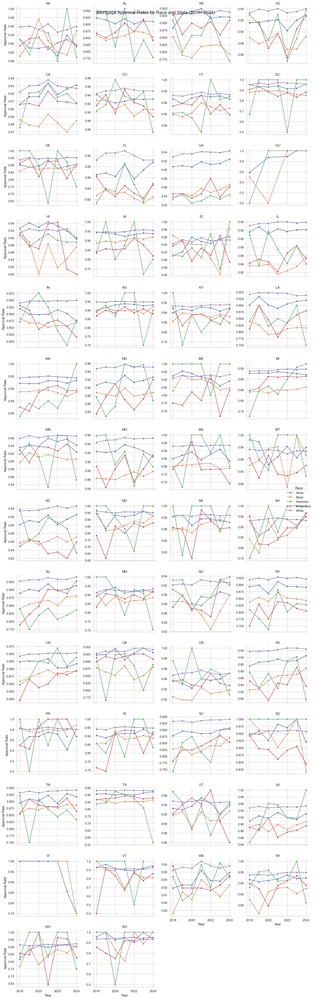

In [165]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# === Load approval rate data ===
df = pd.read_csv("race_approval_rates_by_state_year.csv")

# === Check for long vs wide format ===
if "race_label" not in df.columns:
    # Assuming data is in wide format, melt it
    race_columns = [
        "white_approval",
        "black_approval",
        "asian_approval",
        "indigenous_approval",
        "hawaiian_approval"
    ]
    # Only keep columns that exist in the dataset
    race_columns = [col for col in race_columns if col in df.columns]

    df = pd.melt(
        df,
        id_vars=["state_code", "year"],
        value_vars=race_columns,
        var_name="race_label",
        value_name="approval_rate"
    )
    df["race_label"] = df["race_label"].str.replace("_approval", "").str.title()

# === Rename columns if needed ===
if "state_code" in df.columns:
    df = df.rename(columns={"state_code": "state"})

# === Ensure correct data types ===
df["year"] = pd.to_numeric(df["year"], errors="coerce", downcast="integer")
df["approval_rate"] = pd.to_numeric(df["approval_rate"], errors="coerce")

# === Check available races ===
print("Available races:", df["race_label"].unique())

# === Plot style ===
sns.set(style="whitegrid")

# === Create FacetGrid for states ===
g = sns.FacetGrid(
    df,
    col="state",
    col_wrap=4,
    height=3.5,
    sharey=False
)
g.map_dataframe(
    sns.lineplot,
    x="year",
    y="approval_rate",
    hue="race_label",
    marker="o"
)

# === Improve plot aesthetics ===
g.add_legend(title="Race")
g.set_titles(col_template="{col_name}")
g.set_axis_labels("Year", "Approval Rate")
g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Mortgage Approval Rates by Race and State (2018–2024)", fontsize=16)

# === Save as SVG ===
g.savefig("approval_rates_by_state_race_all.svg", format="svg", bbox_inches="tight")

plt.tight_layout()
plt.show()


In [166]:
#Check why VI is missing soem races 
df_vi = df[df['state'] == 'VI']
df_vi

,year,state,race_label,total,approved,approval_rate
238,2018,VI,White,1,1,1.000
760,2020,VI,White,1,1,1.000
1020,2021,VI,White,3,3,1.000
1285,2022,VI,Black,1,1,1.000
1286,2022,VI,White,3,3,1.000
1549,2023,VI,Black,2,2,1.000
1550,2023,VI,White,7,6,0.857
1812,2024,VI,Black,4,3,0.750
1813,2024,VI,White,8,6,0.750


In [167]:
dropped = pd.read_csv("filtered_data_strict/2024_dropped_log.csv")
dropped['state_code'] = dropped['state_code'].astype(str).str.zfill(2)
print(dropped[dropped['state_code'] == '78']['applicant_race_1'].value_counts())

/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_92020/4052204835.py:1: DtypeWarning:

Columns (11,40,41,42,43,46,55,56,57,58,59,60,61,62,63,64,65,70,74) have mixed types. Specify dtype option on import or set low_memory=False.



Series([], Name: count, dtype: int64)


In [168]:
import pandas as pd
import glob

race_presence_files = glob.glob("*_race_presence_by_state.csv")
combined_rows = []

for file in race_presence_files:
    year = file[:4]
    print(f"📂 Processing {file}")
    
    df = pd.read_csv(file)
    print("🔍 Columns:", df.columns.tolist())

    # Fix common column name issues
    df.columns = [col.strip().lower().replace(' ', '_') for col in df.columns]
    
    # Try matching possible column names
    race_col = None
    state_col = None

    for col in df.columns:
        if 'race' in col and 'code' not in col:
            race_col = col
        if 'state' in col:
            state_col = col
    
    if not race_col or not state_col:
        print(f"⚠️ Skipping {file} (missing race or state column)")
        continue

    df = df[[state_col, race_col]].copy()
    df.columns = ['state_code', 'race']
    df['year'] = int(year)
    combined_rows.append(df)

# Combine all years
if not combined_rows:
    raise ValueError("❌ No valid files processed. Check column names.")
    
all_years_df = pd.concat(combined_rows, ignore_index=True)

# Map race codes
race_map = {2.0: 'Asian', 3.0: 'Black', 5.0: 'White'}
all_years_df['race_label'] = all_years_df['race'].map(race_map)

# Count states per race per year
race_state_counts = (
    all_years_df
    .groupby(['year', 'race_label'])['state_code']
    .nunique()
    .reset_index(name='num_states')
)
# Use 2024_race_presence_by_state.csv instead of missing debug file
df_2024 = pd.read_csv("2024_race_presence_by_state.csv")
df_2024 = df_2024[['state_code', 'Asian', 'Black', 'White']]
df_2024 = df_2024.melt(id_vars='state_code', var_name='race_label', value_name='count')
df_2024 = df_2024[df_2024['count'] > 0]
df_2024['year'] = 2024

race_2024_counts = (
    df_2024.groupby('race_label')['state_code']
    .nunique()
    .reset_index(name='num_states')
)
race_2024_counts['year'] = 2024

# Combine and export
final_counts = pd.concat([race_state_counts, race_2024_counts], ignore_index=True)
final_pivot = final_counts.pivot(index='year', columns='race_label', values='num_states').reset_index()

final_pivot.to_csv("combined_race_state_counts_by_year.csv", index=False)
print("✅ Saved as 'combined_race_state_counts_by_year.csv'")
print(final_pivot)


📂 Processing 2024_race_presence_by_state.csv
🔍 Columns: ['state_code', 'Asian', 'Black', 'White', 'missing_races']
✅ Saved as 'combined_race_state_counts_by_year.csv'
race_label  year  Asian  Black  White
0           2024     53     53     53


In [169]:
import pandas as pd
import os

# === Load all filtered files ===
filtered_folder = "filtered_data_strict"
years = list(range(2018, 2025))
dfs = []

for year in years:
    path = os.path.join(filtered_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(path):
        print(f"❌ Skipping missing file for {year}")
        continue

    df = pd.read_csv(path, low_memory=False)
    race_col = 'applicant_race_1' if 'applicant_race_1' in df.columns else 'applicant_race-1'
    
    df['race'] = df[race_col]
    df['year'] = year
    dfs.append(df[['year', 'lei', 'state_code', 'race', 'action_taken']])

# === Combine all years ===
df_all = pd.concat(dfs, ignore_index=True)

# === Define approval flag ===
df_all['approved'] = df_all['action_taken'] == 1

# === Group by year, lei, state, race ===
agg = df_all.groupby(['year', 'lei', 'state_code', 'race']).agg(
    total_applications=('action_taken', 'count'),
    approved_applications=('approved', 'sum')
).reset_index()

# === Save to CSV ===
agg.to_csv("aggregated_lei_race_state.csv", index=False)
print("✅ Saved: aggregated_lei_race_state.csv")


✅ Saved: aggregated_lei_race_state.csv


In [170]:
import pandas as pd

# Load the aggregated file
df = pd.read_csv("aggregated_lei_race_state.csv")

# Map numeric race codes to readable labels
race_map = {
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian',
    25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}
df['race_label'] = df['race'].map(race_map)

# Compute approval rate
df['approval_rate'] = df['approved_applications'] / df['total_applications']

# Quick checks
print("Columns:", df.columns.tolist())
print("Shape:", df.shape)
print("Missing values per column:\n", df.isnull().sum())

print("\nUnique states:", sorted(df['state_code'].dropna().unique()))
print("\nUnique race labels:", df['race_label'].unique())
print("\nApproval rate min/max:", df['approval_rate'].min(), df['approval_rate'].max())

# Filter invalid approval rates
df = df[df['approval_rate'].between(0, 1)]


Columns: ['year', 'lei', 'state_code', 'race', 'total_applications', 'approved_applications', 'race_label', 'approval_rate']
Shape: (299785, 8)
Missing values per column:
 year                         0
lei                          0
state_code                   0
race                         0
total_applications           0
approved_applications        0
race_label               34085
approval_rate                0
dtype: int64

Unique states: ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VI', 'VT', 'WA', 'WI', 'WV', 'WY']

Unique race labels: [nan 'Asian' 'Black' 'White']

Approval rate min/max: 0.0 1.0


In [171]:
df = df.rename(columns={'year': 'activity_year'})


✅ Races found in data: ['White', 'Black', 'Asian', 'Indigenous', 'Hawaiian']


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/1299442233.py:39: FutureWarning:



The `ci` 

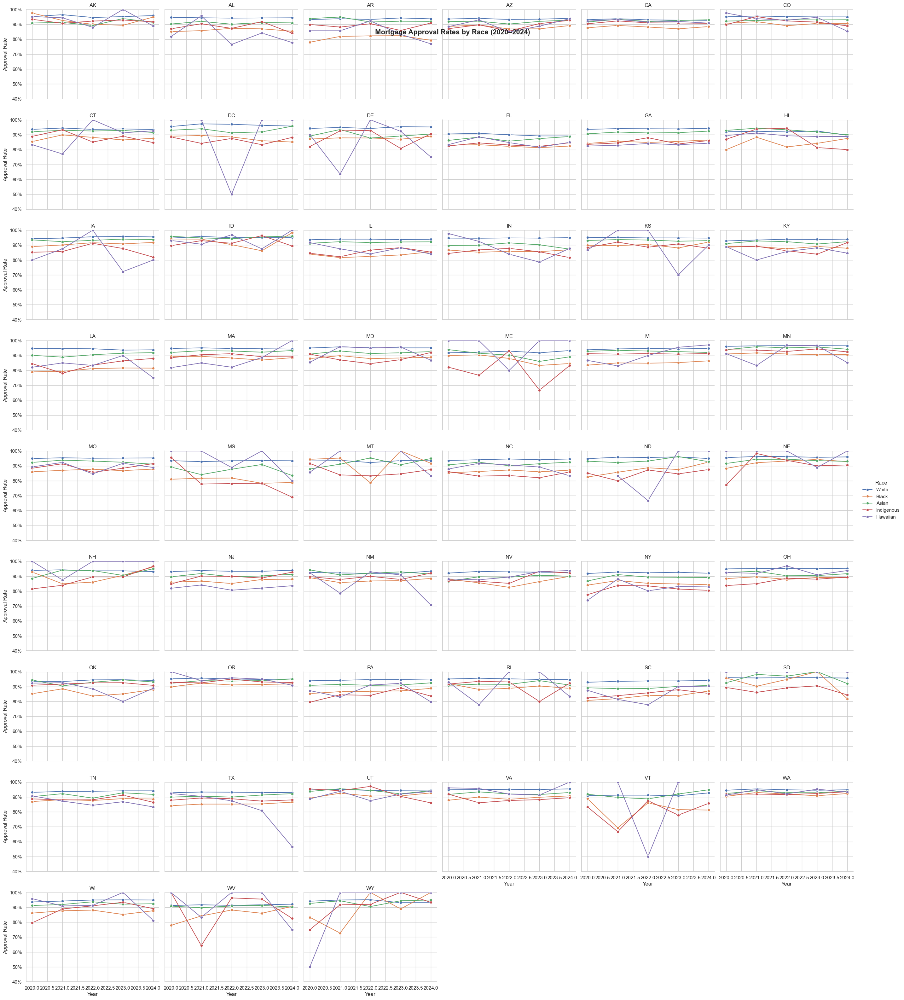

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import pandas as pd

# Load your data
df = pd.read_csv("race_approval_rates_by_state_year.csv")

# Filter out non-mainland states/territories
excluded_states = ['PR', 'VI', 'GU', 'MP', 'AS', 'UM']
df = df[~df['state_code'].isin(excluded_states)]

# Clean race labels just in case
df['race_label'] = df['race_label'].str.strip().str.title()

# ✅ Filter data for years 2020–2024
df = df[df['year'].between(2020, 2024)]

# Automatically detect available main races
all_main_races = ['White', 'Black', 'Asian', 'Indigenous', 'Hawaiian']
present_races = [r for r in all_main_races if r in df['race_label'].unique()]
print("✅ Races found in data:", present_races)

# Set Seaborn style
sns.set(style="whitegrid")

# Set up FacetGrid
g = sns.FacetGrid(
    df,
    col='state_code',
    col_wrap=6,
    height=3.5,
    aspect=1.3,
    sharey=True
)

# Custom line plot
def custom_lineplot(data, **kwargs):
    sns.lineplot(
        data=data,
        x='year', 
        y='approval_rate',
        hue='race_label',
        hue_order=present_races,
        marker='o',
        ci=None,
        **kwargs
    )

g.map_dataframe(custom_lineplot)

# Axis and title formatting
g.set_axis_labels("Year", "Approval Rate")
g.set_titles("{col_name}")
g.set(ylim=(0.4, 1.0))
g.add_legend(title='Race')

# Format y-axis to percentage
for ax in g.axes.flatten():
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Final layout
plt.subplots_adjust(top=1.0)
g.fig.suptitle(
    "Mortgage Approval Rates by Race (2020–2024)",
    fontsize=16,
    fontweight='bold'
)

# Save output
g.savefig("approval_rates_by_state_all_races_2020_2024.png", format='png')
plt.show()


In [177]:
## Debugging 

In [30]:
import os
import pandas as pd

# === Set up ===
unfiltered_folder = "unfiltered"
years = list(range(2018, 2025))
race_colnames = {2024: "applicant_race_1"}  # Adjust as needed
default_race_col = "applicant_race-1"

# === Define main races and their labels ===
main_races = {
    1.0: "American Indian or Alaska Native",   # Indigenous
    2.0: "Asian",
    3.0: "Black or African American",
    4.0: "Native Hawaiian or Pacific Islander",
    5.0: "White"
}

# === States to check (all states or selected) ===
# If you want to limit to certain states, replace this list
states_to_check = [
    'AK', 'HI', 'ID', 'MT', 'ND', 'NH', 'RI', 'SD', 'VT', 'WV', 'WY'
]

results = []

# === Loop through years and files ===
for year in years:
    file_path = os.path.join(unfiltered_folder, f"{year}_hmda.csv")
    if not os.path.exists(file_path):
        print(f"⚠️ Missing file: {file_path}")
        continue

    print(f"🔍 Checking {year}...")
    df = pd.read_csv(file_path, low_memory=False)

    race_col = race_colnames.get(year, default_race_col)
    if race_col not in df.columns or 'state_code' not in df.columns:
        print(f"❌ Required columns missing in {year}")
        continue

    # Check each state and each race
    for state in states_to_check:
        for race_code, race_label in main_races.items():
            count = df[(df['state_code'] == state) & (df[race_col] == race_code)].shape[0]
            results.append({
                'year': year,
                'state_code': state,
                'race_code': race_code,
                'race_label': race_label,
                'count': count
            })

# === Output as DataFrame ===
df_check = pd.DataFrame(results)
df_check = df_check.sort_values(by=['state_code', 'race_code', 'year'])

# Save and show
df_check.to_csv("checked_main_race_state_counts.csv", index=False)
print("✅ Saved check results to 'checked_main_race_state_counts.csv'")
display(df_check)


🔍 Checking 2018...
🔍 Checking 2019...
🔍 Checking 2020...
🔍 Checking 2021...
🔍 Checking 2022...
🔍 Checking 2023...
🔍 Checking 2024...
✅ Saved check results to 'checked_main_race_state_counts.csv'


,year,state_code,race_code,race_label,count
0,2018,AK,1.0,American Indian or Alaska Native,2205
55,2019,AK,1.0,American Indian or Alaska Native,1976
110,2020,AK,1.0,American Indian or Alaska Native,2971
165,2021,AK,1.0,American Indian or Alaska Native,2917
220,2022,AK,1.0,American Indian or Alaska Native,1747
...,...,...,...,...,...
164,2020,WY,5.0,White,32565
219,2021,WY,5.0,White,32693
274,2022,WY,5.0,White,19672
329,2023,WY,5.0,White,13409


In [179]:
import pandas as pd
import os

# === Set file path and race codes ===
year = 2024
file_path = f'unfiltered/{year}_hmda.csv'
race_col = 'applicant_race_1'  # Correct column name for 2024
target_states = ['HI', 'ID', 'NH', 'AK', 'ND', 'WY', 'MT', 'VT', 'SD', 'RI', 'WV']
target_races = {
    'Black or African American': 3,
    'Asian': 2
}

# === Load file and clean up ===
df = pd.read_csv(file_path, low_memory=False)
required_columns = ['state_code', race_col]
if not all(col in df.columns for col in required_columns):
    print(f"❌ Required columns missing in {year}")
else:
    df = df[df['state_code'].isin(target_states)].copy()
    df = df[[race_col, 'state_code']].dropna()
    df[race_col] = pd.to_numeric(df[race_col], errors='coerce')

    # === Count race appearances ===
    results = []
    for race_label, race_code in target_races.items():
        for state in target_states:
            count = df[
                (df[race_col] == race_code) &
                (df['state_code'] == state)
            ].shape[0]
            results.append({
                'year': year,
                'state_code': state,
                'race_label': race_label,
                'count': count
            })

    # === Save ===
    df_out = pd.DataFrame(results)
    df_out.to_csv('checked_2024_missing_race_state_counts.csv', index=False)
    print("✅ Saved 2024 check to 'checked_2024_missing_race_state_counts.csv'")


✅ Saved 2024 check to 'checked_2024_missing_race_state_counts.csv'


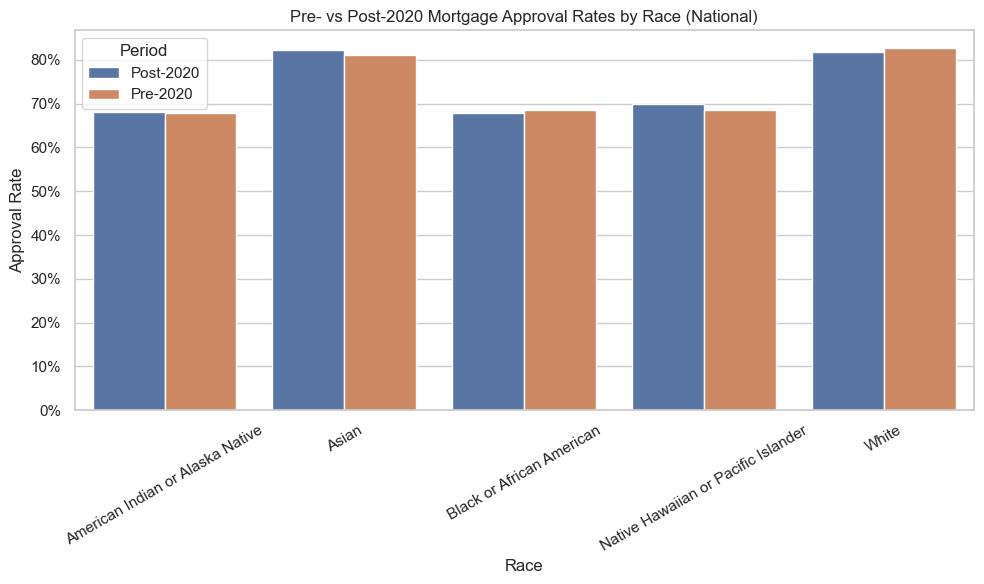

In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# === Load data ===
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# === Summarize approved and denied by year and race ===
grouped = (
    df.groupby(["activity_year", "Race", "Decision"])["count"]
    .sum()
    .unstack(fill_value=0)
    .reset_index()
)

# === Calculate approval rate ===
grouped["total"] = grouped["Approved"] + grouped["Denied"]
grouped["approval_rate"] = grouped["Approved"] / grouped["total"]

# === Filter to main races only ===
main_races = [
    "White",
    "Black or African American",
    "Asian",
    "American Indian or Alaska Native",
    "Native Hawaiian or Pacific Islander"
]
grouped = grouped[grouped["Race"].isin(main_races)]

# === Label pre/post 2020 ===
grouped["Period"] = grouped["activity_year"].apply(lambda x: "Pre-2020" if x <= 2020 else "Post-2020")

# === Aggregate approval rate by period and race ===
period_summary = (
    grouped.groupby(["Race", "Period"])[["Approved", "Denied"]]
    .sum()
    .reset_index()
)
period_summary["total"] = period_summary["Approved"] + period_summary["Denied"]
period_summary["approval_rate"] = period_summary["Approved"] / period_summary["total"]

# === Plot ===
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(
    data=period_summary,
    x="Race",
    y="approval_rate",
    hue="Period"
)
plt.title("Pre- vs Post-2020 Mortgage Approval Rates by Race (National)")
plt.ylabel("Approval Rate")
plt.xlabel("Race")
plt.xticks(rotation=30)
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.tight_layout()
plt.savefig("approval_rates_pre_post_2020_by_race.svg", format="svg", dpi=300)
plt.show()


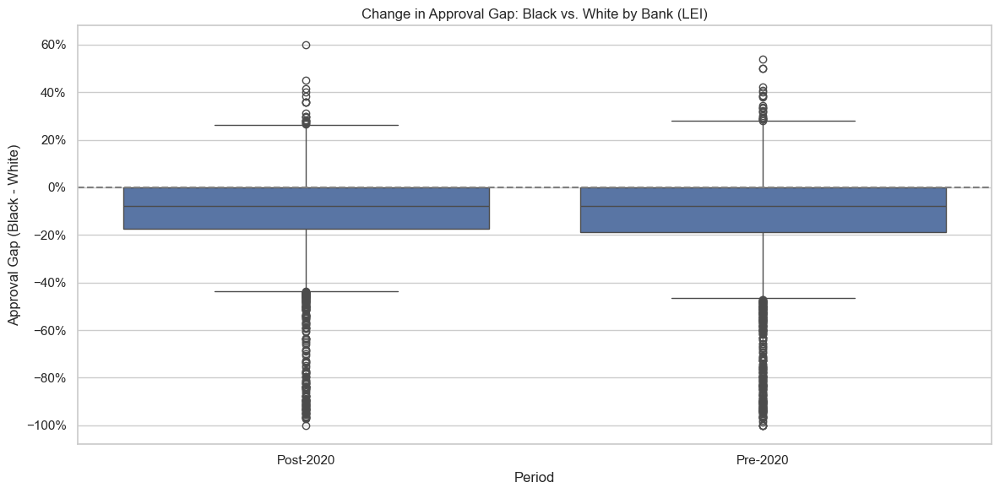

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# === Load the data ===
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# === Filter to core races for equity comparison ===
core_races = ["White", "Black or African American", "Asian", "American Indian or Alaska Native", "Native Hawaiian or Pacific Islander"]
df = df[df["Race"].isin(core_races)]

# === Keep only relevant years and clean ===
df = df[df["activity_year"].between(2018, 2024)]
df["Period"] = df["activity_year"].apply(lambda x: "Pre-2020" if x <= 2020 else "Post-2020")

# === Pivot approvals and denials per LEI/race/period ===
pivot = df.pivot_table(
    index=["lei", "Race", "Period"],
    columns="Decision",
    values="count",
    aggfunc="sum",
    fill_value=0
).reset_index()

pivot["total"] = pivot["Approved"] + pivot["Denied"]
pivot["approval_rate"] = pivot["Approved"] / pivot["total"]

# === Pivot again to compare approval rates across races in each LEI/Period ===
pivot_wide = pivot.pivot_table(
    index=["lei", "Period"],
    columns="Race",
    values="approval_rate"
).reset_index()

# === Compute equity gaps (vs. White) ===
for race in ["Black or African American", "Asian", "American Indian or Alaska Native", "Native Hawaiian or Pacific Islander"]:
    pivot_wide[f"{race}_gap"] = pivot_wide[race] - pivot_wide["White"]

# === Calculate average gap per LEI before and after 2020 ===
gap_cols = [c for c in pivot_wide.columns if "_gap" in c]
summary = pivot_wide.groupby("lei")[gap_cols].mean().reset_index()

# === Optional: visualize approval gap (e.g. Black vs. White) ===
plot_df = pivot_wide.copy()
plot_df = plot_df[["lei", "Period", "Black or African American_gap"]].dropna()

# === Plot ===
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.boxplot(data=plot_df, x="Period", y="Black or African American_gap")
plt.axhline(0, color='gray', linestyle='--')
plt.ylabel("Approval Gap (Black - White)")
plt.title("Change in Approval Gap: Black vs. White by Bank (LEI)")
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.tight_layout()
plt.savefig("black_white_gap_pre_post_2020.svg", format="svg", dpi=300)
plt.show()


In [56]:
import pandas as pd

# === Load data ===
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")
# === Load LEI-to-bank name dictionary ===
lei_dict = pd.read_csv("lei_info/bloomberg_scraped_structured.csv")
lei_dict = lei_dict.rename(columns={
    "lei_number": "lei",
    "Legal Name": "bank_name"
}).drop_duplicates("lei")

# === Filter to Black and White only ===
df = df[df["Race"].isin(["White", "Black or African American"])]
df = df[df["activity_year"].between(2018, 2024)]

# === Tag pre/post 2020 ===
df["Period"] = df["activity_year"].apply(lambda x: "Pre-2020" if x <= 2020 else "Post-2020")
df["is_approved"] = df["Decision"] == "Approved"

# === Aggregate approvals and total apps ===
agg = df.groupby(["lei", "Race", "Period"]).agg(
    approved=("is_approved", "sum"),
    total=("is_approved", "count")
).reset_index()
agg["approval_rate"] = agg["approved"] / agg["total"]

# === Pivot to wide format: one column per race + period ===
wide = agg.pivot(index="lei", columns=["Race", "Period"], values="approval_rate")
wide.columns = [f"{race}_{period}" for race, period in wide.columns]
wide = wide.reset_index()

# === Compute approval rate shifts and gap change ===
wide["white_rate_change"] = wide["White_Post-2020"] - wide["White_Pre-2020"]
wide["black_rate_change"] = wide["Black or African American_Post-2020"] - wide["Black or African American_Pre-2020"]
wide["gap_change"] = (wide["Black or African American_Post-2020"] - wide["White_Post-2020"]) - \
                     (wide["Black or African American_Pre-2020"] - wide["White_Pre-2020"])

# === Merge bank names ===
wide = wide.merge(lei_dict, on="lei", how="left")

# === Sort and save ===
wide_sorted = wide.sort_values(by="gap_change", ascending=False)
wide_sorted.to_csv("ranked_bank_equity_shifts_with_names.csv", index=False)
print("✅ Saved to 'ranked_bank_equity_shifts_with_names.csv'")


✅ Saved to 'ranked_bank_equity_shifts_with_names.csv'


In [57]:
# print(lei_dict.columns.tolist())


In [90]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# === Step 1: Load and Clean Input Files ===
# Load mortgage action data
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# Load LEI dictionary (from Bloomberg)
lei_dict = pd.read_csv("lei_info/bloomberg_scraped_structured.csv")[[
    "lei_number", "Legal Name"
]]
lei_dict.columns = ["lei", "bank_name"]

# Clean LEI values in both files
df["lei"] = df["lei"].astype(str).str.strip()
lei_dict["lei"] = lei_dict["lei"].astype(str).str.strip()

# === Step 2: Filter Data ===
main_races = [
    "White",
    "Black or African American",
    "Asian",
    "Native Hawaiian or Pacific Islander",
    "American Indian or Alaska Native"
]
df = df[df["Race"].isin(main_races)]
df = df[df["Decision"].isin(["Approved", "Denied"])]
df["is_approved"] = df["Decision"] == "Approved"

# === Step 3: Add Pre/Post 2020 Period Tag ===
df["Period"] = df["activity_year"].apply(lambda x: "Pre2020" if x < 2020 else "Post2020")

# === Step 4: Group and Compute Approval Rates ===
grouped = df.groupby(["lei", "Race", "Period"])["is_approved"].agg(
    approvals="sum",
    total="count"
).reset_index()
grouped["approval_rate"] = grouped["approvals"] / grouped["total"]

# === Step 5: Pivot to Wide Format for Clustering ===
wide = grouped.pivot(index="lei", columns=["Race", "Period"], values="approval_rate")
wide.columns = [f"{race}_{period}" for race, period in wide.columns]
wide = wide.reset_index()

# === Step 6: Compute Approval Shifts ===
for race in main_races:
    pre = f"{race}_Pre2020"
    post = f"{race}_Post2020"
    if pre in wide.columns and post in wide.columns:
        wide[f"{race}_shift"] = wide[post] - wide[pre]

# === Step 7: Prepare for Clustering ===
shift_cols = [col for col in wide.columns if "_shift" in col]
X = wide[shift_cols].fillna(0)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# === Step 8: Run KMeans Clustering ===
kmeans = KMeans(n_clusters=4, random_state=42, n_init="auto")
wide["Cluster"] = kmeans.fit_predict(X_scaled)

# === Step 9: Merge Clean LEI Dictionary ===
wide["lei"] = wide["lei"].astype(str).str.strip()
lei_dict["lei"] = lei_dict["lei"].astype(str).str.strip()
wide = wide.merge(lei_dict, on="lei", how="left")

# === Step 10: Save Final Output ===
wide.to_csv("bank_equity_clusters.csv", index=False)
print("✅ Final clusters saved to 'bank_equity_clusters.csv'")

# === Optional Preview ===
print(wide[["lei", "bank_name", "Cluster"] + shift_cols].head())
# Reload if needed
df = pd.read_csv("bank_equity_clusters.csv")

# Optional: manually inspect centroids first
centroids = df.groupby("Cluster")[[col for col in df.columns if "_shift" in col]].mean()
print(centroids)

# Manual labels — you must update these based on inspection
label_map = {
    0: "Improved for Minorities",
    1: "Worsened for Minorities",
    2: "Improved for All",
    3: "No Change or Mixed"
}
df["Cluster_Label"] = df["Cluster"].map(label_map)

# Save labeled output
df.to_csv("bank_equity_clusters_labeled.csv", index=False)


✅ Final clusters saved to 'bank_equity_clusters.csv'
                    lei                                          bank_name  \
0  01ERPZV3DOLNXY2MLB90  Libertyville Bank & Trust Company, National As...   
1  01J4SO3XTWZF4PP38209                            Trustmark National Bank   
2  01KWVG908KE7RKPTNP46                                    HomeStreet Bank   
3  03D0JEWFDFUS0SEEKG89                      TD Bank, National Association   
4  0K2D5AK28E3O5CC06E35                                                NaN   

   Cluster  White_shift  Black or African American_shift  Asian_shift  \
0        3     0.185714                              NaN     0.000000   
1        1    -0.061538                        -0.034091     0.002381   
2        3     0.038390                        -0.010766    -0.057951   
3        3     0.023239                         0.044872     0.019282   
4        3    -0.040955                        -0.111111     0.111413   

   Native Hawaiian or Pacific Islander_

In [70]:
import pandas as pd

# === Load the clustered output ===
df = pd.read_csv("bank_equity_clusters.csv")

# === Identify all race shift columns ===
shift_cols = [col for col in df.columns if col.endswith("_shift")]

# === Define minority race shifts to include ===
minority_prefixes = [
    "Black or African American",
    "Asian",
    "Hispanic or Latino",
    "Native Hawaiian or Pacific Islander",
    "American Indian or Alaska Native"
]

# Filter columns that match those prefixes
minority_cols = [col for col in shift_cols if any(col.startswith(race) for race in minority_prefixes)]

# === Compute average shift per minority group by cluster ===
cluster_means = df.groupby("Cluster")[shift_cols].mean()
cluster_means["minority_avg_shift"] = cluster_means[minority_cols].mean(axis=1)

# === Identify the cluster with the best improvement for minorities ===
best_cluster_id = cluster_means["minority_avg_shift"].idxmax()
print(f"🌟 Best cluster (Improved for Minorities): {best_cluster_id}")

# === Extract banks in this best-performing cluster ===
top_banks = df[df["Cluster"] == best_cluster_id]

# Sort by the largest minority shift (Black preferred if available)
priority_sort = "Black or African American_shift"
sort_col = priority_sort if priority_sort in top_banks.columns else minority_cols[0]
top_banks = top_banks.sort_values(by=sort_col, ascending=False)

# === Select relevant columns to export ===
output_cols = ["lei", "bank_name", "Cluster"] + shift_cols
top_banks = top_banks[output_cols]

# === Save output ===
top_banks.to_csv("top_banks_improved_for_minorities.csv", index=False)
print("✅ Saved: top_banks_improved_for_minorities.csv")

# === Show preview ===
print(top_banks.head(10))


🌟 Best cluster (Improved for Minorities): 2
✅ Saved: top_banks_improved_for_minorities.csv
                       lei                   bank_name  Cluster  White_shift  \
1138  254900TZKHQ9DT85IC97       Schuyler Savings Bank        2     0.000000   
5186  549300TDH15867LXRK58  The Farmers Bank of Milton        2     0.000000   
1628  5493001XZBZCQEIYKY53                         NaN        2     0.084651   
5242  549300TOUQ38J2723B48                         NaN        2    -0.050000   
6034  549300ZFJ1696ECS0S38          Platte Valley Bank        2     0.158333   
3247  549300EMC7T53UNNNA58       The Bank of Princeton        2     0.000000   
5628  549300WIWUF4JZ6O0629                         NaN        2     0.194444   
2802  549300BN61BPY0L0H441          Athol Savings Bank        2     0.000000   
3678  549300I25WBRMJIIED23                         NaN        2     0.066667   
1362  38PG5GG0OEQK4QMSKE59          Texas Capital Bank        2    -0.050000   

      Black or African Ameri

In [85]:
import pandas as pd

# === Load clustered output ===
df_clusters = pd.read_csv("bank_equity_clusters.csv")

# === Load counts of Black applicants ===
df_counts = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# Filter only Black applicants
black = df_counts[df_counts["Race"] == "Black or African American"].copy()
black["Period"] = black["activity_year"].apply(lambda x: "Pre2020" if x < 2020 else "Post2020")

# Group: total Black applicants per LEI per period
volumes = (
    black.groupby(["lei", "Period"])
    .size()
    .unstack(fill_value=0)
    .rename(columns={"Pre2020": "black_pre", "Post2020": "black_post"})
)

# Optional: Define minimum threshold
MIN_APPS = 15

# Keep only banks with enough Black applicants in both periods
valid_leis = volumes[(volumes["black_pre"] >= MIN_APPS) & (volumes["black_post"] >= MIN_APPS)].index

# === Filter clusters to only valid banks ===
filtered = df_clusters[df_clusters["lei"].isin(valid_leis)]

# === Continue as before ===
shift_cols = [col for col in filtered.columns if col.endswith("_shift")]
minority_cols = [c for c in shift_cols if not c.startswith("White")]

cluster_means = filtered.groupby("Cluster")[shift_cols].mean()
cluster_means["minority_avg_shift"] = cluster_means[minority_cols].mean(axis=1)

best_cluster_id = cluster_means["minority_avg_shift"].idxmax()
print(f"🌟 Best cluster (Improved for Minorities): {best_cluster_id}")

top_banks = filtered[filtered["Cluster"] == best_cluster_id]
sort_col = "Black or African American_shift" if "Black or African American_shift" in top_banks.columns else minority_cols[0]
top_banks = top_banks.sort_values(by=sort_col, ascending=False)

output_cols = ["lei", "bank_name", "Cluster"] + shift_cols
top_banks = top_banks[output_cols]

# Save output
top_banks.head(10).to_csv("top_banks_improved_for_minorities_filtered.csv", index=False)
print("✅ Saved: top_banks_improved_for_minorities_filtered.csv")
print(top_banks.head(10))


🌟 Best cluster (Improved for Minorities): 2
✅ Saved: top_banks_improved_for_minorities_filtered.csv
                       lei                          bank_name  Cluster  \
3854  549300JHSXRPXKX47M78                                NaN        2   
8     1TMVIO1SD0RLIPEIW803                Great Southern Bank        2   
1896  5493003X6Y6JGJKHPA25  INTERSTATE HOME LOAN CENTER, INC.        2   
4826  549300QV3GEYMP1WSO93                       SIWELL, INC.        2   
5963  549300YW2UBCMDRMBT48        RELIANCE FIRST CAPITAL, LLC        2   
2980  549300CUUEEQ66ZVK149             ENDEAVOR CAPITAL, LLC.        2   
2676  549300AN5V81GRYDJ823     FedChoice Federal Credit Union        2   
364   25490092DWDTDJ002J62                                NaN        2   
1588  5493001PN8XJZD64S690                                NaN        2   
5853  549300Y7G2MW6V1OR474             VICTORIAN FINANCE, LLC        2   

      White_shift  Black or African American_shift  Asian_shift  \
3854     0.258107 

In [80]:
print(f"Number of valid LEIs: {len(valid_leis)}")
print(f"Number of banks in top cluster: {top_banks.shape[0]}")


Number of valid LEIs: 448
Number of banks in top cluster: 5


In [86]:
import pandas as pd

# === Load clustered output ===
df_clusters = pd.read_csv("bank_equity_clusters.csv")

# === Load loan volume data ===
df_counts = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# Filter only Black applicants
black = df_counts[df_counts["Race"] == "Black or African American"].copy()
black["Period"] = black["activity_year"].apply(lambda x: "Pre2020" if x < 2020 else "Post2020")

# Group: total Black applicants per LEI per period
volumes = (
    black.groupby(["lei", "Period"])
    .size()
    .unstack(fill_value=0)
    .rename(columns={"Pre2020": "black_pre", "Post2020": "black_post"})
)

# Set minimum volume threshold
MIN_APPS = 15

# Keep only banks with sufficient Black applicants in both periods
valid_leis = volumes[(volumes["black_pre"] <= MIN_APPS) & (volumes["black_post"] <= MIN_APPS)].index

# Filter clustered banks
filtered = df_clusters[df_clusters["lei"].isin(valid_leis)]

# === Calculate worst cluster ===
shift_cols = [col for col in filtered.columns if col.endswith("_shift")]
minority_cols = [c for c in shift_cols if not c.startswith("White")]

cluster_means = filtered.groupby("Cluster")[shift_cols].mean()
cluster_means["minority_avg_shift"] = cluster_means[minority_cols].mean(axis=1)

# Find cluster with lowest average minority shift
worst_cluster_id = cluster_means["minority_avg_shift"].idxmin()
print(f"⚠️ Worst cluster (Worsened for Minorities): {worst_cluster_id}")

# Extract and sort
worst_banks = filtered[filtered["Cluster"] == worst_cluster_id]
sort_col = "Black or African American_shift" if "Black or African American_shift" in worst_banks.columns else minority_cols[0]
worst_banks = worst_banks.sort_values(by=sort_col, ascending=True)

output_cols = ["lei", "bank_name", "Cluster"] + shift_cols
worst_banks = worst_banks[output_cols]

# Save to CSV
worst_banks.head(10).to_csv("worst_banks_for_minorities_filtered.csv", index=False)
print("✅ Saved: worst_banks_for_minorities_filtered.csv")

# Show preview
print(worst_banks.head(10))


⚠️ Worst cluster (Worsened for Minorities): 0
✅ Saved: worst_banks_for_minorities_filtered.csv
                       lei                          bank_name  Cluster  \
5875  549300YD9NNO7W7TSI64                                NaN        0   
1379  54930002M4XN64FM7Z89        The Torrington Savings Bank        0   
691   254900IHSG9OOX0DZH92        NorthWest Plus Credit Union        0   
1290  254900YB9XQDO5W4KU33               Radiant Credit Union        0   
2820  549300BQPSF250Q8KQ79                ON TAP CREDIT UNION        0   
322   25490080ZZ98MNHU5R63              Champion Credit Union        0   
4223  549300M2W1M6WRAK9S59  StonehamBank, A Co-operative Bank        0   
5812  549300XYJEJCSZHWWM52                 ALIGN CREDIT UNION        0   
5183  549300TDBTRK89DZRC13         Fibre Federal Credit Union        0   
2394  5493007VDE1SMI6Z0Q04          VISION ONE MORTGAGE, INC.        0   

      White_shift  Black or African American_shift  Asian_shift  \
5875     0.106061      

In [72]:
## unmatched 

In [73]:
# Load both
clusters = pd.read_csv("bank_equity_clusters.csv")
lei_dict = pd.read_csv("lei_info/bloomberg_scraped_structured.csv")
lei_dict.columns = lei_dict.columns.str.lower()
lei_dict["lei_number"] = lei_dict["lei_number"].astype(str).str.strip()

# Find missing bank names
merged = clusters.merge(lei_dict[["lei_number", "legal name"]], left_on="lei", right_on="lei_number", how="left")
missing = merged[merged["legal name"].isna()]
print(f"❗️Missing bank names for {len(missing)} out of {len(clusters)} LEIs")
print(missing["lei"].value_counts().head(10))


❗️Missing bank names for 1524 out of 6363 LEIs
lei
0K2D5AK28E3O5CC06E35    1
549300MXJA09WZJ0DV55    1
549300NA0J3W01WT5113    1
549300N7MKAZNGCKT625    1
549300N72GSXSO3Y6B93    1
549300N6Z26TGI202D22    1
549300N4Y8SZTX37AW62    1
549300N3HTAM5X2VWB62    1
549300N2WLRT93GILZ87    1
549300MZCM3IR0ZWDI94    1
Name: count, dtype: int64


In [61]:
## Merck employee

In [62]:
import pandas as pd

# === Load the full dataset ===
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# === Filter for the LEI of interest ===
target_lei = "549300RKVDUINI2A8Y77"
df_lei = df[df["lei"] == target_lei]

# === Keep only decisions with race and year info ===
df_lei = df_lei[df_lei["Decision"].isin(["Approved", "Denied"])]

# === Add a column for approval ===
df_lei["is_approved"] = df_lei["Decision"] == "Approved"

# === Group by Year and Race ===
summary = df_lei.groupby(["activity_year", "Race"]).agg(
    total_applications=("is_approved", "count"),
    approvals=("is_approved", "sum")
).reset_index()

# === Compute approval rate ===
summary["approval_rate"] = summary["approvals"] / summary["total_applications"]

# === Save and display ===
summary.to_csv("lei_race_year_summary_549300RKVDUINI2A8Y77.csv", index=False)
print("✅ Summary saved to 'lei_race_year_summary_549300RKVDUINI2A8Y77.csv'")
print(summary)


✅ Summary saved to 'lei_race_year_summary_549300RKVDUINI2A8Y77.csv'
    activity_year                                 Race  total_applications  \
0            2018                                Asian                   1   
1            2018            Black or African American                   1   
2            2018                    Info Not Provided                   4   
3            2018                                White                   5   
4            2019     American Indian or Alaska Native                   1   
5            2019                                Asian                   3   
6            2019            Black or African American                   3   
7            2019                    Info Not Provided                   5   
8            2019                                White                   9   
9            2020     American Indian or Alaska Native                   1   
10           2020                                Asian                   2

In [66]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from us import states

# === Load cluster results ===
clusters = pd.read_csv("bank_equity_clusters.csv")

# === Load HQ address info ===
lei_info = pd.read_csv("lei_info/bloomberg_scraped_structured.csv")[[
    "lei_number", "Legal Name", "Headquarters Address (English)"
]].drop_duplicates()
lei_info.columns = ["lei", "bank_name", "address"]

# === Extract state code from address ===
def extract_state(address):
    for s in states.STATES:
        if s.abbr in str(address):
            return s.abbr
    return None

lei_info["state_code"] = lei_info["address"].apply(extract_state)
lei_info = lei_info.dropna(subset=["state_code"])

# === Merge into cluster data ===
merged = clusters.merge(lei_info, on="lei", how="left")
merged = merged.dropna(subset=["state_code"])

# === Download US states shapefile from Natural Earth manually ===
# You only need to download once and keep locally
# Link: https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/50m/cultural/ne_50m_admin_1_states_provinces.zip

# After extracting, point to the `.shp` file path (update if your path differs)
shapefile_path = "shapes/ne_50m_admin_1_states_provinces.shp"
us_states = gpd.read_file(shapefile_path)

# === Filter for USA only ===
us_states = us_states[us_states["admin"] == "United States of America"]
us_states["state_code"] = us_states["postal"]
us_states = us_states[["state_code", "geometry"]]

# === Get centroids for state representation ===
us_states["geometry"] = us_states["geometry"].centroid

# === Merge geometry into banks ===
merged = merged.merge(us_states, on="state_code", how="left")
gdf = gpd.GeoDataFrame(merged, geometry="geometry", crs="EPSG:4326").to_crs(epsg=3857)

# === Plot ===
fig, ax = plt.subplots(figsize=(12, 9))
gdf.plot(column="Cluster", cmap="tab10", legend=True, markersize=60, edgecolor="black", alpha=0.85, ax=ax)

ax.set_title("U.S. Banks by Equity Shift Cluster (State HQ Approximation)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.savefig("bank_clusters_by_state_map.png", dpi=300)
plt.show()


DataSourceError: shapes/ne_50m_admin_1_states_provinces.shp: No such file or directory

In [68]:
import pandas as pd

# === Load the clustered output ===
df = pd.read_csv("bank_equity_clusters.csv")

# === Identify all race shift columns ===
shift_cols = [col for col in df.columns if col.endswith("_shift")]

# === Define minority race shifts to include ===
minority_prefixes = [
    "Black or African American",
    "Asian",
    "Hispanic or Latino",
    "Native Hawaiian or Pacific Islander",
    "American Indian or Alaska Native"
]

# Filter columns that match those prefixes
minority_cols = [col for col in shift_cols if any(col.startswith(race) for race in minority_prefixes)]

# === Compute average shift per minority group by cluster ===
cluster_means = df.groupby("Cluster")[shift_cols].mean()
cluster_means["minority_avg_shift"] = cluster_means[minority_cols].mean(axis=1)

# === Identify best and worst clusters ===
best_cluster_id = cluster_means["minority_avg_shift"].idxmax()
worst_cluster_id = cluster_means["minority_avg_shift"].idxmin()

print(f"🌟 Best cluster (Improved for Minorities): {best_cluster_id}")
print(f"⚠️ Worst cluster (Worsened or Least Improved for Minorities): {worst_cluster_id}")

# === Extract top banks in best cluster ===
top_banks = df[df["Cluster"] == best_cluster_id].copy()
sort_col = "Black or African American_shift" if "Black or African American_shift" in top_banks.columns else minority_cols[0]
top_banks = top_banks.sort_values(by=sort_col, ascending=False)
top_banks = top_banks[["lei", "bank_name", "Cluster"] + shift_cols]
top_banks.to_csv("top_banks_improved_for_minorities.csv", index=False)
print("✅ Saved: top_banks_improved_for_minorities.csv")

# === Extract bottom banks in worst cluster ===
worst_banks = df[df["Cluster"] == worst_cluster_id].copy()
worst_banks = worst_banks.sort_values(by=sort_col, ascending=True)
worst_banks = worst_banks[["lei", "bank_name", "Cluster"] + shift_cols]
worst_banks.to_csv("worst_banks_for_minorities.csv", index=False)
print("📉 Saved: worst_banks_for_minorities.csv")

# === Preview both ===
print("\n🔝 Top 5 Best Banks:")
print(top_banks.head())

print("\n🔻 Top 5 Worst Banks:")
print(worst_banks.head())


🌟 Best cluster (Improved for Minorities): 2
⚠️ Worst cluster (Worsened or Least Improved for Minorities): 0
✅ Saved: top_banks_improved_for_minorities.csv
📉 Saved: worst_banks_for_minorities.csv

🔝 Top 5 Best Banks:
                       lei                   bank_name  Cluster  White_shift  \
1138  254900TZKHQ9DT85IC97       Schuyler Savings Bank        2     0.000000   
5186  549300TDH15867LXRK58  The Farmers Bank of Milton        2     0.000000   
1628  5493001XZBZCQEIYKY53                         NaN        2     0.084651   
5242  549300TOUQ38J2723B48                         NaN        2    -0.050000   
6034  549300ZFJ1696ECS0S38          Platte Valley Bank        2     0.158333   

      Black or African American_shift  Asian_shift  \
1138                         1.000000     0.600000   
5186                         1.000000     0.666667   
1628                         0.875000     0.282828   
5242                         0.666667     0.250000   
6034                         0.66

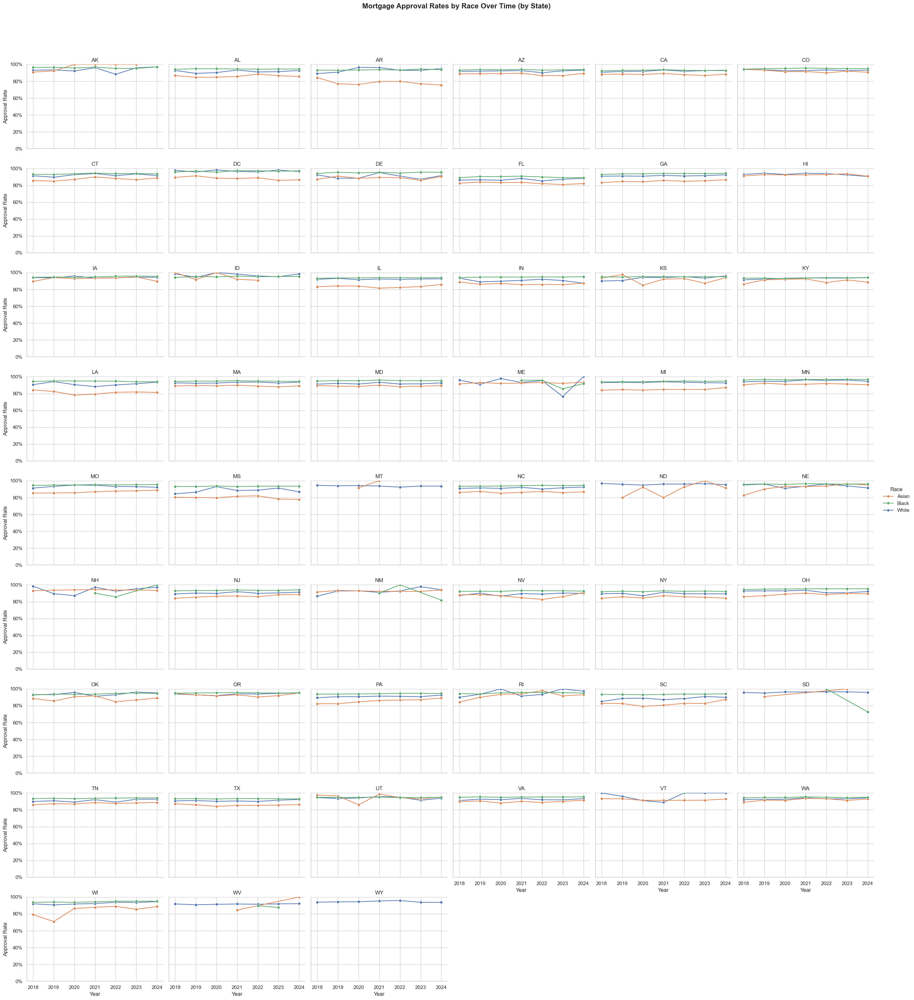

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# === Load approval data ===
df = pd.read_csv("approval_rates_by_lei_race_year_state.csv")

# Filter to main race groups
main_races = [
    "Asian",
    "Black",
    "White",
    "Indigenous",  # usually short for "American Indian or Alaska Native"
    "Hawaiian/Pacific Islander"
]
df = df[df['race_label'].isin(main_races)]

# Filter out island/territory states
island_codes = ['PR', 'GU', 'VI', 'AS', 'MP']
df = df[~df['state_code'].isin(island_codes)]

# Filter out rows with too few applications
df = df[df['total_applications'] >= 10]

# === Aggregate across LEIs per state/year/race ===
agg = df.groupby(['state_code', 'year', 'race_label']).agg(
    total_apps=('total_applications', 'sum'),
    approved_apps=('approved_count', 'sum')
).reset_index()
agg['approval_rate'] = agg['approved_apps'] / agg['total_apps']

# === Plot ===
sns.set(style="whitegrid")
g = sns.FacetGrid(
    agg,
    col='state_code',
    col_wrap=6,
    height=3.5,
    aspect=1.3,
    sharey=True
)
g.map_dataframe(
    sns.lineplot,
    x='year',
    y='approval_rate',
    hue='race_label',
    marker='o'
)
g.set_axis_labels("Year", "Approval Rate")
g.set_titles("{col_name}")
g.add_legend(title='Race')
g.set(ylim=(0.0, 1.0))

# Format y-axis as percent
for ax in g.axes.flatten():
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

plt.subplots_adjust(top=0.92)
g.fig.suptitle("Mortgage Approval Rates by Race Over Time (by State)", fontsize=16, fontweight='bold')

# Save as SVG
g.savefig("approval_rates_by_state.svg", format='svg')
plt.show()


In [181]:
import os
print([f for f in os.listdir() if f.endswith('.csv')])


['race_approval_rates_by_state_year.csv', 'debug_breakdown_step_08_after_construction_method.csv', 'debug_breakdown_step_04_after_loan_type.csv', 'debug_breakdown_step_02_after_race_filter.csv', 'combined_race_state_counts_by_year.csv', 'debug_breakdown_step_07_after_occupancy_type.csv', 'approval_rates_by_lei_race_year_state.csv', 'debug_breakdown_step_05_after_lien_status.csv', 'denial_rates_by_lei_race_year_state.csv', 'checked_missing_race_state_counts.csv', 'state_year_mortgage_summary.csv', 'debug_breakdown_step_06_after_loan_purpose.csv', 'top5_approved_LEIs_by_race_year.csv', 'tract_approval_rates_all_races.csv', 'race_presence_matrix_by_step.csv', 'tract_level_approval_rates.csv', 'debug_breakdown_step_09_after_total_units.csv', 'tract_approval_rates_by_race.csv', 'aggregated_lei_race_state.csv', 'debug_breakdown_step_11_after_dti_filter.csv', 'detected_race_drops_by_state_and_year.csv', 'missing_Asian_2024.csv', 'debug_breakdown_step_01_original.csv', '2024_race_presence_by_s

In [182]:
print(df.columns.tolist())

['lei', 'state_code', 'year', 'race_label', 'approved_count', 'total_applications', 'approval_rate']


In [183]:
import pandas as pd

df = pd.read_csv("approval_rates_by_lei_race_year_state.csv")

# Count the number of rows per state/year/race combo
counts = df.groupby(['state_code', 'year', 'race_label']).size().reset_index(name='count')
print(counts.sort_values(by='count').head(20))
## weird plots are caused by extremely small sample sizes (like 1 loan application per year per race group), especially in small states like MT, ND, SD, VT, and VI.

     state_code  year race_label  count
1051         WY  2018      Black      4
1069         WY  2024      Black      6
1057         WY  2020      Black      7
1054         WY  2019      Black      7
1060         WY  2021      Black      8
1066         WY  2023      Black      8
565          MT  2024      Black      8
1063         WY  2022      Black      9
562          MT  2023      Black     11
967          VT  2018      Black     11
985          VT  2024      Black     11
550          MT  2019      Black     11
559          MT  2022      Black     11
1053         WY  2019      Asian     12
553          MT  2020      Black     12
973          VT  2020      Black     12
547          MT  2018      Black     13
970          VT  2019      Black     13
982          VT  2023      Black     13
1050         WY  2018      Asian     14


In [184]:
import pandas as pd

# Load the 2024 filtered data (change year as needed)
df_2024 = pd.read_csv("filtered_data_strict/2024_filtered_hmda.csv", low_memory=False)

# Use the correct race column
race_col = 'applicant_race_1' if 'applicant_race_1' in df_2024.columns else 'applicant_race-1'

# Subset to loans from Vermont and Asian codes
asian_race_codes = [2.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0]
df_vermont_asian = df_2024[
    (df_2024['state_code'] == 'VT') &
    (df_2024[race_col].isin(asian_race_codes))
]

# Preview the result
print(f"Found {len(df_vermont_asian)} Asian loans in Vermont (2024):")
df_vermont_asian.head()


Found 77 Asian loans in Vermont (2024):


,activity_year,lei,loan_type,loan_purpose,preapproval,construction_method,occupancy_type,loan_amount,action_taken,state_code,...,aus_2,aus_3,aus_4,aus_5,reverse_mortgage,open_end_line_of_credit,business_or_commercial_purpose,row_id,debt_to_income_ratio_clean,year
52530,2024,549300T2FOBK6WY4B349,1,1,2,1,1,305000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,549300T2FOBK6WY4B349_698475,39.0,2024
59828,2024,254900AX2RRO2WMRP742,1,1,2,1,1,275000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777190,49.0,2024
59840,2024,254900AX2RRO2WMRP742,1,1,2,1,1,325000,2,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777301,46.0,2024
59859,2024,254900AX2RRO2WMRP742,1,1,2,1,1,325000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777546,20.0,2024
59880,2024,254900AX2RRO2WMRP742,1,1,2,1,1,345000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777733,20.0,2024


In [185]:
print(df_2024.columns.tolist())


['activity_year', 'lei', 'loan_type', 'loan_purpose', 'preapproval', 'construction_method', 'occupancy_type', 'loan_amount', 'action_taken', 'state_code', 'county_code', 'census_tract', 'applicant_ethnicity_1', 'applicant_ethnicity_2', 'applicant_ethnicity_3', 'applicant_ethnicity_4', 'applicant_ethnicity_5', 'co_applicant_ethnicity_1', 'co_applicant_ethnicity_2', 'co_applicant_ethnicity_3', 'co_applicant_ethnicity_4', 'co_applicant_ethnicity_5', 'applicant_ethnicity_observed', 'co_applicant_ethnicity_observed', 'applicant_race_1', 'applicant_race_2', 'applicant_race_3', 'applicant_race_4', 'applicant_race_5', 'co_applicant_race_1', 'co_applicant_race_2', 'co_applicant_race_3', 'co_applicant_race_4', 'co_applicant_race_5', 'applicant_race_observed', 'co_applicant_race_observed', 'applicant_sex', 'co_applicant_sex', 'applicant_sex_observed', 'co_applicant_sex_observed', 'applicant_age', 'applicant_age_above_62', 'co_applicant_age', 'co_applicant_age_above_62', 'income', 'purchaser_type'

In [186]:
import pandas as pd

# Load the 2024 filtered data
df_2024 = pd.read_csv("filtered_data_strict/2024_filtered_hmda.csv", low_memory=False)

# Use the correct race column name
race_col = 'applicant_race_1'

# Asian race codes (as defined by HMDA)
asian_race_codes = [2.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0]

# Filter for Vermont and Asian race codes
df_vermont_asian = df_2024[
    (df_2024['state_code'] == 'VT') &
    (df_2024[race_col].astype(float).isin(asian_race_codes))
]

# Preview the result
print(f"✅ Found {len(df_vermont_asian)} Asian loans in Vermont (2024):")
df_vermont_asian.head()


✅ Found 77 Asian loans in Vermont (2024):


,activity_year,lei,loan_type,loan_purpose,preapproval,construction_method,occupancy_type,loan_amount,action_taken,state_code,...,aus_2,aus_3,aus_4,aus_5,reverse_mortgage,open_end_line_of_credit,business_or_commercial_purpose,row_id,debt_to_income_ratio_clean,year
52530,2024,549300T2FOBK6WY4B349,1,1,2,1,1,305000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,549300T2FOBK6WY4B349_698475,39.0,2024
59828,2024,254900AX2RRO2WMRP742,1,1,2,1,1,275000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777190,49.0,2024
59840,2024,254900AX2RRO2WMRP742,1,1,2,1,1,325000,2,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777301,46.0,2024
59859,2024,254900AX2RRO2WMRP742,1,1,2,1,1,325000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777546,20.0,2024
59880,2024,254900AX2RRO2WMRP742,1,1,2,1,1,345000,1,VT,...,NaN,NaN,NaN,NaN,2,2,2,254900AX2RRO2WMRP742_777733,20.0,2024


In [187]:
print(df.columns.tolist())


['lei', 'state_code', 'year', 'race_label', 'approved_count', 'total_applications', 'approval_rate']


In [188]:
df = df[df['race_label'].notna()]


In [189]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import matplotlib.ticker as mtick

# # === Load CSVs ===
# df_all = pd.read_csv('aggregated_lei_race_state.csv')
# df_accepted = pd.read_csv('lei_summary_2018_2024.csv')

# # === Map race codes to readable names ===
# race_map = {2.0: 'Asian', 3.0: 'Black', 5.0: 'White'}
# df_all['race_label'] = df_all['race'].map(race_map)

# # === Melt race-specific acceptance columns ===
# race_columns = ['white_accepted', 'black_accepted', 'asian_accepted']
# df_melted = df_accepted.melt(
#     id_vars=['lei', 'year'],
#     value_vars=race_columns,
#     var_name='race_label_raw',
#     value_name='race_accepted'
# )
# df_melted['race_label'] = df_melted['race_label_raw'].str.extract(r'(\w+)_accepted')[0].str.capitalize()

# # === Merge and clean ===
# df_merged = pd.merge(
#     df_all,
#     df_melted,
#     how='inner',
#     left_on=['lei', 'activity_year', 'race_label'],
#     right_on=['lei', 'year', 'race_label']
# )
# df_merged.drop(columns=['race_label_raw', 'year'], inplace=True)

# # Drop rows where data is missing or invalid
# df_merged = df_merged[
#     df_merged['application_count'].notna() &
#     df_merged['race_accepted'].notna() &
#     (df_merged['application_count'] > 0)
# ]

# # === Group to get total apps + approvals per state-year-race
# df_grouped_raw = (
#     df_merged
#     .groupby(['activity_year', 'state_code', 'race_label'])
#     .agg(
#         total_apps=('application_count', 'sum'),
#         total_accepted=('race_accepted', 'sum')
#     )
#     .reset_index()
# )

# # === Filter to only race-state-years with at least 5 applications
# df_grouped_filtered = df_grouped_raw[df_grouped_raw['total_apps'] >= 5].copy()

# # === Compute approval rate
# df_grouped_filtered['approval_rate'] = df_grouped_filtered['total_accepted'] / df_grouped_filtered['total_apps']

# # === Only keep 50 states + DC
# valid_states = [
#     'AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'FL', 'GA',
#     'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD',
#     'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ',
#     'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC',
#     'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY', 'DC'
# ]
# df_grouped_filtered = df_grouped_filtered[df_grouped_filtered['state_code'].isin(valid_states)]

# # === Custom color palette
# custom_palette = {
#     'Asian': 'orange',
#     'White': 'blue',
#     'Black': 'green'
# }

# # === Plot
# g = sns.FacetGrid(df_grouped_filtered, col="state_code", col_wrap=6, height=3.5, sharey=True)
# g.map_dataframe(
#     sns.lineplot,
#     x="activity_year",
#     y="approval_rate",
#     hue="race_label",
#     palette=custom_palette,
#     marker="o"
# )
# g.set_axis_labels("Year", "Approval Rate")
# g.set_titles("{col_name}")
# g.add_legend(title="Race")

# # Format y-axis as percent
# for ax in g.axes.flat:
#     ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))
#     ax.set_xticks(sorted(df_grouped_filtered['activity_year'].unique()))
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

# plt.tight_layout()
# plt.show()


In [190]:
# Calculate denied count directly
df['denied'] = df['total_applications'] - df['approved_count']

# Group by LEI
lei_summary = df.groupby('lei').agg({
    'approved_count': 'sum',
    'denied': 'sum',
    'total_applications': 'sum'
}).reset_index()

# Rename for clarity
lei_summary.rename(columns={
    'approved_count': 'accepted',
    'denied': 'denied',
    'total_applications': 'total'
}, inplace=True)

# Sort by total
lei_summary = lei_summary.sort_values(by='total', ascending=False)

# Save to CSV
lei_summary.to_csv('lei_accept_denied_summary_2024.csv', index=False)


In [191]:
print(df.columns.tolist())


['lei', 'state_code', 'year', 'race_label', 'approved_count', 'total_applications', 'approval_rate', 'denied']


In [192]:
import pandas as pd

# Step 1: Read existing summary file
lei_summary = pd.read_csv('lei_accept_denied_summary_2024.csv')

# Step 2: Compute total (all action_taken values) per LEI from the full df
total_all = df.groupby('lei').size().reset_index(name='total_all')

# Step 3: Merge into existing summary
lei_summary = pd.merge(lei_summary, total_all, on='lei', how='left')

# Step 4: Save updated file
lei_summary.to_csv('lei_accept_denied_summary_2024.csv', index=False)


In [2]:
import pandas as pd
import os

years = [2018, 2019, 2020, 2021, 2022, 2023, 2024]

data_dir = './unfiltered'
output_dir = './filtered_outputs'
os.makedirs(output_dir, exist_ok=True)

required_columns = [
    'total_units', 'debt_to_income_ratio', 'action_taken', 'income',
    'loan_type', 'lien_status', 'loan_purpose', 'occupancy_type',
    'construction_method', 'loan_amount', 'property_value',
    'activity_year'
]

race_column_legacy = 'applicant_race-1'
race_column_2024 = 'applicant_race_1'

for year in years:
    input_file = os.path.join(data_dir, f'{year}_hmda.csv')
    output_file = os.path.join(output_dir, f'filtered_{year}.csv')

    try:
        df = pd.read_csv(input_file, low_memory=True)

        # Detect and rename race column
        if race_column_legacy in df.columns:
            df.rename(columns={race_column_legacy: 'race'}, inplace=True)
        elif race_column_2024 in df.columns:
            df.rename(columns={race_column_2024: 'race'}, inplace=True)
        else:
            print(f"⚠️ Skipping {year}: Missing race column")
            continue

        # Check for other required columns
        missing = [col for col in required_columns if col not in df.columns]
        if missing:
            print(f"⚠️ Skipping {year}: Missing columns {missing}")
            continue

        df['total_units'] = pd.to_numeric(df['total_units'], errors='coerce')
        df['debt_to_income_ratio_clean'] = df['debt_to_income_ratio'].apply(
            lambda x: pd.to_numeric(
                str(x).replace('%', '')
                      .replace('>', '')
                      .replace('<', '')
                      .replace('NA', '')
                      .replace('Exempt', '')
                      .replace(' ', '')
                      .replace('--', '')
                      .replace('n/a', '')
                      .replace('N/A', '')
                      .replace('Not Applicable', ''),
                errors='coerce'
            )
        )

        df_filtered = df[
            df['action_taken'].isin([1, 3]) &
            df['income'].notna() & (df['income'] > 0) &
            (df['loan_type'] == 1) &
            (df['lien_status'] == 1) &
            (df['loan_purpose'] == 1) &
            (df['occupancy_type'] == 1) &
            (df['construction_method'] == 1) &
            (df['total_units'] <= 4) &
            df['loan_amount'].notna() &
            df['property_value'].notna() &
            df['debt_to_income_ratio_clean'].notna() &
            df['race'].isin([2.0, 3.0, 4.0, 5.0]) &
            df['activity_year'].isin([2018, 2019, 2020, 2021, 2022, 2023, 2024])
        ]

        df_filtered.to_csv(output_file, index=False)
        print(f"✓ Processed {year}: {len(df_filtered)} rows")

    except FileNotFoundError:
        print(f"❌ File not found: {input_file}")
    except Exception as e:
        print(f"❌ Error processing {year}: {e}")


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (4,5,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2018: 1307572 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (5,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2019: 1288178 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (5,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2020: 1396323 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (5,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2021: 1563658 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (3,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2022: 1374556 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (3,5,22,23,24,26,27,28,29,30,31,32,33,38,43,44,46,77,78,79,80) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2023: 1079182 rows


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2933848084.py:25: DtypeWarning: Columns (11,40,41,42,43,46,55,56,57,58,59,60,61,62,63,64,65,70,73,74) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(input_file, low_memory=True)


✓ Processed 2024: 1096832 rows


In [3]:
import pandas as pd
import os

# Define folders
unfiltered_folder = "unfiltered"
filtered_folder = "filtered_data_strict"

# File names from screenshots
unfiltered_files = [
    "2018_hmda.csv", "2019_hmda.csv", "2020_hmda.csv",
    "2021_hmda.csv", "2022_hmda.csv", "2023_hmda.csv", "2024_hmda.csv"
]
filtered_files = [
    "2018_filtered_hmda.csv", "2019_filtered_hmda.csv", "2020_filtered_hmda.csv",
    "2021_filtered_hmda.csv", "2022_filtered_hmda.csv", "2023_filtered_hmda.csv",
    "2024_filtered_hmda.csv"
]

# Store yearly results
results = []

for i in range(len(unfiltered_files)):
    year = 2018 + i
    print(f"Processing {year}...")

    # Load unfiltered
    df_unfiltered = pd.read_csv(os.path.join(unfiltered_folder, unfiltered_files[i]), low_memory=False)
    total_all = df_unfiltered.groupby('lei').size().reset_index(name='total_all')

    # Load filtered
    df_filtered = pd.read_csv(os.path.join(filtered_folder, filtered_files[i]), low_memory=False)

    # Use correct race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df_filtered.columns else 'applicant_race_1'

    # Action counts
    accepted = df_filtered[df_filtered['action_taken'].isin([1, 2])].groupby('lei').size().reset_index(name='accepted')
    denied = df_filtered[df_filtered['action_taken'] == 3].groupby('lei').size().reset_index(name='denied')

    # Race breakdown
    def race_group(race_code, action_codes, name):
        return (
            df_filtered[(df_filtered[race_col] == race_code) & (df_filtered['action_taken'].isin(action_codes))]
            .groupby('lei').size().reset_index(name=name)
        )

    white_accepted = race_group(5, [1, 2], 'white_accepted')
    white_denied = race_group(5, [3], 'white_denied')
    black_accepted = race_group(3, [1, 2], 'black_accepted')
    black_denied = race_group(3, [3], 'black_denied')
    asian_accepted = race_group(2, [1, 2], 'asian_accepted')
    asian_denied = race_group(2, [3], 'asian_denied')

    # Merge all
    merged = total_all \
        .merge(accepted, on='lei', how='outer') \
        .merge(denied, on='lei', how='outer') \
        .merge(white_accepted, on='lei', how='outer') \
        .merge(white_denied, on='lei', how='outer') \
        .merge(black_accepted, on='lei', how='outer') \
        .merge(black_denied, on='lei', how='outer') \
        .merge(asian_accepted, on='lei', how='outer') \
        .merge(asian_denied, on='lei', how='outer')

    # Clean up
    merged = merged.fillna(0)
    merged['total'] = merged['accepted'] + merged['denied']
    merged['year'] = year

    results.append(merged)

# Combine all years
full_df = pd.concat(results, ignore_index=True)

# Save to CSV
output_path = "lei_summary_2018_2024.csv"
full_df.to_csv(output_path, index=False)
print(f"✅ Summary saved to {output_path}")


Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing 2023...
Processing 2024...
✅ Summary saved to lei_summary_2018_2024.csv


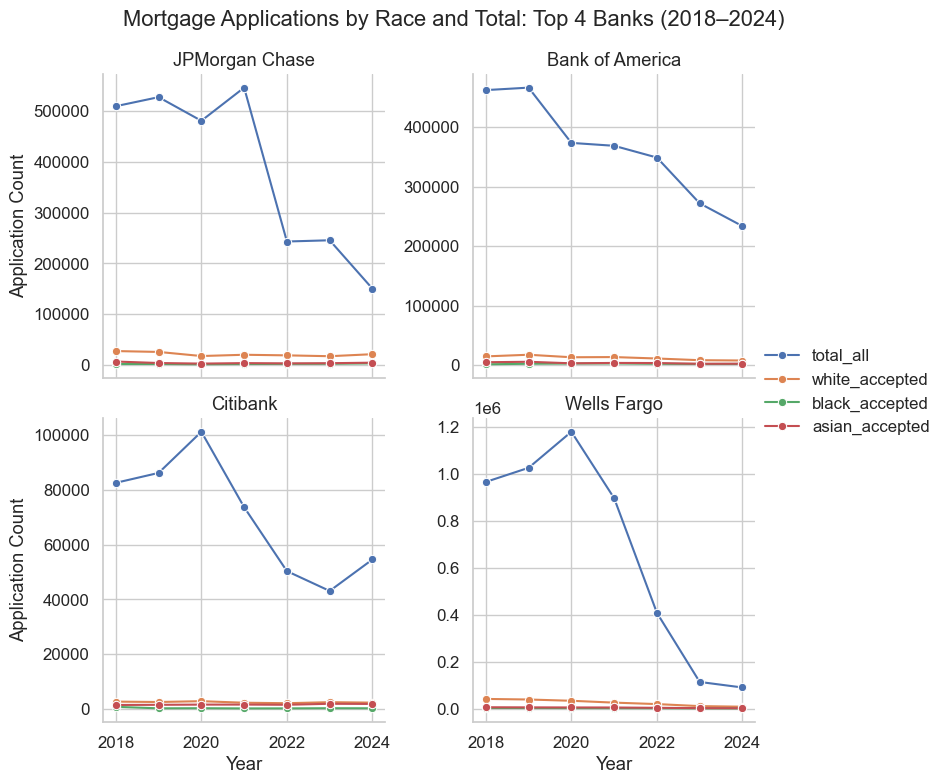

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("lei_summary_2018_2024.csv")

# Define LEIs for the 4 banks
lei_map = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JPMorgan Chase",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citibank"
}

# Filter for selected LEIs
df_four = df[df["lei"].isin(lei_map.keys())].copy()
df_four["bank_name"] = df_four["lei"].map(lei_map)

# Melt for long-form plotting
df_melted = df_four.melt(
    id_vars=["year", "bank_name"],
    value_vars=["total_all", "white_accepted", "black_accepted", "asian_accepted"],
    var_name="category",
    value_name="count"
)

# Plot
sns.set(style="whitegrid", font_scale=1.1)
g = sns.FacetGrid(df_melted, col="bank_name", col_wrap=2, height=4, sharey=False)
g.map_dataframe(sns.lineplot, x="year", y="count", hue="category", marker="o")

# Formatting
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Application Count")
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Mortgage Applications by Race and Total: Top 4 Banks (2018–2024)")

plt.show()


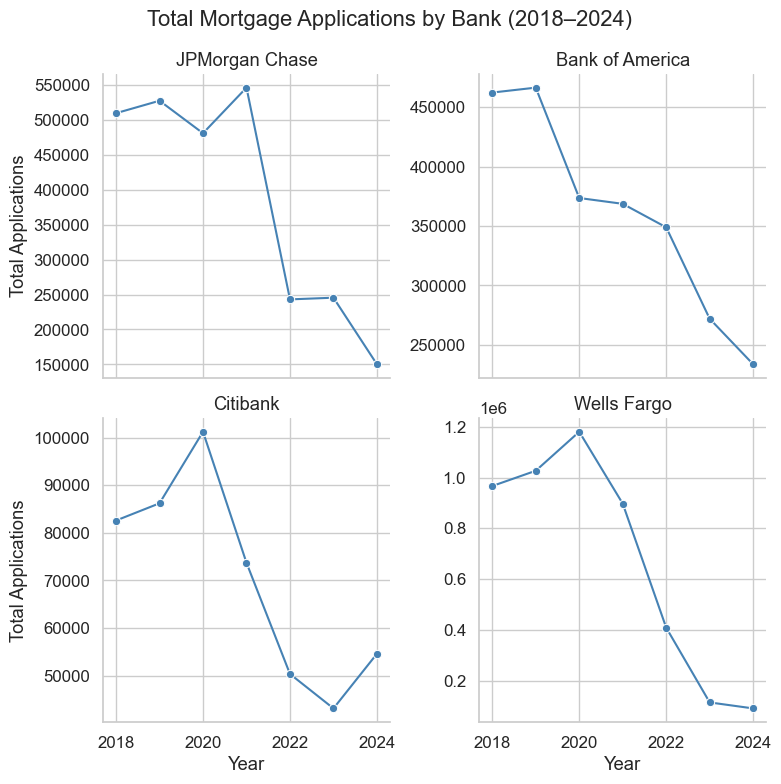

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load dataset
df = pd.read_csv("lei_summary_2018_2024.csv")

# Map of LEI to bank names
lei_map = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JPMorgan Chase",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citibank"
}

# Filter for selected banks
df_filtered = df[df["lei"].isin(lei_map)].copy()
df_filtered["bank_name"] = df_filtered["lei"].map(lei_map)

# Melt only total_all column for plotting
df_plot = df_filtered[["year", "bank_name", "total_all"]]

# Plot
sns.set(style="whitegrid", font_scale=1.1)
g = sns.FacetGrid(df_plot, col="bank_name", col_wrap=2, height=4, sharey=False)
g.map_dataframe(sns.lineplot, x="year", y="total_all", marker="o", color="steelblue")

# Formatting
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Total Applications")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Total Mortgage Applications by Bank (2018–2024)")

plt.show()


In [6]:
df.groupby('year').size()


year
2018    5730
2019    5569
2020    4527
2021    4368
2022    4480
2023    5113
2024    4909
dtype: int64

In [7]:
import os
import pandas as pd

# === Configuration ===
data_folder = "filtered_data_strict"
output_csv = "lei_state_summary.csv"
years = range(2018, 2025)

# Top 4 bank LEIs (you can extend this list if needed)
lei_map = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JP Morgan",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi Bank"
}

# Race mapping (main groups)
race_map = {
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White',
    1.0: 'Indigenous',
    4.0: 'Hawaiian/Pacific Islander', 41: 'Hawaiian/Pacific Islander', 42: 'Hawaiian/Pacific Islander',
    43: 'Hawaiian/Pacific Islander', 44: 'Hawaiian/Pacific Islander'
}

# Container
records = []

# === Loop over years ===
for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"⚠️ Missing: {file_path}")
        continue

    df = pd.read_csv(file_path, low_memory=False)

    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    df = df[df['lei'].isin(lei_map.keys())]
    df = df[df['action_taken'].isin([1, 2])]  # Approved only

    df_grouped = df.groupby(['lei', 'state_code', 'race_label']).size().reset_index(name='count')
    df_grouped['year'] = year

    records.append(df_grouped)

# Combine all
df_all = pd.concat(records, ignore_index=True)

# === Pivot to wide format ===
summary = (
    df_all.pivot_table(
        index=['lei', 'state_code', 'year'],
        columns='race_label',
        values='count',
        fill_value=0
    )
    .reset_index()
    .rename_axis(None, axis=1)
)

# Ensure all main race columns are present
for col in ['White', 'Black', 'Asian', 'Indigenous', 'Hawaiian/Pacific Islander']:
    if col not in summary.columns:
        summary[col] = 0

# Rename columns for clarity
summary = summary.rename(columns={
    'White': 'white_accepted',
    'Black': 'black_accepted',
    'Asian': 'asian_accepted',
    'Indigenous': 'indigenous_accepted',
    'Hawaiian/Pacific Islander': 'hawaiian_accepted'
})

# Save
summary.to_csv(output_csv, index=False)
print(f"✅ Saved summary to {output_csv}")


✅ Saved summary to lei_state_summary.csv


In [8]:
import pandas as pd
import os

# Define folders
unfiltered_folder = "unfiltered"
filtered_folder = "filtered_data_strict"

# Define filenames
years = list(range(2018, 2025))
unfiltered_files = [f"{y}_hmda.csv" for y in years]
filtered_files = [f"{y}_filtered_hmda.csv" for y in years]

# Store results
lei_results = []
state_results = []

for i, year in enumerate(years):
    print(f"\n📅 Processing {year}...")

    # === Load UNFILTERED ===
    unf_path = os.path.join(unfiltered_folder, unfiltered_files[i])
    if not os.path.exists(unf_path):
        print(f"❌ Missing unfiltered file: {unf_path}")
        continue
    df_unfiltered = pd.read_csv(unf_path, low_memory=False)
    total_all = df_unfiltered.groupby('lei').size().reset_index(name='total_all')

    # === Load FILTERED ===
    filt_path = os.path.join(filtered_folder, filtered_files[i])
    if not os.path.exists(filt_path):
        print(f"❌ Missing filtered file: {filt_path}")
        continue
    df_filtered = pd.read_csv(filt_path, low_memory=False)

    # Identify correct race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df_filtered.columns else 'applicant_race_1'

    # === LEI-level aggregations ===
    accepted = df_filtered[df_filtered['action_taken'].isin([1, 2])].groupby('lei').size().reset_index(name='accepted')
    denied = df_filtered[df_filtered['action_taken'] == 3].groupby('lei').size().reset_index(name='denied')

    def race_group(code, action_taken, label):
        return df_filtered[(df_filtered[race_col] == code) & (df_filtered['action_taken'].isin(action_taken))] \
            .groupby('lei').size().reset_index(name=label)

    merged_lei = total_all \
        .merge(accepted, on='lei', how='outer') \
        .merge(denied, on='lei', how='outer') \
        .merge(race_group(5, [1, 2], 'white_accepted'), on='lei', how='outer') \
        .merge(race_group(5, [3], 'white_denied'), on='lei', how='outer') \
        .merge(race_group(3, [1, 2], 'black_accepted'), on='lei', how='outer') \
        .merge(race_group(3, [3], 'black_denied'), on='lei', how='outer') \
        .merge(race_group(2, [1, 2], 'asian_accepted'), on='lei', how='outer') \
        .merge(race_group(2, [3], 'asian_denied'), on='lei', how='outer') \
        .merge(race_group(1, [1, 2], 'indigenous_accepted'), on='lei', how='outer') \
        .merge(race_group(1, [3], 'indigenous_denied'), on='lei', how='outer') \
        .merge(race_group(4, [1, 2], 'hawaiian_accepted'), on='lei', how='outer') \
        .merge(race_group(4, [3], 'hawaiian_denied'), on='lei', how='outer')

    merged_lei = merged_lei.fillna(0)
    merged_lei['total'] = merged_lei['accepted'] + merged_lei['denied']
    merged_lei['year'] = year
    lei_results.append(merged_lei)

    # === State-level aggregations ===
    df_filtered = df_filtered[df_filtered['action_taken'].isin([1, 2, 3])]
    grouped = df_filtered.groupby(['state_code', 'activity_year'])

    def count_by_race(df, race_code, actions):
        return ((df[race_col] == race_code) & (df['action_taken'].isin(actions))).sum()

    state_summary = grouped.apply(lambda g: pd.Series({
        'total_all': len(g),
        'white_accepted': count_by_race(g, 5, [1, 2]),
        'black_accepted': count_by_race(g, 3, [1, 2]),
        'asian_accepted': count_by_race(g, 2, [1, 2]),
        'indigenous_accepted': count_by_race(g, 1, [1, 2]),
        'hawaiian_accepted': count_by_race(g, 4, [1, 2]),
        'white_denied': count_by_race(g, 5, [3]),
        'black_denied': count_by_race(g, 3, [3]),
        'asian_denied': count_by_race(g, 2, [3]),
        'indigenous_denied': count_by_race(g, 1, [3]),
        'hawaiian_denied': count_by_race(g, 4, [3])
    })).reset_index()

    state_results.append(state_summary)

# === Save outputs ===
if lei_results:
    pd.concat(lei_results).to_csv("lei_summary_2018_2024.csv", index=False)
    print("✅ Saved: lei_summary_2018_2024.csv")

if state_results:
    pd.concat(state_results).to_csv("state_year_mortgage_summary.csv", index=False)
    print("✅ Saved: state_year_mortgage_summary.csv")



📅 Processing 2018...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2019...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2020...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2021...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2022...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2023...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({



📅 Processing 2024...
✅ Saved: lei_summary_2018_2024.csv
✅ Saved: state_year_mortgage_summary.csv


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/622452521.py:72: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


In [9]:
import pandas as pd
import os

# === Setup ===
unfiltered_folder = "unfiltered"
filtered_folder = "filtered_data_strict"
years = list(range(2018, 2025))

# File names
unfiltered_files = [f"{y}_hmda.csv" for y in years]
filtered_files = [f"{y}_filtered_hmda.csv" for y in years]

# Output containers
lei_results = []
lei_state_results = []
state_results = []

# === Helper function ===
def count_by_race(df, race_code, actions):
    return ((df[race_col] == race_code) & (df['action_taken'].isin(actions))).sum()

# === Main loop ===
for i, year in enumerate(years):
    print(f"📅 Processing {year}...")

    # Load unfiltered file
    unf_path = os.path.join(unfiltered_folder, unfiltered_files[i])
    if not os.path.exists(unf_path):
        print(f"❌ Missing: {unf_path}")
        continue
    df_unfiltered = pd.read_csv(unf_path, low_memory=False)
    total_all = df_unfiltered.groupby('lei').size().reset_index(name='total_all')

    # Load filtered file
    filt_path = os.path.join(filtered_folder, filtered_files[i])
    if not os.path.exists(filt_path):
        print(f"❌ Missing: {filt_path}")
        continue
    df_filtered = pd.read_csv(filt_path, low_memory=False)
    race_col = 'applicant_race-1' if 'applicant_race-1' in df_filtered.columns else 'applicant_race_1'

    # === LEI Summary ===
    actions = df_filtered['action_taken']
    accepted = df_filtered[actions.isin([1, 2])].groupby('lei').size().reset_index(name='accepted')
    denied = df_filtered[actions == 3].groupby('lei').size().reset_index(name='denied')

    def race_group(code, actions, name):
        return df_filtered[(df_filtered[race_col] == code) & (df_filtered['action_taken'].isin(actions))] \
            .groupby('lei').size().reset_index(name=name)

    merged_lei = total_all \
        .merge(accepted, on='lei', how='outer') \
        .merge(denied, on='lei', how='outer') \
        .merge(race_group(5, [1, 2], 'white_accepted'), on='lei', how='outer') \
        .merge(race_group(5, [3], 'white_denied'), on='lei', how='outer') \
        .merge(race_group(3, [1, 2], 'black_accepted'), on='lei', how='outer') \
        .merge(race_group(3, [3], 'black_denied'), on='lei', how='outer') \
        .merge(race_group(2, [1, 2], 'asian_accepted'), on='lei', how='outer') \
        .merge(race_group(2, [3], 'asian_denied'), on='lei', how='outer') \
        .merge(race_group(1, [1, 2], 'indigenous_accepted'), on='lei', how='outer') \
        .merge(race_group(1, [3], 'indigenous_denied'), on='lei', how='outer') \
        .merge(race_group(4, [1, 2], 'hawaiian_accepted'), on='lei', how='outer') \
        .merge(race_group(4, [3], 'hawaiian_denied'), on='lei', how='outer')

    merged_lei = merged_lei.fillna(0)
    merged_lei['total'] = merged_lei['accepted'] + merged_lei['denied']
    merged_lei['year'] = year
    lei_results.append(merged_lei)

    # === LEI + State Summary ===
    filtered = df_filtered[df_filtered['action_taken'].isin([1, 2, 3])]
    lei_state_summary = (
        filtered.groupby(['lei', 'state_code'])
        .apply(lambda g: pd.Series({
            'total_all': len(g),
            'white_accepted': count_by_race(g, 5, [1, 2]),
            'black_accepted': count_by_race(g, 3, [1, 2]),
            'asian_accepted': count_by_race(g, 2, [1, 2]),
            'indigenous_accepted': count_by_race(g, 1, [1, 2]),
            'hawaiian_accepted': count_by_race(g, 4, [1, 2]),
            'white_denied': count_by_race(g, 5, [3]),
            'black_denied': count_by_race(g, 3, [3]),
            'asian_denied': count_by_race(g, 2, [3]),
            'indigenous_denied': count_by_race(g, 1, [3]),
            'hawaiian_denied': count_by_race(g, 4, [3])
        }))
        .reset_index()
    )
    lei_state_summary['year'] = year
    lei_state_results.append(lei_state_summary)

    # === State-only Summary ===
    grouped = filtered.groupby(['state_code', 'activity_year'])
    state_summary = grouped.apply(lambda g: pd.Series({
        'total_all': len(g),
        'white_accepted': count_by_race(g, 5, [1, 2]),
        'black_accepted': count_by_race(g, 3, [1, 2]),
        'asian_accepted': count_by_race(g, 2, [1, 2]),
        'indigenous_accepted': count_by_race(g, 1, [1, 2]),
        'hawaiian_accepted': count_by_race(g, 4, [1, 2]),
        'white_denied': count_by_race(g, 5, [3]),
        'black_denied': count_by_race(g, 3, [3]),
        'asian_denied': count_by_race(g, 2, [3]),
        'indigenous_denied': count_by_race(g, 1, [3]),
        'hawaiian_denied': count_by_race(g, 4, [3])
    })).reset_index()
    state_results.append(state_summary)

# === Save ===
if lei_results:
    pd.concat(lei_results).to_csv("lei_summary_2018_2024.csv", index=False)
    print("✅ Saved: lei_summary_2018_2024.csv")

if lei_state_results:
    pd.concat(lei_state_results).to_csv("lei_state_summary.csv", index=False)
    print("✅ Saved: lei_state_summary.csv")

if state_results:
    pd.concat(state_results).to_csv("state_year_mortgage_summary.csv", index=False)
    print("✅ Saved: state_year_mortgage_summary.csv")


📅 Processing 2018...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2019...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2020...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2021...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2022...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2023...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


📅 Processing 2024...


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_11685/2235957794.py:94: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_summary = grouped.apply(lambda g: pd.Series({


✅ Saved: lei_summary_2018_2024.csv
✅ Saved: lei_state_summary.csv
✅ Saved: state_year_mortgage_summary.csv


In [10]:
# df.info()

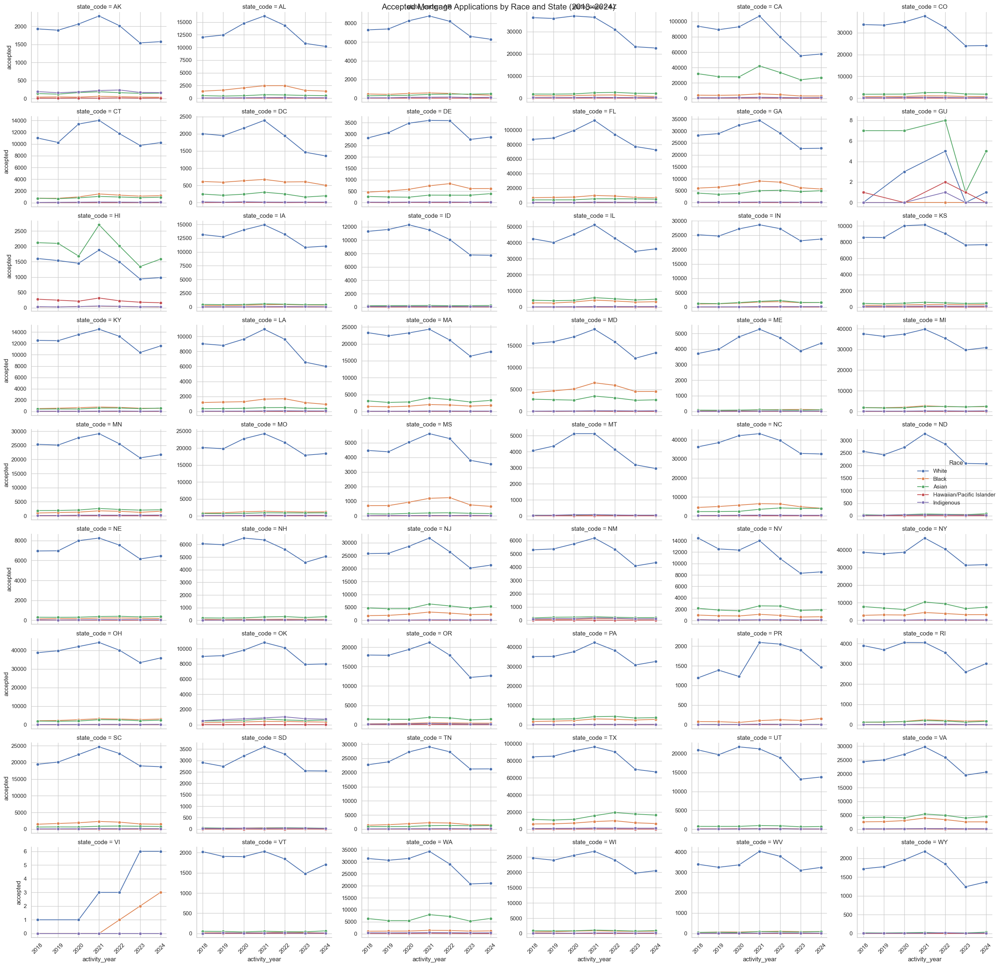

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the summary file
df = pd.read_csv("state_year_mortgage_summary.csv")

# Ensure year is treated as a string for better x-axis control
df['activity_year'] = df['activity_year'].astype(str)

# Melt the dataframe to long format for plotting
df_melted = df.melt(
    id_vars=['state_code', 'activity_year'],
    value_vars=[
        'white_accepted',
        'black_accepted',
        'asian_accepted',
        'hawaiian_accepted',
        'indigenous_accepted'
    ],
    var_name='race',
    value_name='accepted'
)

# Clean race labels
race_label_map = {
    'white_accepted': 'White',
    'black_accepted': 'Black',
    'asian_accepted': 'Asian',
    'hawaiian_accepted': 'Hawaiian/Pacific Islander',
    'indigenous_accepted': 'Indigenous'
}
df_melted['race'] = df_melted['race'].map(race_label_map)

# Set style
sns.set(style="whitegrid")

# Facet wrap by state
g = sns.FacetGrid(
    df_melted,
    col='state_code',
    col_wrap=6,
    hue='race',
    sharey=False,
    height=3,
    aspect=1.4
)

g.map(sns.lineplot, 'activity_year', 'accepted', marker='o')
g.add_legend(title='Race')

# Rotate x-axis labels
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Accepted Mortgage Applications by Race and State (2018–2024)", fontsize=16)

plt.tight_layout()
plt.show()


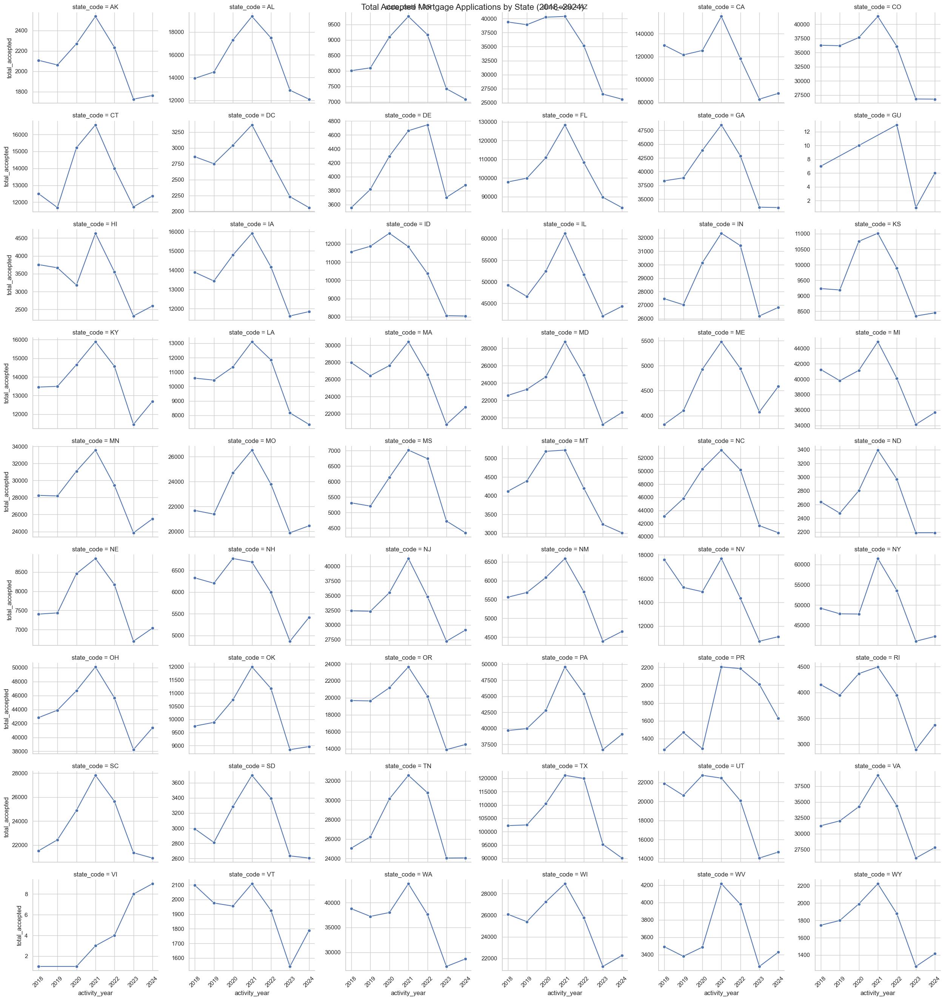

<Figure size 640x480 with 0 Axes>

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("state_year_mortgage_summary.csv")

# Convert year to string for categorical x-axis
df['activity_year'] = df['activity_year'].astype(str)

# Calculate total accepted applications
df['total_accepted'] = df['white_accepted'] + df['black_accepted'] + df['asian_accepted']

# Set style
sns.set(style="whitegrid")

# Create the facet plot
g = sns.FacetGrid(
    df,
    col="state_code",
    col_wrap=6,
    sharey=False,
    height=3,
    aspect=1.4
)

g.map_dataframe(
    sns.lineplot,
    x="activity_year",
    y="total_accepted",
    marker="o"
)

# Rotate labels for better readability
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Total Accepted Mortgage Applications by State (2018–2024)", fontsize=16)

plt.tight_layout()
plt.show()
plt.savefig("accepted_by_race_state.png", dpi=300, bbox_inches='tight')

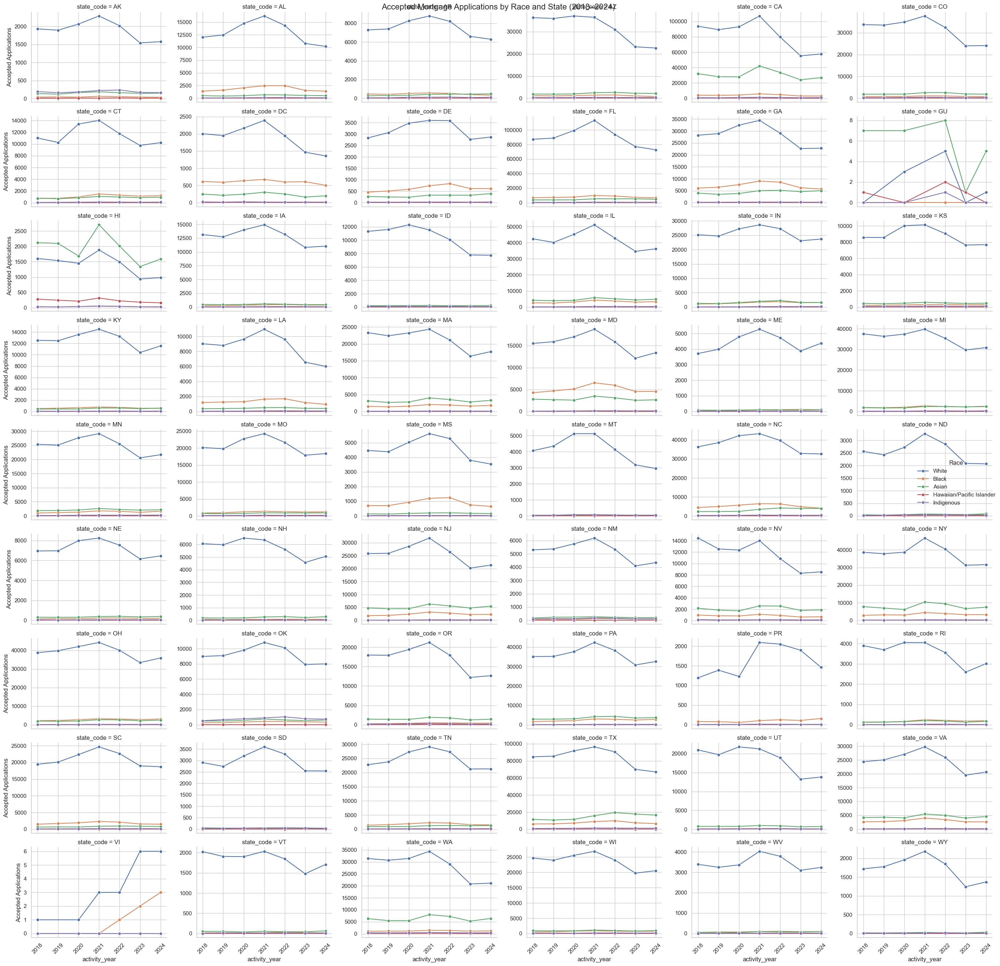

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("state_year_mortgage_summary.csv")

# Convert year to string for x-axis labeling
df['activity_year'] = df['activity_year'].astype(str)

# Melt the dataframe to long format
df_long = pd.melt(
    df,
    id_vars=["state_code", "activity_year"],
    value_vars=[
        "white_accepted",
        "black_accepted",
        "asian_accepted",
        "hawaiian_accepted",
        "indigenous_accepted"
    ],
    var_name="Race",
    value_name="Accepted Applications"
)

# Clean race labels
df_long["Race"] = (
    df_long["Race"]
    .str.replace("_accepted", "")
    .str.replace("hawaiian", "Hawaiian/Pacific Islander", case=False)
    .str.replace("indigenous", "Indigenous", case=False)
    .str.title()
)

# Set style
sns.set(style="whitegrid")

# Create the facet plot
g = sns.FacetGrid(
    df_long,
    col="state_code",
    col_wrap=6,
    height=3,
    aspect=1.4,
    sharey=False,
    margin_titles=True
)

g.map_dataframe(
    sns.lineplot,
    x="activity_year",
    y="Accepted Applications",
    hue="Race",
    marker="o"
)

# Tidy up the legend and axes
g.add_legend(title="Race")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Accepted Mortgage Applications by Race and State (2018–2024)", fontsize=16)

plt.tight_layout()
plt.savefig("accepted_by_race_state_all_breakdown.svg", dpi=300, bbox_inches='tight')
plt.show()


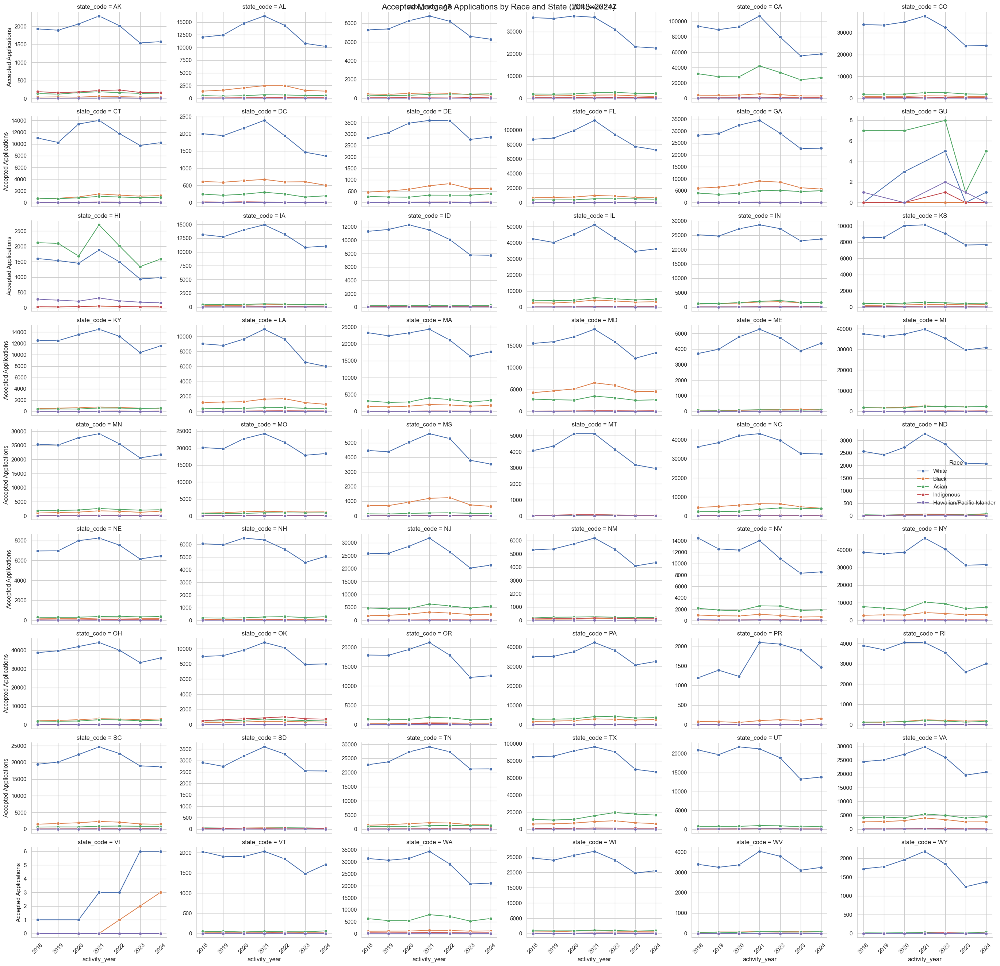

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("state_year_mortgage_summary.csv")

# Convert year to string for cleaner x-axis labels
df['activity_year'] = df['activity_year'].astype(str)

# Melt the dataframe to long format for race-based plotting
df_long = pd.melt(
    df,
    id_vars=["state_code", "activity_year"],
    value_vars=[
        "white_accepted",
        "black_accepted",
        "asian_accepted",
        "indigenous_accepted",
        "hawaiian_accepted"
    ],
    var_name="Race",
    value_name="Accepted Applications"
)

# Clean race labels for display
race_label_map = {
    "white_accepted": "White",
    "black_accepted": "Black",
    "asian_accepted": "Asian",
    "indigenous_accepted": "Indigenous",
    "hawaiian_accepted": "Hawaiian/Pacific Islander"
}
df_long["Race"] = df_long["Race"].map(race_label_map)

# Set seaborn style
sns.set(style="whitegrid")

# Create a facet plot by state
g = sns.FacetGrid(
    df_long,
    col="state_code",
    col_wrap=6,
    height=3,
    aspect=1.4,
    sharey=False,
    margin_titles=True
)

g.map_dataframe(
    sns.lineplot,
    x="activity_year",
    y="Accepted Applications",
    hue="Race",
    marker="o"
)

# Add legend and rotate x-axis ticks
g.add_legend(title="Race")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

# Adjust layout and save before showing
g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Accepted Mortgage Applications by Race and State (2018–2024)", fontsize=16)

plt.tight_layout()
plt.savefig("accepted_by_race_state_all_breakdown.svg", dpi=300, bbox_inches='tight')
plt.show()


In [15]:
import os
import pandas as pd

# === Define paths and files ===
unfiltered_folder = "unfiltered"
years = list(range(2018, 2025))
unfiltered_files = [f"{y}_hmda.csv" for y in years]

# === Map race codes to general groups ===
race_labels = {
    1: "American Indian or Alaska Native",
    2: "Asian", 21: "Asian", 22: "Asian", 23: "Asian", 24: "Asian", 25: "Asian", 26: "Asian", 27: "Asian",
    3: "Black or African American",
    4: "Native Hawaiian or Pacific Islander", 41: "Native Hawaiian or Pacific Islander",
    42: "Native Hawaiian or Pacific Islander", 43: "Native Hawaiian or Pacific Islander", 44: "Native Hawaiian or Pacific Islander",
    5: "White",
    6: "Info Not Provided",
    7: "Not Applicable"
}

# === Container for all results ===
all_years = []

for i, year in enumerate(years):
    file_path = os.path.join(unfiltered_folder, unfiltered_files[i])
    if not os.path.exists(file_path):
        print(f"⚠️ Missing file for {year}: {file_path}")
        continue

    print(f"Processing {year}...")

    df = pd.read_csv(file_path, low_memory=False)
    
    # Pick race column
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    
    # Filter relevant actions (approved, denied)
    df = df[df['action_taken'].isin([1, 2, 3])]
    
    # Map race
    df["Race"] = df[race_col].map(race_labels).fillna("Other/Unknown")
    df["activity_year"] = year

    # Create approved/denied status
    df["Decision"] = df["action_taken"].map({1: "Approved", 2: "Approved", 3: "Denied"})

    # Group and count
    grouped = (
        df.groupby(["activity_year", "state_code", "lei", "Race", "Decision"])
        .size()
        .reset_index(name="count")
    )

    all_years.append(grouped)

# === Combine and save ===
if all_years:
    final_df = pd.concat(all_years, ignore_index=True)
    final_df.to_csv("race_action_breakdown_by_year_state_lei.csv", index=False)
    print("✅ Exported: race_action_breakdown_by_year_state_lei.csv")
else:
    print("❌ No data processed.")


Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...
Processing 2023...
Processing 2024...
✅ Exported: race_action_breakdown_by_year_state_lei.csv


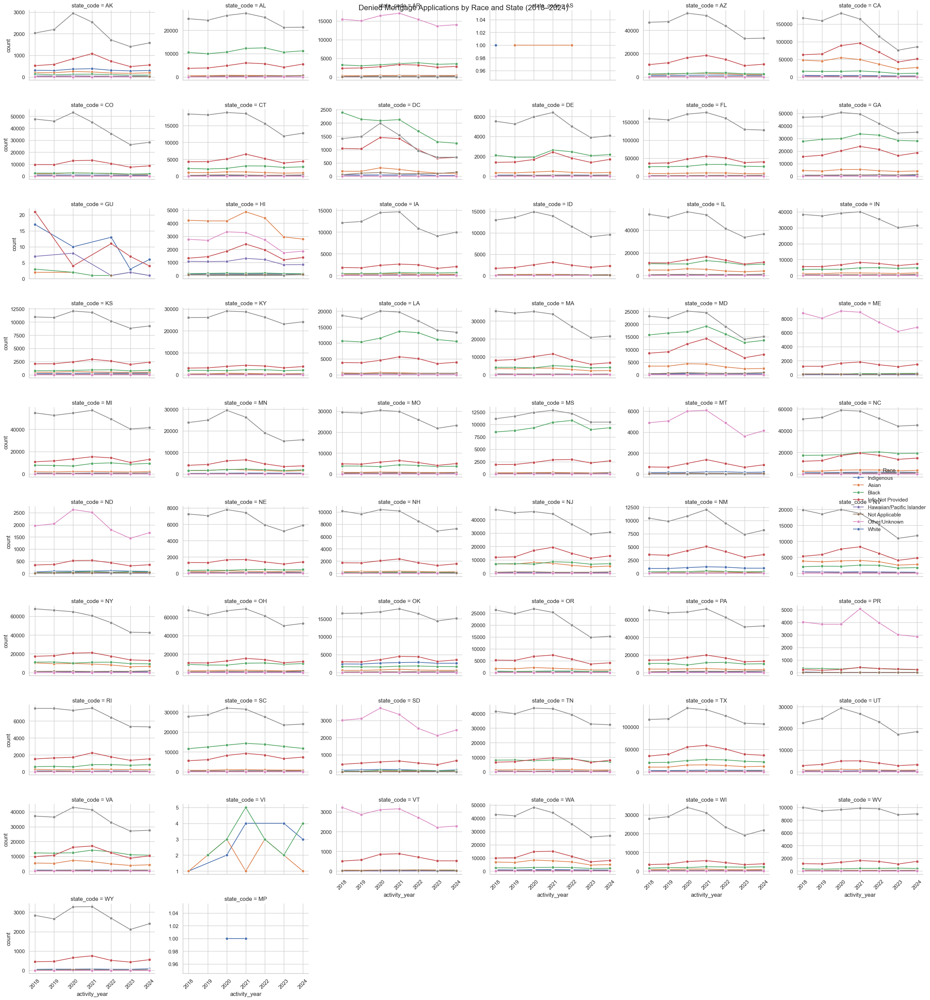

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the new file
df = pd.read_csv("race_action_breakdown_by_year_state_lei.csv")

# Filter to only Denied applications
df = df[df["Decision"] == "Denied"]

# Group by year, race, and state to aggregate counts
df_grouped = df.groupby(["activity_year", "state_code", "Race"])["count"].sum().reset_index()

# Convert year to string for x-axis clarity
df_grouped["activity_year"] = df_grouped["activity_year"].astype(str)

# Clean up race labels (optional: shorten long names)
df_grouped["Race"] = df_grouped["Race"].replace({
    "Black or African American": "Black",
    "American Indian or Alaska Native": "Indigenous",
    "Native Hawaiian or Pacific Islander": "Hawaiian/Pacific Islander"
})

# Seaborn setup
sns.set(style="whitegrid")

# Facet plot by state
g = sns.FacetGrid(
    df_grouped,
    col="state_code",
    col_wrap=6,
    height=3,
    aspect=1.4,
    sharey=False,
    margin_titles=True
)

g.map_dataframe(
    sns.lineplot,
    x="activity_year",
    y="count",
    hue="Race",
    marker="o"
)

# Final styling
g.add_legend(title="Race")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.92)
g.fig.suptitle("Denied Mortgage Applications by Race and State (2018–2024)", fontsize=16)

plt.tight_layout()
plt.savefig("denied_by_race_state_all_breakdown.svg", dpi=300, bbox_inches='tight')
plt.show()


/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)
/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)
/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)
/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)


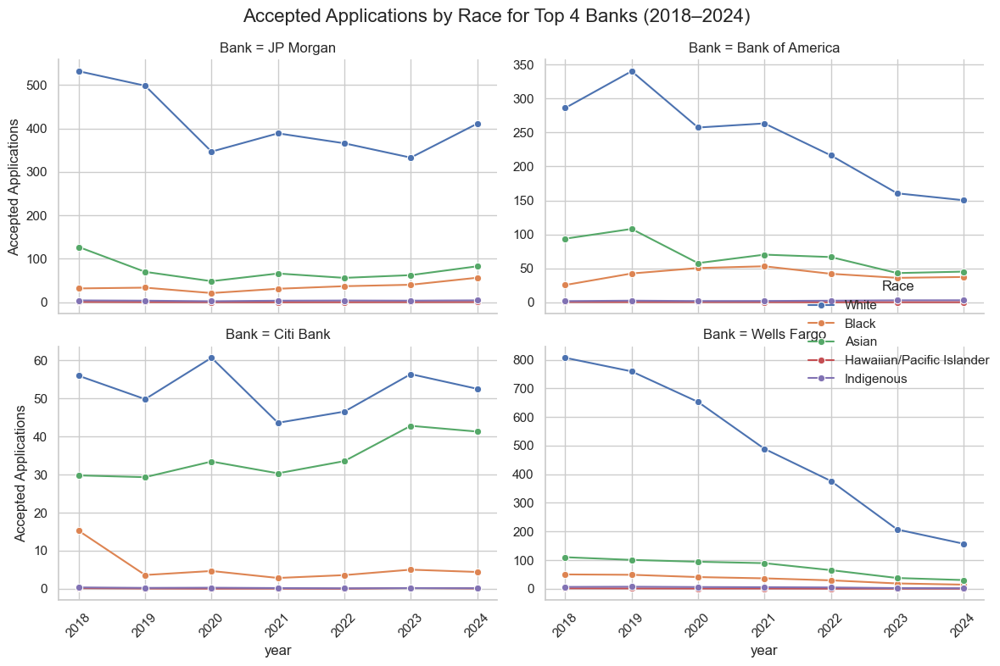

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your LEI-level data
df = pd.read_csv("lei_state_summary.csv")

# Define LEI codes for the 4 target banks
lei_dict = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JP Morgan",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi Bank"
}

# Filter to only those 4 banks
df_filtered = df[df['lei'].isin(lei_dict.keys())].copy()

# Map LEI to bank names
df_filtered["Bank"] = df_filtered["lei"].map(lei_dict)

# Convert year to string for consistent x-axis labels
df_filtered['year'] = df_filtered['year'].astype(str)

# Melt race acceptance columns for all main races
df_long = pd.melt(
    df_filtered,
    id_vars=["Bank", "state_code", "year"],
    value_vars=[
        "white_accepted",
        "black_accepted",
        "asian_accepted",
        "hawaiian_accepted",
        "indigenous_accepted"
    ],
    var_name="Race",
    value_name="Accepted Applications"
)

# Clean race labels
df_long["Race"] = (
    df_long["Race"]
    .str.replace("_accepted", "", case=False)
    .str.replace("hawaiian", "Hawaiian/Pacific Islander", case=False)
    .str.replace("indigenous", "Indigenous", case=False)
    .str.title()
)

# Set style
sns.set(style="whitegrid")

# Create facet plot by bank
g = sns.FacetGrid(
    df_long,
    col="Bank",
    col_wrap=2,
    height=4,
    aspect=1.2,
    sharey=False,
    margin_titles=True
)

g.map_dataframe(
    sns.lineplot,
    x="year",
    y="Accepted Applications",
    hue="Race",
    marker="o",
    ci=None
)

# Final touches
g.add_legend(title="Race")
for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Accepted Applications by Race for Top 4 Banks (2018–2024)", fontsize=16)

# Save and show
plt.tight_layout()
plt.savefig("top4banks_race_acceptance_all.svg", dpi=300, bbox_inches='tight')
plt.show()


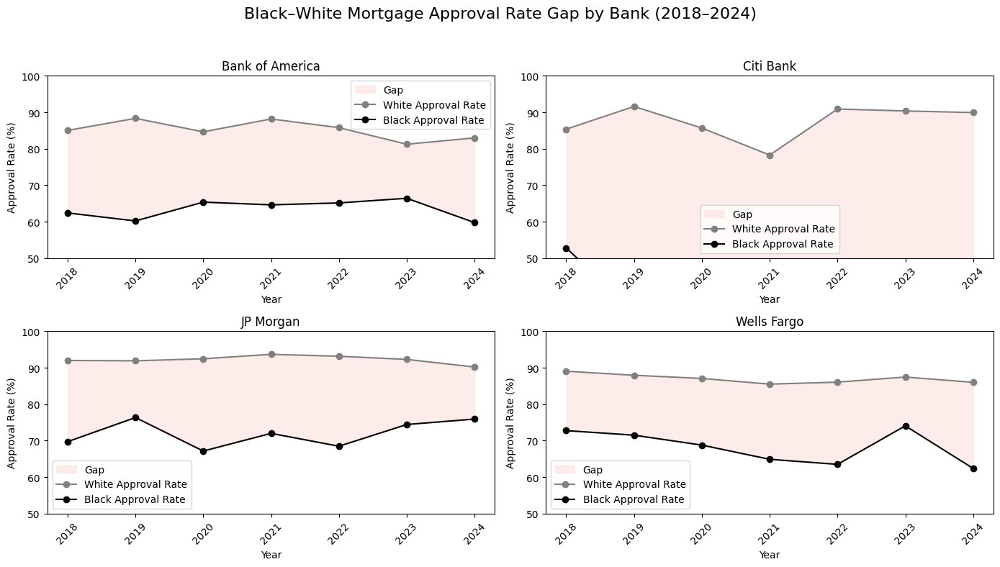

In [87]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("lei_state_summary.csv")

# Map LEI codes to bank names
lei_dict = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JP Morgan",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi Bank"
}

df["Bank"] = df["lei"].map(lei_dict)
df = df[df["Bank"].notna()].copy()

# Ensure year is numeric
df["year"] = df["year"].astype(int)

# Avoid division by zero
epsilon = 1e-6

# Compute approval rates
df["white_total_apps"] = df["white_accepted"] + df["white_denied"]
df["black_total_apps"] = df["black_accepted"] + df["black_denied"]

df["white_rate"] = df["white_accepted"] / (df["white_total_apps"] + epsilon)
df["black_rate"] = df["black_accepted"] / (df["black_total_apps"] + epsilon)

# Aggregate by bank and year (simple mean across states)
agg_df = df.groupby(["Bank", "year"])[["white_rate", "black_rate"]].mean().reset_index()

# Plot setup
banks = agg_df["Bank"].unique()
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))
axes = axes.flatten()

for i, bank in enumerate(banks):
    data = agg_df[agg_df["Bank"] == bank].sort_values("year")
    
    years = data["year"]
    white = data["white_rate"] * 100  # convert to %
    black = data["black_rate"] * 100
    
    ax = axes[i]
    
    # Shaded gap
    ax.fill_between(years, white, black, where=(white > black), color="#fde0dd", label="Gap", alpha=0.6)
    
    # Plot lines
    ax.plot(years, white, marker='o', color="gray", label="White Approval Rate")
    ax.plot(years, black, marker='o', color="black", label="Black Approval Rate")
    
    # Styling
    ax.set_title(bank)
    ax.set_xlabel("Year")
    ax.set_ylabel("Approval Rate (%)")
    ax.set_ylim(50, 100)
    ax.tick_params(axis='x', rotation=45)
    ax.legend()

# Final layout
fig.suptitle("Black–White Mortgage Approval Rate Gap by Bank (2018–2024)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("approval_rate_gap_by_bank.svg", dpi=300, bbox_inches='tight')
plt.show()


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3680384670.py:35: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

2025-08-07 01:47:06,104 [DEBUG] findfont: Matching sans\-serif:style=normal:variant=normal:weight=bold:stretch=normal:size=12.0.
2025-08-07 01:47:06,105 [DEBUG] findfont: score(FontEntry(fname='/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/matplotlib/mpl-data/fonts/ttf/STIXNonUniBolIta.ttf', name='STIXNonUnicode', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.05
2025-08-07 01:47:06,106 [DEBUG] findfont: score(FontEntry(fname='/Users/chivo/.pyenv/versions/3.10.12/lib/python3.10/site-packages/matplotlib/mpl-data

Banks found in data: ['Bank of America', 'Citi Bank', 'JP Morgan', 'Rocket', 'UWM', 'Wells Fargo']
Years available: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
Total records: 2109

Data availability by bank:
  Bank of America: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
  Citi Bank: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
  JP Morgan: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
  Rocket: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
  UWM: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
  Wells Fargo: [2018, 2019, 2020, 2021, 2022, 2023, 2024]


2025-08-07 01:47:06,166 [DEBUG] findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Arial.ttf', name='Arial', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 6.698636363636363
2025-08-07 01:47:06,167 [DEBUG] findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSerifNyiakengPuachueHmong-Regular.ttf', name='Noto Serif Hmong Nyiakeng', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
2025-08-07 01:47:06,167 [DEBUG] findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/AppleMyungjo.ttf', name='AppleMyungjo', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
2025-08-07 01:47:06,168 [DEBUG] findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansTagbanwa-Regular.ttf', name='Noto Sans Tagbanwa', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.335
2025-08-07 01:47:06,169

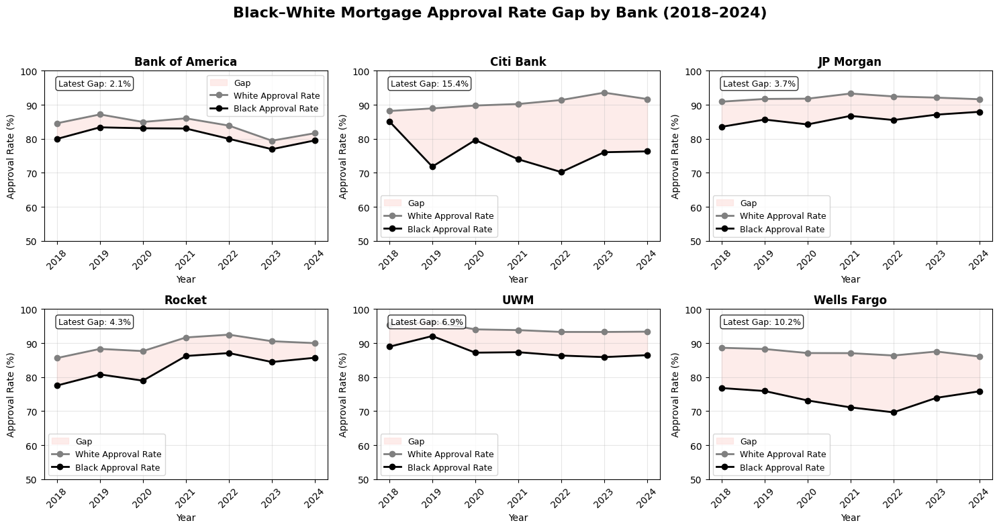


📊 SUMMARY STATISTICS:

Latest year (2024) approval rates and gaps:
  Bank of America:
    White: 81.6% | Black: 79.5% | Gap: 2.1%
  Citi Bank:
    White: 91.7% | Black: 76.3% | Gap: 15.4%
  JP Morgan:
    White: 91.6% | Black: 87.9% | Gap: 3.7%
  Rocket:
    White: 90.0% | Black: 85.7% | Gap: 4.3%
  UWM:
    White: 93.4% | Black: 86.5% | Gap: 6.9%
  Wells Fargo:
    White: 86.1% | Black: 75.8% | Gap: 10.2%

Overall statistics across all years:
  Bank of America: Avg White: 84.0% | Avg Black: 80.8% | Avg Gap: 3.1%
  Citi Bank: Avg White: 90.5% | Avg Black: 76.2% | Avg Gap: 14.4%
  JP Morgan: Avg White: 92.0% | Avg Black: 85.8% | Avg Gap: 6.2%
  Rocket: Avg White: 89.5% | Avg Black: 83.0% | Avg Gap: 6.5%
  UWM: Avg White: 94.2% | Avg Black: 87.7% | Avg Gap: 6.4%
  Wells Fargo: Avg White: 87.3% | Avg Black: 73.8% | Avg Gap: 13.5%


In [216]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("lei_state_summary.csv")

# Updated LEI codes to bank names mapping (consistent with DEI analysis naming)
lei_dict = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JP Morgan", 
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi Bank",
    "549300FGXN1K3HLB1R50": "Rocket",        # Added Rocket
    "549300HW662MN1WU8550": "UWM"            # Added UWM
}

df["Bank"] = df["lei"].map(lei_dict)
df = df[df["Bank"].notna()].copy()

print(f"Banks found in data: {sorted(df['Bank'].unique())}")
print(f"Years available: {sorted(df['year'].unique())}")
print(f"Total records: {len(df)}")

# Ensure year is numeric
df["year"] = df["year"].astype(int)

# Avoid division by zero
epsilon = 1e-6

# Compute totals
df["white_total_apps"] = df["white_accepted"] + df["white_denied"]
df["black_total_apps"] = df["black_accepted"] + df["black_denied"]

# ✅ Weighted aggregation by bank and year
agg_df = df.groupby(["Bank", "year"]).apply(lambda g: pd.Series({
    "white_accepted_sum": g["white_accepted"].sum(),
    "white_total_sum": g["white_total_apps"].sum(),
    "black_accepted_sum": g["black_accepted"].sum(),
    "black_total_sum": g["black_total_apps"].sum(),
})).reset_index()

agg_df["white_rate"] = agg_df["white_accepted_sum"] / (agg_df["white_total_sum"] + epsilon)
agg_df["black_rate"] = agg_df["black_accepted_sum"] / (agg_df["black_total_sum"] + epsilon)

# Print summary of data availability
print(f"\nData availability by bank:")
for bank in sorted(agg_df["Bank"].unique()):
    bank_data = agg_df[agg_df["Bank"] == bank]
    years = sorted(bank_data["year"].unique())
    print(f"  {bank}: {years}")

# Plot setup - dynamically adjust subplot grid based on number of banks
banks = sorted(agg_df["Bank"].unique())
n_banks = len(banks)

# Calculate subplot grid (prefer 2 or 3 columns)
if n_banks <= 4:
    ncols = 2
    nrows = (n_banks + 1) // 2
elif n_banks <= 6:
    ncols = 3
    nrows = (n_banks + 2) // 3
else:
    ncols = 3
    nrows = (n_banks + 2) // 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 4*nrows))

# Handle single subplot case
if n_banks == 1:
    axes = [axes]
elif nrows == 1:
    axes = axes if hasattr(axes, '__len__') else [axes]
else:
    axes = axes.flatten()

# Ensure we have enough axes
while len(axes) < n_banks:
    axes.append(None)

for i, bank in enumerate(banks):
    data = agg_df[agg_df["Bank"] == bank].sort_values("year")
    
    if data.empty:
        continue
        
    years = data["year"]
    white = data["white_rate"] * 100  # convert to %
    black = data["black_rate"] * 100
    
    ax = axes[i]
    
    # Shaded gap (only where white > black)
    ax.fill_between(years, white, black, where=(white > black), 
                    color="#fde0dd", label="Gap", alpha=0.6)
    
    # Plot lines
    ax.plot(years, white, marker='o', color="gray", label="White Approval Rate", linewidth=2)
    ax.plot(years, black, marker='o', color="black", label="Black Approval Rate", linewidth=2)
    
    # Styling
    ax.set_title(bank, fontsize=12, fontweight='bold')
    ax.set_xlabel("Year")
    ax.set_ylabel("Approval Rate (%)")
    ax.set_ylim(50, 100)
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)
    
    # Add gap percentage text
    if len(data) > 0:
        latest_year = data.iloc[-1]
        gap = (latest_year["white_rate"] - latest_year["black_rate"]) * 100
        ax.text(0.05, 0.95, f'Latest Gap: {gap:.1f}%', 
                transform=ax.transAxes, fontsize=9, 
                verticalalignment='top', 
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

# Hide unused subplots
for j in range(n_banks, len(axes)):
    if axes[j] is not None:
        axes[j].set_visible(False)

# Final layout
fig.suptitle("Black–White Mortgage Approval Rate Gap by Bank (2018–2024)", 
             fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save with updated filename
plt.savefig("approval_rate_gap_by_bank_updated.svg", dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics
print(f"\n📊 SUMMARY STATISTICS:")
print("=" * 50)

latest_year = agg_df["year"].max()
latest_data = agg_df[agg_df["year"] == latest_year]

print(f"\nLatest year ({latest_year}) approval rates and gaps:")
for _, row in latest_data.iterrows():
    white_pct = row["white_rate"] * 100
    black_pct = row["black_rate"] * 100
    gap = white_pct - black_pct
    print(f"  {row['Bank']}:")
    print(f"    White: {white_pct:.1f}% | Black: {black_pct:.1f}% | Gap: {gap:.1f}%")

# Overall statistics
print(f"\nOverall statistics across all years:")
for bank in sorted(banks):
    bank_data = agg_df[agg_df["Bank"] == bank]
    avg_white = bank_data["white_rate"].mean() * 100
    avg_black = bank_data["black_rate"].mean() * 100
    avg_gap = avg_white - avg_black
    print(f"  {bank}: Avg White: {avg_white:.1f}% | Avg Black: {avg_black:.1f}% | Avg Gap: {avg_gap:.1f}%")

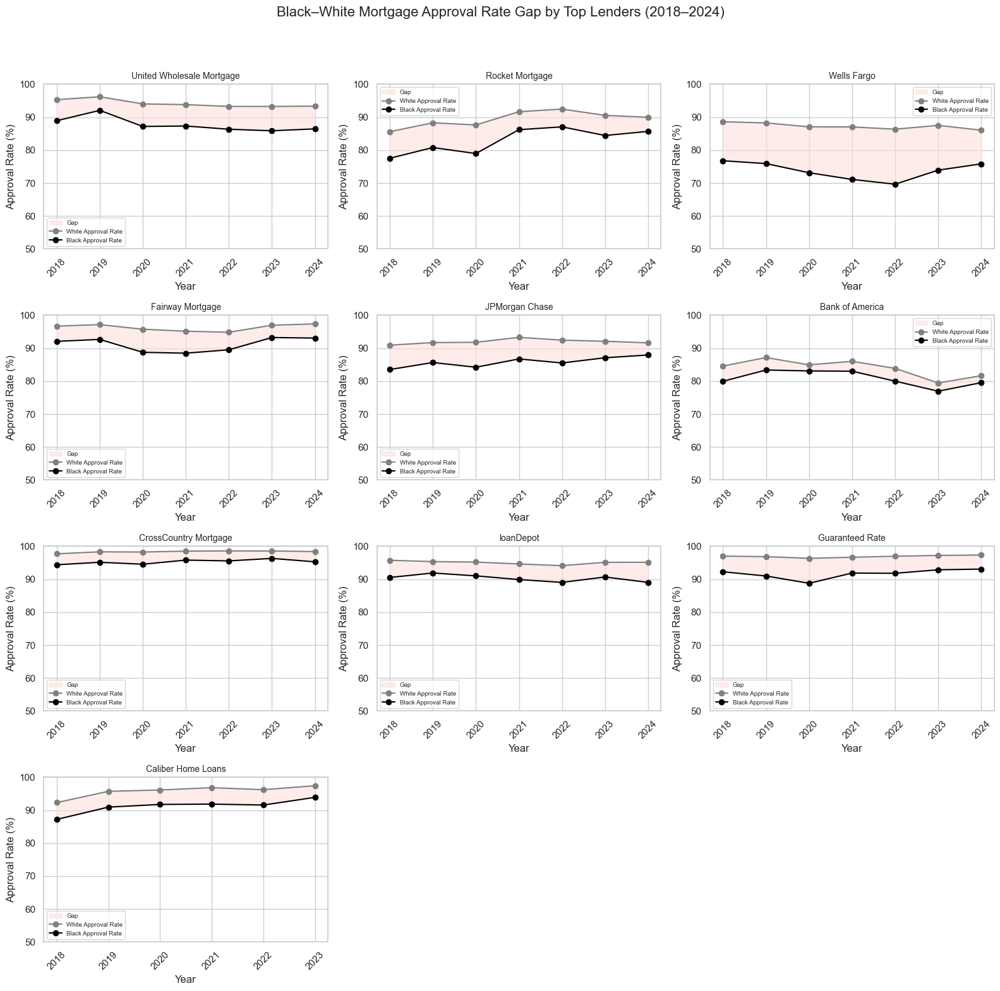

In [122]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# --- Config ---
data_folder = "filtered_data_strict"  # path to your filtered HMDA CSVs
years = range(2018, 2025)

# Lender LEIs and Names
lei_to_name = {
    "549300HW662MN1WU8550": "United Wholesale Mortgage",
    "549300FGXN1K3HLB1R50": "Rocket Mortgage",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "549300MGPZBLQDIL7538": "Fairway Mortgage",
    "7H6GLXDRUGQFU57RNE97": "JPMorgan Chase",
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "549300VZVN841I2ILS84": "CrossCountry Mortgage",
    "549300AG64NHILB7ZP05": "loanDepot",
    "549300U3721PJGQZYY68": "Guaranteed Rate",
    "549300J7XKT2BI5WX213": "Caliber Home Loans"
}

target_leis = list(lei_to_name.keys())
race_map = {3.0: 'Black', 5.0: 'White'}
epsilon = 1e-6
results = []

# --- Process all years ---
for year in years:
    filepath = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(filepath):
        print(f"Missing: {filepath}")
        continue

    df = pd.read_csv(filepath, low_memory=False)
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'

    # Filter for relevant LEIs and races
    df = df[df['lei'].isin(target_leis)]
    df = df[df[race_col].isin(race_map.keys())]
    df['race'] = df[race_col].map(race_map)

    # Filter for approvals and denials only
    df = df[df['action_taken'].isin([1, 2, 3])]

    # Count per lender–race
    grouped = df.groupby(['lei', 'race'])['action_taken'].value_counts().unstack(fill_value=0)
    grouped['total'] = grouped.sum(axis=1)
    grouped['approved'] = grouped.get(1, 0) + grouped.get(2, 0)
    grouped['approval_rate'] = grouped['approved'] / (grouped['total'] + epsilon)
    grouped = grouped.reset_index()
    grouped['year'] = year
    results.append(grouped)

# --- Combine all results ---
all_df = pd.concat(results)
pivoted = all_df.pivot_table(index=['lei', 'year'], columns='race', values='approval_rate').reset_index()
pivoted['gap'] = pivoted['White'] - pivoted['Black']
pivoted['Lender'] = pivoted['lei'].map(lei_to_name)

# --- Plot ---
ncols = 3
nrows = -(-len(target_leis) // ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows))
axes = axes.flatten()

for i, (lei, lender) in enumerate(lei_to_name.items()):
    data = pivoted[pivoted['lei'] == lei].sort_values('year')
    if data.empty:
        continue

    years = data['year']
    white = data['White'] * 100
    black = data['Black'] * 100

    ax = axes[i]
    ax.fill_between(years, white, black, where=(white > black), color="#fde0dd", label="Gap", alpha=0.6)
    ax.plot(years, white, marker='o', color='gray', label='White Approval Rate')
    ax.plot(years, black, marker='o', color='black', label='Black Approval Rate')

    ax.set_title(lender, fontsize=10)
    ax.set_ylim(50, 100)
    ax.set_xlabel("Year")
    ax.set_ylabel("Approval Rate (%)")
    ax.tick_params(axis='x', rotation=45)
    ax.legend(fontsize=7)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Black–White Mortgage Approval Rate Gap by Top Lenders (2018–2024)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("approval_gap_top_lenders.svg", dpi=300, bbox_inches='tight')
plt.show()


In [136]:
# print(df.columns.tolist())

In [78]:
import pandas as pd

df = pd.read_csv("lei_state_summary.csv")
print(df.columns.tolist())


['lei', 'state_code', 'total_all', 'white_accepted', 'black_accepted', 'asian_accepted', 'indigenous_accepted', 'hawaiian_accepted', 'white_denied', 'black_denied', 'asian_denied', 'indigenous_denied', 'hawaiian_denied', 'year']


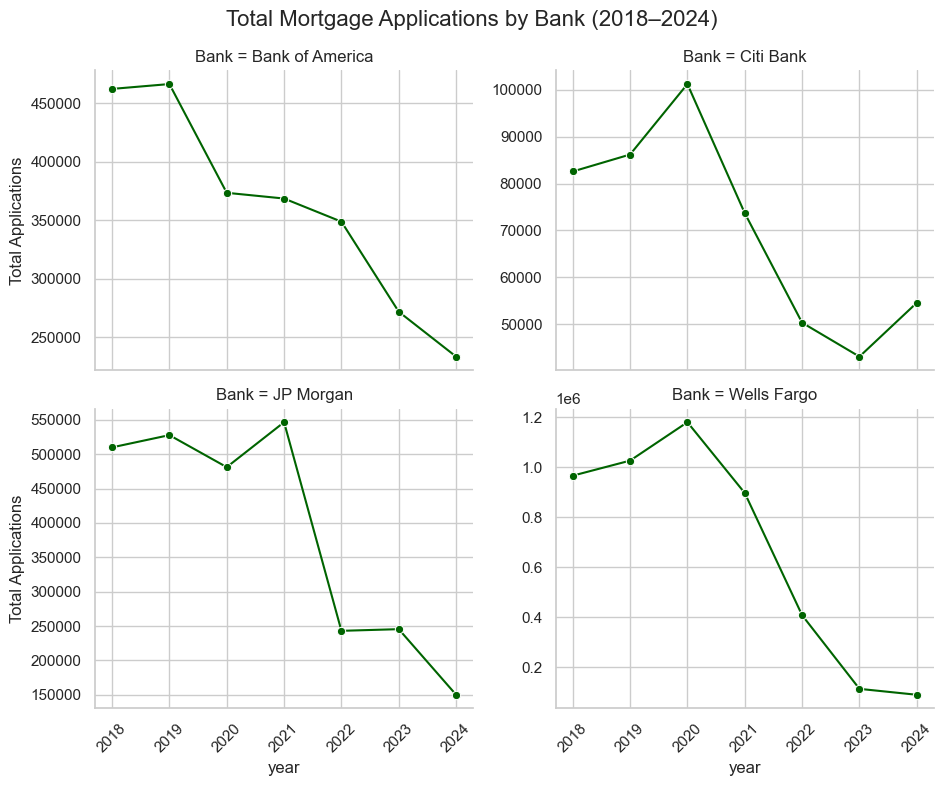

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Define LEIs and names
lei_dict = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JP Morgan",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi Bank"
}

# Input folder
unfiltered_folder = "unfiltered"

# Years to process
years = list(range(2018, 2025))

# List to store per-year results
all_data = []

# Loop through each year
for year in years:
    file_path = os.path.join(unfiltered_folder, f"{year}_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ File not found: {file_path}")
        continue

    df = pd.read_csv(file_path, low_memory=False)
    
    # Filter to target LEIs
    df = df[df['lei'].isin(lei_dict.keys())].copy()
    df['Bank'] = df['lei'].map(lei_dict)
    df['year'] = str(year)

    # Group by bank and count total rows = total applications
    summary = (
        df.groupby("Bank")
        .size()
        .reset_index(name="Total Applications")
    )
    summary['year'] = str(year)

    all_data.append(summary)

# Combine all years
df_totals = pd.concat(all_data)

# Plot
sns.set(style="whitegrid")
g = sns.FacetGrid(
    df_totals,
    col="Bank",
    col_wrap=2,
    height=4,
    aspect=1.2,
    sharey=False
)

g.map_dataframe(
    sns.lineplot,
    x="year",
    y="Total Applications",
    marker="o",
    color="darkgreen"
)

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)

g.fig.subplots_adjust(top=0.88)
g.fig.suptitle("Total Mortgage Applications by Bank (2018–2024)", fontsize=16)

# Save and show
plt.tight_layout()
plt.savefig("top4banks_total_applications_by_year.svg", dpi=300, bbox_inches='tight')
plt.show()


In [20]:
## Elections results 

In [21]:
import pandas as pd

# Load raw county-level data for 2016 and 2020
e2016 = pd.read_csv("election results/2016_US_County_Level_Presidential_Results.csv", dtype={'county_fips':str})
e2020 = pd.read_csv("election results/2020_US_County_Level_Presidential_Results.csv", dtype={'county_fips':str})

# Clean 2016 fields
e2016 = e2016.loc[:, ~e2016.columns.str.contains('^Unnamed')]
e2016['per_point_diff'] = e2016['per_point_diff'].str.replace('%','').astype(float)
e2016.drop_duplicates(subset='county_fips', inplace=True)
e2016['year'] = 2016
e2016 = e2016.rename(columns={
    'state_abbr': 'state_code',
    'per_point_diff': 'gop_margin_pct'
})

# Clean and standardize 2020
e2020['year'] = 2020
e2020 = e2020.rename(columns={
    'state_name': 'state',
    'per_point_diff': 'gop_margin_pct'
})
e2020['state_code'] = e2020['state']  # assuming state codes match abbreviations

# Select and align columns
keep = ['county_fips', 'state_code', 'votes_dem', 'votes_gop', 'gop_margin_pct', 'year']
e2016 = e2016[keep]
e2020 = e2020[keep]

# Combine
election = pd.concat([e2016, e2020], ignore_index=True)


In [22]:
#Map

In [23]:
import pandas as pd

# === Load 2016 and 2020 election data ===
df_2016 = pd.read_csv("election results/2016_US_County_Level_Presidential_Results.csv", dtype={"combined_fips": str})
df_2020 = pd.read_csv("election results/2020_US_County_Level_Presidential_Results.csv", dtype={"county_fips": str})

# Standardize column names
df_2016 = df_2016.rename(columns={"combined_fips": "county_fips", "per_dem": "per_democrat", "per_gop": "per_republican"})
df_2020 = df_2020.rename(columns={"county_fips": "county_fips", "per_dem": "per_democrat", "per_gop": "per_republican"})

# Add election year
df_2016["election_year"] = 2016
df_2020["election_year"] = 2020

# Add mortgage years based on election
df_2016["mortgage_years"] = [[2018, 2019, 2020]] * len(df_2016)
df_2020["mortgage_years"] = [[2021, 2022, 2023, 2024]] * len(df_2020)

# Combine and explode to one row per mortgage year
df_combined = pd.concat([df_2016, df_2020], ignore_index=True)
df_exploded = df_combined.explode("mortgage_years").rename(columns={"mortgage_years": "year"})

# Keep only relevant columns
df_final = df_exploded[["county_fips", "year", "per_democrat", "per_republican"]]

# Save for merging
df_final.to_csv("merged_election_results.csv", index=False)
print("✅ Saved merged_election_results.csv")


✅ Saved merged_election_results.csv


In [24]:
import pandas as pd

# Load tract-level approval data
approval = pd.read_csv("tract_level_approval_rates.csv", dtype=str)
approval.columns = approval.columns.str.strip()
approval['county_fips'] = approval['tract_fips'].str[:5]  # Extract county-level FIPS

# Load merged election results
election = pd.read_csv("merged_election_results.csv", dtype=str)
election.columns = election.columns.str.strip()

# Merge on county_fips and year
merged = approval.merge(election, on=['county_fips', 'year'], how='left')

# Save to file
merged.to_csv("tract_approval_election_merged.csv", index=False)
print("✅ Saved tract_approval_election_merged.csv")


✅ Saved tract_approval_election_merged.csv


In [25]:
# import os
# print(os.listdir('.'))

In [26]:
import pandas as pd
df = pd.read_csv("tract_approval_election_merged.csv")
print(df.columns.tolist())


['tract_fips', 'year', 'race_label', 'loan_originated', 'approved_but_not_originated', 'denied', 'approved', 'total', 'approval_rate', 'county_fips', 'per_democrat', 'per_republican']


In [27]:
import pandas as pd

# Load full approval dataset (with county_fips or tract info)
df = pd.read_csv("tract_approval_election_merged.csv", dtype={"county_fips": str})

# Extract state FIPS (first 2 digits of county_fips)
df["state_fips"] = df["county_fips"].str[:2]

# Group by state and race to compute average approval rate
state_race_rates = (
    df.groupby(["state_fips", "race_label"])
      .agg(approval_rate=('approval_rate', 'mean'),
           total_applications=('total', 'sum'))
      .reset_index()
)

# Export to CSV
state_race_rates.to_csv("approval_rates_by_state_race_with_election.csv", index=False)
print("✅ Saved: approval_rates_by_state_race.csv")


✅ Saved: approval_rates_by_state_race.csv


In [28]:
import pandas as pd

df = pd.read_csv("tract_approval_election_merged.csv", dtype={'county_fips': str})

print("Non-null race_label counts by year:")
print(df[df['race_label'].notna()].groupby('year')['race_label'].count())


Non-null race_label counts by year:
year
2018    187693
2019    186337
2020    190289
2021    194206
2022    214304
2023    207036
2024    361149
Name: race_label, dtype: int64


In [29]:
import pandas as pd

# Load the HMDA file
df = pd.read_csv("filtered_data_strict/2018_filtered_hmda.csv", low_memory=False)

# Determine race column based on year
if 'applicant_race-1' in df.columns:
    race_col = 'applicant_race-1'
elif 'applicant_race_1' in df.columns:
    race_col = 'applicant_race_1'
else:
    raise ValueError("❌ Race column not found in the dataset")

# Define broad race groups per HMDA spec
race_groups = {
    'White': [5.0],
    'Black': [3.0],
    'Indigenous': [1.0],  # American Indian or Alaska Native
    'Asian': [2.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0],
    'Hawaiian': [4.0, 41.0, 42.0, 43.0, 44.0],  # Native Hawaiian or Other Pacific Islander
    'Unknown': [6.0, 7.0]
}

# Function to map detailed race codes into broader categories
def map_race(code):
    for label, codes in race_groups.items():
        if code in codes:
            return label
    return 'Other'

# Apply mapping
df[race_col] = pd.to_numeric(df[race_col], errors='coerce')
df['race_label'] = df[race_col].apply(map_race)

# Optional: view value counts
print("✅ Race label breakdown:")
print(df['race_label'].value_counts())

# Save result
df.to_csv("2018_filtered_race_mapped.csv", index=False)
print("✅ Saved: 2018_filtered_race_mapped.csv")


✅ Race label breakdown:
race_label
White         1132739
Asian          140745
Black           78533
Indigenous       7982
Hawaiian         3647
Name: count, dtype: int64
✅ Saved: 2018_filtered_race_mapped.csv


In [87]:
import os
import pandas as pd

# Path to the folder containing your filtered HMDA files
# (e.g. "filtered_data_strict" from your notebook)
data_folder = "filtered_data_strict"

# Specify the years to process
years = list(range(2018, 2025))

# List of major bank LEI codes (you can extend or adjust this)
# Bank of America, JP Morgan, Wells Fargo, Citi
bank_leis = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JPMorgan",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citi"
}

# Helper function to determine whether a record is from a bank or non‑bank
def classify_institution(lei):
    return "Bank" if lei in bank_leis else "Non-Bank"

# Lists to collect results
summary_records = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"⚠️ File not found: {file_path}")
        continue

    print(f"Processing {year}…")
    df = pd.read_csv(file_path, low_memory=False)

    # Determine the correct race column (HMDA changed the naming after 2023)
    race_col = "applicant_race-1" if "applicant_race-1" in df.columns else "applicant_race_1"
    lei_col = "lei" if "lei" in df.columns else "respondent_id"

    # Filter to the races we care about: 3 = Black, 5 = White (you can add 2 for Asian)
    race_map = {3.0: "Black", 5.0: "White"}
    df = df[df[race_col].isin(race_map.keys())]
    df["race_label"] = df[race_col].map(race_map)

    # Classify institutions as bank or non‑bank
    df["institution_type"] = df[lei_col].apply(classify_institution)

    # In HMDA, action_taken == 1 means the loan was originated (approved).
    # Some analysts also count action_taken == 2 (approved but not accepted) as an approval.
    # You can include 2 in the list if you want to broaden the definition.
    approved_actions = [1]
    df["is_approved"] = df["action_taken"].isin(approved_actions)

    # Aggregate by year, institution_type, and race
    grouped = (
        df.groupby(["activity_year", "institution_type", "race_label"])
          .agg(total_applications=("is_approved", "size"),
               approvals=("is_approved", "sum"))
          .reset_index()
    )
    grouped["approval_rate"] = grouped["approvals"] / grouped["total_applications"]

    summary_records.append(grouped)

# Combine all years into a single DataFrame
summary_df = pd.concat(summary_records, ignore_index=True)

# Save to CSV
output_path = "nonbank_summary.csv"
summary_df.to_csv(output_path, index=False)
print(f"Done. Summary saved to {output_path}")


Processing 2018…
Processing 2019…
Processing 2020…
Processing 2021…
Processing 2022…
Processing 2023…
Processing 2024…
Done. Summary saved to nonbank_summary.csv


In [1]:
import os
import pandas as pd

data_folder = "filtered_data_strict"
years = list(range(2018, 2025))

# Map LEIs to human-readable bank names
bank_leis = {
    "B4TYDEB6GKMZO031MB27": "Bank of America",
    "7H6GLXDRUGQFU57RNE97": "JPMorgan Chase",
    "KB1H1DSPRFMYMCUFXT09": "Wells Fargo",
    "E57ODZWZ7FF32TWEFA76": "Citibank",
    # Add more LEIs if needed
}

# Race code mapping based on HMDA
race_map = {
    1.0: "Native American",
    2.0: "Asian",
    3.0: "Black",
    4.0: "Pacific Islander",
    5.0: "White",
    7.0: "Two or More Races"
}

summary = []

for year in years:
    path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(path):
        continue
    df = pd.read_csv(path, low_memory=False)

    race_col = "applicant_race-1" if "applicant_race-1" in df.columns else "applicant_race_1"

    # Filter to main races only
    df = df[df[race_col].isin(race_map.keys())]
    df["race_label"] = df[race_col].map(race_map)

    # Filter to selected banks only
    df = df[df["lei"].isin(bank_leis.keys())]
    df["bank_name"] = df["lei"].map(bank_leis)

    # Determine approval
    df["is_approved"] = df["action_taken"] == 1

    # Group by year, bank, race
    group = (
        df.groupby(["activity_year", "bank_name", "race_label"])
          .agg(total_applications=("is_approved", "size"),
               approvals=("is_approved", "sum"))
          .reset_index()
    )
    group["approval_rate"] = group["approvals"] / group["total_applications"]
    summary.append(group)

# Combine and export
bank_race_summary = pd.concat(summary, ignore_index=True)
bank_race_summary.to_csv("bank_race_summary.csv", index=False)
print("✅ Created bank_race_summary.csv")


✅ Created bank_race_summary.csv


In [73]:
import pandas as pd

df = pd.read_csv("tract_approval_election_merged.csv", dtype={"county_fips": str})

df["state_fips"] = df["county_fips"].str[:2]
state_fips_to_code = {
    "01": "AL", "02": "AK", "04": "AZ", "05": "AR", "06": "CA", "08": "CO",
    "09": "CT", "10": "DE", "11": "DC", "12": "FL", "13": "GA", "15": "HI",
    "16": "ID", "17": "IL", "18": "IN", "19": "IA", "20": "KS", "21": "KY",
    "22": "LA", "23": "ME", "24": "MD", "25": "MA", "26": "MI", "27": "MN",
    "28": "MS", "29": "MO", "30": "MT", "31": "NE", "32": "NV", "33": "NH",
    "34": "NJ", "35": "NM", "36": "NY", "37": "NC", "38": "ND", "39": "OH",
    "40": "OK", "41": "OR", "42": "PA", "44": "RI", "45": "SC", "46": "SD",
    "47": "TN", "48": "TX", "49": "UT", "50": "VT", "51": "VA", "53": "WA",
    "54": "WV", "55": "WI", "56": "WY"
}
df["state_code"] = df["state_fips"].map(state_fips_to_code)

df["political_lean"] = df.apply(
    lambda row: "Republican" if row["per_republican"] > row["per_democrat"] else "Democrat",
    axis=1
)

# Drop rows with missing approval rates or race labels
df = df.dropna(subset=["approval_rate", "race_label", "state_code"])

group = (
    df.groupby(["year", "state_code", "political_lean", "race_label"])
      .agg(avg_approval_rate=("approval_rate", "mean"),
           total_applications=("total", "sum"))
      .reset_index()
)

group.to_csv("election_race_summary.csv", index=False)
print("✅ Created election_race_summary.csv with state_code and political_lean")


✅ Created election_race_summary.csv with state_code and political_lean


In [61]:
df = pd.read_csv("tract_approval_election_merged.csv", dtype={"county_fips": str})

df["election_result"] = df.apply(
    lambda row: "Trump" if row["per_republican"] > row["per_democrat"] else "Biden",
    axis=1
)

group = (
    df.groupby(["year", "election_result", "race_label"])
      .agg(avg_approval_rate=("approval_rate", "mean"),
           total_applications=("total", "sum"))
      .reset_index()
)
group.to_csv("election_race_summary.csv", index=False)


In [3]:
##Map

In [46]:
import pandas as pd
import plotly.express as px

# Load state-level approval data (from your summary file)
state_df = pd.read_csv('state_race_summary.csv')

# Focus on Black and White applicants only
sub = state_df[state_df['race_label'].isin(['Black', 'White'])]

# Compute the gap (White - Black) for each state and year
pivot = sub.pivot_table(index=['activity_year', 'state_code'],
                        columns='race_label',
                        values='approval_rate').reset_index()
pivot['gap'] = pivot['White'] - pivot['Black']

# Example: average gap across years 2018–2024
avg_df = pivot.groupby('state_code')['gap'].mean().reset_index()

# Create the choropleth map
fig = px.choropleth(
    avg_df,
    locations='state_code',
    locationmode='USA-states',
    color='gap',
    scope='usa',
    color_continuous_scale='RdBu',
    range_color=(-0.1, 0.2),
    labels={'gap': 'Average Gap (White – Black)'},
    title='Average White vs Black Approval Rate Gap by State (2018–2024)'
)
fig.update_layout(margin=dict(l=0, r=0, t=50, b=0))
fig.write_html('avg_gap_map.html')  # Save as interactive HTML


In [48]:
year = 2018  # replace with the year you want
df_year = pivot[pivot['activity_year'] == year]
fig = px.choropleth(
    df_year,
    locations='state_code',
    locationmode='USA-states',
    color='gap',
    scope='usa',
    color_continuous_scale='RdBu_r',
    range_color=(-0.1, 0.2),
    labels={'gap': f'Gap (White – Black) in {year}'},
    title=f'White vs Black Approval Rate Gap by State – {year}'
)
fig.write_html(f'state_gap_{year}.html')


In [67]:
import pandas as pd

# Load the summary file
df = pd.read_csv("election_race_summary.csv")

# Check values in 'race_label'
print("Available races:", df["race_label"].unique())


Available races: []


In [91]:
import pandas as pd
import plotly.express as px

# Load the data
df = pd.read_csv("election_race_summary.csv")

# Confirm we have state codes
if "state_code" not in df.columns:
    raise ValueError("Missing 'state_code' column in your data.")

# Filter to just Black and White
df = df[df["race_label"].isin(["Black", "White"])]

# Pivot to compute gap
pivot = df.pivot(index=["year", "state_code", "political_lean"],
                 columns="race_label",
                 values="avg_approval_rate").reset_index()

# Drop rows with missing values
pivot = pivot.dropna(subset=["White", "Black"])

# Compute the approval gap (White - Black)
pivot["gap"] = pivot["White"] - pivot["Black"]

# Select year
year = 2024
df_year = pivot[pivot["year"] == year].copy()

# Plot function
def plot_gap_map(df_subset, title, filename):
    fig = px.choropleth(
        df_subset,
        locations="state_code",
        locationmode="USA-states",
        color="gap",
        scope="usa",
        color_continuous_scale="RdBu_r",  # blue to red gradient
        range_color=(-0.1, 0.2),
        labels={"gap": "Approval Gap (White – Black)"},
        title=title,
        hover_name="state_code",
    )
    fig.update_layout(margin=dict(l=0, r=0, t=50, b=0))
    fig.write_html(filename)
    print(f"✅ Saved: {filename}")

# Create and save maps
df_dem = df_year[df_year["political_lean"] == "Democrat"]
df_rep = df_year[df_year["political_lean"] == "Republican"]

plot_gap_map(
    df_dem,
    title=f"White–Black Mortgage Approval Gap – Democrat States ({year})",
    filename="gap_map_democrat.html"
)

plot_gap_map(
    df_rep,
    title=f"White–Black Mortgage Approval Gap – Republican States ({year})",
    filename="gap_map_republican.html"
)


KeyError: ['White', 'Black']

In [72]:
KeyError: ['White', 'Black']

In [49]:
# import pandas as pd
# import plotly.express as px

# # Load your summary file
# df = pd.read_csv("election_race_summary.csv")

# # Pivot: get both races side-by-side
# wide = df.pivot(index=["year", "political_lean"], columns="race_label", values="avg_approval_rate").reset_index()

# # Compute gap
# wide["gap"] = wide["White"] - wide["Black"]

# # Filter for year
# year = 2024
# df_year = wide[wide["year"] == year]

# # Bar chart
# fig = px.bar(
#     df_year,
#     x="political_lean",
#     y="gap",
#     title=f"White–Black Approval Gap by Political Lean in {year}",
#     labels={"gap": "Approval Rate Gap", "political_lean": "Political Lean"},
#     color="political_lean",
#     color_discrete_map={"Biden": "blue", "Trump": "red"},
#     text="gap"
# )
# fig.update_traces(texttemplate='%{text:.2%}', textposition='outside')
# fig.update_layout(yaxis_tickformat=".0%", uniformtext_minsize=8, uniformtext_mode='hide')

# fig.write_html(f"gap_by_politics_{year}.html")
# print(f"✅ Saved: gap_by_politics_{year}.html")


✅ Saved: gap_by_politics_2024.html


In [40]:
# print(pivot.columns)


Index(['year', 'political_lean', 'race_label', 'avg_approval_rate',
       'total_applications'],
      dtype='object')


In [4]:
## Map tract

In [89]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os

# Paths
tract_data_path = "tract_level_approval_rates.csv"
tract_shapefile = "shapefiles_2024/us_tracts_combined.shp"
output_dir = "svg_maps"

os.makedirs(output_dir, exist_ok=True)

# Load CSV
df = pd.read_csv(tract_data_path)

# Ensure FIPS code is 11-digit
df['tract_fips'] = df['tract_fips'].astype(str).str[-11:]

# Keep only Black and White
df = df[df['race_label'].isin(['Black', 'White'])]

# Pivot
pivot = df.pivot_table(index=['tract_fips', 'year'], columns='race_label', values='approval_rate').reset_index()
pivot['gap'] = pivot['White'] - pivot['Black']

# Load tract geometries
tracts = gpd.read_file(tract_shapefile)
tracts = tracts.rename(columns={'GEOID': 'tract_fips'}) if 'GEOID' in tracts.columns else tracts
tracts['tract_fips'] = tracts['tract_fips'].astype(str).str.zfill(11)
tracts = tracts[['tract_fips', 'geometry']]

# Merge and project
merged = tracts.merge(pivot, on='tract_fips', how='inner')
merged = merged.to_crs("EPSG:3857")  # Web Mercator for better rendering

# Get all unique years
years = sorted(merged['year'].dropna().unique())

# Set up diverging color map
cmap = plt.get_cmap("bwr")  # Blue-White-Red
norm = mcolors.TwoSlopeNorm(vmin=-0.5, vcenter=0, vmax=0.5)

# Export each year
for year in years:
    print(f"📤 Rendering year {year}...")

    yearly = merged[merged['year'] == year]

    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.set_axis_off()
    ax.set_title(f"Mortgage Approval Gap (White − Black) – {year}", fontsize=16)

    yearly.plot(
        column="gap",
        cmap=cmap,
        norm=norm,
        linewidth=0,
        ax=ax
    )

    # Save to SVG
    output_file = os.path.join(output_dir, f"approval_gap_{year}.svg")
    fig.savefig(output_file, format='svg', bbox_inches='tight')
    plt.close(fig)

print(f"✅ Export complete. Maps saved to folder: {output_dir}")
merged = tracts.merge(pivot, on='tract_fips', how='inner')
print("💡 Merged rows:", len(merged))
print("🔍 Total tracts in shapefile:", len(tracts))
print("📊 Unique tract_fips in approval data:", df['tract_fips'].nunique())



📤 Rendering year 2018...
📤 Rendering year 2019...
📤 Rendering year 2020...
📤 Rendering year 2021...
📤 Rendering year 2022...
📤 Rendering year 2023...
📤 Rendering year 2024...
✅ Export complete. Maps saved to folder: svg_maps
💡 Merged rows: 405042
🔍 Total tracts in shapefile: 85529
📊 Unique tract_fips in approval data: 179872


In [24]:
print(df.columns)


Index(['tract_fips', 'year', 'race_label', 'loan_originated',
       'approved_but_not_originated', 'denied', 'approved', 'total',
       'approval_rate'],
      dtype='object')


In [99]:
import pandas as pd

# Load your full tract-level data
df = pd.read_csv('tract_level_approval_rates.csv')

# Filter to Black and White
df = df[df['race_label'].isin(['Black','White'])]

# Pivot to compute gap
pivot = df.pivot_table(index=['tract_fips','year'], columns='race_label', values='approval_rate').reset_index()
pivot['gap'] = pivot['White'] - pivot['Black']

# Keep only tract ID, year and gap
summary = pivot[['tract_fips','year','gap']]
summary.to_csv('tract_gap_summary.csv', index=False)
print('Saved tract_gap_summary.csv')


Saved tract_gap_summary.csv


In [116]:
import pandas as pd
import geopandas as gpd
import folium
import json
import re

# =====================
# File paths
# =====================
gap_csv = "tract_gap_summary.csv"
tract_shapefile = "tracts_shapefiles_2024/us_tracts_combined.shp"
metro_shapefile = "metro_area_shapefile/tl_2023_us_cbsa.shp"

# =====================
# State FIPS mapping for conversion
# =====================
state_fips = {
    'AL': '01', 'AK': '02', 'AZ': '04', 'AR': '05', 'CA': '06', 'CO': '08', 'CT': '09', 'DE': '10',
    'FL': '12', 'GA': '13', 'HI': '15', 'ID': '16', 'IL': '17', 'IN': '18', 'IA': '19', 'KS': '20',
    'KY': '21', 'LA': '22', 'ME': '23', 'MD': '24', 'MA': '25', 'MI': '26', 'MN': '27', 'MS': '28',
    'MO': '29', 'MT': '30', 'NE': '31', 'NV': '32', 'NH': '33', 'NJ': '34', 'NM': '35', 'NY': '36',
    'NC': '37', 'ND': '38', 'OH': '39', 'OK': '40', 'OR': '41', 'PA': '42', 'RI': '44', 'SC': '45',
    'SD': '46', 'TN': '47', 'TX': '48', 'UT': '49', 'VT': '50', 'VA': '51', 'WA': '53', 'WV': '54',
    'WI': '55', 'WY': '56', 'DC': '11'
}

def analyze_tract_formats(gap_df, sample_size=20):
    """Analyze the different tract FIPS formats to improve conversion"""
    print("=== Analyzing tract FIPS formats ===")
    samples = gap_df['tract_fips'].head(sample_size).tolist()
    
    for i, tract_id in enumerate(samples):
        print(f"{i+1:2d}: {tract_id} (length: {len(str(tract_id))})")
    
    # Look for patterns
    lengths = gap_df['tract_fips'].astype(str).str.len().value_counts().sort_index()
    print(f"\nLength distribution:")
    for length, count in lengths.items():
        print(f"  Length {length}: {count:,} records")
    
    # Check for common prefixes
    prefixes = gap_df['tract_fips'].astype(str).str[:2].value_counts().head(10)
    print(f"\nTop 10 prefixes:")
    for prefix, count in prefixes.items():
        print(f"  '{prefix}': {count:,} records")

def improved_convert_tract_fips(tract_id):
    """Improved tract FIPS conversion with multiple strategies"""
    tract_id = str(tract_id).strip()
    original_id = tract_id
    
    # Remove any periods and spaces
    tract_id = tract_id.replace('.', '').replace(' ', '')
    
    # Strategy 1: Already 11 digits
    if tract_id.isdigit() and len(tract_id) == 11:
        return tract_id
    
    # Strategy 2: State abbreviation prefix (e.g., 'AK0201302013000100')
    if len(tract_id) >= 13 and tract_id[:2] in state_fips:
        state_abbr = tract_id[:2]
        state_code = state_fips[state_abbr]
        remaining = tract_id[2:]
        
        # Try different ways to parse the remaining digits
        if len(remaining) >= 9:
            # Pattern: SSCCCTTTTTT (state + county + tract)
            if len(remaining) == 9:
                county = remaining[:3]
                tract = remaining[3:]
                return f"{state_code}{county}{tract}"
            elif len(remaining) >= 11:
                # Take last 9 digits as county + tract
                county_tract = remaining[-9:]
                county = county_tract[:3]
                tract = county_tract[3:]
                return f"{state_code}{county}{tract}"
    
    # Strategy 3: Extract all digit sequences and try combinations
    digit_sequences = re.findall(r'\d+', tract_id)
    
    for seq in digit_sequences:
        # If we find an 11-digit sequence, use it
        if len(seq) == 11:
            return seq
        # If longer than 11, try taking first or last 11 digits
        elif len(seq) > 11:
            if seq[:11].startswith(('01', '02', '04', '05', '06')):  # Common state codes
                return seq[:11]
            elif seq[-11:].startswith(('01', '02', '04', '05', '06')):
                return seq[-11:]
    
    # Strategy 4: Look for state FIPS codes in various positions
    for state_abbr, state_code in state_fips.items():
        if state_abbr in tract_id:
            # Find position and extract surrounding digits
            pos = tract_id.find(state_abbr)
            after_state = tract_id[pos + 2:]
            digits_after = re.findall(r'\d+', after_state)
            
            if digits_after:
                longest_digit = max(digits_after, key=len)
                if len(longest_digit) >= 9:
                    county_tract = longest_digit[:9]
                    return f"{state_code}{county_tract}"
    
    # Strategy 5: Try to find any 2-digit state code + 9 digits pattern
    state_codes = list(state_fips.values())
    for code in state_codes:
        if code in tract_id:
            pos = tract_id.find(code)
            after_code = tract_id[pos + 2:]
            digits = re.findall(r'\d+', after_code)
            if digits and len(digits[0]) >= 9:
                return f"{code}{digits[0][:9]}"
    
    # Strategy 6: Last resort - extract the longest digit sequence
    if digit_sequences:
        longest = max(digit_sequences, key=len)
        if len(longest) >= 11:
            # Try different starting positions
            for start in range(len(longest) - 10):
                candidate = longest[start:start+11]
                # Check if it starts with a valid state code
                if candidate[:2] in state_codes:
                    return candidate
    
    return None

def get_color(gap_value):
    """Get color for gap value with enhanced visibility"""
    if pd.isna(gap_value):
        return '#cccccc'  # Light gray for missing
    
    if gap_value >= 0:
        # Positive: white to dark red
        intensity = min(gap_value * 1.5, 1.0)
        red = int(255)
        green_blue = int(255 * (1 - intensity))
        return f'#{red:02x}{green_blue:02x}{green_blue:02x}'
    else:
        # Negative: white to dark blue
        intensity = min(abs(gap_value) * 1.5, 1.0)
        blue = int(255)
        red_green = int(255 * (1 - intensity))
        return f'#{red_green:02x}{red_green:02x}{blue:02x}'

# =====================
# Load and analyze data
# =====================
print("=== Loading gap data ===")
gap_df = pd.read_csv(gap_csv)
gap_df['year'] = gap_df['year'].astype(int)

# Analyze formats before conversion
analyze_tract_formats(gap_df, sample_size=30)

# Test conversion on sample
print("\n=== Testing conversion on sample ===")
sample_ids = gap_df['tract_fips'].head(10).tolist()
for tract_id in sample_ids:
    converted = improved_convert_tract_fips(tract_id)
    print(f"'{tract_id}' -> '{converted}'")

# Apply improved conversion
print("\n=== Applying conversion to all data ===")
gap_df['tract_fips_converted'] = gap_df['tract_fips'].apply(improved_convert_tract_fips)

# Check conversion success
total_records = len(gap_df)
successful_conversions = gap_df['tract_fips_converted'].notna().sum()
print(f"Conversion success: {successful_conversions:,} / {total_records:,} ({successful_conversions/total_records*100:.1f}%)")

# Clean data
gap_df_clean = gap_df.dropna(subset=['tract_fips_converted', 'gap']).copy()
gap_df_clean['tract_fips'] = gap_df_clean['tract_fips_converted']
gap_df_clean = gap_df_clean.drop('tract_fips_converted', axis=1)
print(f"Records after cleaning: {len(gap_df_clean):,}")

# Load shapefile
print("\n=== Loading shapefile ===")
tracts_gdf = gpd.read_file(tract_shapefile)[['GEOID', 'geometry']]
tracts_gdf = tracts_gdf.rename(columns={'GEOID': 'tract_fips'})
tracts_gdf = tracts_gdf.to_crs(epsg=4326)
print(f"Shapefile records: {len(tracts_gdf):,}")

# Check overlap
gap_tracts = set(gap_df_clean['tract_fips'].unique())
shp_tracts = set(tracts_gdf['tract_fips'].unique())
overlap = gap_tracts.intersection(shp_tracts)
print(f"Overlapping tracts: {len(overlap):,}")

if len(overlap) < 1000:
    print("Still low overlap. Let's examine some examples:")
    print("Sample gap tract IDs:", list(gap_tracts)[:10])
    print("Sample shapefile tract IDs:", list(shp_tracts)[:10])

# Merge data
merged = tracts_gdf.merge(gap_df_clean, on='tract_fips', how='inner')
print(f"Final merged data: {len(merged):,} records")
print(f"Years available: {sorted(merged['year'].unique())}")

if len(merged) == 0:
    print("❌ Still no merged data. Need to examine tract formats more closely.")
    exit()

# =====================
# Create map (same as before but with more data)
# =====================
unique_years = sorted(merged['year'].unique())
print(f"\n=== Creating map with {len(merged)} records ===")

# Initialize map
m = folium.Map(location=[39.8, -98.6], zoom_start=4, tiles='cartodbpositron')

# Prepare data for each year
year_data = {}
for year in unique_years:
    year_data[year] = merged[merged['year'] == year].copy()
    print(f"Year {year}: {len(year_data[year])} tracts")

# Create layers for each year
for year in unique_years:
    layer_group = folium.FeatureGroup(name=f"Year {year}")
    
    data = year_data[year]
    for idx, row in data.iterrows():
        color = get_color(row['gap'])
        
        folium.GeoJson(
            row['geometry'].__geo_interface__,
            style_function=lambda x, color=color: {
                'fillColor': color,
                'color': 'black',
                'weight': 0.3,
                'fillOpacity': 0.8
            },
            popup=folium.Popup(
                f"<b>Census Tract:</b> {row['tract_fips']}<br>"
                f"<b>Year:</b> {year}<br>"
                f"<b>Gap Value:</b> {row['gap']:.3f}",
                max_width=200
            ),
            tooltip=f"Tract {row['tract_fips']}: {row['gap']:.3f}"
        ).add_to(layer_group)
    
    layer_group.add_to(m)

# Add metro areas
try:
    metro = gpd.read_file(metro_shapefile).to_crs(epsg=4326)
    metro_layer = folium.FeatureGroup(name="Metro Areas")
    folium.GeoJson(
        metro,
        style_function=lambda x: {
            'color': 'gray', 
            'weight': 1, 
            'fillOpacity': 0,
            'opacity': 0.4
        }
    ).add_to(metro_layer)
    metro_layer.add_to(m)
except Exception as e:
    print(f"Could not load metro areas: {e}")

# Add year controls
control_html = f'''
<div id="year-controls" style="
    position: fixed;
    top: 10px;
    left: 50px;
    z-index: 1000;
    background: white;
    padding: 10px;
    border: 2px solid #ccc;
    border-radius: 5px;
    box-shadow: 0 2px 5px rgba(0,0,0,0.2);
">
    <div style="margin-bottom: 10px; font-weight: bold;">Select Year ({len(merged):,} tracts):</div>
    <div id="year-buttons">
        {" ".join([f'<button onclick="showYear({year})" id="btn-{year}" class="year-btn" style="margin: 2px; padding: 5px 10px; border: 1px solid #ccc; background: #f0f0f0; cursor: pointer;">{year}</button>' for year in unique_years])}
    </div>
    <div style="margin-top: 10px; font-size: 12px;">
        <div><span style="color: #ff0000;">●</span> Positive Gap</div>
        <div><span style="color: #0000ff;">●</span> Negative Gap</div>
        <div><span style="color: #cccccc;">●</span> No Data</div>
    </div>
</div>

<script>
var currentYear = {unique_years[0]};
var yearLayers = {{}};

function showYear(year) {{
    // Hide all layers first
    document.querySelectorAll('.leaflet-control-layers-overlays input').forEach(input => {{
        if (input.checked && input.nextSibling.textContent.includes('Year')) {{
            input.click();
        }}
    }});
    
    // Show selected year layer
    document.querySelectorAll('.leaflet-control-layers-overlays input').forEach(input => {{
        if (input.nextSibling.textContent.includes('Year ' + year)) {{
            if (!input.checked) {{
                input.click();
            }}
        }}
    }});
    
    currentYear = year;
    
    // Update button styles
    document.querySelectorAll('.year-btn').forEach(btn => {{
        btn.style.background = '#f0f0f0';
        btn.style.fontWeight = 'normal';
        btn.style.color = 'black';
    }});
    document.getElementById('btn-' + year).style.background = '#007cba';
    document.getElementById('btn-' + year).style.color = 'white';
    document.getElementById('btn-' + year).style.fontWeight = 'bold';
}}

// Initialize with first year
window.addEventListener('load', function() {{
    setTimeout(() => showYear({unique_years[0]}), 1000);
}});
</script>

<style>
.year-btn:hover {{
    background: #e0e0e0 !important;
}}
</style>
'''

m.get_root().html.add_child(folium.Element(control_html))
folium.LayerControl().add_to(m)

# Save the map
output_file = 'tract_gap_improved_coverage.html'
m.save(output_file)
print(f"🎉 Improved map saved to {output_file}")
print(f"This version should have much more data coverage!")

=== Loading gap data ===
=== Analyzing tract FIPS formats ===
 1: AK0201302013000100 (length: 18)
 2: AK0201602016000200 (length: 18)
 3: AK0202002020000101 (length: 18)
 4: AK0202002020000102 (length: 18)
 5: AK0202002020000201 (length: 18)
 6: AK0202002020000202 (length: 18)
 7: AK0202002020000203 (length: 18)
 8: AK0202002020000204 (length: 18)
 9: AK0202002020000500 (length: 18)
10: AK0202002020000600 (length: 18)
11: AK0202002020000701 (length: 18)
12: AK0202002020000702 (length: 18)
13: AK0202002020000703 (length: 18)
14: AK0202002020000801 (length: 18)
15: AK0202002020000802 (length: 18)
16: AK0202002020000901 (length: 18)
17: AK0202002020000902 (length: 18)
18: AK0202002020001000 (length: 18)
19: AK0202002020001100 (length: 18)
20: AK0202002020001200 (length: 18)
21: AK0202002020001300 (length: 18)
22: AK0202002020001400 (length: 18)
23: AK0202002020001500 (length: 18)
24: AK0202002020001601 (length: 18)
25: AK0202002020001602 (length: 18)
26: AK0202002020001701 (length: 18)
27

In [119]:
import os
import pandas as pd

# === Config ===
lei_jpm = "7H6GLXDRUGQFU57RNE97"
data_folder = "filtered_data_strict"
years = range(2018, 2025)
race_map = {
    3.0: 'Black',
    5.0: 'White'
}

results = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Missing file: {file_path}")
        continue

    df = pd.read_csv(file_path, low_memory=False)
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'

    # Filter JPMorgan + races of interest
    df = df[df['lei'] == lei_jpm]
    df = df[df[race_col].isin([3.0, 5.0])]
    df['race'] = df[race_col].map(race_map)

    # Keep only approvals and denials
    df = df[df['action_taken'].isin([1, 2, 3])]

    # Group by race
    summary = df.groupby('race')['action_taken'].value_counts().unstack(fill_value=0)
    summary['total'] = summary.sum(axis=1)
    summary['approved'] = summary.get(1, 0) + summary.get(2, 0)
    summary['approval_rate'] = summary['approved'] / summary['total']

    if 'White' in summary.index and 'Black' in summary.index:
        gap = summary.loc['White', 'approval_rate'] - summary.loc['Black', 'approval_rate']
    else:
        gap = None

    results.append({
        'year': year,
        'white_approval_rate': summary.loc['White', 'approval_rate'] if 'White' in summary.index else None,
        'black_approval_rate': summary.loc['Black', 'approval_rate'] if 'Black' in summary.index else None,
        'approval_gap': gap
    })

gap_df = pd.DataFrame(results)
gap_df = gap_df.sort_values(by='year')

# Show the results
print(gap_df)

   year  white_approval_rate  black_approval_rate  approval_gap
0  2018             0.909124             0.835221      0.073903
1  2019             0.917063             0.856500      0.060563
2  2020             0.917876             0.842231      0.075645
3  2021             0.932910             0.867325      0.065585
4  2022             0.924491             0.855132      0.069359
5  2023             0.920970             0.870968      0.050002
6  2024             0.916211             0.879279      0.036933


In [151]:
import os
import pandas as pd

# Folder containing unfiltered HMDA files
unfiltered_folder = "unfiltered"

# Define the years you want to include
years = range(2018, 2025)

# Build file names (assuming format like "2018_hmda.csv")
file_names = [f"{year}_hmda.csv" for year in years]

# Initialize total row counter
total_rows = 0

# Loop through each file and count rows
for file_name in file_names:
    file_path = os.path.join(unfiltered_folder, file_name)
    
    if not os.path.exists(file_path):
        print(f"❌ File not found: {file_path}")
        continue
    
    print(f"📥 Reading {file_path} ...")
    df = pd.read_csv(file_path, low_memory=False)
    num_rows = len(df)
    total_rows += num_rows
    print(f"✅ {file_name}: {num_rows:,} rows")

# Final total
print(f"\n📊 Total rows across all unfiltered files: {total_rows:,}")


📥 Reading unfiltered/2018_hmda.csv ...
✅ 2018_hmda.csv: 15,140,471 rows
📥 Reading unfiltered/2019_hmda.csv ...
✅ 2019_hmda.csv: 17,573,984 rows
📥 Reading unfiltered/2020_hmda.csv ...
✅ 2020_hmda.csv: 25,699,043 rows
📥 Reading unfiltered/2021_hmda.csv ...
✅ 2021_hmda.csv: 26,227,364 rows
📥 Reading unfiltered/2022_hmda.csv ...
✅ 2022_hmda.csv: 16,099,307 rows
📥 Reading unfiltered/2023_hmda.csv ...
✅ 2023_hmda.csv: 11,483,889 rows
📥 Reading unfiltered/2024_hmda.csv ...
✅ 2024_hmda.csv: 12,229,683 rows

📊 Total rows across all unfiltered files: 124,453,741


In [152]:
import os
import pandas as pd

# Folder containing filtered HMDA files
filtered_folder = "filtered_data_strict"

# Define the years you want to include
years = range(2018, 2025)

# Build expected filenames (e.g., "2018_filtered_hmda.csv")
file_names = [f"{year}_filtered_hmda.csv" for year in years]

# Initialize total row counter
total_rows = 0

# Loop through each file and count rows
for file_name in file_names:
    file_path = os.path.join(filtered_folder, file_name)
    
    if not os.path.exists(file_path):
        print(f"❌ File not found: {file_path}")
        continue
    
    print(f"📥 Reading {file_path} ...")
    df = pd.read_csv(file_path, low_memory=False)
    num_rows = len(df)
    total_rows += num_rows
    print(f"✅ {file_name}: {num_rows:,} rows")

# Final total
print(f"\n📊 Total rows across all filtered files: {total_rows:,}")


📥 Reading filtered_data_strict/2018_filtered_hmda.csv ...
✅ 2018_filtered_hmda.csv: 1,363,646 rows
📥 Reading filtered_data_strict/2019_filtered_hmda.csv ...
✅ 2019_filtered_hmda.csv: 1,344,192 rows
📥 Reading filtered_data_strict/2020_filtered_hmda.csv ...
✅ 2020_filtered_hmda.csv: 1,454,743 rows
📥 Reading filtered_data_strict/2021_filtered_hmda.csv ...
✅ 2021_filtered_hmda.csv: 1,633,574 rows
📥 Reading filtered_data_strict/2022_filtered_hmda.csv ...
✅ 2022_filtered_hmda.csv: 1,447,532 rows
📥 Reading filtered_data_strict/2023_filtered_hmda.csv ...
✅ 2023_filtered_hmda.csv: 1,138,368 rows
📥 Reading filtered_data_strict/2024_filtered_hmda.csv ...
✅ 2024_filtered_hmda.csv: 1,158,457 rows

📊 Total rows across all filtered files: 9,540,512


In [222]:
import os
import pandas as pd

data_dir = "filtered_data_strict"
years = range(2018, 2025)
race_map = {
    1: "American Indian or Alaska Native",
    2: "Asian",
    3: "Black",
    4: "Native Hawaiian",
    5: "White"
}

# Load Bloomberg LEIs
bloomberg = pd.read_csv("bloomberg_scraped_structured.csv")
bloomberg["Entity Legal Form Code"] = bloomberg["Entity Legal Form Code"].fillna("").str.lower()
bloomberg["is_bank"] = bloomberg["Entity Legal Form Code"].str.contains("bank|credit union", case=False)
bank_leis = set(bloomberg[bloomberg["is_bank"]]["lei_number"].dropna().unique())

print(f"✅ Loaded {len(bank_leis)} bank LEIs from Bloomberg")

results = []

for year in years:
    file_path = os.path.join(data_dir, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Missing file: {file_path}")
        continue

    df = pd.read_csv(file_path, dtype={"lei": str})
    print(f"\n📅 Year: {year} — {len(df)} rows")

    # Determine race column
    race_col = "applicant_race_1" if year == 2024 else "applicant_race-1"
    if race_col not in df.columns:
        print(f"⚠️ Missing race column: {race_col}")
        continue

    if "lei" not in df.columns:
        print(f"⚠️ Missing LEI column")
        continue

    # Filter to action_taken in [1, 3]
    df = df[df["action_taken"].isin([1, 3])]
    if df.empty:
        print("⚠️ No loans with action_taken 1 or 3")
        continue

    # Filter valid race
    df = df[df[race_col].isin(race_map.keys())]
    if df.empty:
        print("⚠️ No rows with valid race codes")
        continue

        # Label banks vs non-banks, safely
    if "lei" in df.columns:
        df["lei"] = df["lei"].astype(str)
        df["lender_type"] = df["lei"].apply(lambda x: "Bank" if x in bank_leis else "Non-Bank")
    else:
        print(f"⚠️ Skipping {year}: Missing 'lei' column")
        continue

    df["approved"] = (df["action_taken"] == 1).astype(int)
    df["race"] = df[race_col].map(race_map)

    grouped = (
        df.groupby(["lender_type", "race"])["approved"]
        .mean()
        .reset_index()
        .assign(year=year)
    )
    print(grouped)
    results.append(grouped)

# Final check
if not results:
    print("🚨 No usable data found across any year.")
else:
    final_df = pd.concat(results, ignore_index=True)
    print("✅ Final combined data preview:")
    print(final_df.head())


✅ Loaded 3071 bank LEIs from Bloomberg


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2018 — 1363646 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.826721  2018
1        Bank                             Asian  0.886151  2018
2        Bank                             Black  0.814080  2018
3        Bank                   Native Hawaiian  0.871007  2018
4        Bank                             White  0.911851  2018
5    Non-Bank  American Indian or Alaska Native  0.906734  2018
6    Non-Bank                             Asian  0.918409  2018
7    Non-Bank                             Black  0.872568  2018
8    Non-Bank                   Native Hawaiian  0.915493  2018
9    Non-Bank                             White  0.938593  2018


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2019 — 1344192 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.824086  2019
1        Bank                             Asian  0.884427  2019
2        Bank                             Black  0.813690  2019
3        Bank                   Native Hawaiian  0.823180  2019
4        Bank                             White  0.913947  2019
5    Non-Bank  American Indian or Alaska Native  0.916220  2019
6    Non-Bank                             Asian  0.930128  2019
7    Non-Bank                             Black  0.880166  2019
8    Non-Bank                   Native Hawaiian  0.929439  2019
9    Non-Bank                             White  0.945626  2019


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2020 — 1454743 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.817154  2020
1        Bank                             Asian  0.883440  2020
2        Bank                             Black  0.805571  2020
3        Bank                   Native Hawaiian  0.852146  2020
4        Bank                             White  0.909802  2020
5    Non-Bank  American Indian or Alaska Native  0.910417  2020
6    Non-Bank                             Asian  0.921420  2020
7    Non-Bank                             Black  0.874439  2020
8    Non-Bank                   Native Hawaiian  0.921666  2020
9    Non-Bank                             White  0.945339  2020


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2021 — 1633574 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.814693  2021
1        Bank                             Asian  0.901825  2021
2        Bank                             Black  0.800997  2021
3        Bank                   Native Hawaiian  0.835616  2021
4        Bank                             White  0.913756  2021
5    Non-Bank  American Indian or Alaska Native  0.918404  2021
6    Non-Bank                             Asian  0.934948  2021
7    Non-Bank                             Black  0.888704  2021
8    Non-Bank                   Native Hawaiian  0.939750  2021
9    Non-Bank                             White  0.949101  2021


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2022 — 1447532 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.821506  2022
1        Bank                             Asian  0.885926  2022
2        Bank                             Black  0.789905  2022
3        Bank                   Native Hawaiian  0.788000  2022
4        Bank                             White  0.910159  2022
5    Non-Bank  American Indian or Alaska Native  0.919174  2022
6    Non-Bank                             Asian  0.923346  2022
7    Non-Bank                             Black  0.887677  2022
8    Non-Bank                   Native Hawaiian  0.931493  2022
9    Non-Bank                             White  0.948254  2022


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2023 — 1138368 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.818261  2023
1        Bank                             Asian  0.886781  2023
2        Bank                             Black  0.796433  2023
3        Bank                   Native Hawaiian  0.829493  2023
4        Bank                             White  0.907510  2023
5    Non-Bank  American Indian or Alaska Native  0.917583  2023
6    Non-Bank                             Asian  0.928260  2023
7    Non-Bank                             Black  0.885997  2023
8    Non-Bank                   Native Hawaiian  0.929708  2023
9    Non-Bank                             White  0.947537  2023


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_34072/3299879543.py:30: DtypeWarning:

Columns (46,55,56,57,58,59,60,61,63,64,65,70,74) have mixed types. Specify dtype option on import or set low_memory=False.




📅 Year: 2024 — 1158457 rows
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.814249  2024
1        Bank                             Asian  0.899132  2024
2        Bank                             Black  0.821194  2024
3        Bank                   Native Hawaiian  0.824635  2024
4        Bank                             White  0.909604  2024
5    Non-Bank  American Indian or Alaska Native  0.914976  2024
6    Non-Bank                             Asian  0.932120  2024
7    Non-Bank                             Black  0.889593  2024
8    Non-Bank                   Native Hawaiian  0.862771  2024
9    Non-Bank                             White  0.947780  2024
✅ Final combined data preview:
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.826721  2018
1        Bank                             Asian  0.886151  2018
2        Bank                             Bl

2025-08-07 02:05:26,767 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-07 02:05:26,772 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-07 02:05:26,830 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-07 02:05:26,832 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


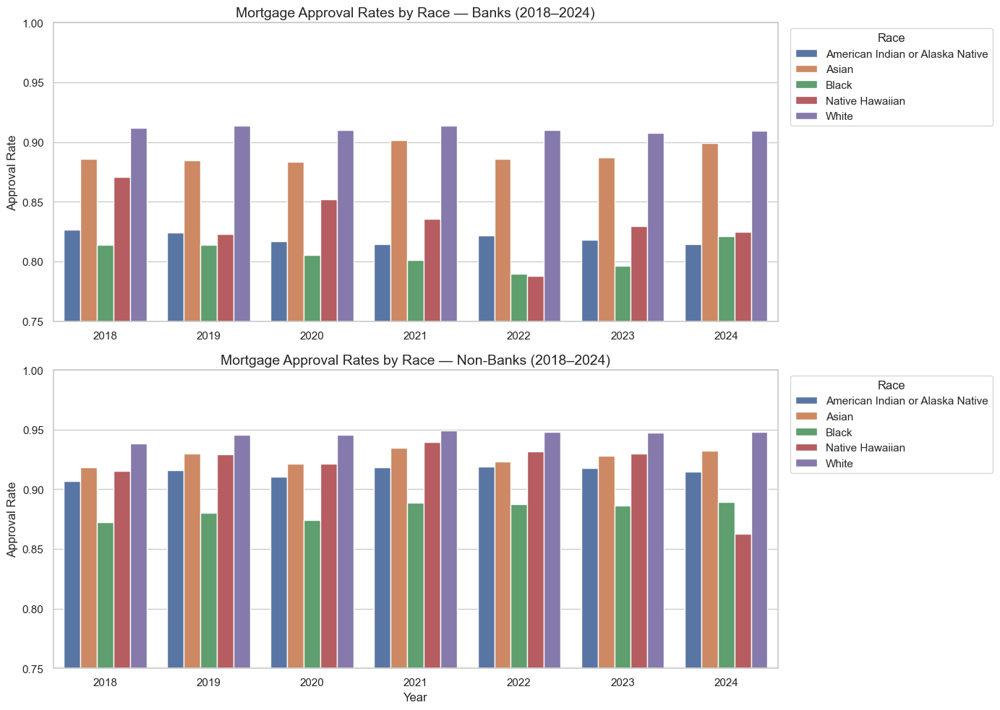

In [225]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set style
sns.set(style="whitegrid")

# Filter data
bank_df = final_df[final_df["lender_type"] == "Bank"]
nonbank_df = final_df[final_df["lender_type"] == "Non-Bank"]

# Create subplots
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharey=True)

# Plot for Banks
sns.barplot(
    data=bank_df,
    x="year",
    y="approved",  # ✅ use correct column
    hue="race",
    ax=axes[0]
)
axes[0].set_title("Mortgage Approval Rates by Race — Banks (2018–2024)", fontsize=14)
axes[0].set_ylabel("Approval Rate")
axes[0].set_xlabel("")
axes[0].legend(title="Race", bbox_to_anchor=(1.01, 1), loc="upper left")

# Plot for Non-Banks
sns.barplot(
    data=nonbank_df,
    x="year",
    y="approved",  # ✅ use correct column
    hue="race",
    ax=axes[1]
)
axes[1].set_title("Mortgage Approval Rates by Race — Non-Banks (2018–2024)", fontsize=14)
axes[1].set_ylabel("Approval Rate")
axes[1].set_xlabel("Year")
axes[1].legend(title="Race", bbox_to_anchor=(1.01, 1), loc="upper left")

# Consistent y-axis
for ax in axes:
    ax.set_ylim(0.75, 1.0)

plt.tight_layout()
plt.savefig("bank_vs_nonbank_chart.svg", format="svg")
plt.show()


In [224]:
print("Bank rows:", bank_df.shape[0])
print("Non-Bank rows:", nonbank_df.shape[0])
print("Races in Bank data:", bank_df["race"].unique())
print("Races in Non-Bank data:", nonbank_df["race"].unique())
print("Sample of Bank data:")
print(bank_df.head())


Bank rows: 35
Non-Bank rows: 35
Races in Bank data: ['American Indian or Alaska Native' 'Asian' 'Black' 'Native Hawaiian'
 'White']
Races in Non-Bank data: ['American Indian or Alaska Native' 'Asian' 'Black' 'Native Hawaiian'
 'White']
Sample of Bank data:
  lender_type                              race  approved  year
0        Bank  American Indian or Alaska Native  0.826721  2018
1        Bank                             Asian  0.886151  2018
2        Bank                             Black  0.814080  2018
3        Bank                   Native Hawaiian  0.871007  2018
4        Bank                             White  0.911851  2018


In [157]:
# import pandas as pd

# df = pd.read_csv("filtered_data_strict/2018_filtered_hmda.csv", nrows=5)
# print(df.columns.tolist())


In [174]:
## Elections

In [207]:
import pandas as pd
import os
import numpy as np

# === CONFIGURATION ===
hmda_folder = "filtered_data_strict"
output_file = "approval_by_year_and_election.csv"
bank_leis_file = "bloomberg_scraped_structured.csv"

# === LOAD BANK LEIs ===
def load_bank_leis():
    try:
        bloomberg = pd.read_csv(bank_leis_file)
        print(f"📋 Bloomberg file columns: {list(bloomberg.columns)}")
        
        # Try different possible column names for LEI
        lei_columns = ['lei', 'LEI', 'Lei', 'lei_number', 'legal_entity_identifier']
        lei_col = None
        
        for col in lei_columns:
            if col in bloomberg.columns:
                lei_col = col
                break
        
        if lei_col is None:
            print(f"❌ No LEI column found. Available columns: {list(bloomberg.columns)}")
            return set()
            
        bank_leis = set(bloomberg[lei_col].dropna().astype(str).unique())
        print(f"✅ Loaded {len(bank_leis)} bank LEIs from column '{lei_col}'")
        return bank_leis
    except Exception as e:
        print(f"❌ Error loading LEI file: {e}")
        return set()

# === LOAD ELECTION RESULTS ===
def load_election_results(filepath):
    """Load election results and ensure proper FIPS formatting"""
    print(f"📊 Loading election data from {filepath}")
    df = pd.read_csv(filepath)
    
    # Ensure county_fips is properly formatted as 5-digit string
    df["county_fips"] = df["county_fips"].astype(str).str.zfill(5)
    df["election_winner"] = df["per_gop"] > df["per_dem"]
    
    print(f"   📌 Loaded {len(df)} counties")
    print(f"   📌 Sample FIPS: {df['county_fips'].head().tolist()}")
    
    return df[["county_fips", "election_winner"]]

def create_fips_code(state_code, county_code):
    """Create FIPS code with robust error handling"""
    try:
        # Convert to string and handle various formats
        state_str = str(state_code).strip()
        county_str = str(county_code).strip()
        
        # Handle formats like 'TN47043.0' - extract just the numeric FIPS part
        if len(state_str) > 10:  # Likely contains full FIPS like 'TN47043.0'
            # Extract the 5-digit FIPS from the middle
            full_match = pd.Series([state_str]).str.extract(r'[A-Z]{2}(\d{5})')[0].iloc[0]
            if not pd.isna(full_match):
                return str(full_match)
        
        # Standard processing for separate state/county codes
        # Remove decimal points and extract numeric parts
        state_clean = state_str.replace('.0', '').strip()
        county_clean = county_str.replace('.0', '').strip()
        
        # Extract numeric parts if they exist
        state_match = pd.Series([state_clean]).str.extract(r'(\d+)')[0].iloc[0]
        county_match = pd.Series([county_clean]).str.extract(r'(\d+)')[0].iloc[0]
        
        if pd.isna(state_match) or pd.isna(county_match):
            return np.nan
            
        # Format as 5-digit FIPS
        fips = str(state_match).zfill(2) + str(county_match).zfill(3)
        return fips
        
    except Exception:
        return np.nan

def process_hmda_year(year, hmda_folder, bank_leis, election_df):
    """Process a single year of HMDA data"""
    file_path = os.path.join(hmda_folder, f"{year}_filtered_hmda.csv")
    
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}: File not found")
        return None

    print(f"\n📅 Processing {year}...")

    try:
        # Load with string dtypes to preserve formatting
        print(f"   📁 Reading file: {file_path}")
        df = pd.read_csv(file_path, dtype={
            "county_code": str, 
            "state_code": str,
            "lei": str
        }, low_memory=False)
        print(f"   📊 Loaded {len(df)} rows")
        print(f"   📋 Columns available: {list(df.columns)[:10]}...")  # Show first 10 columns
        
    except Exception as e:
        print(f"❌ Error reading {year} data: {e}")
        return None

    # Debug: Check raw data format
    print(f"   🔍 Raw state_code sample: {df['state_code'].dropna().head().tolist()}")
    print(f"   🔍 Raw county_code sample: {df['county_code'].dropna().head().tolist()}")

    # Create FIPS codes with progress indicator
    print(f"   🔧 Creating FIPS codes...")
    
    # Check the format of county_code to determine processing method
    sample_county = str(df['county_code'].dropna().iloc[0]) if len(df) > 0 else ""
    sample_state = str(df['state_code'].dropna().iloc[0]) if len(df) > 0 else ""
    
    print(f"   🔍 Sample state_code: '{sample_state}', county_code: '{sample_county}'")
    
    # Check if county_code already contains full FIPS (like '47165')
    if len(sample_county.replace('.0', '')) == 5 and sample_county.replace('.0', '').isdigit():
        print(f"   🔍 Detected county_code contains full FIPS")
        # county_code already has full FIPS, just clean it
        df["county_fips"] = df["county_code"].astype(str).str.replace('.0', '', regex=False)
        
    # Check if we have the consolidated format like 'TN47043.0' in state_code
    elif len(sample_state) > 5:  # Likely format like 'TN47043.0'
        print(f"   🔍 Detected consolidated FIPS format in state_code: {sample_state}")
        # Extract 5-digit FIPS from strings like 'TN47043.0'
        df["county_fips"] = df["state_code"].astype(str).str.extract(r'[A-Z]{2}(\d{5})')[0]
        # Remove .0 suffix if present
        df["county_fips"] = df["county_fips"].astype(str).str.replace('.0', '', regex=False)
        
    else:
        print(f"   🔍 Using separate state/county codes - building FIPS from parts")
        # Clean the codes and extract numeric parts
        df["state_clean"] = df["state_code"].astype(str).str.replace('.0', '', regex=False).str.extract(r'(\d+)')[0]
        df["county_clean"] = df["county_code"].astype(str).str.replace('.0', '', regex=False).str.extract(r'(\d+)')[0]
        
        # Create FIPS
        df["county_fips"] = df["state_clean"].str.zfill(2) + df["county_clean"].str.zfill(3)
        
        # Clean up temporary columns
        df.drop(["state_clean", "county_clean"], axis=1, inplace=True)
    
    # Remove rows with invalid FIPS
    initial_count = len(df)
    df = df.dropna(subset=["county_fips"])
    # Remove any non-5-digit FIPS
    df = df[df["county_fips"].str.len() == 5]
    df = df[df["county_fips"].str.match(r'^\d{5}$')]
    
    print(f"   📊 Valid FIPS codes: {len(df)} of {initial_count} rows ({len(df)/initial_count*100:.1f}%)")
    
    if len(df) == 0:
        print(f"   ❌ No valid FIPS codes created for {year}")
        return None
        
    print(f"   📊 Sample HMDA FIPS: {df['county_fips'].unique()[:5].tolist()}")

    # Handle race column (varies by year)
    race_col = "applicant_race_1" if year == 2024 else "applicant_race-1"
    if race_col not in df.columns:
        print(f"⚠️ Skipping {year}: Missing race column {race_col}")
        return None

    # Map race codes
    df[race_col] = pd.to_numeric(df[race_col], errors="coerce")
    race_map = {
        1: "White",
        2: "Black", 
        3: "Asian",
        4: "Native Hawaiian",
        5: "American Indian or Alaska Native"
    }
    df["race"] = df[race_col].map(race_map)
    print(f"   🔍 Race distribution:\n{df['race'].value_counts(dropna=False).to_dict()}")

    # Filter for approvals/denials only
    if "action_taken" not in df.columns:
        print(f"⚠️ Skipping {year}: Missing 'action_taken'")
        return None

    df = df[df["action_taken"].isin([1, 2])].copy()
    print(f"   🧮 Approval/denial applications: {len(df)}")

    # Determine lender type
    if "lei" in df.columns and len(bank_leis) > 0:
        df["lei"] = df["lei"].astype(str)
        df["lender_type"] = df["lei"].apply(lambda x: "Bank" if x in bank_leis else "Non-Bank")
        print(f"   🏦 Using LEI for lender classification")
    elif "purchaser_type" in df.columns:
        print(f"   ⚠️ {year} missing 'lei' column, using purchaser_type fallback")
        df["lender_type"] = df["purchaser_type"].apply(lambda x: "Bank" if x == 6 else "Non-Bank")
    else:
        print(f"   ❌ {year}: No lender classification possible")
        return None

    print(f"   🏦 Lender type distribution: {df['lender_type'].value_counts().to_dict()}")

    # Merge with election data
    print(f"   📊 Merging with election data...")
    print(f"   📊 Election FIPS sample: {election_df['county_fips'].head().tolist()}")
    
    # Check overlap before merge
    hmda_fips = set(df['county_fips'].unique())
    election_fips = set(election_df['county_fips'].unique())
    overlap = hmda_fips.intersection(election_fips)
    print(f"   🎯 FIPS overlap: {len(overlap)} of {len(hmda_fips)} HMDA counties")
    
    if len(overlap) < len(hmda_fips) * 0.5:  # Less than 50% match
        print(f"   ⚠️ Low match rate! Sample unmatched HMDA FIPS: {list(hmda_fips - election_fips)[:5]}")
        print(f"   ⚠️ Sample election FIPS: {list(election_fips)[:5]}")

    df = df.merge(election_df, on="county_fips", how="left")
    df["election_lean"] = df["election_winner"].map({True: "Trump", False: "Biden"})
    
    matched_count = df["election_lean"].notna().sum()
    print(f"   📌 Matched election data: {matched_count} of {len(df)} rows ({matched_count/len(df)*100:.1f}%)")

    # Clean data for grouping
    df = df.dropna(subset=["race", "lender_type"])
    df["election_lean"] = df["election_lean"].fillna("Unknown")
    df["year"] = year

    # Group and summarize
    grouped = df.groupby(
        ["year", "election_lean", "lender_type", "race"]
    ).size().reset_index(name="total_approved")
    
    print(f"   📊 Final grouped data shape: {grouped.shape}")
    print(f"   📊 Sample grouped data:\n{grouped.head()}")

    return grouped

# === MAIN EXECUTION ===
def main():
    # Load supporting data
    bank_leis = load_bank_leis()
    
    print("\n📊 Loading election results...")
    results_2016 = load_election_results("election_results/2016_US_County_Level_Presidential_Results.csv")
    results_2020 = load_election_results("election_results/2020_US_County_Level_Presidential_Results.csv")

    # Map years to election results (elections happen late in year)
    election_map = {
        2018: results_2016,  # Pre-2020 election
        2019: results_2016,  # Pre-2020 election  
        2020: results_2016,  # 2020 election happened late in year
        2021: results_2020,  # Post-2020 election
        2022: results_2020,  # Post-2020 election
        2023: results_2020,  # Post-2020 election
        2024: results_2020,  # Post-2020 election
    }

    # Process each year
    all_results = []
    
    for year in range(2018, 2025):
        election_df = election_map[year]
        result = process_hmda_year(year, hmda_folder, bank_leis, election_df)
        
        if result is not None:
            all_results.append(result)
        else:
            print(f"❌ Failed to process {year}")

    # Save results
    if all_results:
        final_df = pd.concat(all_results, ignore_index=True)
        final_df.to_csv(output_file, index=False)
        print(f"\n✅ Successfully saved {len(final_df)} rows to: {output_file}")
        print(f"📊 Final summary by year:")
        print(final_df.groupby('year')['total_approved'].sum())
    else:
        print("\n🚨 No usable data found - check your input files and data quality")

if __name__ == "__main__":
    main()

📋 Bloomberg file columns: ['lei_number', 'url', 'Legal Name', 'Language Code', 'Other Entity Names', 'Legal Address (English)', 'Headquarters Address (English)', 'Legal Jurisdiction Country', 'Legal Jurisdiction Region', 'Registration Authority', 'Registration Authority ID', 'Registration Authority Entity ID', 'Entity Legal Form Code', 'Entity Category', 'Entity Status', 'Entity Creation Date']
✅ Loaded 4909 bank LEIs from column 'lei_number'

📊 Loading election results...
📊 Loading election data from election_results/2016_US_County_Level_Presidential_Results.csv
   📌 Loaded 3141 counties
   📌 Sample FIPS: ['02013', '02016', '02020', '02050', '02060']
📊 Loading election data from election_results/2020_US_County_Level_Presidential_Results.csv
   📌 Loaded 3152 counties
   📌 Sample FIPS: ['01001', '01003', '01005', '01007', '01009']

📅 Processing 2018...
   📁 Reading file: filtered_data_strict/2018_filtered_hmda.csv
   📊 Loaded 1363646 rows
   📋 Columns available: ['activity_year', 'lei',

In [211]:
import pandas as pd
import numpy as np
from pathlib import Path
import os

# === CONFIGURATION ===
hmda_folder = "filtered_data_strict"
output_dir = "processed_data"

# Create output directory
Path(output_dir).mkdir(exist_ok=True)

def load_raw_hmda_data():
    """Load raw HMDA data to calculate actual approval/denial rates"""
    print("📊 Loading raw HMDA data to calculate approval/denial rates...")
    
    all_data = []
    
    # Election mapping (same as your original script)
    election_map = {
        2018: "election_results/2016_US_County_Level_Presidential_Results.csv",
        2019: "election_results/2016_US_County_Level_Presidential_Results.csv",
        2020: "election_results/2016_US_County_Level_Presidential_Results.csv",
        2021: "election_results/2020_US_County_Level_Presidential_Results.csv", 
        2022: "election_results/2020_US_County_Level_Presidential_Results.csv",
        2023: "election_results/2020_US_County_Level_Presidential_Results.csv",
        2024: "election_results/2020_US_County_Level_Presidential_Results.csv",
    }
    
    # Load election results
    election_data = {}
    for year, filepath in election_map.items():
        if filepath not in election_data:
            df = pd.read_csv(filepath)
            df["county_fips"] = df["county_fips"].astype(str).str.zfill(5)
            df["election_winner"] = df["per_gop"] > df["per_dem"]
            df["election_lean"] = df["election_winner"].map({True: "Trump", False: "Biden"})
            election_data[filepath] = df[["county_fips", "election_lean"]]
    
    for year in range(2018, 2025):
        file_path = os.path.join(hmda_folder, f"{year}_filtered_hmda.csv")
        if not os.path.exists(file_path):
            print(f"❌ Skipping {year}: File not found")
            continue
            
        print(f"📅 Processing {year}...")
        
        try:
            df = pd.read_csv(file_path, dtype={"county_code": str, "state_code": str}, low_memory=False)
            
            # Create FIPS codes (simplified version of your logic)
            sample_county = str(df['county_code'].dropna().iloc[0]) if len(df) > 0 else ""
            
            if len(sample_county.replace('.0', '')) == 5 and sample_county.replace('.0', '').isdigit():
                df["county_fips"] = df["county_code"].astype(str).str.replace('.0', '', regex=False)
            else:
                # Handle other formats as needed
                df["county_fips"] = df["county_code"].astype(str).str.replace('.0', '', regex=False)
            
            # Filter valid FIPS
            df = df.dropna(subset=["county_fips"])
            df = df[df["county_fips"].str.len() == 5]
            df = df[df["county_fips"].str.match(r'^\d{5}$')]
            
            # Handle race column
            race_col = "applicant_race_1" if year == 2024 else "applicant_race-1"
            if race_col not in df.columns:
                print(f"⚠️ Skipping {year}: Missing race column")
                continue
                
            df[race_col] = pd.to_numeric(df[race_col], errors="coerce")
            race_map = {
                1: "White",
                2: "Black", 
                3: "Asian",
                4: "Native Hawaiian",
                5: "American Indian or Alaska Native"
            }
            df["race"] = df[race_col].map(race_map)
            
            # Filter for applications with decisions (approved=1, denied=2)
            if "action_taken" not in df.columns:
                continue
                
            df = df[df["action_taken"].isin([1, 2])].copy()
            df["approved"] = (df["action_taken"] == 1).astype(int)
            df["denied"] = (df["action_taken"] == 2).astype(int)
            
            # Add election data
            election_year_data = election_data[election_map[year]]
            df = df.merge(election_year_data, on="county_fips", how="left")
            df["election_lean"] = df["election_lean"].fillna("Unknown")
            
            # Clean and add year
            df = df.dropna(subset=["race"])
            df["year"] = year
            
            # Keep relevant columns
            df_clean = df[["year", "county_fips", "election_lean", "race", "approved", "denied"]].copy()
            all_data.append(df_clean)
            
            print(f"   ✅ Processed {len(df_clean)} applications")
            
        except Exception as e:
            print(f"❌ Error processing {year}: {e}")
            continue
    
    if all_data:
        combined_df = pd.concat(all_data, ignore_index=True)
        print(f"\n✅ Combined data: {len(combined_df)} total applications")
        return combined_df
    else:
        return None

def calculate_approval_denial_rates(df):
    """Calculate approval and denial rates by race and political lean"""
    print("\n🔢 Calculating approval and denial rates...")
    
    # Filter out Unknown political lean for cleaner analysis
    df_clean = df[df['election_lean'].isin(['Biden', 'Trump'])].copy()
    df_clean['political_lean'] = df_clean['election_lean'].map({
        'Biden': 'Democratic Counties',
        'Trump': 'Republican Counties'
    })
    
    # Group by race and political lean
    rates_by_race = df_clean.groupby(['race', 'political_lean']).agg({
        'approved': 'sum',
        'denied': 'sum'
    }).reset_index()
    
    # Calculate total applications and rates
    rates_by_race['total_applications'] = rates_by_race['approved'] + rates_by_race['denied']
    rates_by_race['approval_rate'] = (rates_by_race['approved'] / rates_by_race['total_applications'] * 100).round(2)
    rates_by_race['denial_rate'] = (rates_by_race['denied'] / rates_by_race['total_applications'] * 100).round(2)
    
    # Calculate yearly rates for time series
    yearly_rates = df_clean.groupby(['year', 'race', 'political_lean']).agg({
        'approved': 'sum',
        'denied': 'sum'
    }).reset_index()
    
    yearly_rates['total_applications'] = yearly_rates['approved'] + yearly_rates['denied']
    yearly_rates['approval_rate'] = (yearly_rates['approved'] / yearly_rates['total_applications'] * 100)
    
    print("📊 Sample approval rates by race and political lean:")
    print(rates_by_race.head(10))
    
    return df_clean, rates_by_race, yearly_rates

def create_detailed_summary(rates_by_race):
    """Create detailed summary statistics"""
    print("\n📊 Creating detailed summary statistics...")
    
    # Pivot for easier analysis
    summary_pivot = rates_by_race.pivot(index='race', columns='political_lean', 
                                       values=['approval_rate', 'denial_rate', 'total_applications'])
    
    # Flatten column names
    summary_pivot.columns = [f"{col[1]}_{col[0]}" for col in summary_pivot.columns]
    
    # Calculate differences
    if 'Democratic Counties_approval_rate' in summary_pivot.columns and 'Republican Counties_approval_rate' in summary_pivot.columns:
        summary_pivot['Approval_Rate_Difference'] = (summary_pivot['Democratic Counties_approval_rate'] - 
                                                    summary_pivot['Republican Counties_approval_rate'])
    
    print("📋 Detailed Summary by Race:")
    print(summary_pivot.round(2))
    
    return summary_pivot

def save_processed_data(df_clean, rates_by_race, yearly_rates, summary_pivot, output_dir):
    """Save all processed data to files"""
    print(f"\n💾 Saving processed data to {output_dir}...")
    
    # Save raw cleaned data
    df_clean.to_csv(f"{output_dir}/cleaned_raw_data.csv", index=False)
    print(f"   ✅ Saved: cleaned_raw_data.csv")
    
    # Save aggregated rates by race
    rates_by_race.to_csv(f"{output_dir}/rates_by_race.csv", index=False)
    print(f"   ✅ Saved: rates_by_race.csv")
    
    # Save yearly rates for time series
    yearly_rates.to_csv(f"{output_dir}/yearly_rates.csv", index=False)
    print(f"   ✅ Saved: yearly_rates.csv")
    
    # Save detailed summary
    summary_pivot.round(2).to_csv(f"{output_dir}/detailed_summary.csv")
    print(f"   ✅ Saved: detailed_summary.csv")

def main():
    """Main execution function"""
    print("🏠 HMDA Data Processing Script")
    print("=" * 50)
    
    # Load raw data to calculate actual rates
    df = load_raw_hmda_data()
    if df is None:
        print("❌ No data could be loaded")
        return
    
    # Calculate approval and denial rates
    df_clean, rates_by_race, yearly_rates = calculate_approval_denial_rates(df)
    
    # Create summary statistics
    summary = create_detailed_summary(rates_by_race)
    
    # Save all processed data
    save_processed_data(df_clean, rates_by_race, yearly_rates, summary, output_dir)
    
    print(f"\n✅ Data processing complete! Processed files saved in '{output_dir}' folder:")
    print("  📊 Data files:")
    print("     - cleaned_raw_data.csv (raw application-level data)")
    print("     - rates_by_race.csv (aggregated rates by race and political lean)")
    print("     - yearly_rates.csv (rates by year for time series)")
    print("     - detailed_summary.csv (summary statistics)")
    print("\n🎨 Run the plotting script next to create visualizations!")

if __name__ == "__main__":
    main()

🏠 HMDA Data Processing Script
📊 Loading raw HMDA data to calculate approval/denial rates...
📅 Processing 2018...
   ✅ Processed 1244139 applications
📅 Processing 2019...
   ✅ Processed 997435 applications
📅 Processing 2020...
   ✅ Processed 1083256 applications
📅 Processing 2021...
   ✅ Processed 1211955 applications
📅 Processing 2022...
   ✅ Processed 1085954 applications
📅 Processing 2023...
   ✅ Processed 864278 applications
📅 Processing 2024...
   ✅ Processed 879781 applications

✅ Combined data: 7366798 total applications

🔢 Calculating approval and denial rates...
📊 Sample approval rates by race and political lean:
                               race       political_lean  approved  denied  \
0  American Indian or Alaska Native  Democratic Counties   2996021   76926   
1  American Indian or Alaska Native  Republican Counties   2977045   88311   
2                             Asian  Democratic Counties    347009   12699   
3                             Asian  Republican Counties   

🎨 HMDA Plotting Script
📊 Loading processed data...
   ✅ Loaded rates_by_race: 10 rows
   ✅ Loaded yearly_rates: 70 rows
   ✅ Loaded summary_pivot: 5 rows

🎨 Creating all plots...

📈 Creating approval rate plots by race...


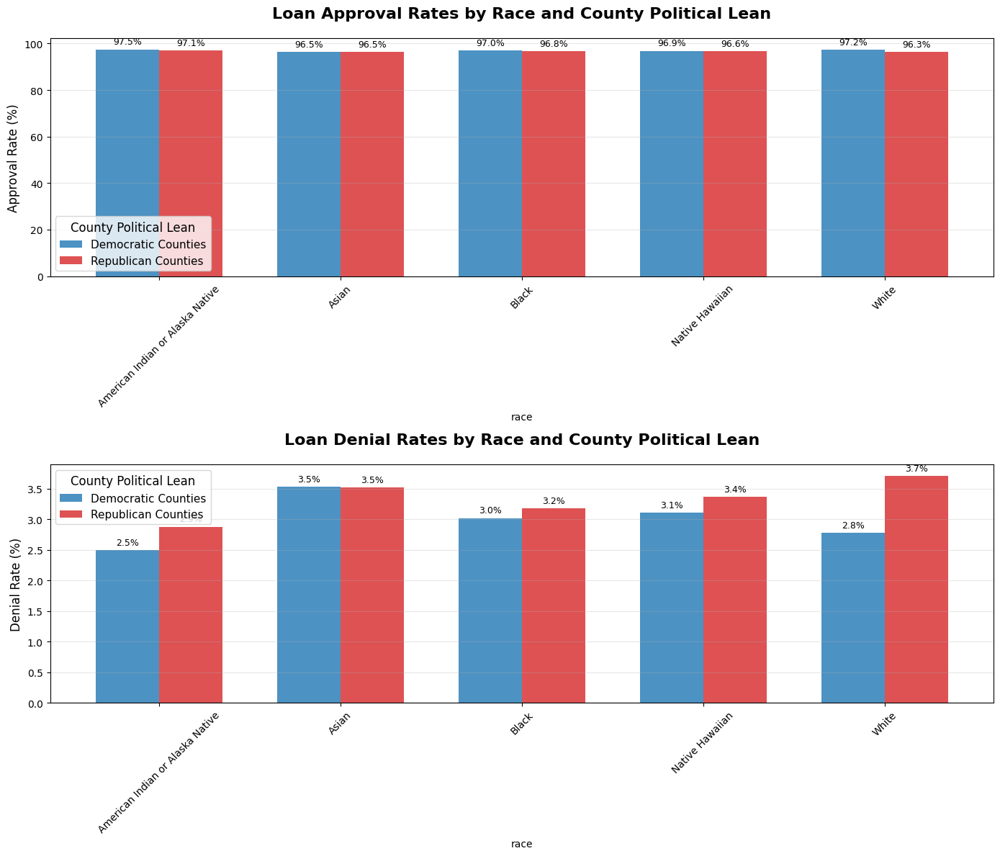


📈 Creating approval rate difference analysis...


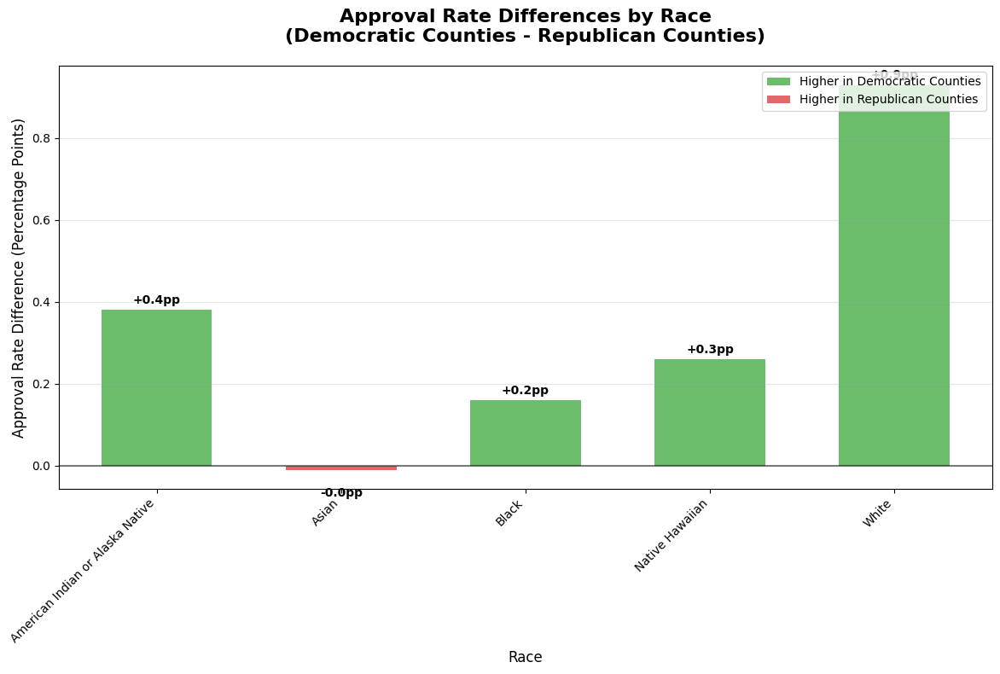


📈 Creating time series by race...


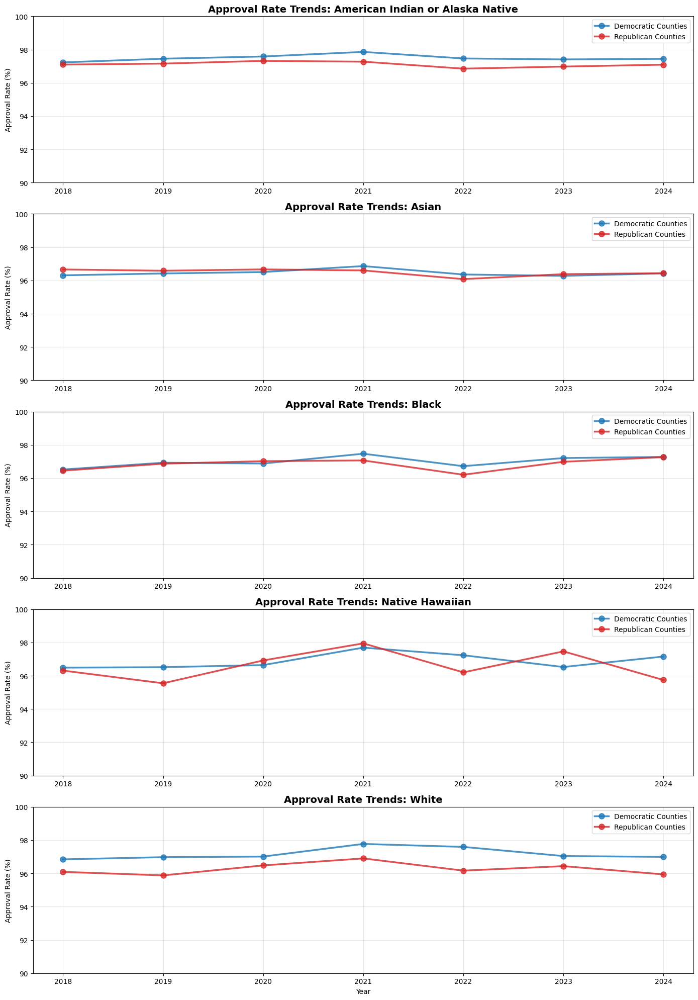


✅ Plotting complete! Check the 'plots' folder for:
  📊 PNG files (high-resolution raster images):
     - approval_denial_rates_by_race.png
     - approval_rate_differences.png
     - approval_trends_by_race_over_time.png
  🎨 SVG files (scalable vector graphics):
     - approval_denial_rates_by_race.svg
     - approval_rate_differences.svg
     - approval_trends_by_race_over_time.svg


In [212]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path

# === CONFIGURATION ===
processed_data_dir = "processed_data"
output_dir = "plots"

# Create output directory
Path(output_dir).mkdir(exist_ok=True)

# Set up plotting style
plt.style.use('default')
sns.set_palette("husl")

def load_processed_data():
    """Load previously processed data"""
    print("📊 Loading processed data...")
    
    try:
        rates_by_race = pd.read_csv(f"{processed_data_dir}/rates_by_race.csv")
        yearly_rates = pd.read_csv(f"{processed_data_dir}/yearly_rates.csv")
        summary_pivot = pd.read_csv(f"{processed_data_dir}/detailed_summary.csv", index_col=0)
        
        print(f"   ✅ Loaded rates_by_race: {len(rates_by_race)} rows")
        print(f"   ✅ Loaded yearly_rates: {len(yearly_rates)} rows")
        print(f"   ✅ Loaded summary_pivot: {len(summary_pivot)} rows")
        
        return rates_by_race, yearly_rates, summary_pivot
        
    except FileNotFoundError as e:
        print(f"❌ Error loading processed data: {e}")
        print("❌ Please run the data processing script first!")
        return None, None, None

def plot_approval_rates_by_race(rates_by_race, output_dir):
    """Plot approval rates by race and political lean"""
    print("\n📈 Creating approval rate plots by race...")
    
    # Pivot data for plotting
    approval_pivot = rates_by_race.pivot(index='race', columns='political_lean', values='approval_rate').fillna(0)
    denial_pivot = rates_by_race.pivot(index='race', columns='political_lean', values='denial_rate').fillna(0)
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))
    
    # Plot 1: Approval Rates
    approval_pivot.plot(kind='bar', ax=ax1, color=['#1f77b4', '#d62728'], alpha=0.8, width=0.7)
    ax1.set_title('Loan Approval Rates by Race and County Political Lean', fontsize=16, fontweight='bold', pad=20)
    ax1.set_ylabel('Approval Rate (%)', fontsize=12)
    ax1.tick_params(axis='x', rotation=45)
    ax1.legend(title='County Political Lean', title_fontsize=12, fontsize=11)
    ax1.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on approval rate bars
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.1f%%', fontsize=9, rotation=0, padding=3)
    
    # Plot 2: Denial Rates  
    denial_pivot.plot(kind='bar', ax=ax2, color=['#1f77b4', '#d62728'], alpha=0.8, width=0.7)
    ax2.set_title('Loan Denial Rates by Race and County Political Lean', fontsize=16, fontweight='bold', pad=20)
    ax2.set_ylabel('Denial Rate (%)', fontsize=12)
    ax2.tick_params(axis='x', rotation=45)
    ax2.legend(title='County Political Lean', title_fontsize=12, fontsize=11)
    ax2.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on denial rate bars
    for container in ax2.containers:
        ax2.bar_label(container, fmt='%.1f%%', fontsize=9, rotation=0, padding=3)
    
    plt.tight_layout()
    # Save both formats
    plt.savefig(f"{output_dir}/approval_denial_rates_by_race.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/approval_denial_rates_by_race.svg", bbox_inches='tight')
    plt.show()
    
    return approval_pivot, denial_pivot

def plot_approval_rate_differences(rates_by_race, output_dir):
    """Plot the difference in approval rates between political leans"""
    print("\n📈 Creating approval rate difference analysis...")
    
    # Calculate differences
    approval_pivot = rates_by_race.pivot(index='race', columns='political_lean', values='approval_rate').fillna(0)
    
    # Calculate the difference (Democratic - Republican)
    if 'Democratic Counties' in approval_pivot.columns and 'Republican Counties' in approval_pivot.columns:
        approval_pivot['Difference (Dem - Rep)'] = (approval_pivot['Democratic Counties'] - 
                                                   approval_pivot['Republican Counties'])
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot the differences
    colors = ['#2ca02c' if x > 0 else '#d62728' for x in approval_pivot['Difference (Dem - Rep)']]
    bars = ax.bar(range(len(approval_pivot.index)), approval_pivot['Difference (Dem - Rep)'], 
                  color=colors, alpha=0.7, width=0.6)
    
    ax.set_title('Approval Rate Differences by Race\n(Democratic Counties - Republican Counties)', 
                fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel('Approval Rate Difference (Percentage Points)', fontsize=12)
    ax.set_xlabel('Race', fontsize=12)
    ax.set_xticks(range(len(approval_pivot.index)))
    ax.set_xticklabels(approval_pivot.index, rotation=45, ha='right')
    ax.axhline(y=0, color='black', linestyle='-', alpha=0.5)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels
    for i, bar in enumerate(bars):
        height = bar.get_height()
        ax.annotate(f'{height:+.1f}pp',
                   xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 3 if height > 0 else -15), 
                   textcoords="offset points",
                   ha='center', va='bottom' if height > 0 else 'top', 
                   fontweight='bold', fontsize=10)
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='#2ca02c', alpha=0.7, label='Higher in Democratic Counties'),
                      Patch(facecolor='#d62728', alpha=0.7, label='Higher in Republican Counties')]
    ax.legend(handles=legend_elements, loc='upper right')
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/approval_rate_differences.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/approval_rate_differences.svg", bbox_inches='tight')
    plt.show()

def plot_time_series_by_race(yearly_rates, output_dir):
    """Plot approval rate trends over time by race"""
    print("\n📈 Creating time series by race...")
    
    # Create subplots for each race
    races = sorted(yearly_rates['race'].unique())
    fig, axes = plt.subplots(len(races), 1, figsize=(14, 4*len(races)))
    
    if len(races) == 1:
        axes = [axes]
    
    for i, race in enumerate(races):
        race_data = yearly_rates[yearly_rates['race'] == race]
        
        for political_lean in race_data['political_lean'].unique():
            data = race_data[race_data['political_lean'] == political_lean]
            color = '#1f77b4' if 'Democratic' in political_lean else '#d62728'
            axes[i].plot(data['year'], data['approval_rate'], 
                        marker='o', linewidth=2.5, markersize=8, 
                        label=political_lean, color=color, alpha=0.8)
        
        axes[i].set_title(f'Approval Rate Trends: {race}', fontsize=14, fontweight='bold')
        axes[i].set_ylabel('Approval Rate (%)')
        axes[i].legend()
        axes[i].grid(True, alpha=0.3)
        axes[i].set_ylim(90, 100)  # Start y-axis at 90%
    
    axes[-1].set_xlabel('Year')
    plt.tight_layout()
    plt.savefig(f"{output_dir}/approval_trends_by_race_over_time.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/approval_trends_by_race_over_time.svg", bbox_inches='tight')
    plt.show()

def create_all_plots(rates_by_race, yearly_rates, output_dir):
    """Create all plots"""
    print("\n🎨 Creating all plots...")
    
    # Create all plots
    approval_pivot, denial_pivot = plot_approval_rates_by_race(rates_by_race, output_dir)
    plot_approval_rate_differences(rates_by_race, output_dir) 
    plot_time_series_by_race(yearly_rates, output_dir)
    
    return approval_pivot, denial_pivot

def main():
    """Main execution function"""
    print("🎨 HMDA Plotting Script")
    print("=" * 40)
    
    # Load processed data
    rates_by_race, yearly_rates, summary_pivot = load_processed_data()
    if rates_by_race is None:
        return
    
    # Create all plots
    approval_pivot, denial_pivot = create_all_plots(rates_by_race, yearly_rates, output_dir)
    
    print(f"\n✅ Plotting complete! Check the '{output_dir}' folder for:")
    print("  📊 PNG files (high-resolution raster images):")
    print("     - approval_denial_rates_by_race.png")
    print("     - approval_rate_differences.png")
    print("     - approval_trends_by_race_over_time.png")
    print("  🎨 SVG files (scalable vector graphics):")
    print("     - approval_denial_rates_by_race.svg") 
    print("     - approval_rate_differences.svg")
    print("     - approval_trends_by_race_over_time.svg")

if __name__ == "__main__":
    main()

🏛️ Presidential Administration Analysis: Loan Approval Rates in Democratic Counties
📊 Loading and preparing data for presidential analysis...
   ✅ Loaded data: 7354690 applications
   ✅ Filtered to Democratic counties: 3955492 applications
   📅 Years available: [2018, 2019, 2020, 2021, 2022, 2023, 2024]
   🏛️ Presidential periods: {'Biden (Democrat)': 4033892, 'Trump (Republican)': 3320798}

🔢 Calculating approval rates by race and presidential administration...
📊 Approval rates by race and president:
                               race           president  approval_rate  \
0  American Indian or Alaska Native    Biden (Democrat)          97.57   
1  American Indian or Alaska Native  Trump (Republican)          97.41   
2                             Asian    Biden (Democrat)          96.51   
3                             Asian  Trump (Republican)          96.41   
4                             Black    Biden (Democrat)          97.16   
5                             Black  Trump (Repub

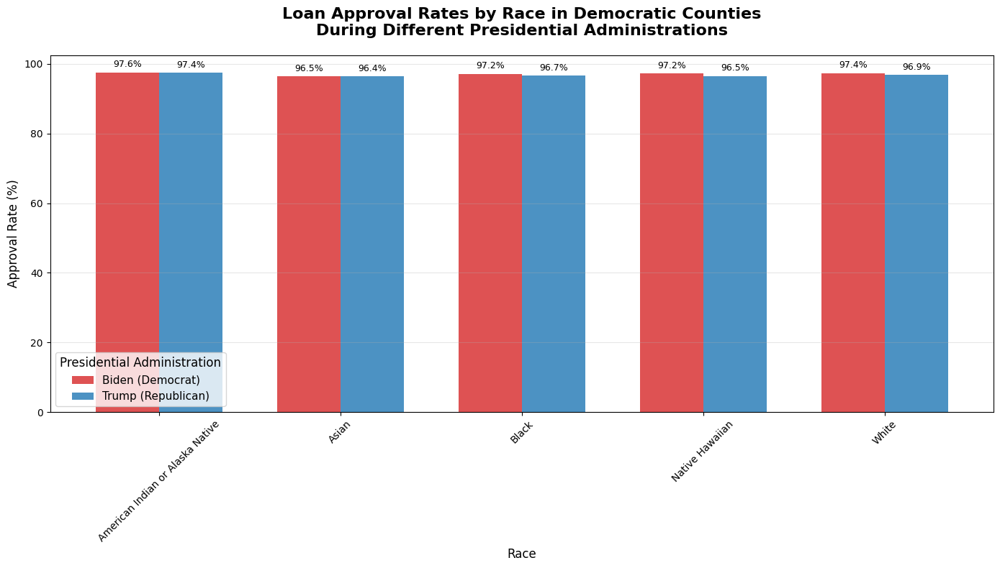


📈 Creating presidential approval rate difference analysis...


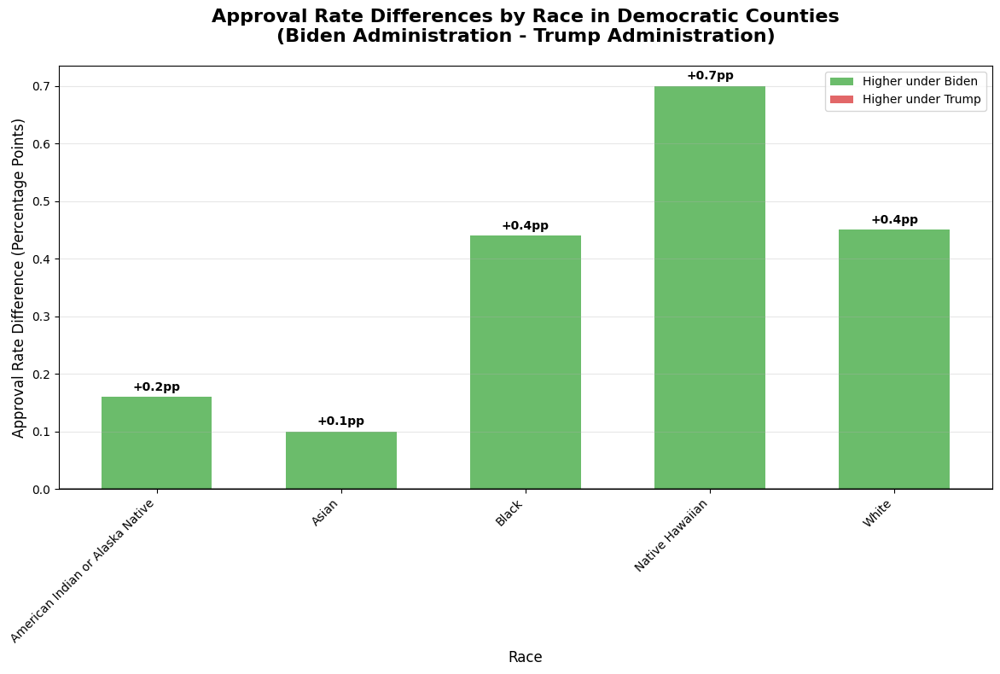


📈 Creating yearly trends with presidential transition...


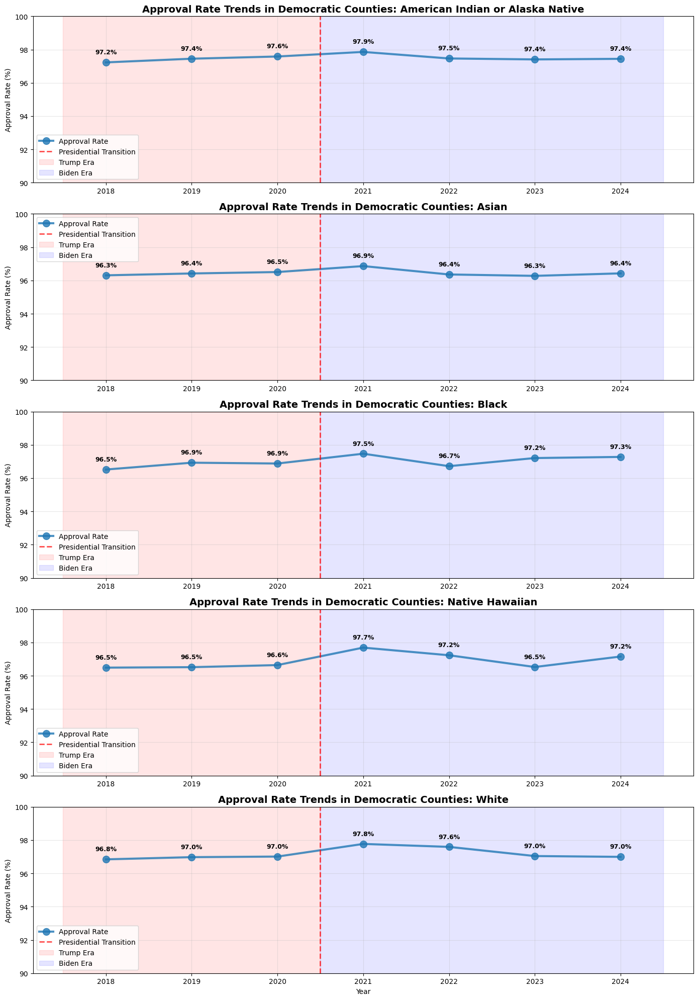


📋 Creating summary table...
📊 Summary by Race and Presidential Administration:
                                  Biden (Democrat)_approval_rate  \
race                                                               
American Indian or Alaska Native                           97.57   
Asian                                                      96.51   
Black                                                      97.16   
Native Hawaiian                                            97.23   
White                                                      97.38   

                                  Trump (Republican)_approval_rate  \
race                                                                 
American Indian or Alaska Native                             97.41   
Asian                                                        96.41   
Black                                                        96.72   
Native Hawaiian                                              96.53   
White                  

In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path

# === CONFIGURATION ===
processed_data_dir = "processed_data"
output_dir = "plots"

# Create output directory
Path(output_dir).mkdir(exist_ok=True)

# Set up plotting style
plt.style.use('default')
sns.set_palette("husl")

def load_and_prepare_data():
    """Load processed data and prepare for presidential analysis"""
    print("📊 Loading and preparing data for presidential analysis...")
    
    try:
        # Load the cleaned raw data with year information
        df = pd.read_csv(f"{processed_data_dir}/cleaned_raw_data.csv")
        
        print(f"   ✅ Loaded data: {len(df)} applications")
        
        # Define presidential administrations
        # Trump: 2017-2021 (but our data starts 2018)
        # Biden: 2021-present
        def get_president(year):
            if year <= 2020:
                return "Trump (Republican)"
            else:
                return "Biden (Democrat)"
        
        df['president'] = df['year'].apply(get_president)
        
        # Filter for Democratic counties only
        df_dem_counties = df[df['election_lean'] == 'Biden'].copy()
        df_dem_counties['political_lean'] = 'Democratic Counties'
        
        print(f"   ✅ Filtered to Democratic counties: {len(df_dem_counties)} applications")
        print(f"   📅 Years available: {sorted(df['year'].unique())}")
        print(f"   🏛️ Presidential periods: {df['president'].value_counts().to_dict()}")
        
        return df_dem_counties
        
    except FileNotFoundError as e:
        print(f"❌ Error loading data: {e}")
        print("❌ Please run the data processing script first!")
        return None

def calculate_rates_by_president(df):
    """Calculate approval rates by race and presidential administration"""
    print("\n🔢 Calculating approval rates by race and presidential administration...")
    
    # Group by race and president
    rates_by_president = df.groupby(['race', 'president']).agg({
        'approved': 'sum',
        'denied': 'sum'
    }).reset_index()
    
    # Calculate total applications and rates
    rates_by_president['total_applications'] = rates_by_president['approved'] + rates_by_president['denied']
    rates_by_president['approval_rate'] = (rates_by_president['approved'] / rates_by_president['total_applications'] * 100).round(2)
    rates_by_president['denial_rate'] = (rates_by_president['denied'] / rates_by_president['total_applications'] * 100).round(2)
    
    print("📊 Approval rates by race and president:")
    print(rates_by_president[['race', 'president', 'approval_rate', 'total_applications']])
    
    return rates_by_president

def plot_approval_rates_by_president(rates_by_president, output_dir):
    """Plot approval rates by race and presidential administration"""
    print("\n📈 Creating approval rate plots by presidential administration...")
    
    # Pivot data for plotting
    approval_pivot = rates_by_president.pivot(index='race', columns='president', values='approval_rate').fillna(0)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Plot bars
    approval_pivot.plot(kind='bar', ax=ax, color=['#d62728', '#1f77b4'], alpha=0.8, width=0.7)
    
    ax.set_title('Loan Approval Rates by Race in Democratic Counties\nDuring Different Presidential Administrations', 
                fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel('Approval Rate (%)', fontsize=12)
    ax.set_xlabel('Race', fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.legend(title='Presidential Administration', title_fontsize=12, fontsize=11)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', fontsize=9, rotation=0, padding=3)
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/approval_rates_by_president_dem_counties.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/approval_rates_by_president_dem_counties.svg", bbox_inches='tight')
    plt.show()
    
    return approval_pivot

def plot_approval_rate_differences_by_president(rates_by_president, output_dir):
    """Plot the difference in approval rates between presidential administrations"""
    print("\n📈 Creating presidential approval rate difference analysis...")
    
    # Calculate differences
    approval_pivot = rates_by_president.pivot(index='race', columns='president', values='approval_rate').fillna(0)
    
    # Calculate the difference (Biden - Trump)
    if 'Biden (Democrat)' in approval_pivot.columns and 'Trump (Republican)' in approval_pivot.columns:
        approval_pivot['Difference (Biden - Trump)'] = (approval_pivot['Biden (Democrat)'] - 
                                                       approval_pivot['Trump (Republican)'])
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot the differences
    colors = ['#2ca02c' if x > 0 else '#d62728' for x in approval_pivot['Difference (Biden - Trump)']]
    bars = ax.bar(range(len(approval_pivot.index)), approval_pivot['Difference (Biden - Trump)'], 
                  color=colors, alpha=0.7, width=0.6)
    
    ax.set_title('Approval Rate Differences by Race in Democratic Counties\n(Biden Administration - Trump Administration)', 
                fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel('Approval Rate Difference (Percentage Points)', fontsize=12)
    ax.set_xlabel('Race', fontsize=12)
    ax.set_xticks(range(len(approval_pivot.index)))
    ax.set_xticklabels(approval_pivot.index, rotation=45, ha='right')
    ax.axhline(y=0, color='black', linestyle='-', alpha=0.5)
    ax.grid(True, alpha=0.3, axis='y')
    
    # Add value labels
    for i, bar in enumerate(bars):
        height = bar.get_height()
        ax.annotate(f'{height:+.1f}pp',
                   xy=(bar.get_x() + bar.get_width() / 2, height),
                   xytext=(0, 3 if height > 0 else -15), 
                   textcoords="offset points",
                   ha='center', va='bottom' if height > 0 else 'top', 
                   fontweight='bold', fontsize=10)
    
    # Add legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='#2ca02c', alpha=0.7, label='Higher under Biden'),
                      Patch(facecolor='#d62728', alpha=0.7, label='Higher under Trump')]
    ax.legend(handles=legend_elements, loc='upper right')
    
    plt.tight_layout()
    plt.savefig(f"{output_dir}/approval_rate_differences_by_president.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/approval_rate_differences_by_president.svg", bbox_inches='tight')
    plt.show()
    
    return approval_pivot

def plot_yearly_trends_by_president(df, output_dir):
    """Plot yearly approval rate trends with presidential transition highlighted"""
    print("\n📈 Creating yearly trends with presidential transition...")
    
    # Calculate yearly rates by race
    yearly_rates = df.groupby(['year', 'race']).agg({
        'approved': 'sum',
        'denied': 'sum'
    }).reset_index()
    
    yearly_rates['total_applications'] = yearly_rates['approved'] + yearly_rates['denied']
    yearly_rates['approval_rate'] = (yearly_rates['approved'] / yearly_rates['total_applications'] * 100)
    yearly_rates['president'] = yearly_rates['year'].apply(lambda x: "Trump" if x <= 2020 else "Biden")
    
    # Create subplots for each race
    races = sorted(yearly_rates['race'].unique())
    fig, axes = plt.subplots(len(races), 1, figsize=(14, 4*len(races)))
    
    if len(races) == 1:
        axes = [axes]
    
    for i, race in enumerate(races):
        race_data = yearly_rates[yearly_rates['race'] == race]
        
        # Plot the trend line
        axes[i].plot(race_data['year'], race_data['approval_rate'], 
                    marker='o', linewidth=3, markersize=10, 
                    color='#1f77b4', alpha=0.8, label='Approval Rate')
        
        # Add vertical line at presidential transition
        axes[i].axvline(x=2020.5, color='red', linestyle='--', alpha=0.7, linewidth=2, 
                       label='Presidential Transition')
        
        # Color background by president
        trump_years = race_data[race_data['president'] == 'Trump']['year']
        biden_years = race_data[race_data['president'] == 'Biden']['year']
        
        if len(trump_years) > 0:
            axes[i].axvspan(trump_years.min() - 0.5, 2020.5, alpha=0.1, color='red', label='Trump Era')
        if len(biden_years) > 0:
            axes[i].axvspan(2020.5, biden_years.max() + 0.5, alpha=0.1, color='blue', label='Biden Era')
        
        axes[i].set_title(f'Approval Rate Trends in Democratic Counties: {race}', 
                         fontsize=14, fontweight='bold')
        axes[i].set_ylabel('Approval Rate (%)')
        axes[i].legend()
        axes[i].grid(True, alpha=0.3)
        axes[i].set_ylim(90, 100)  # Start y-axis at 90%
        
        # Add value labels on points
        for _, row in race_data.iterrows():
            axes[i].annotate(f'{row["approval_rate"]:.1f}%',
                           xy=(row['year'], row['approval_rate']),
                           xytext=(0, 10), 
                           textcoords="offset points",
                           ha='center', va='bottom', 
                           fontsize=9, fontweight='bold')
    
    axes[-1].set_xlabel('Year')
    plt.tight_layout()
    plt.savefig(f"{output_dir}/yearly_trends_presidential_transition.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"{output_dir}/yearly_trends_presidential_transition.svg", bbox_inches='tight')
    plt.show()

def create_summary_table(rates_by_president, output_dir):
    """Create a detailed summary table"""
    print("\n📋 Creating summary table...")
    
    # Pivot for easier analysis
    summary_pivot = rates_by_president.pivot(index='race', columns='president', 
                                           values=['approval_rate', 'total_applications'])
    
    # Flatten column names
    summary_pivot.columns = [f"{col[1]}_{col[0]}" for col in summary_pivot.columns]
    
    # Calculate differences
    if 'Biden (Democrat)_approval_rate' in summary_pivot.columns and 'Trump (Republican)_approval_rate' in summary_pivot.columns:
        summary_pivot['Approval_Rate_Difference_Biden_minus_Trump'] = (
            summary_pivot['Biden (Democrat)_approval_rate'] - 
            summary_pivot['Trump (Republican)_approval_rate']
        )
    
    print("📊 Summary by Race and Presidential Administration:")
    print(summary_pivot.round(2))
    
    # Save to CSV
    summary_pivot.round(2).to_csv(f"{output_dir}/presidential_analysis_summary.csv")
    
    return summary_pivot

def main():
    """Main execution function"""
    print("🏛️ Presidential Administration Analysis: Loan Approval Rates in Democratic Counties")
    print("=" * 90)
    
    # Load and prepare data
    df = load_and_prepare_data()
    if df is None:
        return
    
    # Calculate rates by president
    rates_by_president = calculate_rates_by_president(df)
    
    # Create all plots
    approval_pivot = plot_approval_rates_by_president(rates_by_president, output_dir)
    plot_approval_rate_differences_by_president(rates_by_president, output_dir)
    plot_yearly_trends_by_president(df, output_dir)
    
    # Create summary table
    summary = create_summary_table(rates_by_president, output_dir)
    
    print(f"\n✅ Presidential analysis complete! Check the '{output_dir}' folder for:")
    print("  📊 PNG files:")
    print("     - approval_rates_by_president_dem_counties.png")
    print("     - approval_rate_differences_by_president.png")
    print("     - yearly_trends_presidential_transition.png")
    print("  🎨 SVG files:")
    print("     - approval_rates_by_president_dem_counties.svg") 
    print("     - approval_rate_differences_by_president.svg")
    print("     - yearly_trends_presidential_transition.svg")
    print("  📋 Data file:")
    print("     - presidential_analysis_summary.csv")

if __name__ == "__main__":
    main()

2025-08-06 19:55:09,855 [INFO] 🏛️ State-Level Analysis: Approval Rates by Race and State Political Lean
2025-08-06 19:55:09,856 [INFO] ================================================================================
2025-08-06 19:55:09,856 [INFO] 📊 Loading and preparing data for state-level analysis...
2025-08-06 19:55:12,165 [INFO]    ✅ Loaded data: 7354690 applications
2025-08-06 19:55:12,166 [DEBUG] First few rows of loaded data:
   year  county_fips election_lean                              race  \
0  2018        47165         Trump  American Indian or Alaska Native   
1  2018         8005         Biden  American Indian or Alaska Native   
2  2018        35001         Biden  American Indian or Alaska Native   
3  2018        48423         Trump  American Indian or Alaska Native   
4  2018         4013         Trump  American Indian or Alaska Native   

   approved  denied       political_lean  
0         1       0  Republican Counties  
1         1       0  Democratic Counties  
2

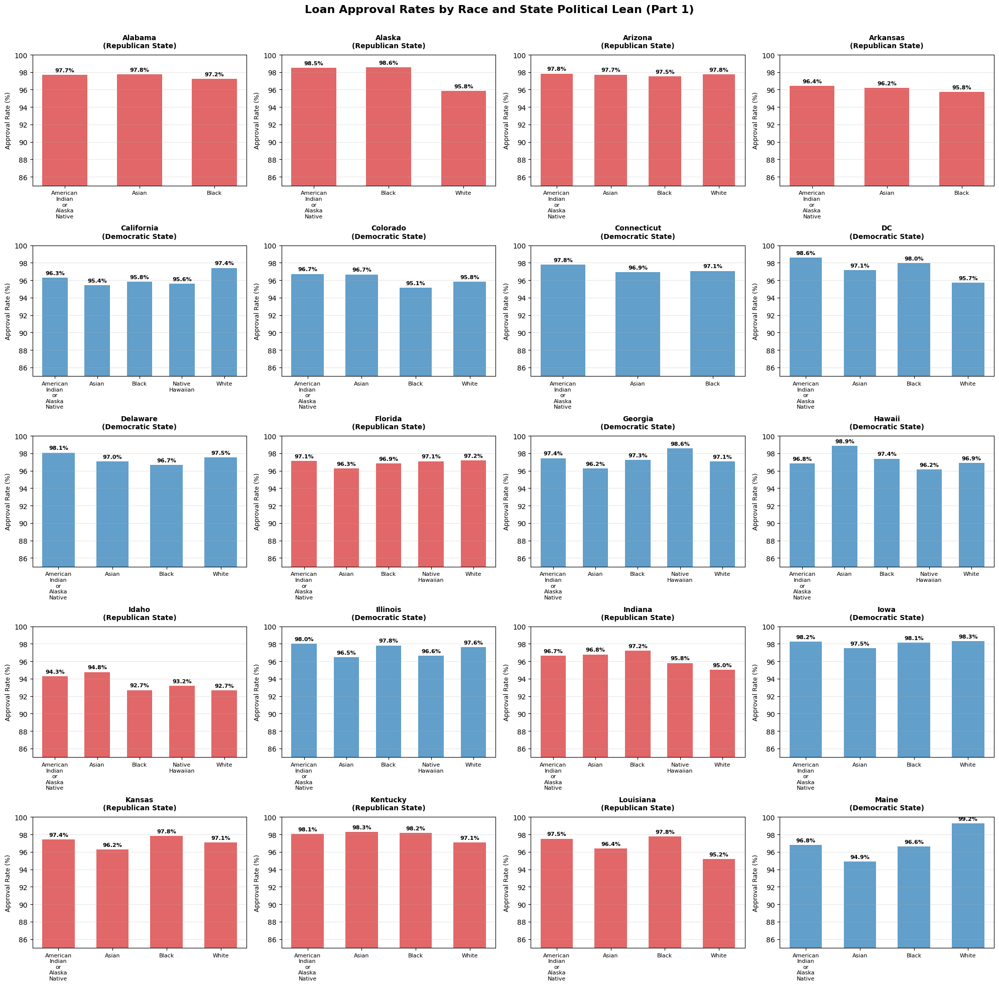

2025-08-06 19:55:23,445 [INFO]    ✅ Created plot 1/3 with 20 states


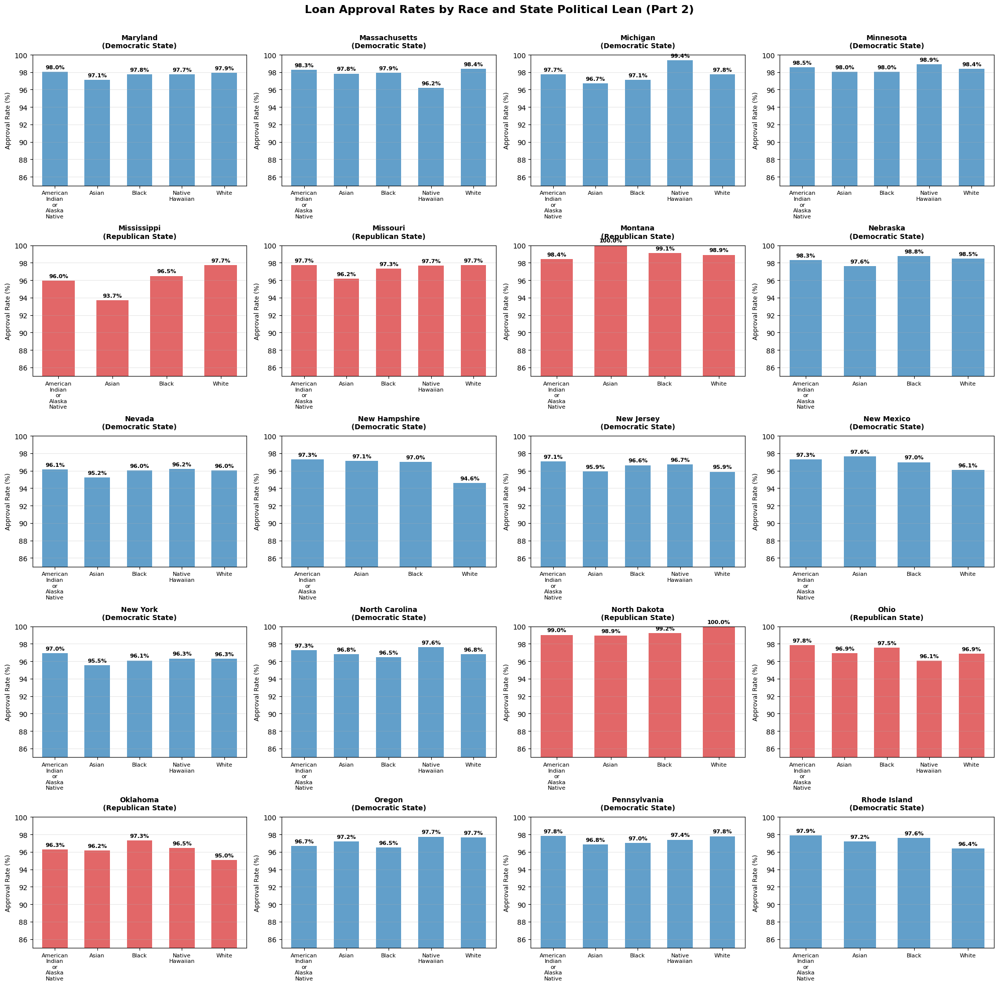

2025-08-06 19:55:28,402 [INFO]    ✅ Created plot 2/3 with 20 states


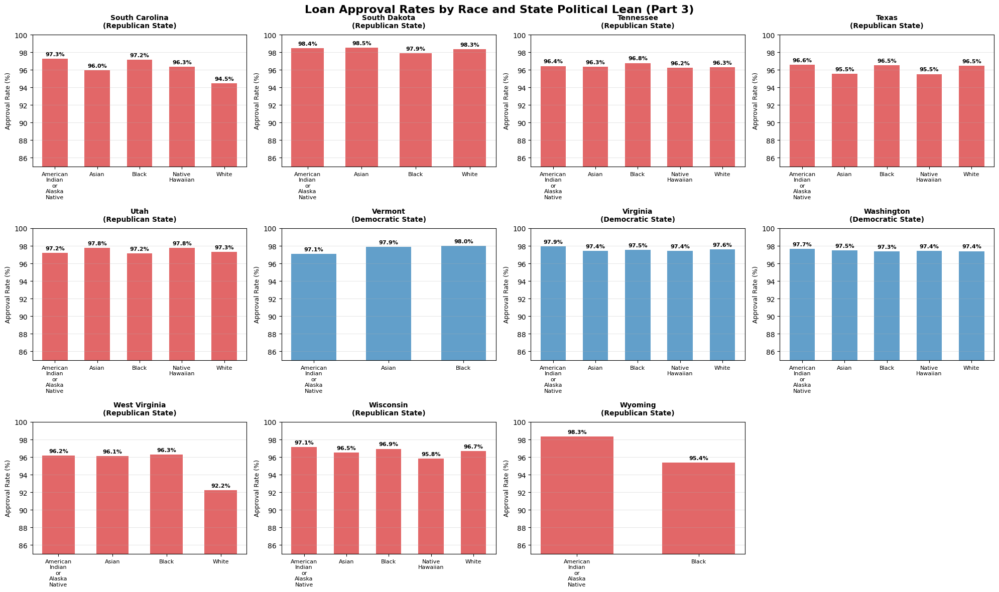

2025-08-06 19:55:31,320 [INFO]    ✅ Created plot 3/3 with 11 states
2025-08-06 19:55:31,321 [INFO] 
📊 Creating summary by state political lean...
2025-08-06 19:55:31,324 [INFO] 📋 Average approval rates by state political lean and race:
  state_political_lean                              race  approval_rate_mean  \
0     Democratic State  American Indian or Alaska Native               97.51   
1     Democratic State                             Asian               96.91   
2     Democratic State                             Black               97.13   
3     Democratic State                   Native Hawaiian               97.25   
4     Democratic State                             White               97.16   
5     Republican State  American Indian or Alaska Native               97.26   
6     Republican State                             Asian               96.78   
7     Republican State                             Black               97.11   
8     Republican State                   Nat

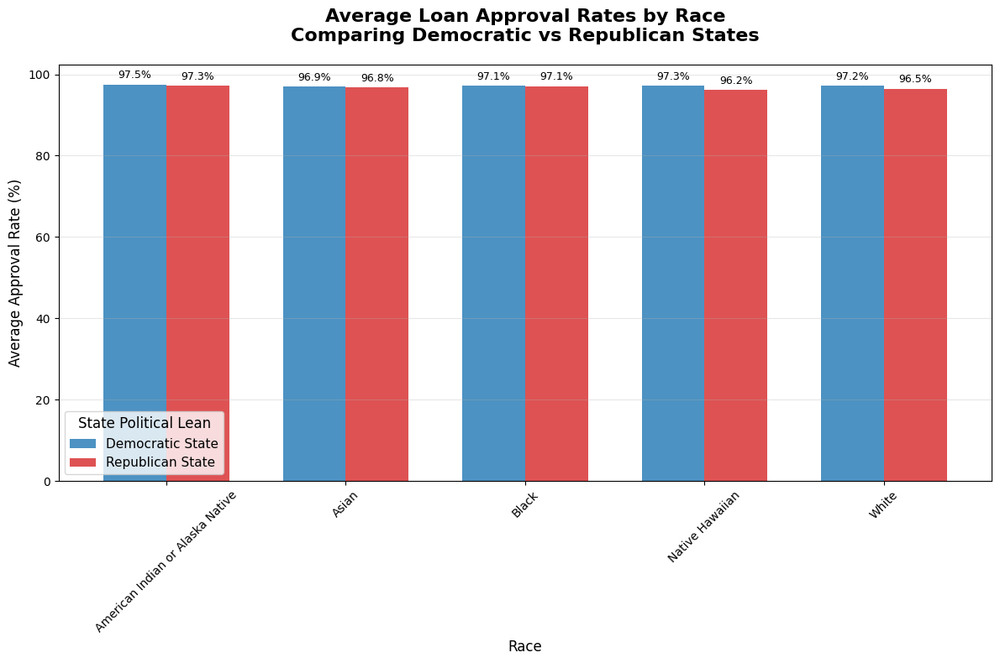

2025-08-06 19:55:32,167 [INFO] 
🏆 Creating state rankings by race...


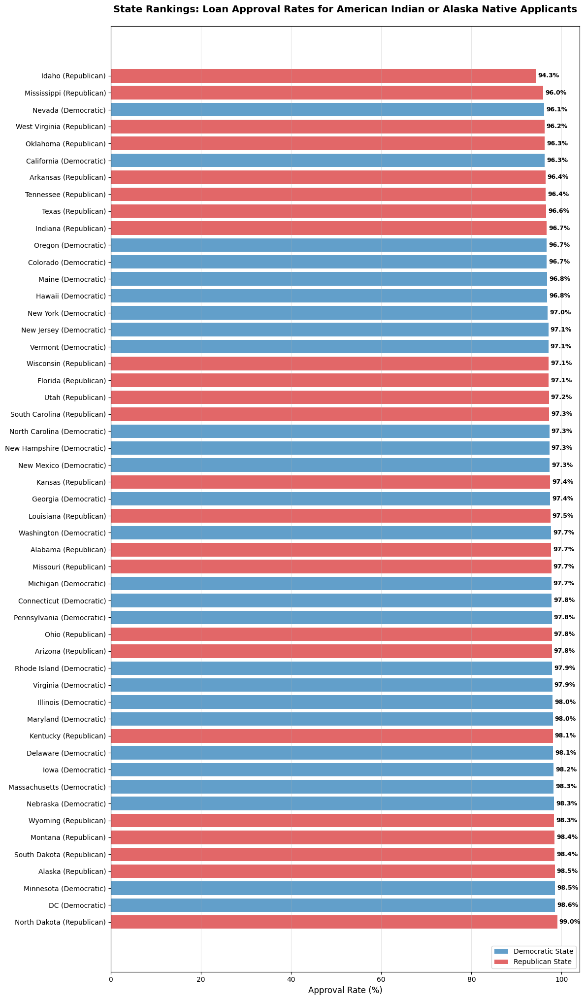

2025-08-06 19:55:34,296 [INFO]    ✅ Created ranking for American Indian or Alaska Native


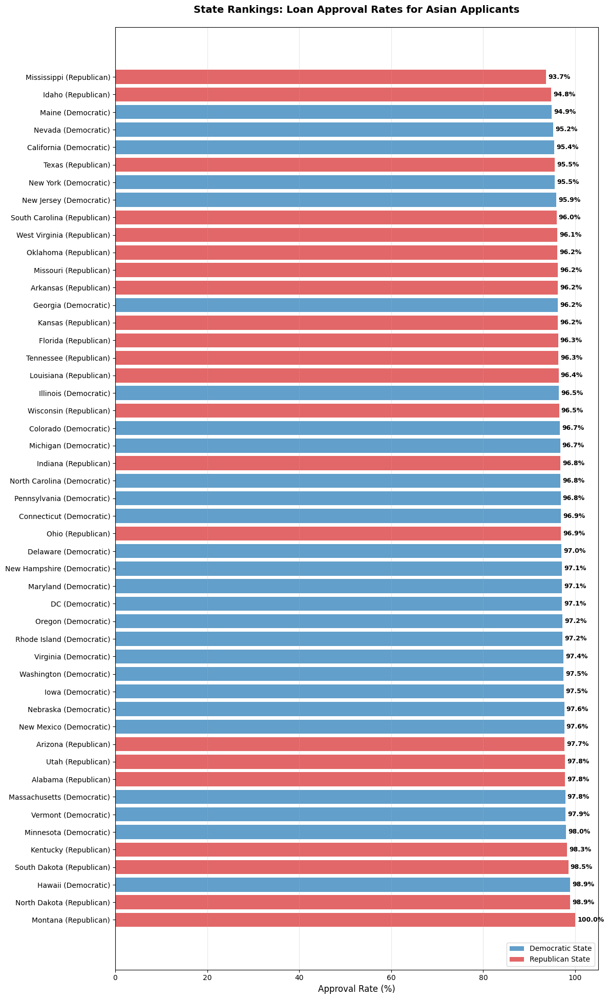

2025-08-06 19:55:36,183 [INFO]    ✅ Created ranking for Asian


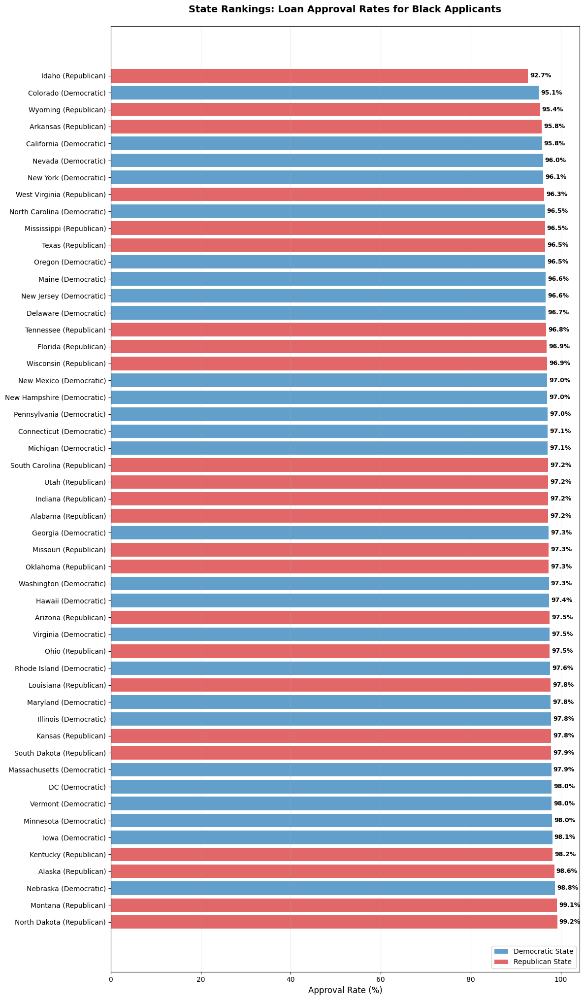

2025-08-06 19:55:38,229 [INFO]    ✅ Created ranking for Black


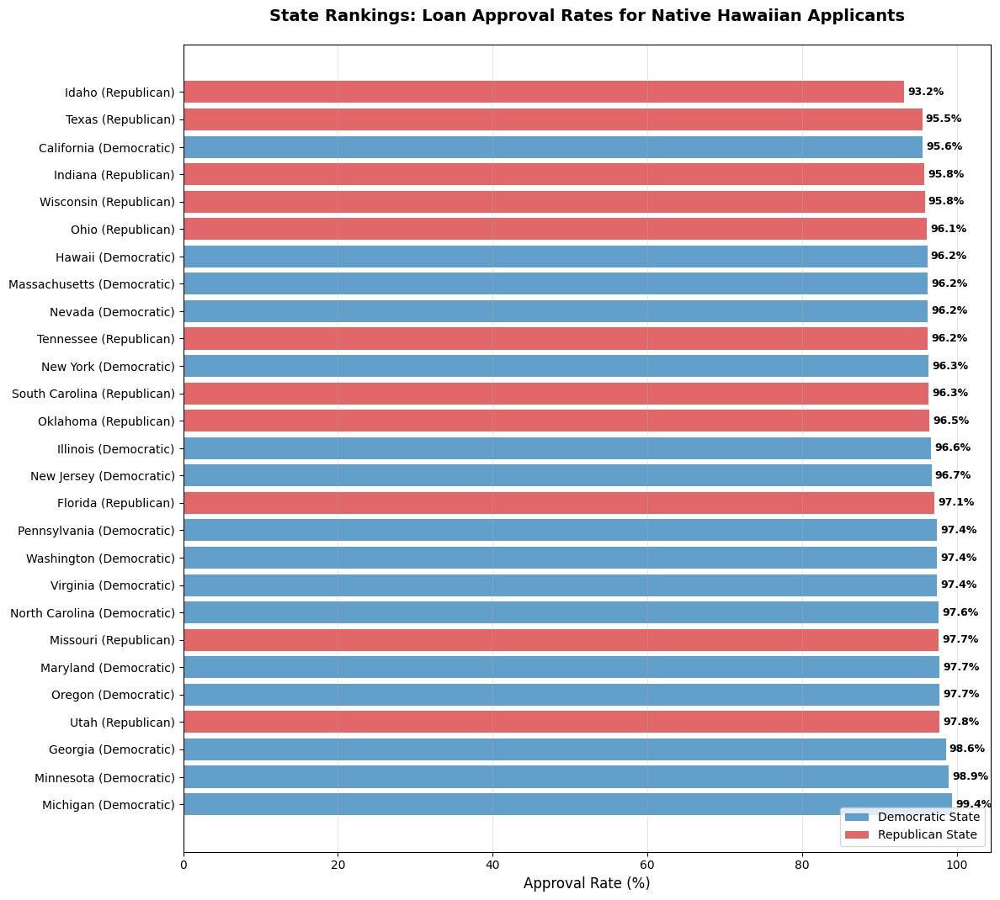

2025-08-06 19:55:39,290 [INFO]    ✅ Created ranking for Native Hawaiian


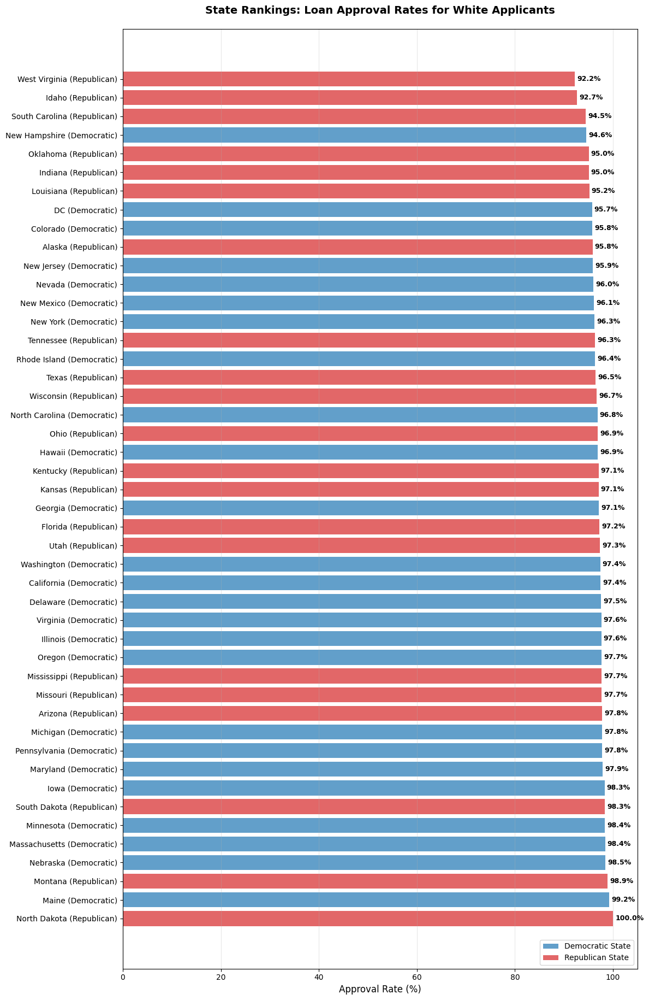

2025-08-06 19:55:41,321 [INFO]    ✅ Created ranking for White
2025-08-06 19:55:41,325 [INFO] 
✅ State analysis complete! Check the 'plots' folder for:
2025-08-06 19:55:41,325 [INFO]   📊 Facet plots showing each state:
2025-08-06 19:55:41,326 [INFO]      - state_facet_approval_rates.png (or multiple parts)
2025-08-06 19:55:41,326 [INFO]   📈 Summary comparisons:
2025-08-06 19:55:41,327 [INFO]      - approval_rates_dem_vs_rep_states.png
2025-08-06 19:55:41,327 [INFO]   🏆 State rankings by race:
2025-08-06 19:55:41,328 [INFO]      - state_ranking_[race].png (one per race)
2025-08-06 19:55:41,332 [INFO]   📋 Data files:
2025-08-06 19:55:41,334 [INFO]      - state_political_lean_summary.csv
2025-08-06 19:55:41,335 [INFO]      - detailed_state_approval_rates.csv


In [215]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path
import logging
import os

# ========== CONFIGURATION ==========
DEBUG = True

processed_data_dir = "processed_data"
output_dir = "plots"

# Logging configuration
logging.basicConfig(
    level=logging.DEBUG if DEBUG else logging.INFO,
    format='%(asctime)s [%(levelname)s] %(message)s'
)

# Create output directory
Path(output_dir).mkdir(exist_ok=True)

# Set up plotting style
plt.style.use('default')
sns.set_palette("husl")

def load_and_prepare_state_data():
    """Load processed data and prepare for state-level analysis"""
    logging.info("📊 Loading and preparing data for state-level analysis...")

    try:
        # Load the cleaned raw data
        file_path = f"{processed_data_dir}/cleaned_raw_data.csv"
        if not os.path.exists(file_path):
            logging.error(f"File not found: {file_path}")
            return None
        df = pd.read_csv(file_path)
        logging.info(f"   ✅ Loaded data: {len(df)} applications")

        # Debug output of data head
        if DEBUG:
            logging.debug("First few rows of loaded data:\n%s", df.head())

        # Extract state from county FIPS (first 2 digits, zero fill to 5 chars)
        df['county_fips'] = df['county_fips'].astype(str).str.zfill(5)
        df['state_fips'] = df['county_fips'].str[:2]

        # State FIPS to state name mapping
        state_fips_map = {
            '01': 'Alabama', '02': 'Alaska', '04': 'Arizona', '05': 'Arkansas', '06': 'California',
            '08': 'Colorado', '09': 'Connecticut', '10': 'Delaware', '11': 'DC', '12': 'Florida',
            '13': 'Georgia', '15': 'Hawaii', '16': 'Idaho', '17': 'Illinois', '18': 'Indiana',
            '19': 'Iowa', '20': 'Kansas', '21': 'Kentucky', '22': 'Louisiana', '23': 'Maine',
            '24': 'Maryland', '25': 'Massachusetts', '26': 'Michigan', '27': 'Minnesota', '28': 'Mississippi',
            '29': 'Missouri', '30': 'Montana', '31': 'Nebraska', '32': 'Nevada', '33': 'New Hampshire',
            '34': 'New Jersey', '35': 'New Mexico', '36': 'New York', '37': 'North Carolina', '38': 'North Dakota',
            '39': 'Ohio', '40': 'Oklahoma', '41': 'Oregon', '42': 'Pennsylvania', '44': 'Rhode Island',
            '45': 'South Carolina', '46': 'South Dakota', '47': 'Tennessee', '48': 'Texas', '49': 'Utah',
            '50': 'Vermont', '51': 'Virginia', '53': 'Washington', '54': 'West Virginia', '55': 'Wisconsin',
            '56': 'Wyoming'
        }

        df['state_name'] = df['state_fips'].map(state_fips_map)
        prev_len = len(df)
        df = df.dropna(subset=['state_name'])  # Remove unmapped states
        logging.info(f"   ✅ Mapped to states: {len(df)} applications (removed {prev_len-len(df)})")
        logging.info(f"   🏛️ States available: {sorted(df['state_name'].unique())}")

        return df

    except Exception as e:
        logging.exception("❌ Error loading data:")
        return None

def determine_state_political_lean(df):
    """Determine each state's political lean based on county voting patterns"""
    logging.info("\n🗳️ Determining state political leans...")

    try:
        state_lean = df.groupby(['state_name', 'election_lean']).agg({
            'approved': 'count',
            'denied': 'count'
        }).reset_index()
        state_lean['total_apps'] = state_lean['approved'] + state_lean['denied']

        state_totals = state_lean.groupby(['state_name', 'election_lean'])['total_apps'].sum().reset_index()
        state_pivot = state_totals.pivot(index='state_name', columns='election_lean', values='total_apps').fillna(0)

        if 'Trump' in state_pivot.columns and 'Biden' in state_pivot.columns:
            state_pivot['state_political_lean'] = (state_pivot['Biden'] > state_pivot['Trump']).map({
                True: 'Democratic State', 
                False: 'Republican State'
            })
        else:
            state_pivot['state_political_lean'] = 'Mixed/Unknown'

        state_pivot['total_apps'] = state_pivot.get('Biden', 0) + state_pivot.get('Trump', 0)
        state_pivot['biden_pct'] = (state_pivot.get('Biden', 0) / state_pivot['total_apps'] * 100).round(1)
        state_pivot['trump_pct'] = (state_pivot.get('Trump', 0) / state_pivot['total_apps'] * 100).round(1)

        logging.info("📊 State political leans (based on loan application distribution):")
        state_summary = state_pivot[['state_political_lean', 'biden_pct', 'trump_pct', 'total_apps']].copy()
        logging.info("\n%s", state_summary.head(15))

        return state_pivot.reset_index()[['state_name', 'state_political_lean', 'biden_pct', 'trump_pct']]
    except Exception as e:
        logging.exception("Error in determine_state_political_lean")
        return None

def calculate_state_approval_rates(df, state_lean_df):
    """Calculate approval rates by state and race"""
    logging.info("\n🔢 Calculating approval rates by state and race...")

    try:
        df_with_state_lean = df.merge(state_lean_df, on='state_name', how='left')
        state_rates = df_with_state_lean.groupby(['state_name', 'state_political_lean', 'race']).agg({
            'approved': 'sum',
            'denied': 'sum'
        }).reset_index()
        state_rates['total_applications'] = state_rates['approved'] + state_rates['denied']
        state_rates['approval_rate'] = (state_rates['approved'] / state_rates['total_applications'] * 100).round(2)
        state_rates = state_rates[state_rates['total_applications'] >= 100].copy()
        logging.info(f"   ✅ Calculated rates for {len(state_rates)} state-race combinations")
        logging.info(f"   🏛️ States included: {len(state_rates['state_name'].unique())}")
        logging.info(f"   🎯 Races included: {sorted(state_rates['race'].unique())}")
        return state_rates
    except Exception as e:
        logging.exception("Error in calculate_state_approval_rates")
        return None

def create_state_facet_plot(state_rates, output_dir, max_states_per_plot=20):
    """Create facet plots showing approval rates by race for each state"""
    logging.info(f"\n📈 Creating state facet plots (max {max_states_per_plot} states per plot)...")

    try:
        states = sorted(state_rates['state_name'].unique())
        n_plots = (len(states) + max_states_per_plot - 1) // max_states_per_plot

        for plot_num in range(n_plots):
            start_idx = plot_num * max_states_per_plot
            end_idx = min((plot_num + 1) * max_states_per_plot, len(states))
            states_chunk = states[start_idx:end_idx]
            chunk_data = state_rates[state_rates['state_name'].isin(states_chunk)].copy()

            n_states = len(states_chunk)
            cols = min(4, n_states)
            rows = (n_states + cols - 1) // cols

            fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
            if n_states == 1:
                axes = [axes]
            elif rows == 1:
                axes = axes.reshape(1, -1)
            axes_flat = axes.flatten() if n_states > 1 else axes
            for i, state in enumerate(states_chunk):
                ax = axes_flat[i]
                state_data = chunk_data[chunk_data['state_name'] == state]
                if len(state_data) == 0:
                    ax.set_visible(False)
                    continue
                state_lean = state_data['state_political_lean'].iloc[0]
                color_map = {'Democratic State': '#1f77b4', 'Republican State': '#d62728', 'Mixed/Unknown': '#AAAAAA'}
                main_color = color_map.get(state_lean, '#AAAAAA')
                races = state_data['race'].unique()
                x_pos = np.arange(len(races))
                bars = ax.bar(x_pos, state_data['approval_rate'], color=main_color, alpha=0.7, width=0.6)
                ax.set_title(f'{state}\n({state_lean})', fontsize=10, fontweight='bold', pad=10)
                ax.set_ylabel('Approval Rate (%)', fontsize=9)
                ax.set_xticks(x_pos)
                ax.set_xticklabels([race.replace(' ', '\n') for race in races], fontsize=8, rotation=0)
                ax.grid(True, alpha=0.3, axis='y')
                ax.set_ylim(85, 100)
                for bar, rate in zip(bars, state_data['approval_rate']):
                    height = bar.get_height()
                    ax.annotate(f'{rate:.1f}%',
                               xy=(bar.get_x() + bar.get_width() / 2, height),
                               xytext=(0, 3),
                               textcoords="offset points",
                               ha='center', va='bottom',
                               fontsize=8, fontweight='bold')
            for i in range(n_states, len(axes_flat)):
                axes_flat[i].set_visible(False)
            fig.suptitle(f'Loan Approval Rates by Race and State Political Lean (Part {plot_num + 1})',
                        fontsize=16, fontweight='bold', y=0.98)
            plt.tight_layout()
            plt.subplots_adjust(top=0.93)
            filename = f"state_facet_approval_rates_part_{plot_num + 1}" if n_plots > 1 else "state_facet_approval_rates"
            plt.savefig(f"{output_dir}/{filename}.png", dpi=300, bbox_inches='tight')
            plt.savefig(f"{output_dir}/{filename}.svg", bbox_inches='tight')
            plt.show()
            logging.info(f"   ✅ Created plot {plot_num + 1}/{n_plots} with {len(states_chunk)} states")
    except Exception as e:
        logging.exception("Error in create_state_facet_plot")

def create_summary_by_state_lean(state_rates, output_dir):
    """Create summary comparing Democratic vs Republican states"""
    logging.info("\n📊 Creating summary by state political lean...")

    try:
        summary = state_rates.groupby(['state_political_lean', 'race']).agg({
            'approval_rate': ['mean', 'std', 'count'],
            'total_applications': 'sum'
        }).round(2)
        summary.columns = ['_'.join(col).strip() for col in summary.columns]
        summary = summary.reset_index()
        logging.info("📋 Average approval rates by state political lean and race:\n%s", summary)
        summary.to_csv(f"{output_dir}/state_political_lean_summary.csv", index=False)
        fig, ax = plt.subplots(figsize=(12, 8))
        plot_data = state_rates.groupby(['state_political_lean', 'race'])['approval_rate'].mean().reset_index()
        plot_pivot = plot_data.pivot(index='race', columns='state_political_lean', values='approval_rate')
        plot_pivot.plot(kind='bar', ax=ax, color=['#1f77b4', '#d62728'], alpha=0.8, width=0.7)
        ax.set_title('Average Loan Approval Rates by Race\nComparing Democratic vs Republican States',
                    fontsize=16, fontweight='bold', pad=20)
        ax.set_ylabel('Average Approval Rate (%)', fontsize=12)
        ax.set_xlabel('Race', fontsize=12)
        ax.tick_params(axis='x', rotation=45)
        ax.legend(title='State Political Lean', title_fontsize=12, fontsize=11)
        ax.grid(True, alpha=0.3, axis='y')
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f%%', fontsize=9, rotation=0, padding=3)
        plt.tight_layout()
        plt.savefig(f"{output_dir}/approval_rates_dem_vs_rep_states.png", dpi=300, bbox_inches='tight')
        plt.savefig(f"{output_dir}/approval_rates_dem_vs_rep_states.svg", bbox_inches='tight')
        plt.show()
        return summary
    except Exception as e:
        logging.exception("Error in create_summary_by_state_lean")
        return None

def create_state_ranking(state_rates, output_dir):
    """Create ranking of states by approval rates for each race"""
    logging.info("\n🏆 Creating state rankings by race...")

    try:
        for race in sorted(state_rates['race'].unique()):
            race_data = state_rates[state_rates['race'] == race].copy()
            race_data = race_data.sort_values('approval_rate', ascending=False)
            fig, ax = plt.subplots(figsize=(12, max(8, len(race_data) * 0.4)))
            colors = [('#1f77b4' if lean == 'Democratic State' else '#d62728') 
                     for lean in race_data['state_political_lean']]
            bars = ax.barh(range(len(race_data)), race_data['approval_rate'], 
                          color=colors, alpha=0.7)
            ax.set_yticks(range(len(race_data)))
            ax.set_yticklabels([f"{state} ({lean.split()[0]})" 
                               for state, lean in zip(race_data['state_name'], race_data['state_political_lean'])],
                              fontsize=10)
            ax.set_xlabel('Approval Rate (%)', fontsize=12)
            ax.set_title(f'State Rankings: Loan Approval Rates for {race} Applicants', 
                        fontsize=14, fontweight='bold', pad=20)
            ax.grid(True, alpha=0.3, axis='x')
            for i, (bar, rate) in enumerate(zip(bars, race_data['approval_rate'])):
                width = bar.get_width()
                ax.annotate(f'{rate:.1f}%',
                           xy=(width, bar.get_y() + bar.get_height() / 2),
                           xytext=(3, 0), 
                           textcoords="offset points",
                           ha='left', va='center', 
                           fontsize=9, fontweight='bold')
            from matplotlib.patches import Patch
            legend_elements = [Patch(facecolor='#1f77b4', alpha=0.7, label='Democratic State'),
                              Patch(facecolor='#d62728', alpha=0.7, label='Republican State')]
            ax.legend(handles=legend_elements, loc='lower right')
            plt.tight_layout()
            race_clean = race.replace(' ', '_').replace('/', '_')
            plt.savefig(f"{output_dir}/state_ranking_{race_clean}.png", dpi=300, bbox_inches='tight')
            plt.savefig(f"{output_dir}/state_ranking_{race_clean}.svg", bbox_inches='tight')
            plt.show()
            logging.info(f"   ✅ Created ranking for {race}")
    except Exception as e:
        logging.exception("Error in create_state_ranking")

def main():
    """Main execution function"""
    logging.info("🏛️ State-Level Analysis: Approval Rates by Race and State Political Lean")
    logging.info("=" * 80)
    df = load_and_prepare_state_data()
    if df is None:
        return
    state_lean_df = determine_state_political_lean(df)
    if state_lean_df is None:
        return
    state_rates = calculate_state_approval_rates(df, state_lean_df)
    if state_rates is None:
        return
    create_state_facet_plot(state_rates, output_dir)
    summary = create_summary_by_state_lean(state_rates, output_dir)
    create_state_ranking(state_rates, output_dir)
    state_rates.to_csv(f"{output_dir}/detailed_state_approval_rates.csv", index=False)
    logging.info(f"\n✅ State analysis complete! Check the '{output_dir}' folder for:")
    logging.info("  📊 Facet plots showing each state:")
    logging.info("     - state_facet_approval_rates.png (or multiple parts)")
    logging.info("  📈 Summary comparisons:")
    logging.info("     - approval_rates_dem_vs_rep_states.png")
    logging.info("  🏆 State rankings by race:")
    logging.info("     - state_ranking_[race].png (one per race)")
    logging.info("  📋 Data files:")
    logging.info("     - state_political_lean_summary.csv")
    logging.info("     - detailed_state_approval_rates.csv")

if __name__ == "__main__":
    main()


In [2]:
import os
import pandas as pd

# === Config ===
data_folder = "filtered_data_strict"  # Change to equity folder if needed
output_file = "avg_interest_vs_approval_by_lei_race_year.csv"
years = range(2018, 2025)

# === Race mapping ===
race_map = {
    2.0: 'Asian', 21: 'Asian', 22: 'Asian', 23: 'Asian', 24: 'Asian', 25: 'Asian', 26: 'Asian', 27: 'Asian',
    3.0: 'Black',
    5.0: 'White'
}

# === Bank / Non-bank from purchaser_type ===
def classify_lender_from_purchaser_type(ptype):
    try:
        if int(ptype) == 6:  # 6 means banks
            return "Bank"
        else:
            return "Non-Bank"
    except:
        return "Unknown"

# === Collect results ===
rows = []

for year in years:
    file_path = os.path.join(data_folder, f"{year}_filtered_hmda.csv")
    if not os.path.exists(file_path):
        print(f"❌ Skipping {year}, file not found: {file_path}")
        continue

    print(f"📥 Loading {file_path}")
    df = pd.read_csv(file_path, low_memory=False)

    # Map race
    race_col = 'applicant_race-1' if 'applicant_race-1' in df.columns else 'applicant_race_1'
    df['race_label'] = df[race_col].map(race_map)
    df = df[df['race_label'].notna()]

    # Ensure interest rate column exists and is numeric
    if 'interest_rate' not in df.columns:
        print(f"⚠️ No interest_rate column for {year}, skipping.")
        continue
    df['interest_rate'] = pd.to_numeric(df['interest_rate'], errors='coerce')

    # Add lender_type based on purchaser_type
    df['lender_type'] = df['purchaser_type'].apply(classify_lender_from_purchaser_type)

    # Approval counts
    approved = df[df['action_taken'].isin([1, 2])]
    total = df[df['action_taken'].isin([1, 2, 3])]

    app_counts = (
        approved.groupby(['lei', 'race_label'])
        .size().reset_index(name='approved_count')
    )
    total_counts = (
        total.groupby(['lei', 'race_label'])
        .size().reset_index(name='total_applications')
    )

    # Merge for approval rate
    merged = total_counts.merge(app_counts, on=['lei', 'race_label'], how='left')
    merged['approved_count'] = merged['approved_count'].fillna(0)
    merged['approval_rate'] = merged['approved_count'] / merged['total_applications']

    # Average interest rate per LEI + race
    avg_ir = (
        df.groupby(['lei', 'race_label'])['interest_rate']
        .mean().reset_index(name='avg_interest_rate')
    )

    # Get lender type per LEI
    lender_type_map = df.groupby('lei')['lender_type'].first().to_dict()

    # Combine
    merged = merged.merge(avg_ir, on=['lei', 'race_label'], how='left')
    merged['year'] = year
    merged['lender_type'] = merged['lei'].map(lender_type_map)

    rows.append(merged)

# Combine all years
result_df = pd.concat(rows, ignore_index=True)

# Save
result_df.to_csv(output_file, index=False)
print(f"✅ Saved to {output_file}")


📥 Loading filtered_data_strict/2018_filtered_hmda.csv
📥 Loading filtered_data_strict/2019_filtered_hmda.csv
📥 Loading filtered_data_strict/2020_filtered_hmda.csv
📥 Loading filtered_data_strict/2021_filtered_hmda.csv
📥 Loading filtered_data_strict/2022_filtered_hmda.csv
📥 Loading filtered_data_strict/2023_filtered_hmda.csv
📥 Loading filtered_data_strict/2024_filtered_hmda.csv
✅ Saved to avg_interest_vs_approval_by_lei_race_year.csv


In [3]:
# === Average out interest rates by Bank/Non-Bank, Race, and Year ===
bank_nonbank_avg = (
    result_df
    .groupby(['year', 'race_label', 'lender_type'])['avg_interest_rate']
    .mean()
    .reset_index()
    .sort_values(['year', 'race_label', 'lender_type'])
)

# Save the result
bank_nonbank_avg.to_csv("bank_nonbank_interest_rate_by_race_year.csv", index=False)
print("✅ Saved bank vs non-bank averages to bank_nonbank_interest_rate_by_race_year.csv")

# Quick peek
print(bank_nonbank_avg.head(10))


✅ Saved bank vs non-bank averages to bank_nonbank_interest_rate_by_race_year.csv
   year race_label lender_type  avg_interest_rate
0  2018      Asian        Bank           4.679610
1  2018      Asian    Non-Bank           4.596674
2  2018      Black        Bank           7.079852
3  2018      Black    Non-Bank           5.978828
4  2018      White        Bank           5.295218
5  2018      White    Non-Bank           5.519534
6  2019      Asian        Bank           4.148406
7  2019      Asian    Non-Bank           4.412916
8  2019      Black        Bank           4.405103
9  2019      Black    Non-Bank           4.550485


In [4]:
import pandas as pd

# Load the file
df = pd.read_csv("bank_nonbank_interest_rate_by_race_year.csv")

# Count the number of LEI-level records in each group
counts = (
    result_df  # This is the LEI-level dataset before grouping
    .groupby(['year', 'race_label', 'lender_type'])
    .size()
    .reset_index(name='num_data_points')
)

# Merge counts into the average table
bank_nonbank_with_counts = df.merge(counts, on=['year', 'race_label', 'lender_type'], how='left')

# Save
bank_nonbank_with_counts.to_csv("bank_nonbank_interest_rate_with_counts.csv", index=False)
print(bank_nonbank_with_counts.head(10))


   year race_label lender_type  avg_interest_rate  num_data_points
0  2018      Asian        Bank           4.679610              276
1  2018      Asian    Non-Bank           4.596674             1709
2  2018      Black        Bank           7.079852              279
3  2018      Black    Non-Bank           5.978828             1699
4  2018      White        Bank           5.295218              323
5  2018      White    Non-Bank           5.519534             2801
6  2019      Asian        Bank           4.148406              240
7  2019      Asian    Non-Bank           4.412916             1633
8  2019      Black        Bank           4.405103              237
9  2019      Black    Non-Bank           4.550485             1670


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_40321/604937477.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  g = sns.catplot(


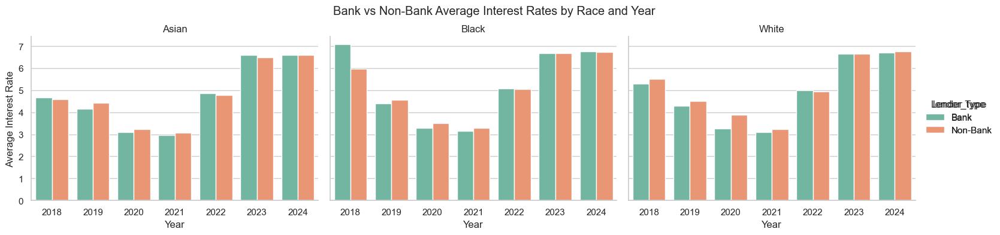

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("bank_nonbank_interest_rate_by_race_year.csv")

# Set style
sns.set(style="whitegrid")

# Create facet grid: one subplot per race
g = sns.catplot(
    data=df,
    x="year", y="avg_interest_rate",
    hue="lender_type",
    col="race_label",
    kind="bar",
    height=4, aspect=1.2,
    palette="Set2",
    ci=None
)

# Labels and formatting
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Average Interest Rate")
g.add_legend(title="Lender Type")

plt.subplots_adjust(top=0.85)
g.fig.suptitle("Bank vs Non-Bank Average Interest Rates by Race and Year")

plt.show()


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_84237/243205601.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby(["year", "race_label", "lender_type"], dropna=False)


Saved: banks_vs_nonbanks_approval_facets.png
Saved: banks_vs_nonbanks_approval_facets.svg
Saved: banks_vs_nonbanks_interest_facets.png
Saved: banks_vs_nonbanks_interest_facets.svg


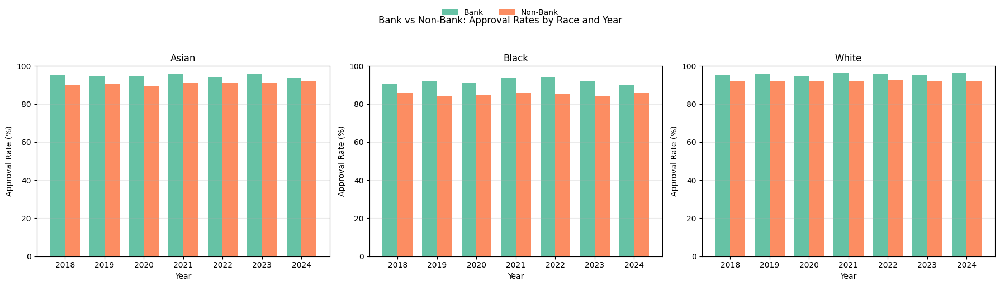

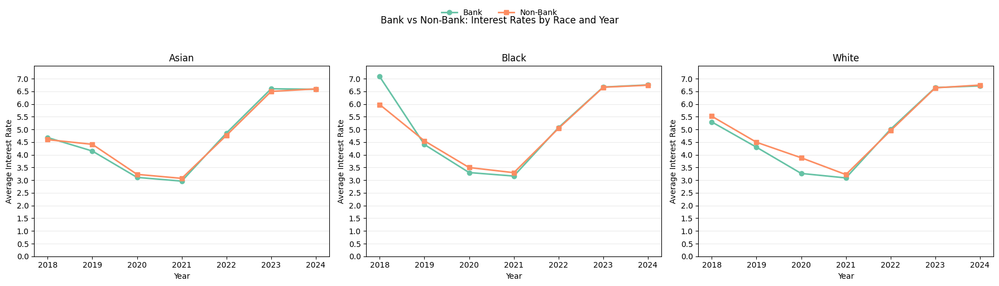

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from pathlib import Path

# ========= CONFIG =========
CSV_PATH = "avg_interest_vs_approval_by_lei_race_year.csv"

OUT_DIR = Path(".")
APPROVAL_PNG = OUT_DIR / "banks_vs_nonbanks_approval_facets.png"
APPROVAL_SVG = OUT_DIR / "banks_vs_nonbanks_approval_facets.svg"
INTEREST_PNG = OUT_DIR / "banks_vs_nonbanks_interest_facets.png"
INTEREST_SVG = OUT_DIR / "banks_vs_nonbanks_interest_facets.svg"

APPROVAL_YLIM  = (0, 100)         # percent
INTEREST_YLIM  = (0, 7.5)         # interest rate
INTEREST_TICKS = np.arange(0, 7.5, 0.5)
BAR_WIDTH      = 0.38
LENDER_ORDER   = ["Bank", "Non-Bank"]  # enforce order
COLORS         = {"Bank": "#66c2a5", "Non-Bank": "#fc8d62"}
MARKERS        = {"Bank": "o", "Non-Bank": "s"}

# ========= LOAD & PREP =========
df = pd.read_csv(CSV_PATH)

# Clean year to integer (robust to strings like "2021*" etc.)
df["year"] = (
    df["year"].astype(str).str.extract(r"(\d{4})")[0].astype(float)
)
df = df.dropna(subset=["year"]).copy()
df["year"] = df["year"].astype(int)

# Normalize approval_rate to percent if needed
if df["approval_rate"].max() <= 1.00001:
    df["approval_rate"] = df["approval_rate"] * 100.0

# Keep only the lender types we want (and in order)
df = df[df["lender_type"].isin(LENDER_ORDER)].copy()
df["lender_type"] = pd.Categorical(df["lender_type"], categories=LENDER_ORDER, ordered=True)

# Aggregate to race/year/lender_type
agg = (
    df.groupby(["year", "race_label", "lender_type"], dropna=False)
      .agg(
          avg_interest_rate=("avg_interest_rate", "mean"),
          avg_approval_rate=("approval_rate", "mean")
      )
      .reset_index()
)

races = sorted(agg["race_label"].dropna().unique().tolist())

# ========= HELPER =========
def _years_x(sub):
    years = sorted(sub["year"].unique())
    x = np.arange(len(years))
    return years, x

def _vals_by(sub, years, col, lender_type):
    vals = []
    for y in years:
        chunk = sub[(sub["year"] == y) & (sub["lender_type"] == lender_type)]
        vals.append(chunk[col].iloc[0] if not chunk.empty else np.nan)
    return vals

# ========= FIGURE 1: APPROVAL (BARS) =========
fig1, axes1 = plt.subplots(1, max(1, len(races)), figsize=(6 * max(1, len(races)), 5), sharey=False)
if len(races) == 1:
    axes1 = [axes1]

for ax, race in zip(axes1, races):
    sub = agg[agg["race_label"] == race].copy()
    years, x = _years_x(sub)

    for i, lt in enumerate(LENDER_ORDER):
        ys = _vals_by(sub, years, "avg_approval_rate", lt)
        offset = (i - (len(LENDER_ORDER)-1)/2) * BAR_WIDTH
        ax.bar(x + offset, ys, BAR_WIDTH, color=COLORS[lt], label=lt)

    ax.set_title(str(race))
    ax.set_xlabel("Year")
    ax.set_ylabel("Approval Rate (%)")
    ax.set_xticks(x)
    ax.set_xticklabels([str(y) for y in years])
    ax.set_ylim(*APPROVAL_YLIM)
    ax.grid(True, axis="y", alpha=0.25)

# Legend (shared)
legend_handles = [Patch(facecolor=COLORS[lt], label=lt) for lt in LENDER_ORDER]
fig1.legend(
    handles=legend_handles,
    labels=[h.get_label() for h in legend_handles],
    loc="upper center",
    ncol=len(LENDER_ORDER),
    frameon=False,
    bbox_to_anchor=(0.5, 1.03)
)
plt.suptitle("Bank vs Non-Bank: Approval Rates by Race and Year", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])

OUT_DIR.mkdir(parents=True, exist_ok=True)
fig1.savefig(APPROVAL_PNG, dpi=300, bbox_inches="tight")
fig1.savefig(APPROVAL_SVG, bbox_inches="tight")
print(f"Saved: {APPROVAL_PNG}")
print(f"Saved: {APPROVAL_SVG}")

# ========= FIGURE 2: INTEREST (LINES) =========
fig2, axes2 = plt.subplots(1, max(1, len(races)), figsize=(6 * max(1, len(races)), 5), sharey=False)
if len(races) == 1:
    axes2 = [axes2]

for ax, race in zip(axes2, races):
    sub = agg[agg["race_label"] == race].copy()
    years, x = _years_x(sub)

    for lt in LENDER_ORDER:
        ys = _vals_by(sub, years, "avg_interest_rate", lt)
        ax.plot(x, ys, marker=MARKERS[lt], linewidth=2, color=COLORS[lt], label=lt)

    ax.set_title(str(race))
    ax.set_xlabel("Year")
    ax.set_ylabel("Average Interest Rate")
    ax.set_xticks(x)
    ax.set_xticklabels([str(y) for y in years])
    ax.set_ylim(*INTEREST_YLIM)
    ax.set_yticks(INTEREST_TICKS)
    ax.grid(True, axis="y", alpha=0.25)

# Legend (shared)
legend_handles2 = [
    Line2D([0],[0], color=COLORS[lt], marker=MARKERS[lt], lw=2, label=lt) for lt in LENDER_ORDER
]
fig2.legend(
    handles=legend_handles2,
    labels=[h.get_label() for h in legend_handles2],
    loc="upper center",
    ncol=len(LENDER_ORDER),
    frameon=False,
    bbox_to_anchor=(0.5, 1.03)
)
plt.suptitle("Bank vs Non-Bank: Interest Rates by Race and Year", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])

fig2.savefig(INTEREST_PNG, dpi=300, bbox_inches="tight")
fig2.savefig(INTEREST_SVG, bbox_inches="tight")
print(f"Saved: {INTEREST_PNG}")
print(f"Saved: {INTEREST_SVG}")

plt.show()

Saved counts -> bank_nonbank_app_counts_by_year.csv


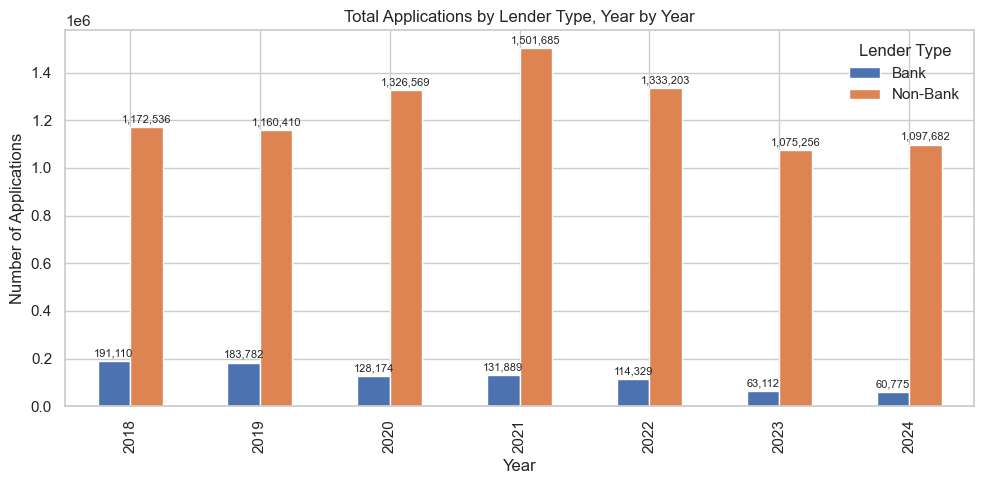

Saved plot -> bank_nonbank_app_counts_by_year.png / bank_nonbank_app_counts_by_year.svg


In [20]:
# bank_vs_nonbank_applications_by_year.py
import re
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt

# ---------- CONFIG ----------
DATA_DIR = Path("filtered_data_strict")  # folder with 2018_filtered_hmda.csv, 2019_filtered_hmda.csv, etc.
PATTERN  = re.compile(r"(\d{4})_filtered_hmda\.csv$")
OUT_CSV  = "bank_nonbank_app_counts_by_year.csv"
OUT_PNG  = "bank_nonbank_app_counts_by_year.png"
OUT_SVG  = "bank_nonbank_app_counts_by_year.svg"

# ---------- LOAD & STACK ----------
frames = []
for f in DATA_DIR.glob("*_filtered_hmda.csv"):
    m = PATTERN.match(f.name)
    if not m:
        continue
    year = int(m.group(1))
    df = pd.read_csv(f, low_memory=False)

    # Classify lender_type from purchaser_type
    # Bank if purchaser_type == 6; otherwise Non-Bank
    lt = (df.get("purchaser_type")
            .fillna(-1)
            .astype("Int64")
            .apply(lambda x: "Bank" if x == 6 else "Non-Bank"))

    frames.append(pd.DataFrame({"year": year, "lender_type": lt}))

if not frames:
    raise SystemExit("No *_filtered_hmda.csv files found. Check DATA_DIR and filenames.")

stack = pd.concat(frames, ignore_index=True)

# ---------- COUNT APPLICATIONS ----------
counts = (
    stack
    .groupby(["year", "lender_type"])
    .size()
    .rename("applications")
    .reset_index()
)

# Ensure both categories present each year
years = sorted(counts["year"].unique())
for y in years:
    for lt in ["Bank", "Non-Bank"]:
        if not ((counts["year"] == y) & (counts["lender_type"] == lt)).any():
            counts = pd.concat([counts, pd.DataFrame({"year": [y], "lender_type": [lt], "applications": [0]})],
                               ignore_index=True)

counts = counts.sort_values(["year", "lender_type"]).reset_index(drop=True)
counts.to_csv(OUT_CSV, index=False)
print(f"Saved counts -> {OUT_CSV}")

# ---------- PLOT (grouped bars) ----------
pivot = counts.pivot(index="year", columns="lender_type", values="applications").fillna(0)
pivot = pivot[["Bank", "Non-Bank"]]  # fixed order if both exist

ax = pivot.plot(kind="bar", figsize=(10, 5))
ax.set_title("Total Applications by Lender Type, Year by Year")
ax.set_xlabel("Year")
ax.set_ylabel("Number of Applications")
ax.legend(title="Lender Type", frameon=False)

# Optional: labels on top of bars
for p in ax.patches:
    height = int(p.get_height())
    if height > 0:
        ax.annotate(f"{height:,}", (p.get_x() + p.get_width()/2, height),
                    ha="center", va="bottom", fontsize=8, xytext=(0, 2), textcoords="offset points")

plt.tight_layout()
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.savefig(OUT_SVG, bbox_inches="tight")
plt.show()
print(f"Saved plot -> {OUT_PNG} / {OUT_SVG}")


Saved: faceted_total_approved_by_race.png
Saved: faceted_total_approved_by_race.svg


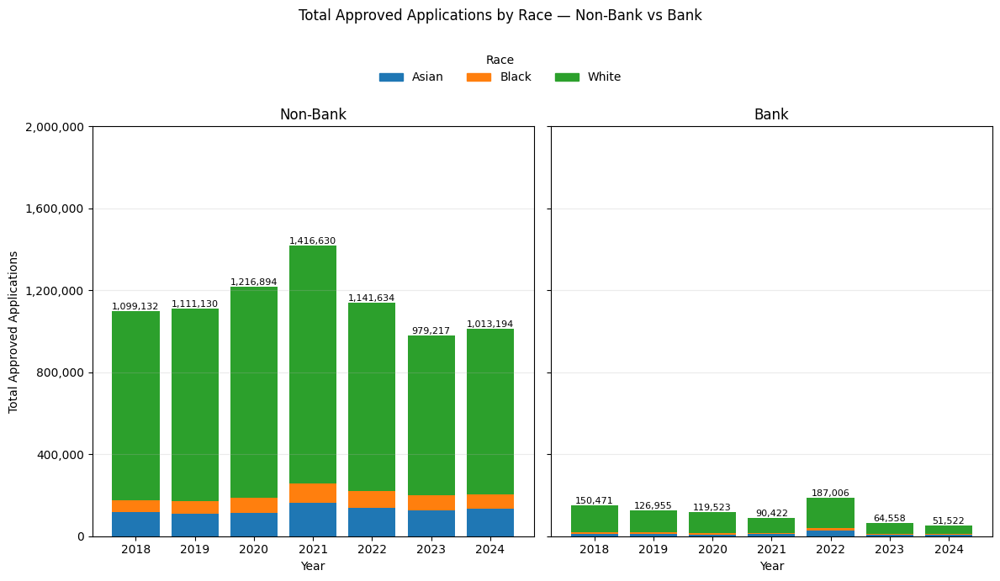

In [8]:
#!/usr/bin/env python3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from pathlib import Path
from math import floor, log10

# ========= CONFIG =========
CSV_PATH = "avg_interest_vs_approval_by_lei_race_year.csv"
OUT_DIR = Path(".")
OUT_PNG = OUT_DIR / "faceted_total_approved_by_race.png"
OUT_SVG = OUT_DIR / "faceted_total_approved_by_race.svg"

# Facet order (left-to-right)
FACETS = ["Non-Bank", "Bank"]

# Fixed race order (set to None to infer)
RACE_ORDER = None  # e.g. ["Asian","Black","White","Hispanic/Latino","Other/Unknown"]

# Use the colors shown in your screenshot:
# Asian = blue, Black = orange, White = green
# (Add more races as needed; anything not listed will fall back to tab10.)
RACE_COLOR_MAP = {
    "Asian":  "#1f77b4",
    "Black":  "#ff7f0e",
    "White":  "#2ca02c",
    # "Hispanic/Latino": "#d62728",
    # "Other/Unknown":   "#9467bd",
}

ANNOTATE_TOTALS = True

# ========= LOAD =========
df = pd.read_csv(CSV_PATH)

# Basic checks
required = {"year", "lender_type", "race_label"}
missing = required - set(df.columns)
if missing:
    raise ValueError(f"CSV missing required columns: {missing}")

# Clean year to integer
df["year"] = df["year"].astype(str).str.extract(r"(\d{4})")[0].astype(float)
df = df.dropna(subset=["year"]).copy()
df["year"] = df["year"].astype(int)

# Normalize lender type variants
LENDER_MAP = {
    "bank": "Bank", "banks": "Bank",
    "non-bank": "Non-Bank", "nonbank": "Non-Bank", "non bank": "Non-Bank"
}
def norm_lender(val: str) -> str:
    s = str(val).strip().lower()
    if s in LENDER_MAP: return LENDER_MAP[s]
    if "non" in s and "bank" in s: return "Non-Bank"
    if "bank" in s: return "Bank"
    return val if val in ("Bank", "Non-Bank") else s.title()
df["lender_type"] = df["lender_type"].apply(norm_lender)

# ========= APPROVED COUNT DERIVATION =========
approved_cols = [c for c in df.columns if c.lower() in {"approved_count","n_approved","num_approved"}]
if approved_cols:
    df["approved_count"] = pd.to_numeric(df[approved_cols[0]], errors="coerce")
else:
    rate_col = "approval_rate" if "approval_rate" in df.columns else ("avg_approval_rate" if "avg_approval_rate" in df.columns else None)
    total_candidates = [c for c in df.columns if c.lower() in {"applications_total","n_applications","applications","count","n"}]
    if not rate_col or not total_candidates:
        raise ValueError("Need 'approved_count' OR (approval_rate/avg_approval_rate AND total applications column).")
    total_col = total_candidates[0]
    rate  = pd.to_numeric(df[rate_col],  errors="coerce")
    total = pd.to_numeric(df[total_col], errors="coerce")
    rate = np.where(rate > 1.0, rate / 100.0, rate)  # normalize to 0–1
    df["approved_count"] = (rate * total).round()

df["approved_count"] = pd.to_numeric(df["approved_count"], errors="coerce").fillna(0).clip(lower=0)

# ========= AGGREGATE =========
agg = (
    df.groupby(["lender_type","year","race_label"], dropna=False)["approved_count"]
      .sum()
      .reset_index()
)

# Shared year axis
all_years = sorted(agg["year"].unique().tolist())

# Race order
if RACE_ORDER is not None:
    race_order = RACE_ORDER
else:
    race_order = sorted(agg["race_label"].dropna().unique().tolist())

# Build pivot per facet
def build_pivot(ltype: str) -> pd.DataFrame:
    sub = agg[agg["lender_type"] == ltype].copy()
    frame = (
        sub.pivot_table(index="year", columns="race_label", values="approved_count", aggfunc="sum", fill_value=0)
           .reindex(index=all_years, fill_value=0)
    )
    for r in race_order:
        if r not in frame.columns:
            frame[r] = 0
    frame = frame.reindex(columns=race_order)
    return frame

facet_pivots = {ft: build_pivot(ft) for ft in FACETS}

# ========= COLORS & AXIS =========
# Build color map with fallback for races not in RACE_COLOR_MAP
fallback_palette = plt.cm.tab10.colors
race_colors = {}
for i, r in enumerate(race_order):
    race_colors[r] = RACE_COLOR_MAP.get(r, fallback_palette[i % len(fallback_palette)])

def nice_ceil(x):
    if x <= 0: return 1
    exp = floor(log10(x)); frac = x / (10 ** exp)
    nice_frac = 1 if frac <= 1 else 2 if frac <= 2 else 5 if frac <= 5 else 10
    return int(nice_frac * (10 ** exp))

global_max = max(p.sum(axis=1).max() for p in facet_pivots.values())
ymax = nice_ceil(global_max)
yticks = np.linspace(0, ymax, 6)

# ========= PLOT =========
# Taller figure so the legend has room
fig, axes = plt.subplots(1, len(FACETS), figsize=(12, 7), sharey=True)
if len(FACETS) == 1:
    axes = [axes]

def plot_panel(ax, pivot_df: pd.DataFrame, title: str):
    years = [str(y) for y in pivot_df.index.tolist()]
    bottoms = np.zeros(len(pivot_df), dtype=float)
    for col in pivot_df.columns:
        ax.bar(years, pivot_df[col].values, bottom=bottoms,
               label=str(col), color=race_colors.get(col))
        bottoms += pivot_df[col].values

    ax.set_title(title)
    ax.set_xlabel("Year")
    ax.set_ylim(0, ymax)
    ax.set_yticks(yticks)
    ax.grid(True, axis="y", alpha=0.25)
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, p: f"{int(x):,}"))

    if ANNOTATE_TOTALS:
        totals = pivot_df.sum(axis=1).values
        for i, tot in enumerate(totals):
            ax.text(i, tot, f"{int(tot):,}", ha="center", va="bottom", fontsize=8)

axes[0].set_ylabel("Total Approved Applications")
for ax, facet in zip(axes, FACETS):
    plot_panel(ax, facet_pivots[facet], facet)

# Legend BELOW title (so it doesn't collide)
handles = [plt.Rectangle((0,0),1,1,color=race_colors[r]) for r in race_order]
fig.legend(
    handles, race_order,
    loc="upper center",
    ncol=min(5, len(race_order)),
    frameon=False,
    title="Race",
    bbox_to_anchor=(0.5, 0.92),          # lower than the title
    bbox_transform=fig.transFigure``
)

plt.suptitle("Total Approved Applications by Race — Non-Bank vs Bank", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.88])   # leave space at top for title + legend

OUT_DIR.mkdir(parents=True, exist_ok=True)
fig.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
fig.savefig(OUT_SVG, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")

plt.show()


Saved: faceted_total_approved_by_race.png
Saved: faceted_total_approved_by_race.svg


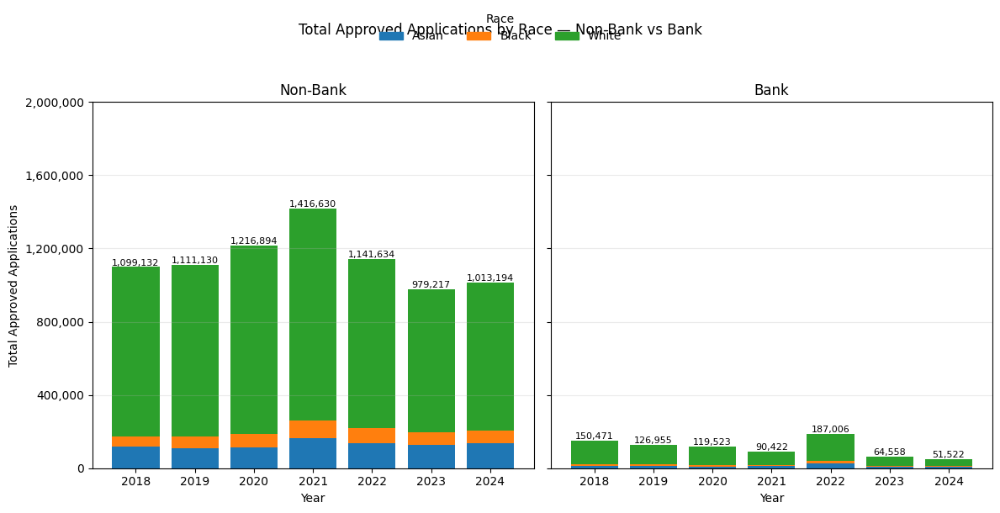

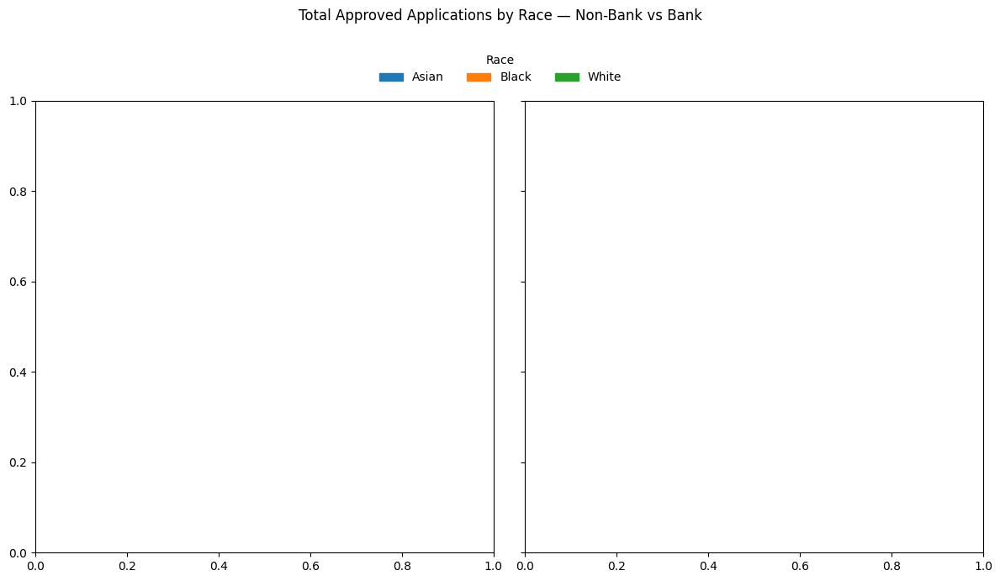

In [7]:
#!/usr/bin/env python3
"""
Faceted chart (Non-Bank vs Bank) of TOTAL APPROVED APPLICATIONS by race over time.
- One figure with two facets (Non-Bank | Bank)
- Shared years, shared y-axis, consistent race colors
- Saves PNG + SVG

Expected columns:
  - year
  - lender_type  (values like "Bank", "Non-Bank" — script normalizes variants)
  - race_label
  - approved_count  (optional; if missing, computed from approval_rate × applications_total)
  - approval_rate   (0–1 or 0–100; used only if approved_count missing)
  - applications_total (or n_applications/applications/count/n; used only if approved_count missing)
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
from pathlib import Path
from math import floor, log10

# ========= CONFIG =========
CSV_PATH = "avg_interest_vs_approval_by_lei_race_year.csv"
OUT_DIR = Path(".")
OUT_PNG = OUT_DIR / "faceted_total_approved_by_race.png"
OUT_SVG = OUT_DIR / "faceted_total_approved_by_race.svg"

# Facet order (left-to-right)
FACETS = ["Non-Bank", "Bank"]

# Optional fixed race order (otherwise inferred)
RACE_ORDER = None  # e.g., ["White", "Black", "Hispanic/Latino", "Asian", "Other/Unknown"]

# Toggle total annotations on bars
ANNOTATE_TOTALS = True

# ========= LOAD =========
df = pd.read_csv(CSV_PATH)

# Basic checks
required = {"year", "lender_type", "race_label"}
missing = required - set(df.columns)
if missing:
    raise ValueError(f"CSV missing required columns: {missing}")

# Clean year to integer
df["year"] = df["year"].astype(str).str.extract(r"(\d{4})")[0].astype(float)
df = df.dropna(subset=["year"]).copy()
df["year"] = df["year"].astype(int)

# Normalize lender type variants
LENDER_MAP = {
    "bank": "Bank", "banks": "Bank",
    "non-bank": "Non-Bank", "nonbank": "Non-Bank", "non bank": "Non-Bank"
}
def norm_lender(val: str) -> str:
    s = str(val).strip().lower()
    if s in LENDER_MAP: return LENDER_MAP[s]
    if "non" in s and "bank" in s: return "Non-Bank"
    if "bank" in s: return "Bank"
    return val if val in ("Bank", "Non-Bank") else s.title()

df["lender_type"] = df["lender_type"].apply(norm_lender)

# ========= APPROVED COUNT DERIVATION =========
approved_cols = [c for c in df.columns if c.lower() in {"approved_count", "n_approved", "num_approved"}]
if approved_cols:
    df["approved_count"] = pd.to_numeric(df[approved_cols[0]], errors="coerce")
else:
    rate_col = (
        "approval_rate" if "approval_rate" in df.columns
        else "avg_approval_rate" if "avg_approval_rate" in df.columns
        else None
    )
    total_candidates = [c for c in df.columns if c.lower() in {"applications_total", "n_applications", "applications", "count", "n"}]
    if not rate_col or not total_candidates:
        raise ValueError("Need 'approved_count' OR (approval_rate/avg_approval_rate AND total applications column).")
    total_col = total_candidates[0]
    rate = pd.to_numeric(df[rate_col], errors="coerce")
    total = pd.to_numeric(df[total_col], errors="coerce")
    rate = np.where(rate > 1.0, rate / 100.0, rate)  # normalize to 0–1
    df["approved_count"] = (rate * total).round()

df["approved_count"] = pd.to_numeric(df["approved_count"], errors="coerce").fillna(0).clip(lower=0)

# ========= AGGREGATE =========
agg = (
    df.groupby(["lender_type", "year", "race_label"], dropna=False)["approved_count"]
      .sum()
      .reset_index()
)

# Shared year axis
all_years = sorted(agg["year"].unique().tolist())`

# Race order
if RACE_ORDER is not None:
    race_order = RACE_ORDER
else:
    race_order = sorted(agg["race_label"].dropna().unique().tolist())

# Build pivot for each facet
def build_pivot(ltype: str) -> pd.DataFrame:
    sub = agg[agg["lender_type"] == ltype].copy()
    frame = (
        sub.pivot_table(index="year", columns="race_label", values="approved_count", aggfunc="sum", fill_value=0)
           .reindex(index=all_years, fill_value=0)
    )
    for r in race_order:
        if r not in frame.columns:
            frame[r] = 0
    frame = frame.reindex(columns=race_order)
    return frame

facet_pivots = {ft: build_pivot(ft) for ft in FACETS}

# ========= SHARED COLORS & AXIS =========
palette = plt.cm.tab20.colors if len(race_order) > 10 else plt.cm.tab10.colors
race_colors = {r: palette[i % len(palette)] for i, r in enumerate(race_order)}

def nice_ceil(x):
    if x <= 0: return 1
    exp = floor(log10(x))
    frac = x / (10 ** exp)
    nice_frac = 1 if frac <= 1 else 2 if frac <= 2 else 5 if frac <= 5 else 10
    return int(nice_frac * (10 ** exp))

global_max = max(p.sum(axis=1).max() for p in facet_pivots.values())
ymax = nice_ceil(global_max)
yticks = np.linspace(0, ymax, 6)

# ========= PLOT =========
fig, axes = plt.subplots(1, len(FACETS), figsize=(12, 6), sharey=True)
if len(FACETS) == 1:
    axes = [axes]

def plot_panel(ax, pivot_df: pd.DataFrame, title: str):
    years = [str(y) for y in pivot_df.index.tolist()]
    bottoms = np.zeros(len(pivot_df), dtype=float)
    for col in pivot_df.columns:
        ax.bar(years, pivot_df[col].values, bottom=bottoms,
               label=str(col), color=race_colors.get(col))
        bottoms += pivot_df[col].values

    ax.set_title(title)
    ax.set_xlabel("Year")
    ax.set_ylim(0, ymax)
    ax.set_yticks(yticks)
    ax.grid(True, axis="y", alpha=0.25)
    ax.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, p: f"{int(x):,}"))

    if ANNOTATE_TOTALS:
        totals = pivot_df.sum(axis=1).values
        for i, tot in enumerate(totals):
            ax.text(i, tot, f"{int(tot):,}", ha="center", va="bottom", fontsize=8)

# Left panel gets y-label
axes[0].set_ylabel("Total Approved Applications")

for ax, facet in zip(axes, FACETS):
    plot_panel(ax, facet_pivots[facet], facet)

# One shared legend outside
handles = [plt.Rectangle((0,0),1,1,color=race_colors[r]) for r in race_order]
fig.legend(handles, race_order, loc="upper center", ncol=min(5, len(race_order)),
           frameon=False, title="Race", bbox_to_anchor=(0.5, 1.02))

plt.suptitle("Total Approved Applications by Race — Non-Bank vs Bank", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])

OUT_DIR.mkdir(parents=True, exist_ok=True)
fig.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
fig.savefig(OUT_SVG, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")

plt.show()


Saved -> bank_nonbank_approval_share_by_year.csv
Saved -> bank_nonbank_approval_share_by_year_line.png
Saved -> bank_nonbank_approval_share_by_year_100pct_stacked.png


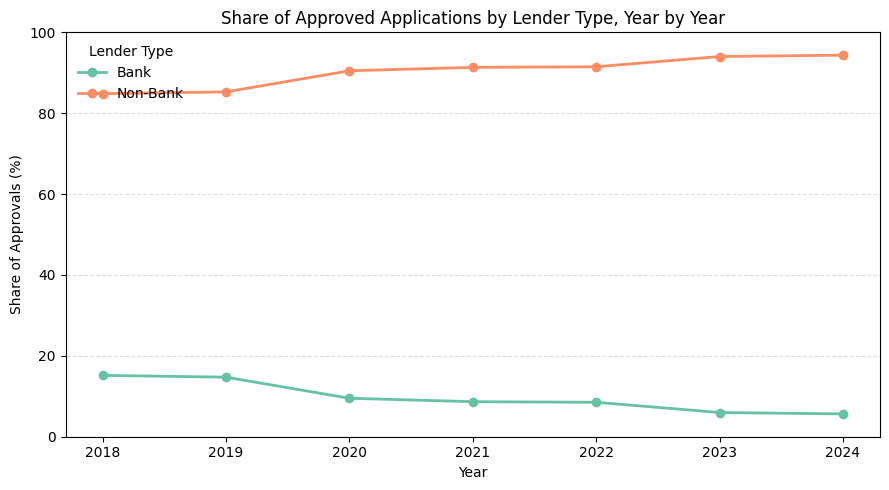

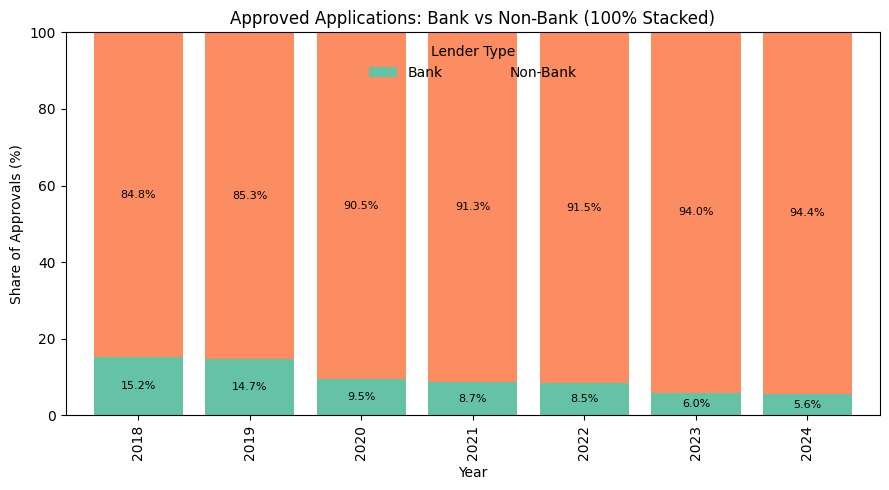

In [11]:
# bank_nonbank_approval_share_by_year.py
import re
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------- CONFIG ----------
DATA_DIR = Path("filtered_data_strict")  # folder with 2018_filtered_hmda.csv, 2019_filtered_hmda.csv, etc.
PATTERN  = re.compile(r"(\d{4})_filtered_hmda\.csv$")
OUT_CSV  = "bank_nonbank_approval_share_by_year.csv"
OUT_PNG_LINE  = "bank_nonbank_approval_share_by_year_line.png"
OUT_PNG_STACK = "bank_nonbank_approval_share_by_year_100pct_stacked.png"
LENDER_ORDER  = ["Bank", "Non-Bank"]

# Fixed colors (match your style)
COLORS = {
    "Bank": "#66c2a5",      # blue
    "Non-Bank": "#fc8d62",  # orange
}

# Approved = action_taken in {1,2}
APPROVED_CODES = {1, 2}

# ---------- LOAD & STACK ----------
frames = []
for f in DATA_DIR.glob("*_filtered_hmda.csv"):
    m = PATTERN.match(f.name)
    if not m:
        continue
    year = int(m.group(1))
    df = pd.read_csv(f, low_memory=False)

    # Ensure required columns
    missing = [c for c in ["purchaser_type", "action_taken"] if c not in df.columns]
    if missing:
        print(f"Warning: {f.name} missing columns {missing}; skipping.")
        continue

    # Classify lender_type from purchaser_type: Bank if == 6; else Non-Bank
    lender_type = (
        df["purchaser_type"]
        .fillna(-1)
        .astype("Int64")
        .apply(lambda x: "Bank" if x == 6 else "Non-Bank")
    )

    # Keep only approved applications
    approved_mask = df["action_taken"].isin(APPROVED_CODES)
    sub = pd.DataFrame(
        {
            "year": year,
            "lender_type": lender_type[approved_mask],
        }
    )
    frames.append(sub)

if not frames:
    raise SystemExit("No *_filtered_hmda.csv files found (or files missing required columns). Check DATA_DIR and filenames.")

stack = pd.concat(frames, ignore_index=True)

# ---------- COUNT APPROVALS & CALC % ----------
counts = (
    stack
    .groupby(["year", "lender_type"])
    .size()
    .rename("approvals")
    .reset_index()
)

# Ensure both lender types present each year (fill zeros if not)
years = sorted(counts["year"].unique())
for y in years:
    for lt in LENDER_ORDER:
        if not ((counts["year"] == y) & (counts["lender_type"] == lt)).any():
            counts = pd.concat(
                [counts, pd.DataFrame({"year": [y], "lender_type": [lt], "approvals": [0]})],
                ignore_index=True
            )

counts = counts.sort_values(["year", "lender_type"]).reset_index(drop=True)

# Calculate yearly totals and shares
counts["year_total_approvals"] = counts.groupby("year")["approvals"].transform("sum")
counts["share_pct"] = np.where(
    counts["year_total_approvals"] > 0,
    counts["approvals"] / counts["year_total_approvals"] * 100.0,
    0.0
)

# Save tidy output
counts.to_csv(OUT_CSV, index=False)
print(f"Saved -> {OUT_CSV}")

# ---------- PLOT OPTION 1: Lines over time (shares) ----------
fig, ax = plt.subplots(figsize=(9, 5))
for lt in LENDER_ORDER:
    sub = counts[counts["lender_type"] == lt].sort_values("year")
    ax.plot(sub["year"], sub["share_pct"], marker="o", linewidth=2, label=lt, color=COLORS[lt])

ax.set_title("Share of Approved Applications by Lender Type, Year by Year")
ax.set_xlabel("Year")
ax.set_ylabel("Share of Approvals (%)")
ax.set_ylim(0, 100)
ax.set_xticks(sorted(counts["year"].unique()))
ax.legend(title="Lender Type", frameon=False, loc="upper left")
ax.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.savefig(OUT_PNG_LINE, dpi=300, bbox_inches="tight")
print(f"Saved -> {OUT_PNG_LINE}")

# ---------- PLOT OPTION 2: 100% stacked bars ----------
pivot = (
    counts.pivot(index="year", columns="lender_type", values="share_pct")
    .reindex(columns=LENDER_ORDER)
    .fillna(0)
)

ax2 = pivot.plot(
    kind="bar",
    stacked=True,
    figsize=(9, 5),
    width=0.8,
    color=[COLORS[lt] for lt in LENDER_ORDER]
)
ax2.set_title("Approved Applications: Bank vs Non-Bank (100% Stacked)")
ax2.set_xlabel("Year")
ax2.set_ylabel("Share of Approvals (%)")
ax2.set_ylim(0, 100)
ax2.legend(title="Lender Type", frameon=False, loc="upper center", ncol=2)

# Optional: add % labels inside bars
for p in ax2.patches:
    height = p.get_height()
    if height > 0:
        ax2.annotate(f"{height:.1f}%",
                     (p.get_x() + p.get_width()/2, p.get_y() + height/2),
                     ha="center", va="center", fontsize=8, color="black")

plt.tight_layout()
plt.savefig(OUT_PNG_STACK, dpi=300, bbox_inches="tight")
print(f"Saved -> {OUT_PNG_STACK}")

plt.show()


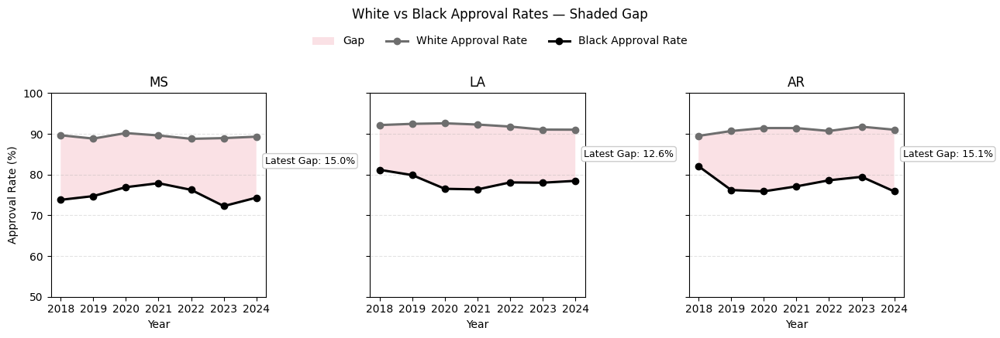

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# ==== INPUT ====
# Use the pivot from the previous step:
# columns: ["state_abbr","year","White","Black","gap_pp"]
src = pivot.copy()

TARGET_STATES = ["MS", "LA", "AR"]

# ==== STYLE ====
COLOR_WHITE = "#6e6e6e"   # gray line for White
COLOR_BLACK = "#000000"   # black line for Black
COLOR_GAP   = "#f7c5cc"   # soft pink fill
MARKER      = "o"

# Optional axis limits (comment out to auto-fit)
Y_MIN, Y_MAX = 50, 100

fig, axes = plt.subplots(1, len(TARGET_STATES), figsize=(13, 4), sharey=True)
if len(TARGET_STATES) == 1:
    axes = [axes]

for ax, st in zip(axes, TARGET_STATES):
    sub = src[src["state_abbr"] == st].sort_values("year")
    if sub.empty:
        ax.text(0.5, 0.5, "No data", ha="center", va="center", transform=ax.transAxes)
        ax.set_title(st); ax.set_xlabel("Year"); continue

    x   = sub["year"].to_numpy()
    yw  = sub["White"].to_numpy(dtype=float)
    yb  = sub["Black"].to_numpy(dtype=float)

    # Only shade where both lines have data
    mask = np.isfinite(yw) & np.isfinite(yb)

    # Shade the gap (White above Black)
    ax.fill_between(x[mask], yb[mask], yw[mask], facecolor=COLOR_GAP, alpha=0.5, label="Gap")

    # Plot lines
    ax.plot(x, yw, marker=MARKER, linewidth=2.2, color=COLOR_WHITE, label="White Approval Rate")
    ax.plot(x, yb, marker=MARKER, linewidth=2.2, color=COLOR_BLACK, label="Black Approval Rate")

    # Latest gap callout
    if mask.any():
        last_idx = np.where(mask)[0][-1]
        latest_gap = (yw[last_idx] - yb[last_idx])
        ax.annotate(f"Latest Gap: {latest_gap:.1f}%",
                    (x[last_idx], yw[last_idx]),
                    xytext=(8, -18), textcoords="offset points",
                    ha="left", va="top",
                    bbox=dict(boxstyle="round,pad=0.25", fc="white", ec="#cccccc"),
                    fontsize=9)

    # Axes/labels
    ax.set_title(st)
    ax.set_xlabel("Year")
    ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.set_xticks(x)
    if 'Y_MIN' in locals() and 'Y_MAX' in locals():
        ax.set_ylim(Y_MIN, Y_MAX)

# Shared y-label and legend
axes[0].set_ylabel("Approval Rate (%)")

legend_handles = [
    Patch(facecolor=COLOR_GAP, alpha=0.5, label="Gap"),
    Line2D([0],[0], color=COLOR_WHITE, marker=MARKER, lw=2.2, label="White Approval Rate"),
    Line2D([0],[0], color=COLOR_BLACK, marker=MARKER, lw=2.2, label="Black Approval Rate"),
]
fig.legend(handles=legend_handles, loc="upper center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 1.02))

plt.suptitle("White vs Black Approval Rates — Shaded Gap", y=1.08)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()


Saved: diverging_share_change_lollipop.png
Saved: diverging_share_change_lollipop.svg


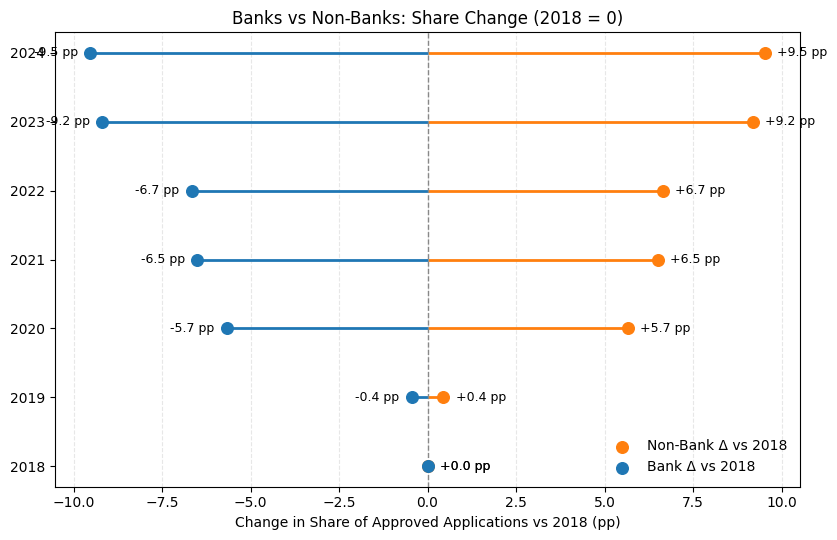

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ===== CONFIG =====
CSV_PATH = "bank_nonbank_approval_share_by_year.csv"  # cols: year, lender_type, share_pct (0–100)
BASELINE_YEAR = 2018
COLOR_NB = "#ff7f0e"  # non-bank gain (orange)
COLOR_BK = "#1f77b4"  # bank loss (blue)
OUT_PNG = "diverging_share_change_lollipop.png"
OUT_SVG = "diverging_share_change_lollipop.svg"

# ===== LOAD & PREP =====
df = pd.read_csv(CSV_PATH)
df = df[df["lender_type"].isin(["Bank", "Non-Bank"])].copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype(int)

wide = (
    df.pivot_table(index="year", columns="lender_type", values="share_pct", aggfunc="mean")
      .sort_index()
)
if BASELINE_YEAR not in wide.index:
    raise ValueError(f"Baseline year {BASELINE_YEAR} not in data")

# Deltas vs baseline (pp)
delta_nb = wide["Non-Bank"] - wide.loc[BASELINE_YEAR, "Non-Bank"]
delta_bk = wide["Bank"]     - wide.loc[BASELINE_YEAR, "Bank"]

years = delta_nb.index.tolist()
vals_nb = delta_nb.values
vals_bk = delta_bk.values
ypos = np.arange(len(years))

# ===== PLOT =====
fig, ax = plt.subplots(figsize=(8.5, 5.5))

# Stems
for y, nb, bk in zip(ypos, vals_nb, vals_bk):
    if not np.isnan(nb):
        ax.hlines(y, 0, nb, color=COLOR_NB, lw=2)
    if not np.isnan(bk):
        ax.hlines(y, 0, bk, color=COLOR_BK, lw=2)

# Lollipop dots
ax.scatter(vals_nb, ypos, s=70, color=COLOR_NB, zorder=3, label="Non-Bank Δ vs 2018")
ax.scatter(vals_bk, ypos, s=70, color=COLOR_BK, zorder=3, label="Bank Δ vs 2018")

# Zero line
ax.axvline(0, color="#888", lw=1, ls="--")

# Labels & ticks
ax.set_yticks(ypos)
ax.set_yticklabels(years)
ax.set_xlabel("Change in Share of Approved Applications vs 2018 (pp)")
ax.set_title("Banks vs Non-Banks: Share Change (2018 = 0)")

# Symmetric x-lims
xmax = np.nanmax(np.abs(np.concatenate([vals_nb, vals_bk])))
pad = max(1, 0.06 * xmax)
ax.set_xlim(-xmax - pad, xmax + pad)

# Annotations
for y, v in zip(ypos, vals_nb):
    if np.isnan(v): continue
    ax.text(v + (0.35 if v >= 0 else -0.35), y, f"{v:+.1f} pp",
            va="center", ha="left" if v >= 0 else "right", fontsize=9)
for y, v in zip(ypos, vals_bk):
    if np.isnan(v): continue
    ax.text(v - (0.35 if v < 0 else -0.35), y, f"{v:+.1f} pp",
            va="center", ha="right" if v < 0 else "left", fontsize=9)

# Legend & grid
ax.legend(frameon=False, loc="lower right")
ax.grid(axis="x", linestyle="--", alpha=0.3)

plt.tight_layout()
Path(".").mkdir(exist_ok=True, parents=True)
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.savefig(OUT_SVG, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")
plt.show()


Saved: nonbank_absolute_and_bank_change_from_2018.png
Saved: nonbank_absolute_and_bank_change_from_2018.svg


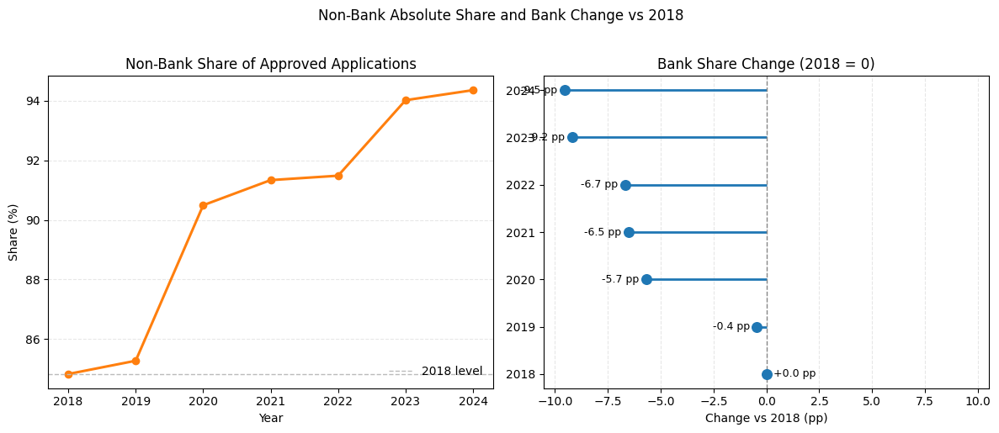

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ===== CONFIG =====
CSV_PATH = "bank_nonbank_approval_share_by_year.csv"  # cols: year, lender_type, share_pct (0–100 or 0–1)
BASELINE_YEAR = 2018
COLOR_NB = "#ff7f0e"  # Non-Bank
COLOR_BK = "#1f77b4"  # Bank
OUT_PNG = "nonbank_absolute_and_bank_change_from_2018.png"
OUT_SVG = "nonbank_absolute_and_bank_change_from_2018.svg"

# ===== LOAD & PREP =====
df = pd.read_csv(CSV_PATH)
df = df[df["lender_type"].isin(["Bank", "Non-Bank"])].copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype(int)

# normalize share to percent if data are 0–1
if df["share_pct"].dropna().max() <= 1.000001:
    df["share_pct"] *= 100.0

wide = (
    df.pivot_table(index="year", columns="lender_type", values="share_pct", aggfunc="mean")
      .sort_index()
)

if BASELINE_YEAR not in wide.index:
    raise ValueError(f"Baseline year {BASELINE_YEAR} not in data")

# Non-Bank absolute series
nb_series = wide["Non-Bank"].copy()
nb_baseline = nb_series.loc[BASELINE_YEAR]

# Bank change vs baseline (pp) — (you could also plot Non-Bank change; they’re mirrors)
bk_delta = wide["Bank"] - wide.loc[BASELINE_YEAR, "Bank"]

years = wide.index.to_list()
ypos  = np.arange(len(years))  # for lollipop panel

# ===== PLOT =====
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
ax1, ax2 = axes

# --- Panel 1: Non-Bank absolute share over time ---
ax1.plot(years, nb_series.values, marker="o", lw=2.2, color=COLOR_NB)
ax1.axhline(nb_baseline, color="#bbbbbb", lw=1, ls="--", label=f"{BASELINE_YEAR} level")
ax1.set_title("Non-Bank Share of Approved Applications")
ax1.set_xlabel("Year"); ax1.set_ylabel("Share (%)")
ax1.set_xticks(years)
ax1.grid(axis="y", linestyle="--", alpha=0.3)
ax1.legend(frameon=False, loc="lower right")

# --- Panel 2: Bank change vs 2018 (diverging lollipop) ---
vals_bk = bk_delta.values
for y, v in zip(ypos, vals_bk):
    ax2.hlines(y, 0, v, color=COLOR_BK, lw=2)
ax2.scatter(vals_bk, ypos, s=70, color=COLOR_BK, zorder=3, label="Bank Δ vs 2018")

ax2.axvline(0, color="#888", lw=1, ls="--")
ax2.set_yticks(ypos); ax2.set_yticklabels(years)
ax2.set_xlabel("Change vs 2018 (pp)")
ax2.set_title("Bank Share Change (2018 = 0)")
# symmetric x-lims
xmax = np.nanmax(np.abs(vals_bk)); pad = max(1, 0.06 * xmax)
ax2.set_xlim(-xmax - pad, xmax + pad)
ax2.grid(axis="x", linestyle="--", alpha=0.3)

# annotate values
for y, v in zip(ypos, vals_bk):
    ax2.text(v + (0.35 if v >= 0 else -0.35), y, f"{v:+.1f} pp",
             va="center", ha="left" if v >= 0 else "right", fontsize=9)

plt.suptitle("Non-Bank Absolute Share and Bank Change vs 2018", y=1.02)
plt.tight_layout()
Path(".").mkdir(parents=True, exist_ok=True)
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.savefig(OUT_SVG, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")
plt.show()


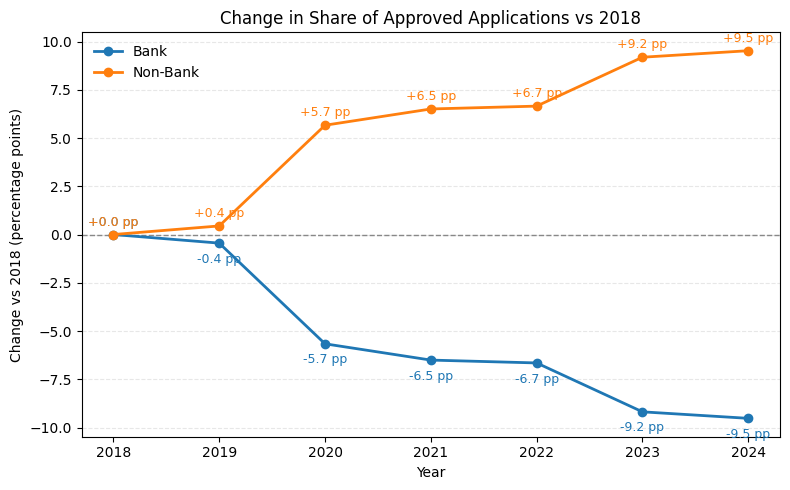

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ===== CONFIG =====
CSV_PATH = "bank_nonbank_approval_share_by_year.csv"  # year, lender_type, share_pct
BASELINE_YEAR = 2018
COLOR_BK = "#1f77b4"   # Bank
COLOR_NB = "#ff7f0e"   # Non-Bank
OUT_PNG = "bank_vs_nonbank_change_vs_2018.png"
OUT_SVG = "bank_vs_nonbank_change_vs_2018.svg"

# ===== LOAD & PREP =====
df = pd.read_csv(CSV_PATH)
df = df[df["lender_type"].isin(["Bank", "Non-Bank"])].copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype(int)

# normalize to percent if needed
if df["share_pct"].max() <= 1.000001:
    df["share_pct"] *= 100

wide = (
    df.pivot_table(index="year", columns="lender_type", values="share_pct", aggfunc="mean")
      .sort_index()
)

if BASELINE_YEAR not in wide.index:
    raise ValueError(f"Baseline year {BASELINE_YEAR} not in data")

# Calculate change vs 2018
delta_bk = wide["Bank"] - wide.loc[BASELINE_YEAR, "Bank"]
delta_nb = wide["Non-Bank"] - wide.loc[BASELINE_YEAR, "Non-Bank"]

# ===== PLOT =====
fig, ax = plt.subplots(figsize=(8, 5))

ax.axhline(0, color="#888", lw=1, ls="--")

# Bank line
ax.plot(wide.index, delta_bk, marker="o", color=COLOR_BK, lw=2, label="Bank")
for x, y in zip(wide.index, delta_bk):
    ax.text(x, y + (0.3 if y >= 0 else -0.5), f"{y:+.1f} pp",
            ha="center", va="bottom" if y >= 0 else "top", fontsize=9, color=COLOR_BK)

# Non-Bank line
ax.plot(wide.index, delta_nb, marker="o", color=COLOR_NB, lw=2, label="Non-Bank")
for x, y in zip(wide.index, delta_nb):
    ax.text(x, y + (0.3 if y >= 0 else -0.5), f"{y:+.1f} pp",
            ha="center", va="bottom" if y >= 0 else "top", fontsize=9, color=COLOR_NB)

ax.set_title("Change in Share of Approved Applications vs 2018")
ax.set_xlabel("Year")
ax.set_ylabel("Change vs 2018 (percentage points)")
ax.grid(axis="y", linestyle="--", alpha=0.3)
ax.legend(frameon=False)

plt.tight_layout()
plt.savefig(OUT_PNG, dpi=300)
plt.savefig(OUT_SVG)
plt.show()


Saved: bank_share_over_time.png
Saved: bank_share_over_time.svg


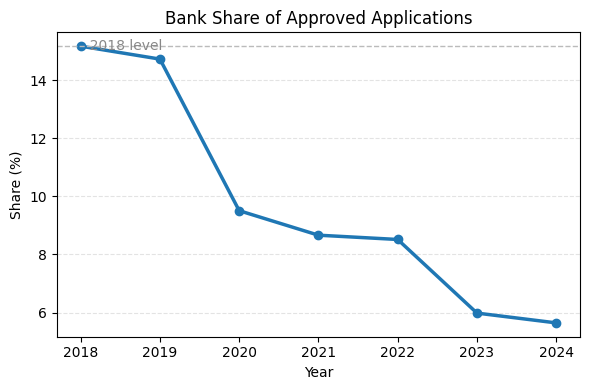

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ===== CONFIG =====
CSV_PATH = "bank_nonbank_approval_share_by_year.csv"  # columns: year, lender_type, share_pct
COLOR_BK = "#1f77b4"   # Bank blue
BASELINE_YEAR = 2018
OUT_PNG = "bank_share_over_time.png"
OUT_SVG = "bank_share_over_time.svg"

# ===== LOAD & PREP =====
df = pd.read_csv(CSV_PATH)
df = df[df["lender_type"].isin(["Bank","Non-Bank"])].copy()
df["year"] = pd.to_numeric(df["year"], errors="coerce").astype(int)

# If share is 0–1, convert to %
if df["share_pct"].dropna().max() <= 1.000001:
    df["share_pct"] *= 100.0

wide = (
    df.pivot_table(index="year", columns="lender_type", values="share_pct", aggfunc="mean")
      .sort_index()
)

if "Bank" not in wide.columns:
    raise ValueError("No 'Bank' rows found in the CSV.")
if BASELINE_YEAR not in wide.index:
    raise ValueError(f"Baseline year {BASELINE_YEAR} not present in data.")

bank_series = wide["Bank"]
baseline_val = bank_series.loc[BASELINE_YEAR]
years = bank_series.index.tolist()

# ===== PLOT =====
fig, ax = plt.subplots(figsize=(6, 4))

ax.plot(years, bank_series.values, color=COLOR_BK, lw=2.5, marker="o")
ax.axhline(baseline_val, color="#bbbbbb", lw=1, ls="--")
ax.text(years[0], baseline_val, "  2018 level", va="center", ha="left", color="#888888")

ax.set_title("Bank Share of Approved Applications")
ax.set_xlabel("Year")
ax.set_ylabel("Share (%)")
ax.set_xticks(years)
ax.grid(axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()
Path(".").mkdir(parents=True, exist_ok=True)
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.savefig(OUT_SVG, dpi=300, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")
plt.show()



/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_84237/1326276917.py:64: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: weighted_mean(g, rate_col, weight_col))


Saved: avg_interest_rate_banks_vs_nonbanks_by_year.png
Saved: avg_interest_rate_banks_vs_nonbanks_by_year.svg


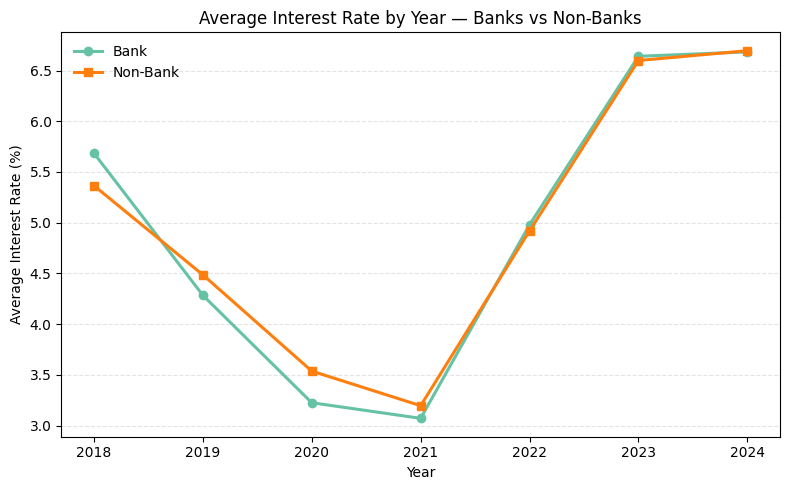

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ========= CONFIG =========
CSV_PATH = "bank_nonbank_interest_rate_by_race_year.csv"
COLOR_BK = "#66c2a5"   # Bank — teal
COLOR_NB = "#ff7f0e"   # Non-Bank — orange
MARKERS   = {"Bank":"o","Non-Bank":"s"}

PLOT_BY_RACE = False   # set True to get one panel per race

OUT_PNG = "avg_interest_rate_banks_vs_nonbanks_by_year.png"
OUT_SVG = "avg_interest_rate_banks_vs_nonbanks_by_year.svg"

# ========= LOAD =========
df = pd.read_csv(CSV_PATH, low_memory=False)

# ---- pick columns flexibly ----
def pick(cands):
    for c in cands:
        if c in df.columns: return c
    return None

year_col   = pick(["year","activity_year"])
rate_col   = pick(["avg_interest_rate","interest_rate","mean_interest_rate","rate","rate_percent"])
ltype_col  = pick(["lender_type","lender","lenderClass","lender_category"])
race_col   = pick(["race_label","race","derived_race"])
weight_col = pick(["n_loans","count","applications_total","n","obs","records"])

if year_col is None or rate_col is None or ltype_col is None:
    raise ValueError(f"Need year/lender/rate columns. Found: {df.columns.tolist()}")

# clean types
df["year"] = pd.to_numeric(df[year_col], errors="coerce").astype("Int64")
df[rate_col] = pd.to_numeric(df[rate_col], errors="coerce")

# normalize lender type
def norm_lt(s):
    s = str(s).strip().lower()
    if "non" in s and "bank" in s: return "Non-Bank"
    if "bank" in s: return "Bank"
    return None
df["lender_type"] = df[ltype_col].apply(norm_lt)

# drop junk
df = df.dropna(subset=["year","lender_type", rate_col]).copy()

# bound interest rate to plausible range (optional)
df = df[(df[rate_col] > 0) & (df[rate_col] < 40)].copy()

# ========= AGGREGATE =========
def weighted_mean(g, val, w):
    if w is None:  # simple mean
        return g[val].mean()
    wv = pd.to_numeric(g[w], errors="coerce").fillna(0)
    if wv.sum() == 0: return g[val].mean()
    return np.average(g[val], weights=wv)

group_keys = ["year","lender_type"] + ([race_col] if (PLOT_BY_RACE and race_col) else [])

agg = (
    df.groupby(group_keys, dropna=False)
      .apply(lambda g: weighted_mean(g, rate_col, weight_col))
      .rename("avg_interest_rate")
      .reset_index()
)

# ========= PLOT =========
if PLOT_BY_RACE and race_col:
    races = [r for r in agg[race_col].dropna().unique().tolist()]
    n = max(1, len(races))
    fig, axes = plt.subplots(1, n, figsize=(6*n, 4), sharey=True)
    if n == 1: axes = [axes]

    for ax, r in zip(axes, races):
        sub = agg[agg[race_col] == r].pivot(index="year", columns="lender_type", values="avg_interest_rate")
        sub = sub.reindex(columns=["Bank","Non-Bank"]).sort_index()

        years = sub.index.values
        if "Bank" in sub:
            ax.plot(years, sub["Bank"], marker=MARKERS["Bank"], lw=2.2, color=COLOR_BK, label="Bank")
        if "Non-Bank" in sub:
            ax.plot(years, sub["Non-Bank"], marker=MARKERS["Non-Bank"], lw=2.2, color=COLOR_NB, label="Non-Bank")

        ax.set_title(str(r))
        ax.set_xlabel("Year"); ax.grid(axis="y", linestyle="--", alpha=0.35)
        ax.set_xticks(years)

    axes[0].set_ylabel("Average Interest Rate (%)")
    fig.legend(loc="upper center", ncol=2, frameon=False, bbox_to_anchor=(0.5, 1.02))
    plt.suptitle("Average Interest Rate by Year — Banks vs Non-Banks", y=1.04)
    plt.tight_layout(rect=[0,0,1,0.96])
else:
    # overall (collapse races)
    wide = agg.pivot_table(index="year", columns="lender_type", values="avg_interest_rate", aggfunc="mean")
    wide = wide.reindex(columns=["Bank","Non-Bank"]).sort_index()

    fig, ax = plt.subplots(figsize=(8, 5))
    years = wide.index.values
    if "Bank" in wide:
        ax.plot(years, wide["Bank"], marker=MARKERS["Bank"], lw=2.2, color=COLOR_BK, label="Bank")
    if "Non-Bank" in wide:
        ax.plot(years, wide["Non-Bank"], marker=MARKERS["Non-Bank"], lw=2.2, color=COLOR_NB, label="Non-Bank")

    ax.set_title("Average Interest Rate by Year — Banks vs Non-Banks")
    ax.set_xlabel("Year"); ax.set_ylabel("Average Interest Rate (%)")
    ax.set_xticks(years); ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.legend(frameon=False, loc="best")
    plt.tight_layout()

# ========= SAVE =========
plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.savefig(OUT_SVG, dpi=300, bbox_inches="tight")
print(f"Saved: {OUT_PNG}\nSaved: {OUT_SVG}")
plt.show()


In [32]:
print(df.columns.tolist())


['year', 'lender_type', 'approvals', 'year_total_approvals', 'share_pct']


In [1]:
import os
import pandas as pd

folder_path = "filtered_data_strict"  # adjust if needed
row_count = 0

for file in os.listdir(folder_path):
    if file.endswith(".csv"):
        df = pd.read_csv(os.path.join(folder_path, file))
        # Keep only rows where purchaser_type is numeric
        numeric_rows = df[pd.to_numeric(df['purchaser_type'], errors='coerce').notna()]
        row_count += len(numeric_rows)

print(f"Total rows with numeric purchaser_type: {row_count}")


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/3864510494.py:9: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/3864510494.py:9: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/3864510494.py:9: DtypeWarning: Columns (46,55,56,57,58,59,60,61,63,64,65,70,74) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/3864510494.py:9: DtypeWarning: Columns (3,5,22,23,24,26,27,28,29,30,31,32,33,38,44,46,77,78,79,80) have mixed types. Speci

Total rows with numeric purchaser_type: 124453741


In [2]:
import os
import pandas as pd

folder_path = "filtered_data_strict"  # adjust if needed

total_rows = 0
numeric_rows = 0

for file in os.listdir(folder_path):
    if file.endswith(".csv"):
        df = pd.read_csv(os.path.join(folder_path, file))
        total_rows += len(df)
        numeric_rows += df[pd.to_numeric(df['purchaser_type'], errors='coerce').notna()].shape[0]

print(f"Total rows: {total_rows}")
print(f"Rows with numeric purchaser_type: {numeric_rows}")


/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/2227388653.py:11: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/2227388653.py:11: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/2227388653.py:11: DtypeWarning: Columns (46,55,56,57,58,59,60,61,63,64,65,70,74) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(folder_path, file))
/var/folders/s2/1r_lbpts7pvcd7p7h17w62tm0000gn/T/ipykernel_15932/2227388653.py:11: DtypeWarning: Columns (3,5,22,23,24,26,27,28,29,30,31,32,33,38,44,46,77,78,79,80) have mixed types. S

Total rows: 124453741
Rows with numeric purchaser_type: 124453741
